In [1]:
## threshold for cell counts per gene at 2 sites
readThreshold=5

In [2]:
#fig3_4_distalAPA_relation_RNA 20 reads

setwd( paste0("/data/jinwf/wangjl/apa/191111Figure/f3/distalAPA_RNA_",(readThreshold)) );
getwd()

keyword="_all_"

printP=function(...){
  print(paste(...))
}
printP0=function(...){
  print(paste0(...))
}

[1] "/data/jinwf/wangjl/apa/191111Figure/f3/distalAPA_RNA_5"

In [ ]:
head(cellInfo)

In [3]:
library(ggplot2)
library(Cairo)

# step1 load read apa data, rnaM

In [4]:
#########################
# step1 read apa data
apaSiteFile="/data/jinwf/wangjl/apa/190705PAS/bed/pasPostions_Location_transcriptName-noChrM_noInnerPrime_PY-filterCountCell-motif-Header.bed"
apaMatrixFile="/data/jinwf/wangjl/apa/190705PAS/bed/apa_Matrix_afterFilterByCounts_cell_20222.csv"
#
apaSite=read.table(apaSiteFile, header = T,row.names = 1, stringsAsFactors = F)
row.names(apaSite)=apaSite$PASid
dim(apaSite) #20222 12
apaSite[1:4,]
#                          PASid   chr     pos strand count region transcript                down20   gene
# chr10:320403:-   chr10:320403:- chr10  320403      - 10945   UTR3  DIP2C-201 TGAAAATAGCAGTTTCTTAAT  DIP2
#
apaM=read.csv(apaMatrixFile, header = T,row.names = 1, stringsAsFactors = F)
dim(apaM) #20222 225
head(apaM[, 1:5])
#                c01ROW07 c01ROW12 c01ROW24 c01ROW31 c01ROW35
#chr10:320403:-         0        0       30      159       10
#chr10:855485:-         0        0        0        0       82


# RNA expression level
rnaFile="/home/wangjl/data/apa/190530Mix/BC_HeLa.225cells.count.V3.csv"
rnaM=read.csv(rnaFile, row.names = 1, stringsAsFactors = F)
dim(rnaM) #18679 225
rnaM[1:5,1:5]

[1] 20222    12

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60,motif,distance
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr10:320403:-,chr10:320403:-,chr10,320403,-,10945,UTR3,DIP2C-201,TGAAAATAGCAGTTTCTTAAT,DIP2C,TCTGTGATAACGCCTGTTTTATATTCAAATGAACAAATAAAAGCTTTTATTTTTGTTGCTC,AATAAA,26
chr10:855485:-,chr10:855485:-,chr10,855485,-,3583,PA,LARP4B-201,TCAATTTTTCTTTTGATTTTT,LARP4B,GTGTAAAACTGTCTAATTTGAAAAAAAATGTAGGTTATGAAAATAAAGATTTAGGCACTGT,AATAAA,20
chr10:1085971:-,chr10:1085971:-,chr10,1085971,-,10905,UTR3,IDI1-201,AAAGTTAAATGTTTGTTAAAT,IDI1,ACAGATTTATTATTCTTAAATGCTGTATGATAATGAAGAAAAATAAAAATTTATTTCTTGC,AATAAA,20
chr10:1087286:-,chr10:1087286:-,chr10,1087286,-,947,exon,IDI1-205,AAAGGAAGAACTAAAAGAACT,IDI1,TGAGGAAGAATGTAACTTTGAATCCAGATCCCAATGAGATTAAAAGCTATTGTTATGTGTC,ATTAAA,23


[1] 20222   225

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35
,<int>,<int>,<int>,<int>,<int>
chr10:320403:-,0,0,30,159,10
chr10:855485:-,0,0,0,0,82
chr10:1085971:-,2,68,101,33,0
chr10:1087286:-,0,0,0,0,0
chr10:2153297:-,0,0,0,0,0
chr10:2276972:-,0,0,0,11,0


[1] 18679   225

,c01ROW24,c01ROW35,c01ROW31,c05ROW02,c05ROW14
,<int>,<int>,<int>,<int>,<int>
A1BG-AS1,0,0,0,0,0
A2M,0,0,0,0,0
A2M-AS1,0,0,0,0,0
A2ML1,0,0,0,0,0
A2MP1,0,0,0,0,0


## load cellInfo

In [5]:
# 
cellFile="/home/wangjl/data/apa/190530Mix/cellInfo.V4.txt"
cellInfo=read.csv(cellFile, row.names = 1, stringsAsFactors = F)
dim(cellInfo) #225 6
head(cellInfo)

[1] 225   6

,geneNumber,countsPerCell,countsPerGene,cellType,cellCycle,cellType2
,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
c01ROW24,5693,1950601,342.6315,HeLa_sync,G2M,HeLa_syncMix
c01ROW35,6768,3048970,450.4979,HeLa_sync,M,HeLa_syncMix
c01ROW31,6542,2783703,425.5125,HeLa_sync,S,HeLa_syncMix
c05ROW02,6012,1263249,210.1213,HeLa_sync,S,HeLa_syncMix
c05ROW14,5853,1313664,224.4428,HeLa_sync,S,HeLa_syncMix
c05ROW19,4372,493417,112.8584,HeLa_sync,S,HeLa_syncMix


# step2 get genes with 2 sites

In [6]:
#########################
# step2 get genes with 2 sites

# 输入一系列有重复的字符串列表，输出该字符串的频率倒序排列的数据框。
getFreqFromStrings=function(Strs, orderStr="desc"){
  #默认倒序，如果指定asc，则正序；
  orderN=-1;
  if(orderStr=='asc' || orderStr=="ASC"){ orderN=1; }
  # 取频率
  tb=table(Strs);
  # 数据框形式
  df=data.frame(
    id=names(tb),
    freq=as.numeric(tb)
  )
  # 按照频率排序
  df=df[order(orderN*df$freq),]
  row.names(df)=df$id;
  return(df)
}
#
head(apaSite$gene) #[1] "DIP2C"  "LARP4B" "IDI1"   "IDI1"
sitePerGene=getFreqFromStrings(apaSite$gene)
#
dim(sitePerGene) #9455 2
head(sitePerGene)
#             id freq
#.             . 1560
#MALAT1   MALAT1   46
#EGFR       EGFR   40
#NCL         NCL   32

gene.2sites=sitePerGene[which(sitePerGene$freq==2),]
dim(gene.2sites) #2082 2
head(gene.2sites)
#

[1] "DIP2C"  "LARP4B" "IDI1"   "IDI1"   "."      "."

[1] 9455    2

,id,freq
,<fct>,<dbl>
.,.,1560
MALAT1,MALAT1,46
EGFR,EGFR,40
NCL,NCL,32
ANKRD11,ANKRD11,21
DEK,DEK,21


[1] 2082    2

,id,freq
,<fct>,<dbl>
AARD,AARD,2
AARS,AARS,2
AASDHPPT,AASDHPPT,2
AATF,AATF,2
ABCB7,ABCB7,2
ABCC5,ABCC5,2


## expression levels of genes with N sites

In [2172]:
dim(sitePerGene)
head(sitePerGene)
tail(sitePerGene)

[1] 9455    2

,id,freq
,<fct>,<dbl>
.,.,1560
MALAT1,MALAT1,46
EGFR,EGFR,40
NCL,NCL,32
ANKRD11,ANKRD11,21
DEK,DEK,21


,id,freq
,<fct>,<dbl>
ZSWIM8,ZSWIM8,1
ZSWIM9,ZSWIM9,1
ZUP1,ZUP1,1
ZW10,ZW10,1
ZXDC,ZXDC,1
ZYX,ZYX,1


In [2177]:
getNormalizedCts <- function ( cts ) {
    #cts <- read.table ( ctsPath , header = T , as.is = T )
    apply ( cts , 2 , function ( x ) { log2 ( ( 10^6 ) * x / sum ( x ) + 1 ) })
}
rnaM.cpm=apply(rnaM, 2, function(x){
    1e6*x/sum(x)
})
# rnaM.log2cpm= apply(rnaM.cpm, 2, function(x){
#     log2(x+1)
# }) #

#
rnaM.log2cpm=getNormalizedCts(rnaM)
#
dim(rnaM.log2cpm) #18679 225
rnaM.log2cpm[1:5,1:8]

[1] 18679   225

,c01ROW24,c01ROW35,c01ROW31,c05ROW02,c05ROW14,c05ROW19,c05ROW31,c05ROW33
A1BG-AS1,0,0,0,0,0,0.000000,0,0
A2M,0,0,0,0,0,0.000000,0,0
A2M-AS1,0,0,0,0,0,0.000000,0,0
A2ML1,0,0,0,0,0,0.000000,0,0
A2MP1,0,0,0,0,0,8.318268,0,0


In [2214]:
getDF_fromNamesXX=function(namedXX){
  rs=data.frame(
    name=names(namedXX),
    value=as.numeric(namedXX)
  )
  row.names(rs)=rs$name
  rs=rs[order(-rs$value),]
  print(dim(rs))
  print(head(rs))
  return(rs)
}


## 
getDF_expression_siteNumber=function(){
    ## expression of each genes (cpm)
    tmp=getDF_fromNamesXX(apply(rnaM.cpm, 1, sum))
    names(tmp)=c('gene', 'cpm')
    tmp$log2cpm=log2(tmp$cpm+1)
    head(tmp)
    # common genes
    g1=rownames(tmp)
    g2=rownames(sitePerGene[which(sitePerGene$freq<17),]) #discard >=17 sites per gene
    gene.common=intersect( g1, g2 )
    ## site number
    df1=sitePerGene[gene.common,]
    df2=tmp[gene.common,]
    df3=cbind(df1, df2[, c(-1)])
    return(df3)
}

df_siteNum_cpm=getDF_expression_siteNumber()
dim(df_siteNum_cpm) #8989 4
head(df_siteNum_cpm)

[1] 18679     2
           name   value
MT-ATP6 MT-ATP6 9736716
MT-ND4   MT-ND4 9458798
MT-RNR2 MT-RNR2 6361875
MT-CO2   MT-CO2 5284310
MT-CYB   MT-CYB 4837817
MT-CO3   MT-CO3 4674185


[1] 8977    4

,id,freq,cpm,log2cpm
,<fct>,<dbl>,<dbl>,<dbl>
MTCO1P12,MTCO1P12,1,1350757.2,20.36534
FTH1,FTH1,7,1194676.5,20.18819
RPS11,RPS11,4,1085106.1,20.04941
MGP,MGP,10,734765.9,19.48693
GAPDH,GAPDH,3,719963.9,19.45757
RPS27A,RPS27A,6,716902.8,19.45142


Cairo 
   20

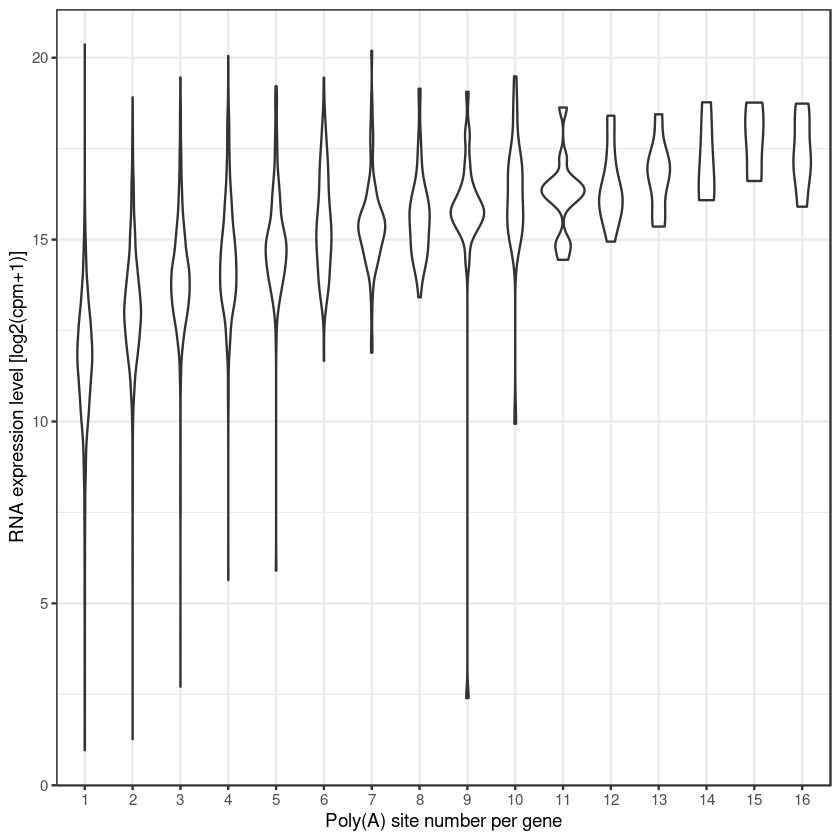

Cairo 
   21

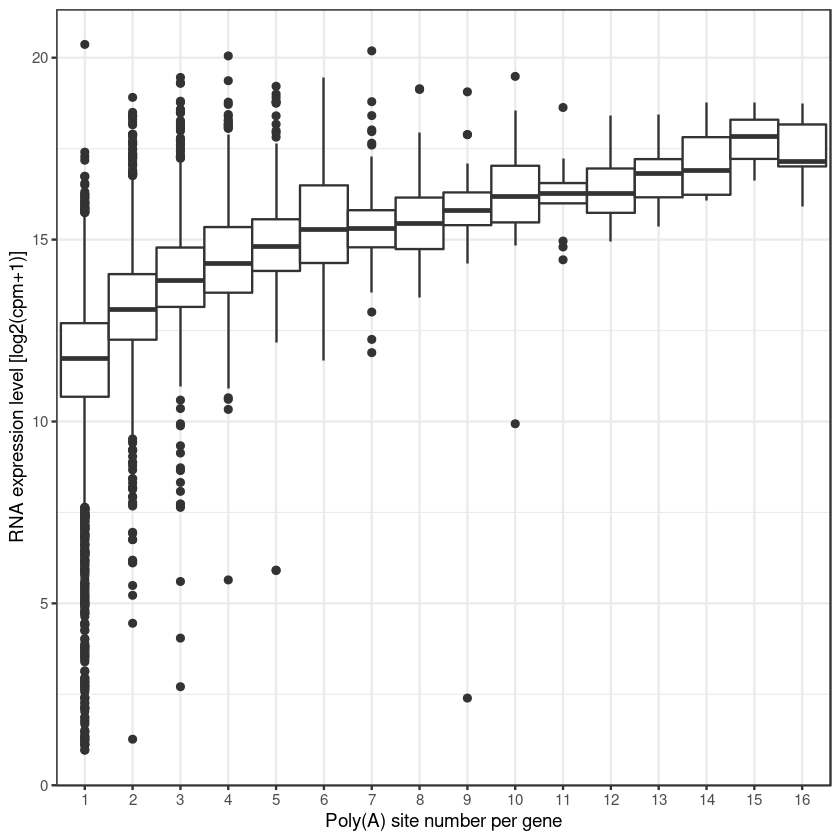

In [2219]:
library(Cairo)
library(ggplot2)

dev.off()
CairoPDF('2_1_violin_polyAsites_log2cpm.pdf', width=4, height=4)
ggplot(df_siteNum_cpm, aes(as.factor( freq) , log2cpm) )+
    geom_violin()+
    #geom_jitter(alpha=0.01)+
    theme_bw()+labs(x="Poly(A) site number per gene", y="RNA expression level [log2(cpm+1)]")

ggplot(df_siteNum_cpm, aes(as.factor( freq) , log2cpm))+
    #geom_violin(trim=FALSE,color="black")+ #小提琴有填充色
    geom_boxplot(width=1, position=position_dodge(0.9))+ #重叠画一个箱线图
    scale_fill_manual('Cycle',values=cols)+ #自定义填充颜色
    theme_bw()+ #浅色主题
    labs(x="Poly(A) site number per gene", y="RNA expression level [log2(cpm+1)]")
dev.off()

# step3: filter out genes whoes reads at 2 sites less than XX

In [7]:
#########################
# step3: filter out genes whoes reads at 2 sites less than 20 reads
apaSite[1:4,]

apa_rna_df=NULL; notFind=c(); notEnough=c();
for(i in 1:length(gene.2sites$id) ){
  gene=gene.2sites$id[i]
  if(i>10){
    #break;
  }
  if(i%%200==0){
    print(paste('processing ',i) )
  }

  # one gene, get 2 apa site
  tmpDF=apaSite[which(apaSite$gene == gene),]
  # order by position
  tmpDF=tmpDF[order(tmpDF$pos),]
  apa_2sites=tmpDF$PASid;
  
  # filter out sites with less than 20 reads at both sites.
  tmpDF2=apaM[tmpDF$PASid,]
  tmpDF3=tmpDF2[,apply(tmpDF2,2,sum)>=readThreshold]
  tmpDF=tmpDF3;
  #dim(tmpDF3) #2 28
  #View(tmpDF3)

    # missing value where TRUE/FALSE needed
  if(is.null(nrow(tmpDF)) ){
      print( paste(i,">>>not enough cell:", gene ) )
      next;
  }
  
  # get the most 3' end apa site;
  if(apaSite[row.names(tmpDF), 'strand'][1]=='+'){
    apa_3end=apa_2sites[2]
  }else{
    apa_3end=apa_2sites[1]
  }

  # calculate most 3'end read pct;//todo
  ratio=apaM[apa_3end, colnames(tmpDF)]/apply(apaM[apa_2sites, colnames(tmpDF)],2,sum )*100

  #errors handler
  if(! (gene %in% row.names(rnaM)) ){
    print( paste(i,"not find gene:", gene ) )
    notFind=c(notFind,gene)
    next;
  }
  if( length(colnames(tmpDF))<3 ){
    print( paste(i,"not enough finite observations:", gene ) );
    notEnough=c(notEnough, gene)
    next;
  }
  
  # RNA expression level
  rna=rnaM[gene, colnames(tmpDF)]

  #correlation
  rs=cor.test( as.numeric(ratio[1,]), as.numeric(rna[1,]) )
  #str(rs)
  
  rs_df=data.frame(
    gene=gene,
    cellNumber=dim(tmpDF)[2],
    apaCount=sum(tmpDF),
    rnaCount=sum(rna),
    correlation=as.numeric( rs$estimate ),
    pvalue=rs$p.value
  )
  #
  apa_rna_df=rbind(apa_rna_df, rs_df)
} #2min;
#
length(notFind) #46
length(notEnough) #1
#
dim(apa_rna_df) # 2035 6
# FDR correction
apa_rna_df$adj.p=p.adjust(p=apa_rna_df$pvalue, method = "fdr") 
#
head(apa_rna_df)
#      gene cellNumber apaCount rnaCount correlation       pvalue        adj.p
#1     AARD         28     2463     5763  0.17464316 3.740834e-01 0.6190044787
#2     AARS        114    10919    24513 -0.16958843 7.125583e-02 0.2305602542
#3 AASDHPPT         76     4225    11540 -0.48520179 8.904870e-06 0.0002513152

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60,motif,distance
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr10:320403:-,chr10:320403:-,chr10,320403,-,10945,UTR3,DIP2C-201,TGAAAATAGCAGTTTCTTAAT,DIP2C,TCTGTGATAACGCCTGTTTTATATTCAAATGAACAAATAAAAGCTTTTATTTTTGTTGCTC,AATAAA,26
chr10:855485:-,chr10:855485:-,chr10,855485,-,3583,PA,LARP4B-201,TCAATTTTTCTTTTGATTTTT,LARP4B,GTGTAAAACTGTCTAATTTGAAAAAAAATGTAGGTTATGAAAATAAAGATTTAGGCACTGT,AATAAA,20
chr10:1085971:-,chr10:1085971:-,chr10,1085971,-,10905,UTR3,IDI1-201,AAAGTTAAATGTTTGTTAAAT,IDI1,ACAGATTTATTATTCTTAAATGCTGTATGATAATGAAGAAAAATAAAAATTTATTTCTTGC,AATAAA,20
chr10:1087286:-,chr10:1087286:-,chr10,1087286,-,947,exon,IDI1-205,AAAGGAAGAACTAAAAGAACT,IDI1,TGAGGAAGAATGTAACTTTGAATCCAGATCCCAATGAGATTAAAAGCTATTGTTATGTGTC,ATTAAA,23


Warning message in cor(x, y):
“the standard deviation is zero”


[1] "15 not find gene: AC004967.2"
[1] "16 not find gene: AC005261.1"
[1] "17 not find gene: AC006001.3"
[1] "18 not find gene: AC008443.1"
[1] "19 not find gene: AC012146.1"
[1] "20 not find gene: AC012640.4"
[1] "21 not find gene: AC022784.1"
[1] "22 not find gene: AC025031.2"
[1] "23 not find gene: AC026954.2"
[1] "24 not find gene: AC068831.7"
[1] "25 not find gene: AC069288.1"
[1] "26 not find gene: AC074143.1"
[1] "27 not find gene: AC087721.2"
[1] "28 not find gene: AC091167.2"
[1] "29 not find gene: AC092647.5"
[1] "30 not find gene: AC098934.1"
[1] "31 not find gene: AC103591.3"
[1] "32 not find gene: AC120057.2"
[1] "33 not find gene: AC126283.2"
[1] "34 not find gene: AC253536.7"
[1] "35 not find gene: AC253572.1"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "69 not find gene: AKAP2"
[1] "74 not find gene: AL031282.2"
[1] "75 not find gene: AL138733.1"
[1] "76 not find gene: AL355338.1"
[1] "77 not find gene: AL390719.1"
[1] "78 not find gene: AL441992.2"
[1] "79 not find gene: AL445524.1"
[1] "80 not find gene: AL591806.3"
[1] "81 not find gene: AL592429.2"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "113 not find gene: AP001453.2"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  200"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  400"
[1] "419 not find gene: CPA6"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "568 not find gene: ELFN1"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  600"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "698 not find gene: GNG10"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "753 not find gene: HLA"


Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  800"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "900 not find gene: LINC00598"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "999 not find gene: MIR4435"
[1] "processing  1000"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1063 not enough finite observations: MTCYBP35"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1168 not find gene: NPSR1"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  1200"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  1400"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1492 not find gene: RNU6"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  1600"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1666 not find gene: SMIM11B"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1701 not find gene: SOX2"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation i

[1] "processing  1800"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "1855 not find gene: TMEM35B"
[1] "1878 not find gene: TOMM6"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "processing  2000"
[1] "2000 not find gene: WDR83OS"


Warning message in cor(x, y):
“the standard deviation is zero”


[1] "2021 not find gene: ZBED6"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] "2066 not find gene: ZNF625"


Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”


[1] 46

[1] 1

[1] 2035    6

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,AARD,28,2463,1714,0.03621516,0.8548330,0.9782914
2,AARS,114,10919,12588,-0.04320100,0.6481094,0.9658319
3,AASDHPPT,76,4225,2931,0.15448253,0.1827150,0.9658319
4,AATF,188,19210,13692,0.06393673,0.3833711,0.9658319
5,ABCB7,116,6475,699,-0.10824427,0.2474346,0.9658319
6,ABCC5,40,2528,0,NA,NA,NA


## cell number per gene

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
317,CHCHD5,145,14750,48,-0.9458291,9.607423e-72,1.826371e-68
1211,PEBP4,4,30,570,-0.6933213,3.066787e-01,9.658319e-01
1542,SERPINB6,179,50727,33,-0.6599666,9.401100e-24,8.935746e-21
483,DNAAF5,18,724,596,-0.5942201,9.309083e-03,5.898856e-01
337,CLASP2,37,3070,879,-0.4711138,3.249633e-03,3.431973e-01
1878,TTF2,22,3975,363,-0.4548704,3.342051e-02,9.123171e-01


,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
176,BEST1,4,22,30,0.5042353,0.4957646904,0.96583189
1192,PCGF2,27,1780,1200,0.4393219,0.0218625288,0.81491504
1683,SRRD,70,9880,3118,0.4215110,0.0002790557,0.07578354
820,KIF1B,48,3257,2246,0.4133123,0.0035023679,0.35001423
2008,ZNF330,28,1836,32,0.3974666,0.0362176683,0.92173145
204,C12orf29,44,1089,4673,0.3879540,0.0092652997,0.58988556


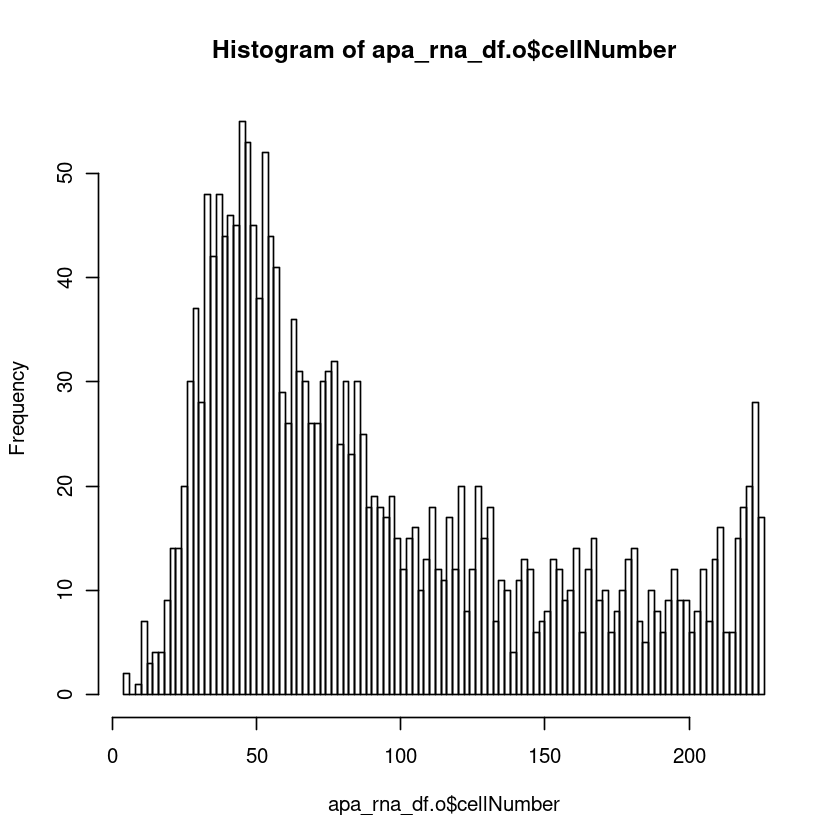

In [8]:
# view genes by corr order
apa_rna_df.2=apa_rna_df
head(apa_rna_df.2[order(apa_rna_df.2$correlation),]) #-
head(apa_rna_df.2[order(-apa_rna_df.2$correlation),]) #+
apa_rna_df.o=apa_rna_df.2[order(-apa_rna_df.2$correlation),];
write.table(apa_rna_df.o, 'apa_rna_df.txt')

#View(apa_rna_df.o)
hist(apa_rna_df.o$cellNumber, n=100)

In [9]:
head(apa_rna_df.o)

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
176,BEST1,4,22,30,0.5042353,0.4957646904,0.96583189
1192,PCGF2,27,1780,1200,0.4393219,0.0218625288,0.81491504
1683,SRRD,70,9880,3118,0.4215110,0.0002790557,0.07578354
820,KIF1B,48,3257,2246,0.4133123,0.0035023679,0.35001423
2008,ZNF330,28,1836,32,0.3974666,0.0362176683,0.92173145
204,C12orf29,44,1089,4673,0.3879540,0.0092652997,0.58988556


## step3_2: count genes per cell(Filter out genes whose reads at 2 sites less than XX(耗时)

In [10]:
######################### 耗时30min
# step3_2: count genes per cell. exclude whoes reads at 2 sites less than 20 reads
apaSite[1:4,]

genePerCell=NULL;
for(i in 1:ncol(apaM)){
  cell=colnames(apaM)[i]
  #print( paste(i, cell) )
  
  if(i>3){
    #break;
  }
  
  if(i%%20==0){
    print(paste('processing ',i) )
  }
  
  #
  geneNumber=0
  geneNumber2=0
  for(j in 1:nrow(gene.2sites)){
    gene=gene.2sites$id[j]
    # one gene, get 2 sites
    tmpDF=apaSite[which(apaSite$gene == gene),]
    # order by position
    tmpDF=tmpDF[order(tmpDF$pos),]
    apa_2sites=tmpDF$PASid;
    
    # get the most 3' end apa site;
    if(apaSite[row.names(tmpDF), 'strand'][1]=='+'){
      apa_3end=apa_2sites[2]
    }else{
      apa_3end=apa_2sites[1]
    }
    
    # total counts at both sites;
    tmpCounts=sum( apaM[apa_2sites, cell] )
    # 3'end count
    counts.3end=apaM[apa_3end, cell]
    
    # filter out sites with less than 20 reads at both sites.
    if(tmpCounts >= readThreshold){
      geneNumber=geneNumber+1
      
      #remove 100% and 0% at 3 end
      if(counts.3end!=0 && counts.3end != tmpCounts){ 
        geneNumber2=geneNumber2+1
      }
    }
  }
  #
  tmpDF=data.frame(
    cell=cell,
    geneNumber=geneNumber,
    geneNumber2=geneNumber2
  )
  genePerCell=rbind(genePerCell, tmpDF)
}
print( paste(i,j, dim(genePerCell)) )
dim(genePerCell) #225 3
head(genePerCell)

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60,motif,distance
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr10:320403:-,chr10:320403:-,chr10,320403,-,10945,UTR3,DIP2C-201,TGAAAATAGCAGTTTCTTAAT,DIP2C,TCTGTGATAACGCCTGTTTTATATTCAAATGAACAAATAAAAGCTTTTATTTTTGTTGCTC,AATAAA,26
chr10:855485:-,chr10:855485:-,chr10,855485,-,3583,PA,LARP4B-201,TCAATTTTTCTTTTGATTTTT,LARP4B,GTGTAAAACTGTCTAATTTGAAAAAAAATGTAGGTTATGAAAATAAAGATTTAGGCACTGT,AATAAA,20
chr10:1085971:-,chr10:1085971:-,chr10,1085971,-,10905,UTR3,IDI1-201,AAAGTTAAATGTTTGTTAAAT,IDI1,ACAGATTTATTATTCTTAAATGCTGTATGATAATGAAGAAAAATAAAAATTTATTTCTTGC,AATAAA,20
chr10:1087286:-,chr10:1087286:-,chr10,1087286,-,947,exon,IDI1-205,AAAGGAAGAACTAAAAGAACT,IDI1,TGAGGAAGAATGTAACTTTGAATCCAGATCCCAATGAGATTAAAAGCTATTGTTATGTGTC,ATTAAA,23


[1] "processing  20"
[1] "processing  40"
[1] "processing  60"
[1] "processing  80"
[1] "processing  100"
[1] "processing  120"
[1] "processing  140"
[1] "processing  160"
[1] "processing  180"
[1] "processing  200"
[1] "processing  220"
[1] "225 2082 225" "225 2082 3"  


[1] 225   3

,cell,geneNumber,geneNumber2
,<fct>,<dbl>,<dbl>
1,c01ROW07,925,198
2,c01ROW12,1019,231
3,c01ROW24,850,165
4,c01ROW31,950,239
5,c01ROW35,1069,240
6,c04ROW06,765,151


### gene number per cell

In [11]:
# library(Cairo)
pdf('step3_2_genePerCell.pdf', width=5, height=4)
hist(genePerCell$geneNumber, n=50, main=paste0("filter out: <",readThreshold," reads gene"), xlab="Gene number per cell")

hist(genePerCell$geneNumber2, n=50, main=paste0("filter out: <",readThreshold," reads gene; \nremove 0,100"), 
     xlab="Gene number per cell")
dev.off()

png 
  2

# step4 distal Poly(A) site usage with RNA


       N.S. significant 
       2029           6 

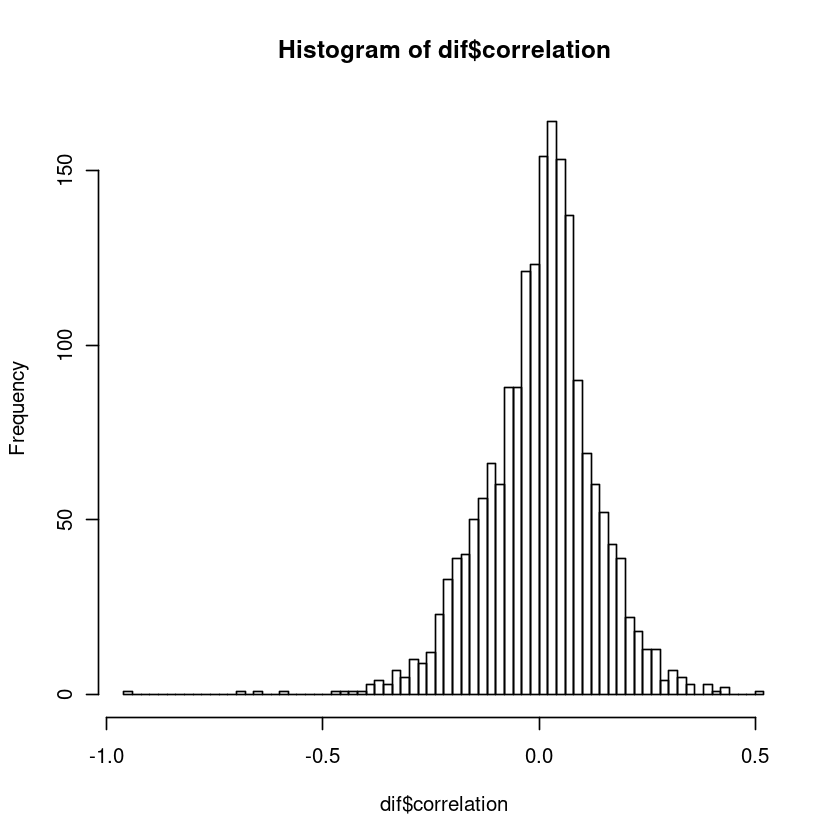

In [12]:
#########################
# step4 plot: distal Poly(A) site usage, RNA

# add significance
apa_rna_df.2=apa_rna_df
apa_rna_df.2$threshold='N.S.'
apa_rna_df.2[which(apa_rna_df.2$adj.p<0.05),'threshold']="significant"
table(apa_rna_df.2$threshold) # 1725 310

#
dif=apa_rna_df.2
row.names(dif)=dif$gene
hist(dif$correlation, n=100)

In [13]:
head(dif)

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p,threshold
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
AARD,AARD,28,2463,1714,0.03621516,0.8548330,0.9782914,N.S.
AARS,AARS,114,10919,12588,-0.04320100,0.6481094,0.9658319,N.S.
AASDHPPT,AASDHPPT,76,4225,2931,0.15448253,0.1827150,0.9658319,N.S.
AATF,AATF,188,19210,13692,0.06393673,0.3833711,0.9658319,N.S.
ABCB7,ABCB7,116,6475,699,-0.10824427,0.2474346,0.9658319,N.S.
ABCC5,ABCC5,40,2528,0,NA,NA,NA,N.S.


In [14]:
m1=mean(dif$correlation[!is.na(dif$correlation)])
sd1=sd(dif$correlation[!is.na(dif$correlation)])
print(paste(m1, sd1))

[1] "0.00198615483657433 0.128988209743871"


In [15]:
table(dif$correlation > m1+2*sd1 )


FALSE  TRUE 
 1862    39 

In [16]:
table(dif$adj.p < 0.05)


FALSE  TRUE 
 1895     6 

In [17]:
table(dif$correlation < (m1-2*sd1) & dif$adj.p < 0.05)


FALSE  TRUE 
 1895     6 

In [18]:
dif$threshold2="ns";
dif[which(dif$correlation > m1+2*sd1 ),]$threshold2="positive";
dif[which(dif$correlation < (m1-2*sd1) ),]$threshold2="negative";
tb2=table(dif$threshold2);tb2
#negative     ns     positive 
#     51     1945       39 


negative       ns positive 
      51     1945       39 

In [19]:
# save up and down gene list
geneUp=dif[which(dif$threshold2=='positive'),];dim(geneUp) #78 9
head(geneUp)
writeLines(as.character( geneUp$gene), paste0('cor_DPAU_RNA_',keyword, dim(geneUp)[1],'_genes_positive.txt') )

#
geneDown=dif[which(dif$threshold2=='negative'),];dim(geneDown) #181 9
head(geneDown)
writeLines(as.character( geneDown$gene), paste0('cor_DPAU_RNA_',keyword, dim(geneDown)[1],'_genes_negative.txt') )
#

[1] 39  9

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p,threshold,threshold2
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ACTR3B,ACTR3B,29,1442,1235,0.2634534,0.167318462,0.9658319,N.S.,positive
ATG4C,ATG4C,46,3405,1126,0.3021170,0.041288230,0.9658319,N.S.,positive
ATM,ATM,43,2023,842,0.2721786,0.077445155,0.9658319,N.S.,positive
BEST1,BEST1,4,22,30,0.5042353,0.495764690,0.9658319,N.S.,positive
C11orf74,C11orf74,73,5814,195,0.3092402,0.007764556,0.5466823,N.S.,positive
C12orf29,C12orf29,44,1089,4673,0.3879540,0.009265300,0.5898856,N.S.,positive


[1] 51  9

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p,threshold,threshold2
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ABCD3,ABCD3,54,3256,174,-0.2669212,0.05104198,0.9658319,N.S.,negative
ARMH3,ARMH3,29,2052,83,-0.2805250,0.14047990,0.9658319,N.S.,negative
ATG4A,ATG4A,42,2598,189,-0.2737943,0.07933783,0.9658319,N.S.,negative
CAPN7,CAPN7,45,2452,9,-0.2755014,0.06698995,0.9658319,N.S.,negative
CCL28,CCL28,27,1783,30,-0.2578692,0.19407518,0.9658319,N.S.,negative
CD70,CD70,43,2139,302,-0.2882600,0.06085378,0.9658319,N.S.,negative


Warning message:
“Removed 134 rows containing missing values (geom_point).”


[1] 140   9

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p,threshold,threshold2
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA.1,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA.2,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA.3,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA.4,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA.5,NA,NA,NA,NA,NA,NA,NA,NA,NA


Warning message:
“Removed 134 rows containing missing values (geom_point).”
Warning message:
“Removed 134 rows containing missing values (geom_text_repel).”


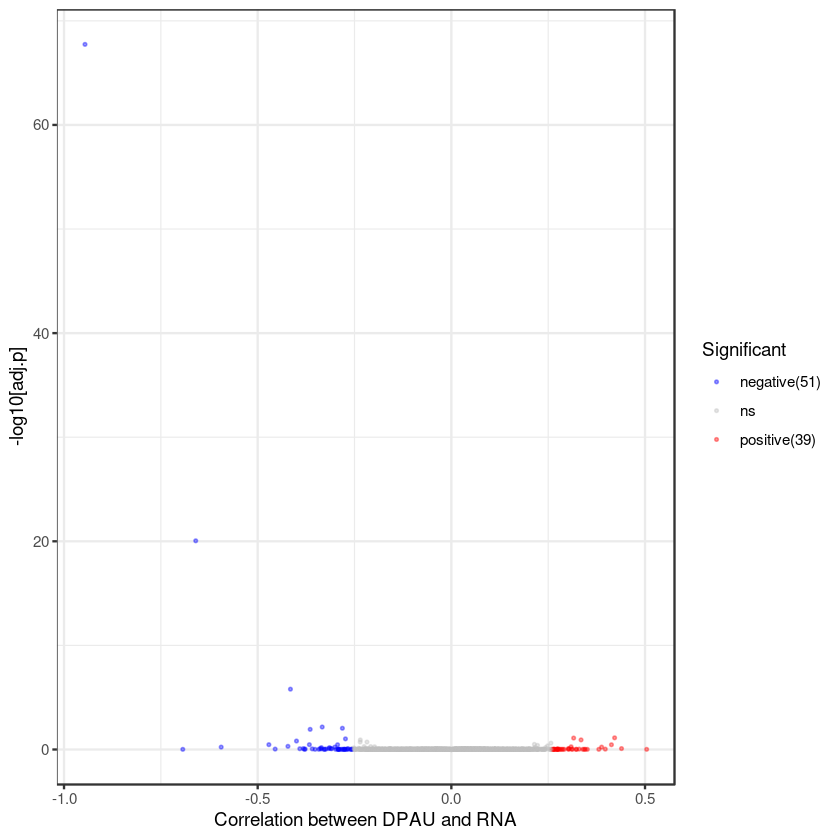

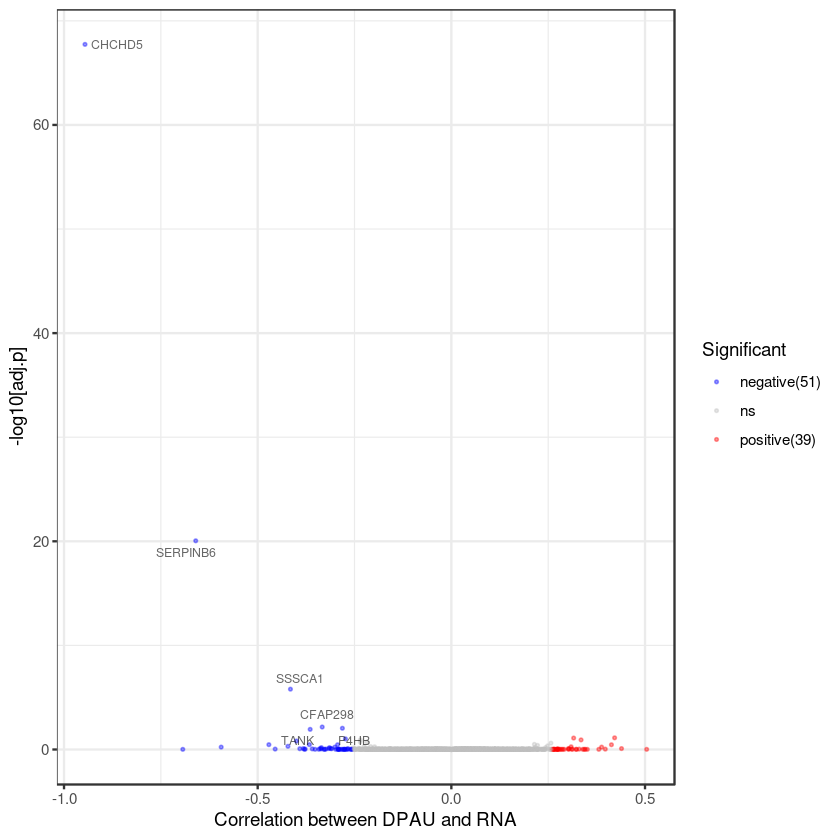

In [20]:
library(ggplot2)
g = ggplot(data=dif, aes(x=correlation, y=-log10(adj.p), color=threshold2)) +
  geom_point(alpha=0.4, size=0.4) +
  theme_bw() +
  theme(legend.box = "herizontal", #显著性图例，水平，标到底部
        legend.direction="vertical",
        legend.position="right" ) +
  scale_color_manual('Significant',labels=c(paste0("negative(",tb2[[1]],')'), 'ns',
                                            paste0("positive(",tb2[[3]],')' ) ),
                     values=c("blue", "grey",'red') )+
  xlab("Correlation between DPAU and RNA") + ylab("-log10[adj.p]"); g #+
  #labs(title= paste0("correlation : ",keyword) ); g
## add text to a few genes
dd_text = dif[ ((abs(dif$correlation) > (m1+2*sd1) ) & (dif$adj.p < 0.05) ) | 
                 abs(dif$correlation) > 0.7,]; dim(dd_text) #34 9
head(dd_text)

#add text
library(ggrepel)
g2=g + geom_text_repel(data=dd_text, aes(x=correlation, y=-log10(adj.p), label=row.names(dd_text)), 
                       size=2.5, colour="black",alpha=0.6); g2

Warning message:
“Removed 134 rows containing missing values (geom_point).”
Warning message:
“Removed 134 rows containing missing values (geom_text_repel).”


png 
  2

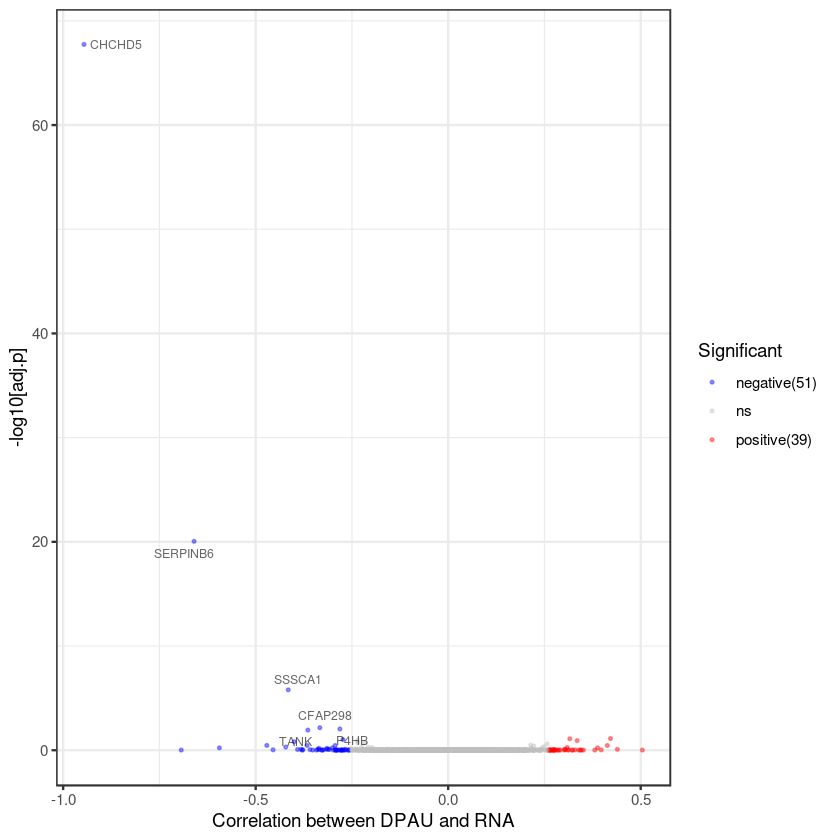

In [21]:
#保存图片
CairoPDF(file=paste0('volcano_plot_cor_DPAU_RNA',keyword,'.pdf'), width=5,height=4)
print(g2)
dev.off()

# step5 DPAU.(refer step3)

In [22]:
#########################
# step5 DPAU.(refer step3)
# filter out genes whoes reads at 2 sites less than 20reads
apaSite[1:4,]
#
apa_rna_df2=NULL;
for(i in 1:length(gene.2sites$id) ){
  gene=as.character( gene.2sites$id[i] )
  if(i>10){
    #break;
  }
  if(i%%200==0){
    print(paste('processing ',i) )
  }
  
  # one gene, get 2 apa site
  tmpDF=apaSite[which(apaSite$gene == gene),]
  # order by position
  tmpDF=tmpDF[order(tmpDF$pos),]
  
  #get 2 sites
  apa_2sites=as.character( tmpDF$PASid )
  
  # get the most 3' end apa site;
  if( as.character( apaSite[row.names(tmpDF), 'strand'][1] )=='+'){
    apa_3end=apa_2sites[length(apa_2sites)]
  }else{
    apa_3end=apa_2sites[1]
  }
  
  # get apa matrix for the gene;
  tmpDF2=apaM[tmpDF$PASid,]
  
  #get one row template;
  tmpDF0=apaM[1,]
  row.names(tmpDF0)=gene
  #
  for(j in 1:ncol(tmpDF0) ){
    cell=colnames(apaM)[j]
    
    # filter out sites with less than 20 reads at both sites.
    if( sum(tmpDF2[,cell]) <readThreshold ){
      tmpDF0[1, cell]=NA;
      
    }else{
      #print(paste(j, cell))
      # calculate most 3'end read pct;
      DPAU=tmpDF2[apa_3end,cell]/sum(tmpDF2[,cell])*100
      tmpDF0[1, cell]=DPAU;
    }
  }

  # output;
  apa_rna_df2=rbind(apa_rna_df2, tmpDF0)
} #2min;
# check
DPAU=apa_rna_df2
dim(DPAU) #2082 225
DPAU[1:5,1:10]

# save to file
write.table(DPAU, 'step5_apa_DPAU.txt', quote = F)

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60,motif,distance
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr10:320403:-,chr10:320403:-,chr10,320403,-,10945,UTR3,DIP2C-201,TGAAAATAGCAGTTTCTTAAT,DIP2C,TCTGTGATAACGCCTGTTTTATATTCAAATGAACAAATAAAAGCTTTTATTTTTGTTGCTC,AATAAA,26
chr10:855485:-,chr10:855485:-,chr10,855485,-,3583,PA,LARP4B-201,TCAATTTTTCTTTTGATTTTT,LARP4B,GTGTAAAACTGTCTAATTTGAAAAAAAATGTAGGTTATGAAAATAAAGATTTAGGCACTGT,AATAAA,20
chr10:1085971:-,chr10:1085971:-,chr10,1085971,-,10905,UTR3,IDI1-201,AAAGTTAAATGTTTGTTAAAT,IDI1,ACAGATTTATTATTCTTAAATGCTGTATGATAATGAAGAAAAATAAAAATTTATTTCTTGC,AATAAA,20
chr10:1087286:-,chr10:1087286:-,chr10,1087286,-,947,exon,IDI1-205,AAAGGAAGAACTAAAAGAACT,IDI1,TGAGGAAGAATGTAACTTTGAATCCAGATCCCAATGAGATTAAAAGCTATTGTTATGTGTC,ATTAAA,23


[1] "processing  200"
[1] "processing  400"
[1] "processing  600"
[1] "processing  800"
[1] "processing  1000"
[1] "processing  1200"
[1] "processing  1400"
[1] "processing  1600"
[1] "processing  1800"
[1] "processing  2000"


[1] 2082  225

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35,c04ROW06,c04ROW14,c05ROW02,c05ROW14,c05ROW19
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,50,100,NA,34.48276,39.375,0,0
AASDHPPT,NA,NA,100,100,NA,NA,NA,NA,NA,100
AATF,100.00000,100,NA,100,100,NA,NA,NA,NA,100
ABCB7,0.00000,100,NA,100,100,83.33333,55.55556,NA,100,NA


## check[readThreshold]

In [23]:
#########
# check
DPAU2=DPAU
DPAU2[DPAU2==100] <- NA
DPAU2[DPAU2==0] <- NA
#
table(is.na(DPAU))
#FALSE   TRUE #For 5
#194663 273787 
table(is.na(DPAU2))
#FALSE   TRUE #For 5
#52734 415716

## For 10
# FALSE   TRUE 
#172956 295494 
# FALSE   TRUE 
# 49176 419274 

## For 20
# FALSE   TRUE 
#150737 317713 
# FALSE   TRUE 
# 45106 423344 


 FALSE   TRUE 
194663 273787 


 FALSE   TRUE 
 52734 415716 

In [24]:
dim(DPAU)

[1] 2082  225

png 
  2

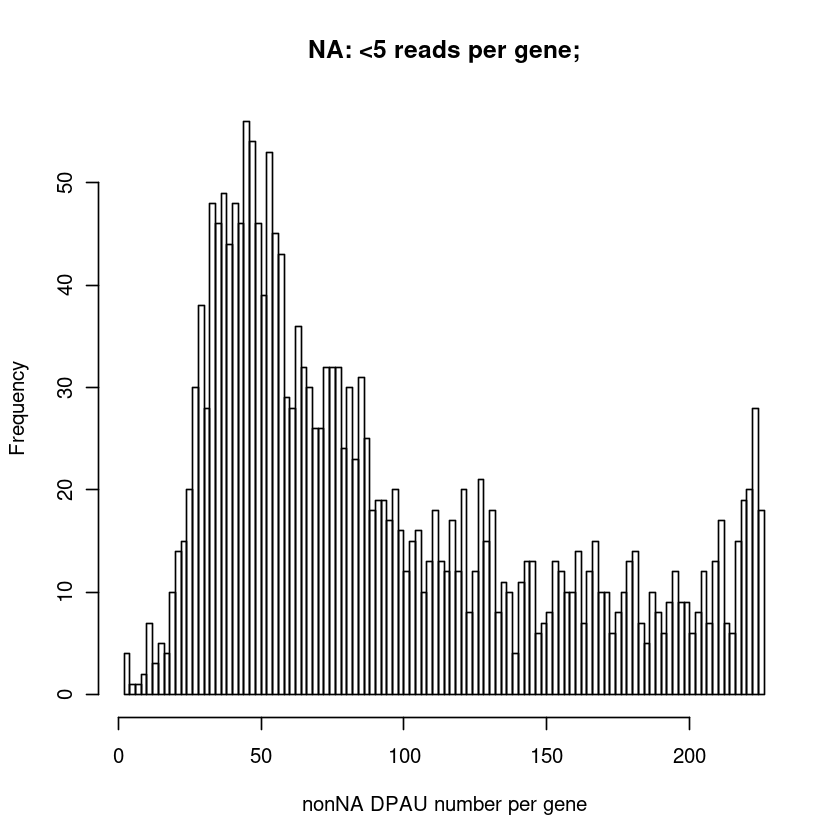

In [25]:
library(Cairo)
# plot none NA
CairoPDF(file="5_2_cell_number_nonNA.pdf",width=5,height=3)
hist(apply(!is.na(DPAU), 1,sum), n=100, xlab="nonNA DPAU number per gene", 
     main=paste0("NA: <",readThreshold," reads per gene;") )
dev.off()

png 
  2

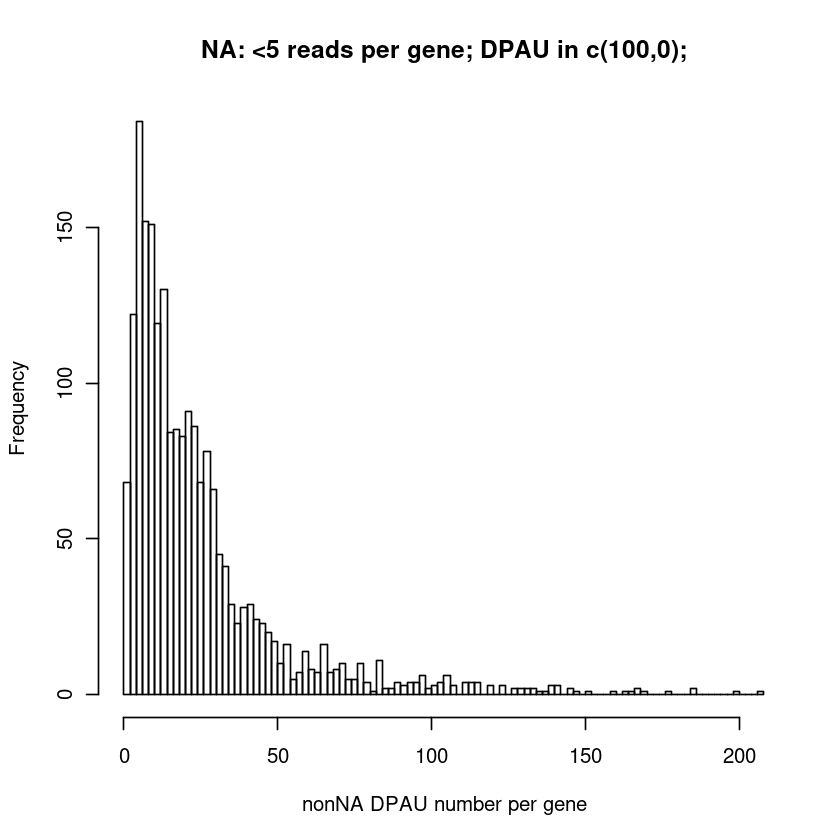

In [26]:
CairoPDF(file="5_2_cell_number_nonNA_2.pdf",width=5,height=3)
hist(apply(!is.na(DPAU2), 1,sum), n=100, xlab="nonNA DPAU number per gene", 
     main=paste0("NA: <",readThreshold, " reads per gene; DPAU in c(100,0);") )
dev.off()

In [27]:
# save to file
write.table(DPAU2, 'step5_apa_DPAU2.txt', quote = F)

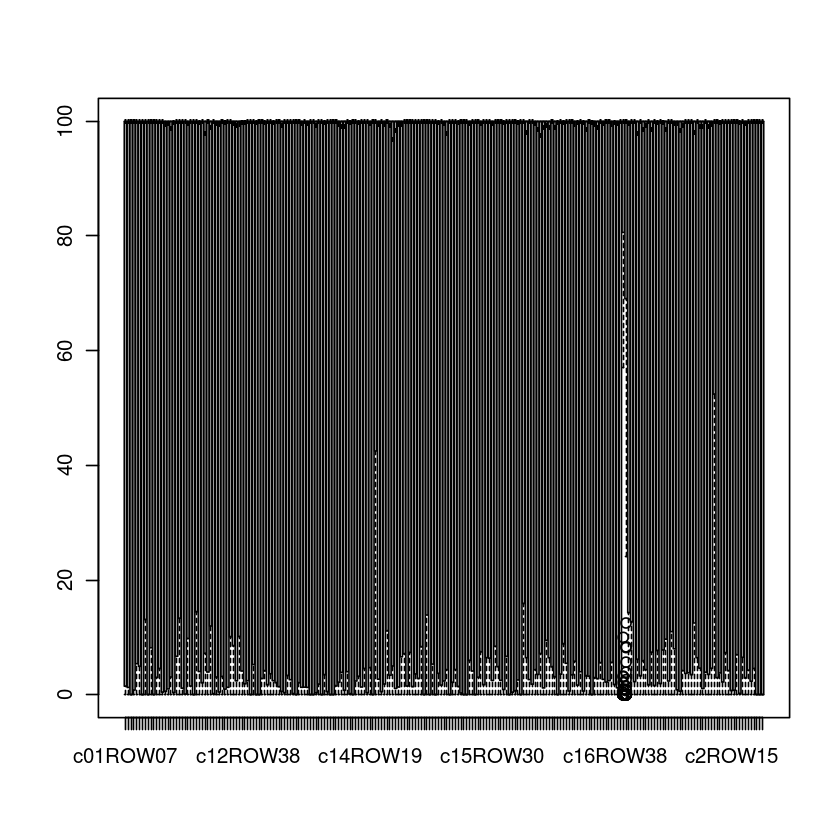

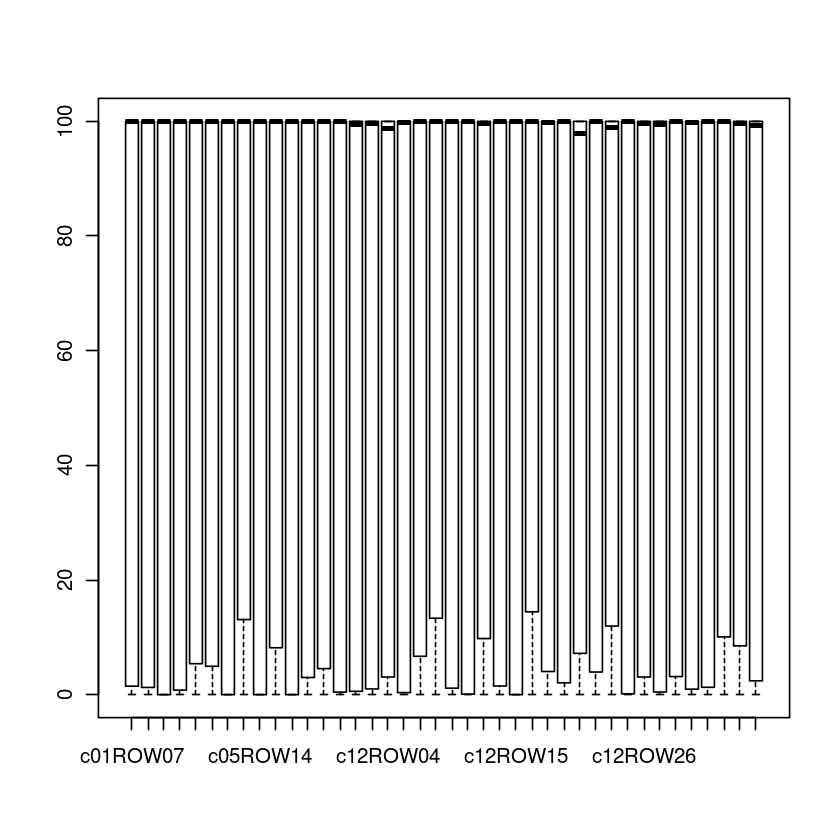

In [28]:
## boxplot
boxplot(DPAU)
boxplot(DPAU[,seq(1,40)]) #too dense!

## plot gene DPAU distribution by cell cycle

In [29]:
#head(cellInfo)
# plot gene DPAU distribution by cell cycle
drawDPAU_distribution=function(DPAU_, ymax=0.07, main="DPAU distribution of genes within each cell",
                               sub="[One line one cell]", showLegend=T){
  # set colors for cell cycles
  col=RColorBrewer::brewer.pal(n = 5,name = "Set2")
  #
  plot(density(DPAU_[which( !is.na(DPAU_[,1]) ),1]), col="white",
       xlab="DPAU", ylim=c(0, ymax), main=main,sub=sub)
  for(i in seq(1,ncol(DPAU_))){
    cid=colnames(DPAU_)[i]
    cellCycle=cellInfo[cid, 'cellCycle']
    color=switch(cellCycle,G1S=col[1], S=col[2], G2M=col[3], M=col[4], MG1=col[5])
    
    lines(density(DPAU_[which( !is.na(DPAU_[,i]) ),i]), col=color)
  }
  #
  if(showLegend){
    legend("topleft", legend=c('G1S', 'S', 'G2M', 'M', 'MG1'), col =col, lty = 1,
           xjust = 0, yjust = 1, x.intersp = 1, y.intersp =1, adj = c(0, 0.5), text.width = NULL,xpd=TRUE)
  }
}

png 
  2

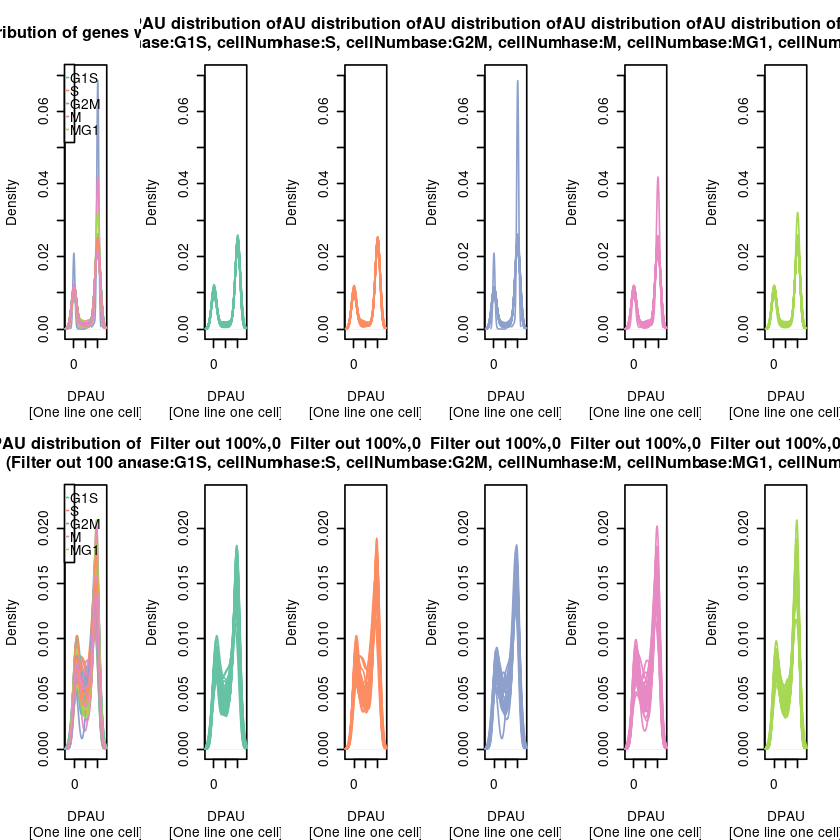

In [30]:
###
CairoPDF('step5_DPAU_distribution_each_gene_By_cellCycle.pdf',width=24,height=8)
par(mfrow=c(2,6))

## use 0 and 100%
drawDPAU_distribution(DPAU)
# by each cell cycle
for(cc in c('G1S', 'S', 'G2M', 'M', 'MG1')){
  cids=rownames(cellInfo[which(cellInfo$cellCycle==cc),])
  drawDPAU_distribution(DPAU[, cids], main=paste0("DPAU distribution of genes\nphase:", cc, ', cellNumber:',length(cids)),
                        showLegend=F)
}
##############
## NOT use 0 and 100%
drawDPAU_distribution(DPAU2, ymax=0.023,main="DPAU distribution of genes\n(Filter out 100 and 0)")
# by each cell cycle, no 100,0
for(cc in c('G1S', 'S', 'G2M', 'M', 'MG1')){
  cids=rownames(cellInfo[which(cellInfo$cellCycle==cc),])
  drawDPAU_distribution(DPAU2[, cids], ymax=0.023, main=paste0("Filter out 100%,0%]\nphase:", cc, ', cellNumber:',
                                                               length(cids)), showLegend=F)
}
dev.off()

## plot gene DPAU distribution by cell type

In [31]:
# plot gene DPAU distribution by cell type
drawDPAU_distribution_ByCellType=function(DPAU_, ymax=0.07, main="DPAU distribution of genes", 
                                          sub="[One line one cell]", showLegend=T){
  # set colors for cell cycles
  col=c("#F8766D", "#00BFC4")
  #
  plot(density(DPAU_[which( !is.na(DPAU_[,1]) ),1]), col="white",
       xlab="DPAU", ylim=c(0, ymax), main=main,sub=sub)
  for(i in seq(1,ncol(DPAU_))){
    cid=colnames(DPAU_)[i]
    cellType=substr( cellInfo[cid, 'cellType'], 0, 2)
    color=switch(cellType, BC=col[1], He=col[2])
    
    lines(density(DPAU_[which( !is.na(DPAU_[,i]) ),i]), col=color)
  }
  #
  if(showLegend){
    legend("topleft", legend=c('BC', 'HeLa'), col =col, lty = 1,
           xjust = 0, yjust = 1, x.intersp = 1, y.intersp =1, adj = c(0, 0.5), text.width = NULL,xpd=TRUE)
  }
}

png 
  2

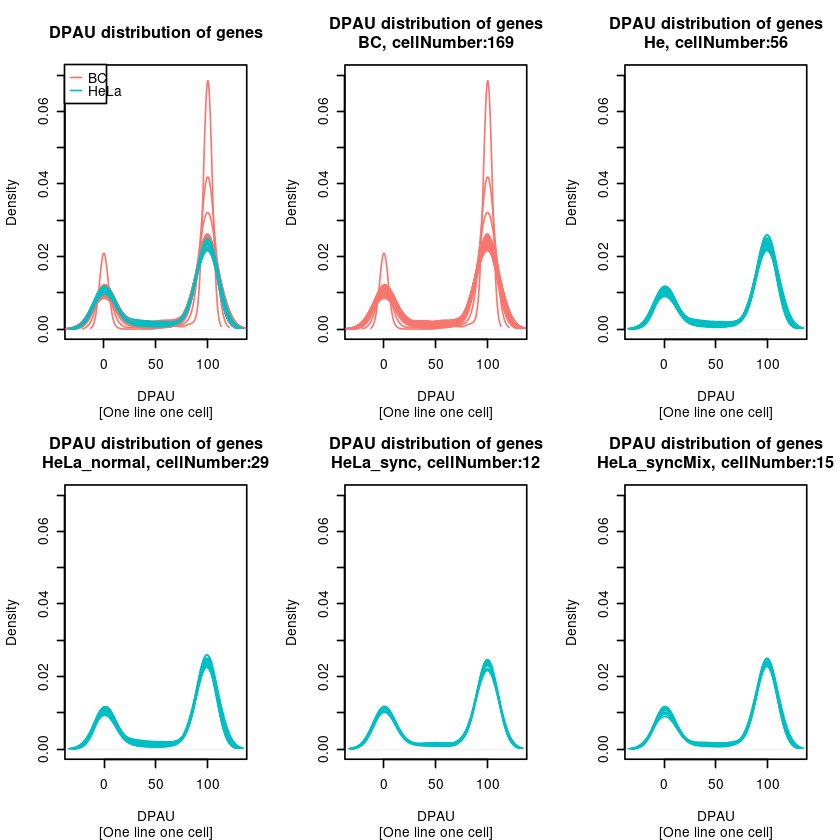

In [32]:
################
CairoPDF('step5_DPAU_distribution_each_gene_By_cellType.pdf',width=12,height=8)
par(mfrow=c(2,3))
drawDPAU_distribution_ByCellType(DPAU)

for(ct in c("BC","He")){
  cids=rownames(cellInfo[which( substr( cellInfo$cellType,1,2 )==ct),])
  drawDPAU_distribution_ByCellType(DPAU[, cids], 
                                   main= paste0("DPAU distribution of genes\n",ct,", cellNumber:", length(cids)), showLegend = F )
}

for(ct in c("HeLa_normal",  "HeLa_sync", "HeLa_syncMix")){
  cids=rownames(cellInfo[which( cellInfo$cellType2 ==ct),])
  drawDPAU_distribution_ByCellType(DPAU[, cids], 
                                   main= paste0("DPAU distribution of genes\n",ct,", cellNumber:", length(cids)), showLegend = F )
}
dev.off();

## by cell type X cell cycle(1cell 1 line)

In [33]:
table( substr(cellInfo$cellType,1,2) )


 BC  He 
169  56 

png 
  2

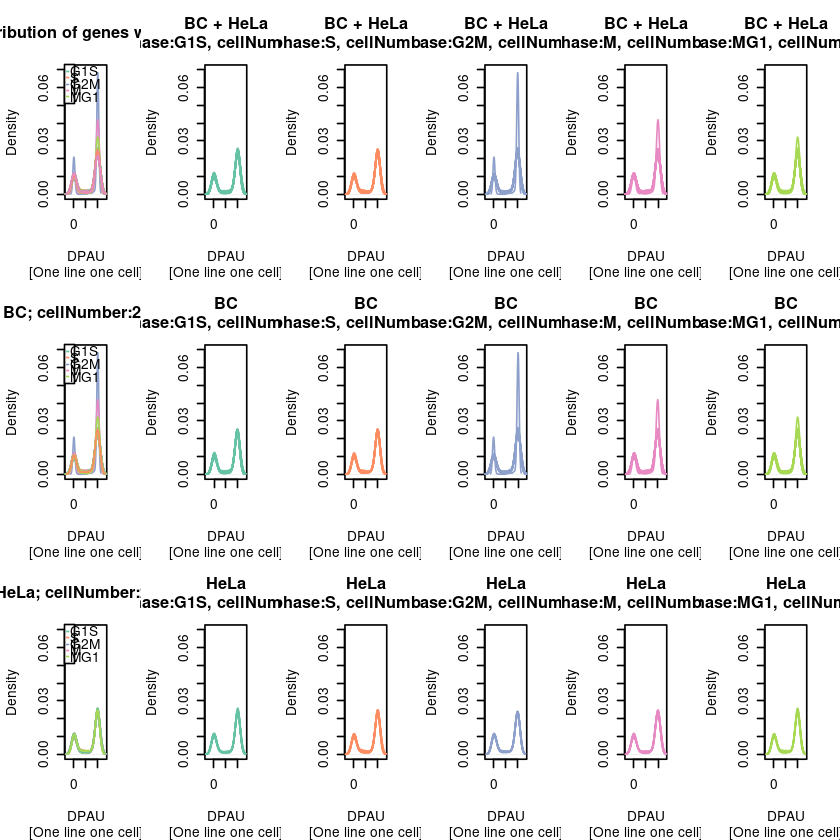

In [34]:
# cell type x cell cycle, ## use 0 and 100%
###
DPAU_BC=DPAU[, rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="BC" ),])]
DPAU_HeLa=DPAU[, rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="He" ),])]
#
CairoPDF('step5_DPAU_distribution_each_gene_By_cellType_x_cellCycle.pdf',width=24,height=12)
par(mfrow=c(3,6))
## ALL
drawDPAU_distribution(DPAU)
# ALL by each cell cycle
for(cc in c('G1S', 'S', 'G2M', 'M', 'MG1')){
  cids=rownames(cellInfo[which(cellInfo$cellCycle==cc),])
  drawDPAU_distribution(DPAU[, cids], main=paste0("BC + HeLa\nphase:", cc, ', cellNumber:',length(cids)),
                        showLegend=F)
}

## BC
drawDPAU_distribution(DPAU_BC,main = paste0("BC; cellNumber:", nrow(DPAU_BC) ))
# BC by each cell cycle
for(cc in c('G1S', 'S', 'G2M', 'M', 'MG1')){
  cids=rownames(cellInfo[which(cellInfo$cellCycle==cc & substr(cellInfo$cellType,1,2)=="BC" ),])
  drawDPAU_distribution(DPAU_BC[, cids], main=paste0("BC\nphase:", cc, ', cellNumber:',length(cids)),
                        showLegend=F)
}

## HeLa
drawDPAU_distribution(DPAU_HeLa, main = paste0("HeLa; cellNumber:", nrow(DPAU_HeLa)) )
# BC by each cell cycle
for(cc in c('G1S', 'S', 'G2M', 'M', 'MG1')){
  cids=rownames(cellInfo[which(cellInfo$cellCycle==cc & substr(cellInfo$cellType,1,2)=="He" ),])
  drawDPAU_distribution(DPAU_HeLa[, cids], main=paste0("HeLa\nphase:", cc, ', cellNumber:',length(cids)),
                        showLegend=F)
}
dev.off()

In [35]:
head(cellInfo)

,geneNumber,countsPerCell,countsPerGene,cellType,cellCycle,cellType2
,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
c01ROW24,5693,1950601,342.6315,HeLa_sync,G2M,HeLa_syncMix
c01ROW35,6768,3048970,450.4979,HeLa_sync,M,HeLa_syncMix
c01ROW31,6542,2783703,425.5125,HeLa_sync,S,HeLa_syncMix
c05ROW02,6012,1263249,210.1213,HeLa_sync,S,HeLa_syncMix
c05ROW14,5853,1313664,224.4428,HeLa_sync,S,HeLa_syncMix
c05ROW19,4372,493417,112.8584,HeLa_sync,S,HeLa_syncMix


In [36]:
cellInfo[which(cellInfo$cellCycle=="S" & substr(cellInfo$cellType,1,2)=="He" ),]

,geneNumber,countsPerCell,countsPerGene,cellType,cellCycle,cellType2
,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
c01ROW31,6542,2783703,425.5125,HeLa_sync,S,HeLa_syncMix
c05ROW02,6012,1263249,210.1213,HeLa_sync,S,HeLa_syncMix
c05ROW14,5853,1313664,224.4428,HeLa_sync,S,HeLa_syncMix
c05ROW19,4372,493417,112.8584,HeLa_sync,S,HeLa_syncMix
c3ROW04,6384,1147443,179.7373,HeLa_sync,S,HeLa_syncMix
c3ROW35,6190,1105737,178.6328,HeLa_sync,S,HeLa_syncMix
c9ROW04,5858,974229,166.3074,HeLa_sync,S,HeLa_syncMix
c04ROW14,4928,1359576,275.8880,HeLa_sync,S,HeLa_sync
c2ROW02,6349,1670613,263.1301,HeLa_sync,S,HeLa_sync


##  a gene a line

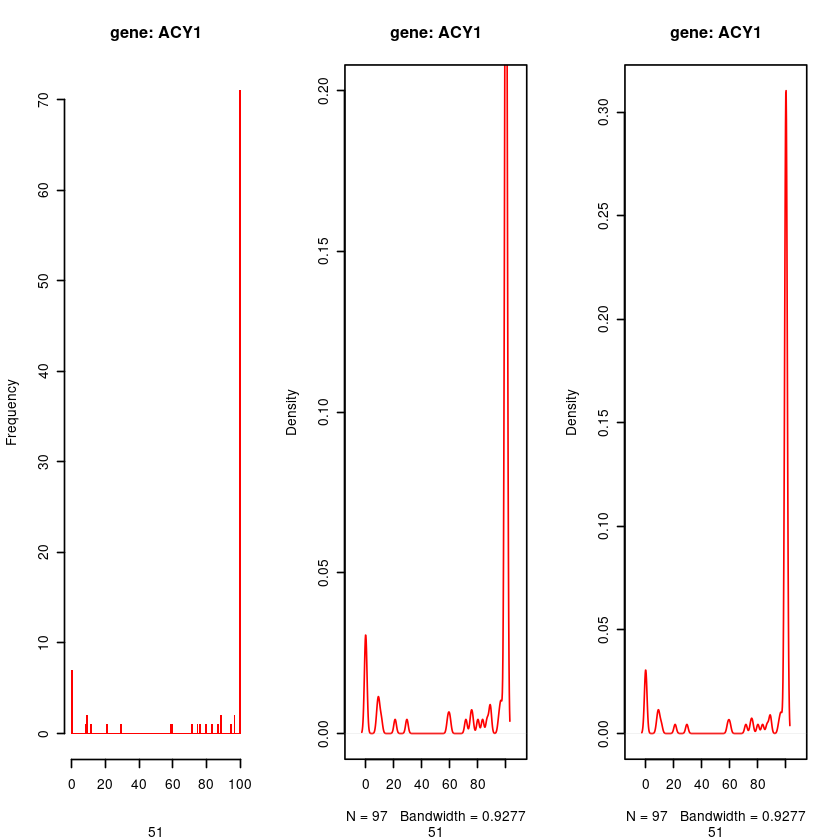

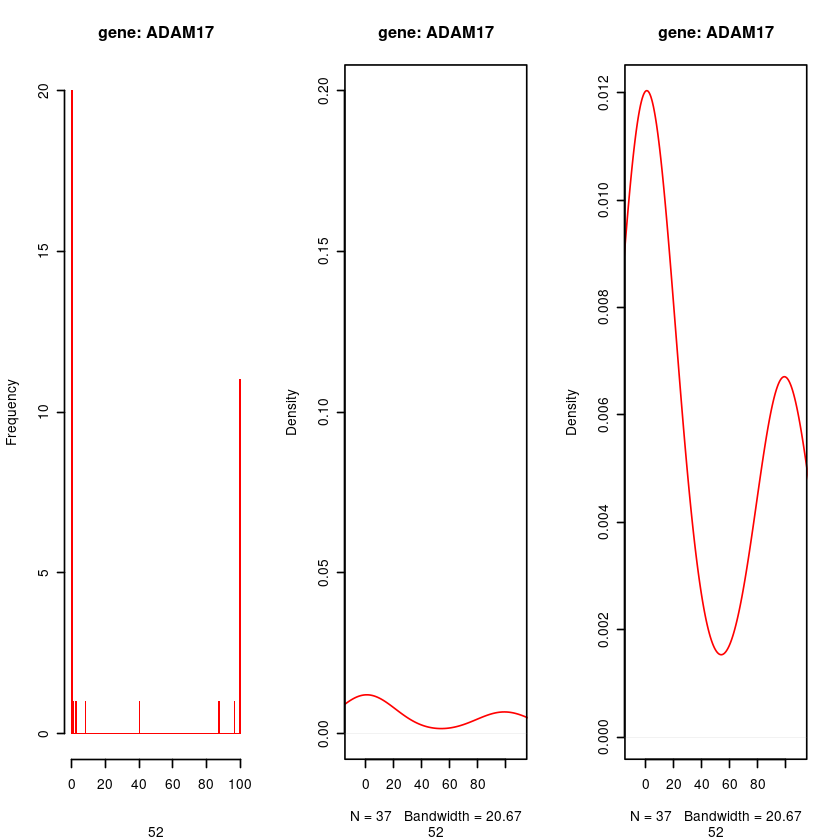

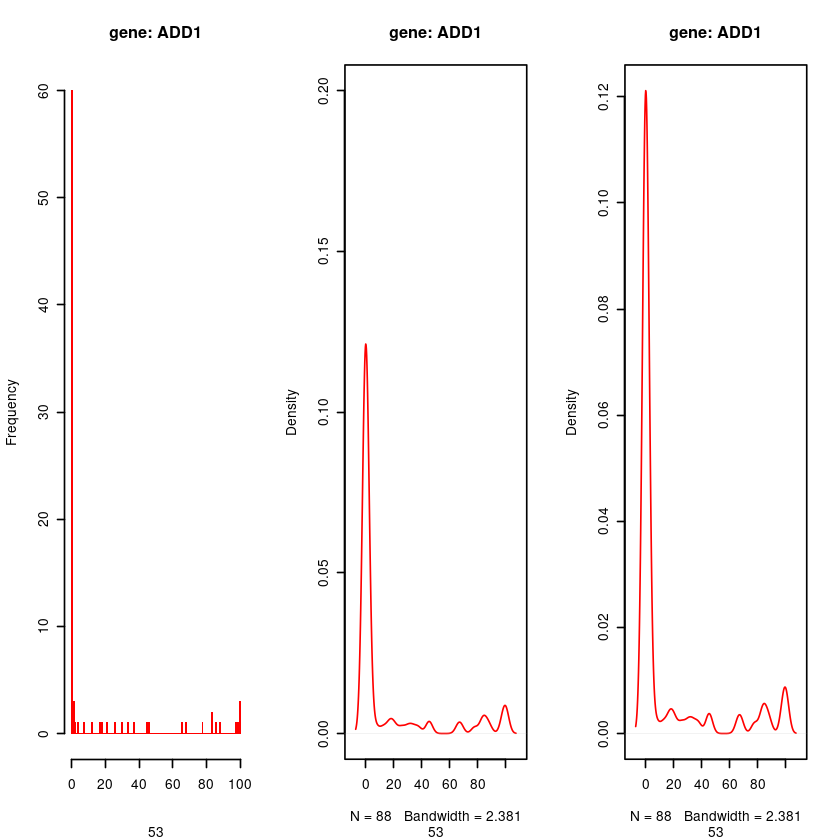

In [37]:
#################
# a gene a line
drawDPAU_distribution_byGene=function(DPAU_, geneSymbol,ymax=18, main="DPAU distribution of genes", 
                                sub="[One line one gene]", showLegend=F){
  
  dataRow1=DPAU_[geneSymbol, which( !is.na(DPAU_[i,]) )];
    
  if( ncol(dataRow1)<1 ){
      printP('All NA, gene=',geneSymbol, '; ncol=',ncol(dataRow1))
      #print(dim(dataRow1) )
      return();
  }
  
  #
  par(mfrow=c(1,3))
  hist( as.numeric(dataRow1), col='red', main=paste("gene:",geneSymbol),xlab="", sub=sub, n=225, border=NA)
  plot(density( as.numeric(dataRow1)  ), col='red', main=paste("gene:",geneSymbol),
     xlim=c(-10,110),ylim=c(0,0.2), sub=sub)
  plot(density( as.numeric(dataRow1)  ), col='red', main=paste("gene:",geneSymbol),
       xlim=c(-10,110), sub=sub)
}

# test
i=51; drawDPAU_distribution_byGene(DPAU, as.character( rownames(DPAU)[i]), sub=i)
i=52; drawDPAU_distribution_byGene(DPAU, as.character( rownames(DPAU)[i]), sub=i)
i=53; drawDPAU_distribution_byGene(DPAU, as.character( rownames(DPAU)[i]), sub=i)

In [38]:
pdf('densityOfGeneDPAU_1m.pdf', width=20,height=4)
for(i in 1:nrow(DPAU)){
    if(i>200){break;}
    drawDPAU_distribution_byGene(DPAU, as.character( rownames(DPAU)[i]), sub=i)
}
dev.off()

png 
  2

## all genes(1 gene 1 line)

In [39]:
color=rgb(255, 0, 0, 25, maxColorValue=255)
drawDPAU_distribution2=function(DPAU_, ymax=18, main="DPAU distribution of genes", 
                                sub="[One line one gene]", showLegend=F){
  # set colors for cell cycles
  #col=c("#F8766D", "#00BFC4")
  #
  dataRow1=DPAU_[1, which( !is.na(DPAU_[1,]) )];
  plot(density( as.numeric(dataRow1) ) , col="white",
       xlab="DPAU", ylim=c(0, ymax), main=main, sub=sub)
  for(i in seq(1,nrow(DPAU_))){
    genename=rownames(DPAU_)[i]
    
    dataRow1=DPAU_[i, which( !is.na(DPAU_[i,]) )];
    
    if(length(dataRow1)<2){
      print( paste(i,genename) )
      next;
    }
    
    lines(density( as.numeric(dataRow1)  ), col=color)
  }
  #
  if(showLegend){
    legend("topleft", legend=c('BC', 'HeLa'), col =col, lty = 1,
           xjust = 0, yjust = 1, x.intersp = 1, y.intersp =1, adj = c(0, 0.5), text.width = NULL,xpd=TRUE)
  }
  print(i)
}

[1] 2082
[1] 2082


png 
  2

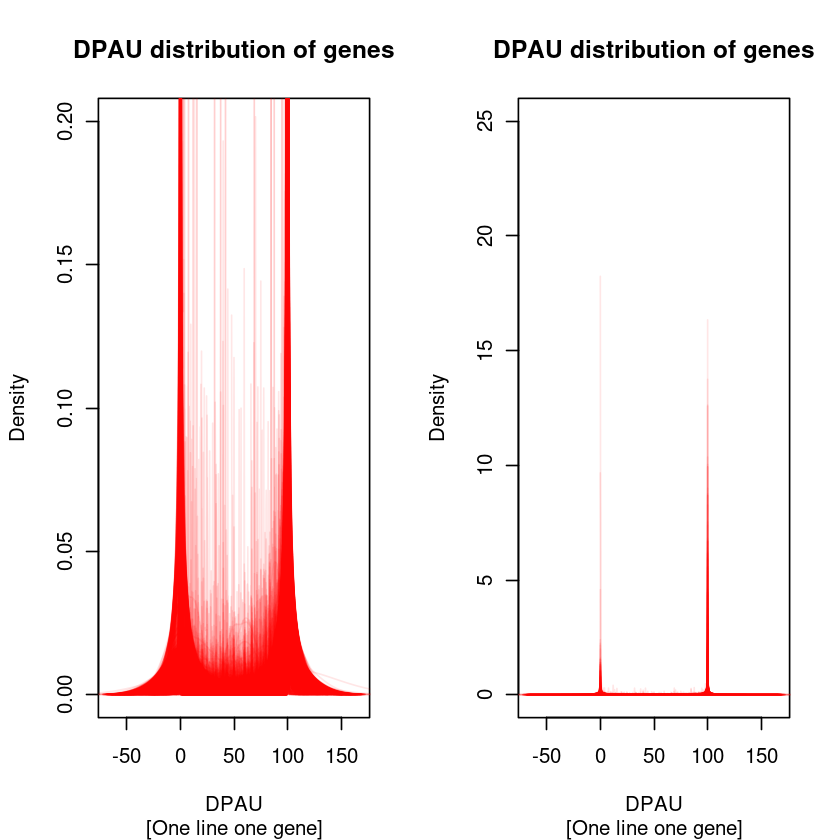

In [40]:
#drawDPAU_distribution2(DPAU)
CairoPDF('densityOf2sites_GeneDPAU_all.pdf', width=10,height=5)
par(mfrow=c(1,2))
drawDPAU_distribution2(DPAU, ymax=0.2)
drawDPAU_distribution2(DPAU, ymax=25)
# drawDPAU_distribution2(DPAU2, ymax=0.5, sub="[One line one gene](remove 100,0)")
dev.off()

## log10 RNA counts V.S. DPAU cell number of each gene

In [41]:
getDF_fromNamesXX=function(namedXX){
  rs=data.frame(
    name=names(namedXX),
    value=as.numeric(namedXX)
  )
  row.names(rs)=rs$name
  rs=rs[order(-rs$value),]
  print(dim(rs))
  print(head(rs))
  return(rs)
}

A1BG-AS1      A2M  A2M-AS1    A2ML1    A2MP1   A4GALT 
    2336      125       36       10      158      131

,gene,counts
,<fct>,<dbl>
A1BG-AS1,A1BG-AS1,2336
A2M,A2M,125
A2M-AS1,A2M-AS1,36
A2ML1,A2ML1,10
A2MP1,A2MP1,158
A4GALT,A4GALT,131


[1] 18679     2

[1] 2082

[1] 2036

[1] 2036    2

,gene,counts
,<fct>,<dbl>
RPL8,RPL8,712259
RPL3,RPL3,542531
RPS23,RPS23,516940
COX4I1,COX4I1,507466
UQCRH,UQCRH,490253
RPLP2,RPLP2,467247


[1] 2036    2
             name value
ALDOA       ALDOA   225
C19orf53 C19orf53   225
COX7A2     COX7A2   225
FTL           FTL   225
MT2A         MT2A   225
MYL6         MYL6   225



FALSE  TRUE 
 2019    17 

,gene,counts,cellNumber
,<fct>,<dbl>,<dbl>
RPL8,RPL8,712259,225
RPL3,RPL3,542531,225
RPS23,RPS23,516940,19
COX4I1,COX4I1,507466,224
UQCRH,UQCRH,490253,224
RPLP2,RPLP2,467247,225


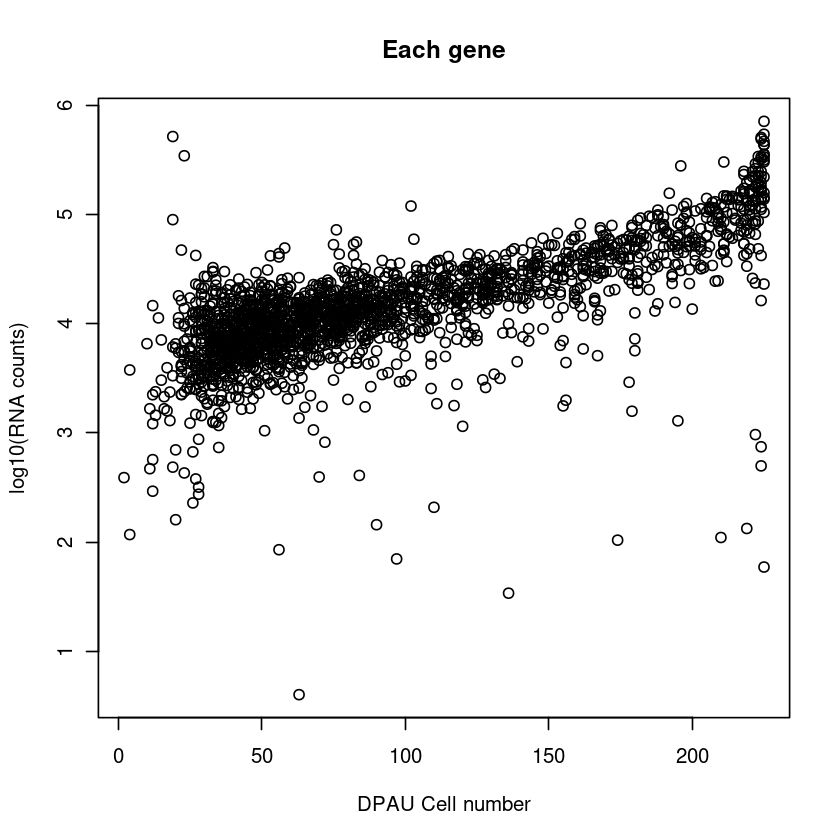

In [42]:
rnaCounts=apply(rnaM, 1, sum)
head(rnaCounts)

rnaCounts_df=data.frame(
  gene=names(rnaCounts),
  counts=as.numeric(rnaCounts)
)
rownames(rnaCounts_df)=rnaCounts_df$gene
head(rnaCounts_df)
dim(rnaCounts_df) #18679     2
#
gene.inDPAU=row.names(DPAU)
length(gene.inDPAU) #2082
# both in the gene set
gene.both=intersect(gene.inDPAU, rownames(rnaCounts_df))
length(gene.both) #2036
#
rnaCounts_df=rnaCounts_df[gene.both,]
rnaCounts_df=rnaCounts_df[order(-rnaCounts_df$counts),]
dim(rnaCounts_df) #2036 2
head(rnaCounts_df)
#
DPAU.both=DPAU[gene.both,]

rs=getDF_fromNamesXX( apply(DPAU.both, 1, function(x){ sum(!is.na(x)) } ) )
table(rs$value==225)

rs=rs[row.names(rnaCounts_df),]
rnaCounts_df$cellNumber=rs$value
head(rnaCounts_df)
plot(rnaCounts_df$cellNumber, log10(rnaCounts_df$counts), xlab="DPAU Cell number", ylab="log10(RNA counts)",
     main="Each gene")

## draw DPAU by RNA counts(drawByGeneBatch)

In [43]:
#
n=length(gene.both)
myColors=colorRampPalette(colors = c('red', 'blue'), interpolate ="linear")( n )

drawByGeneBatch=function(from=1){
  #color=rgb(255, 0, 0, 25, maxColorValue=255)
  geneSymbol=rownames(rnaCounts_df)[1]
  dataRow1=DPAU[geneSymbol, which( !is.na(DPAU[geneSymbol,]) )];
  plot(density( as.numeric(dataRow1) ) , col="white",
    xlim=c(-10, 110),  ylim=c(0,1),   xlab="DPAU", main="one gene one line",sub=paste("from:",from))
  #from=700; 
  to=from+100
  print(paste(from, to))
  
  df=NULL;
  
  for(i in seq(from,to)){
    if(i > nrow(rnaCounts_df)){break;}
    
    geneSymbol=rownames(rnaCounts_df)[i]
    dataRow1=DPAU[geneSymbol, which( !is.na(DPAU[geneSymbol,]) )];
    if(length(dataRow1)<2){
      printP(i, ' ', geneSymbol)
      break;
    }
    lines(density( as.numeric(dataRow1) ) , col=paste0(myColors[i],'22'),
         xlab="DPAU")
    #
  }
}

[1] "0 100"
[1] "0   "


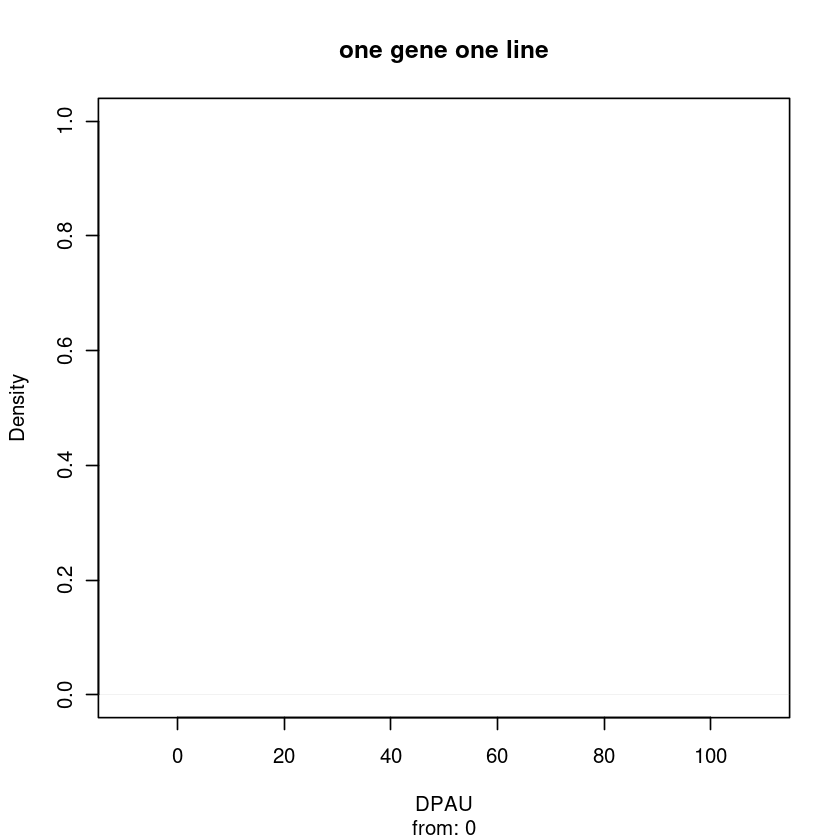

[1] "100 200"


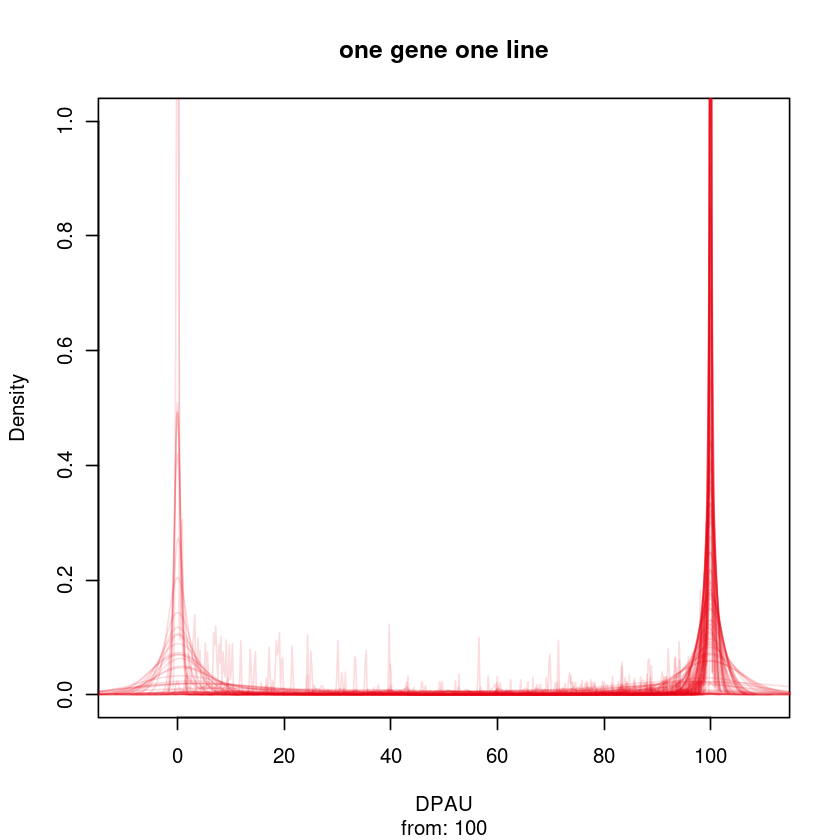

[1] "200 300"


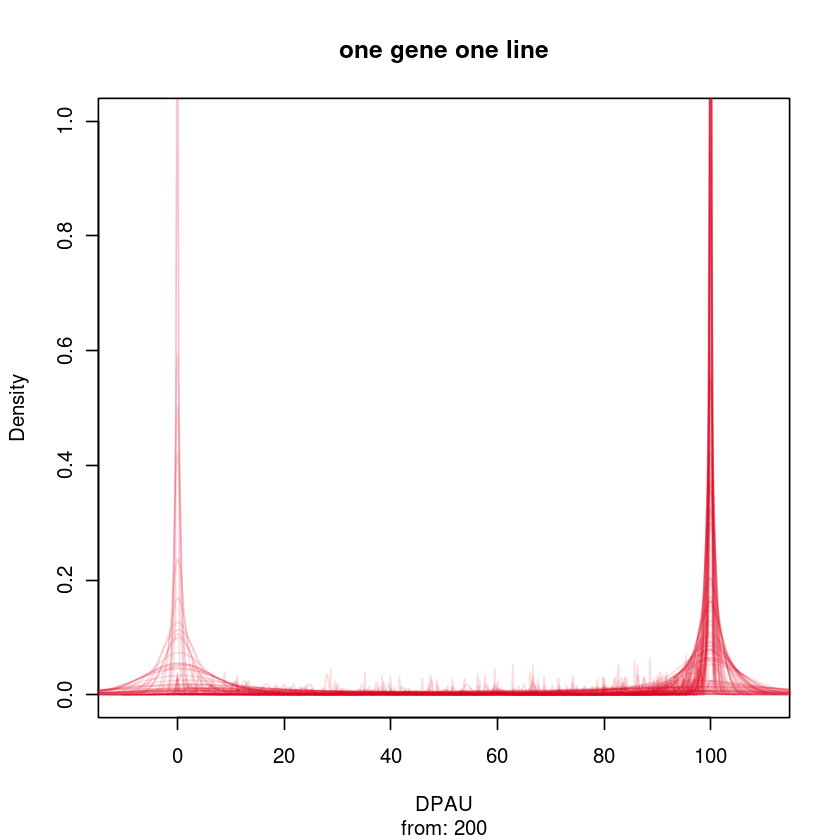

[1] "300 400"


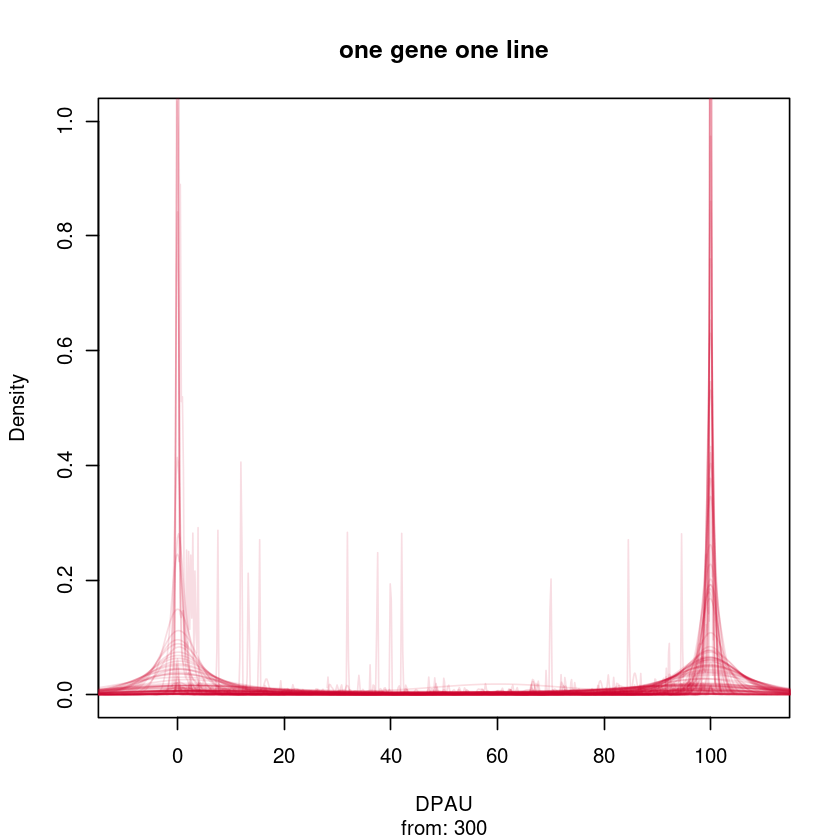

[1] "400 500"


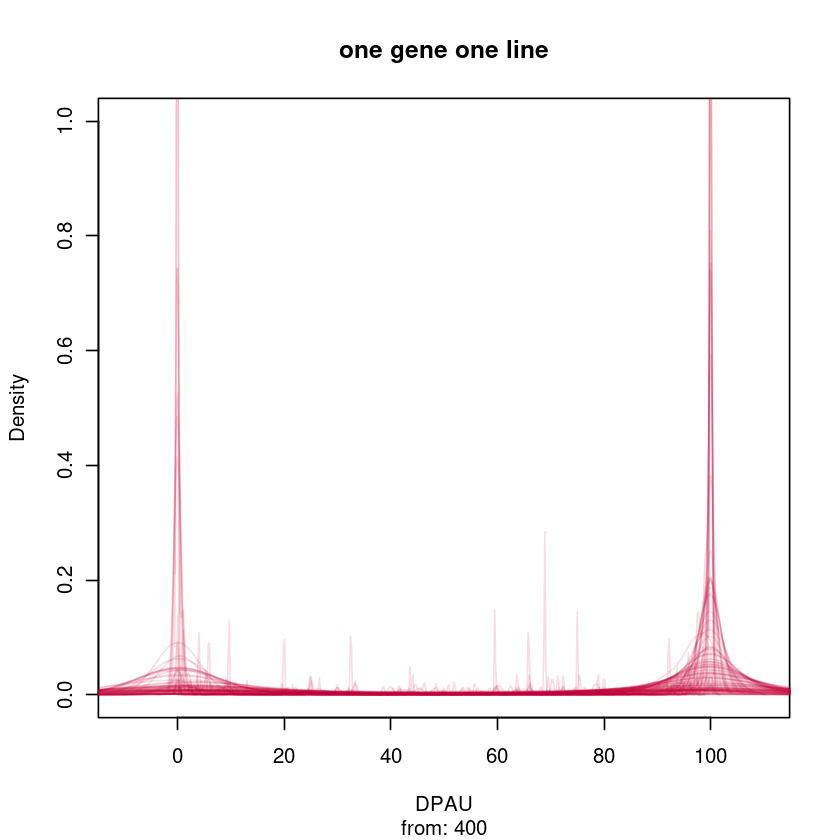

[1] "500 600"


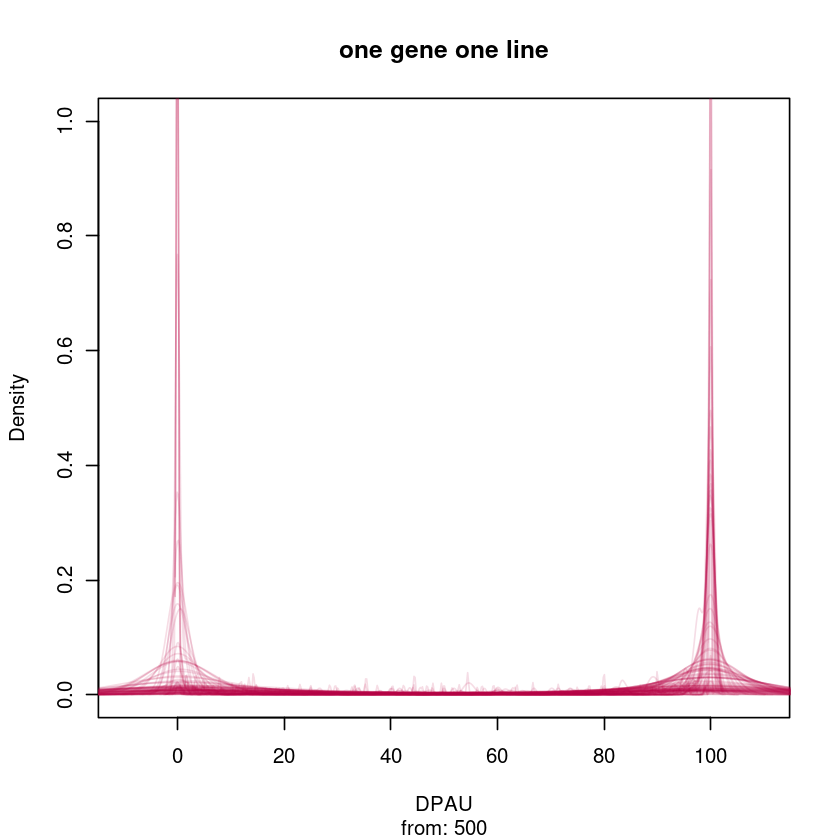

[1] "600 700"


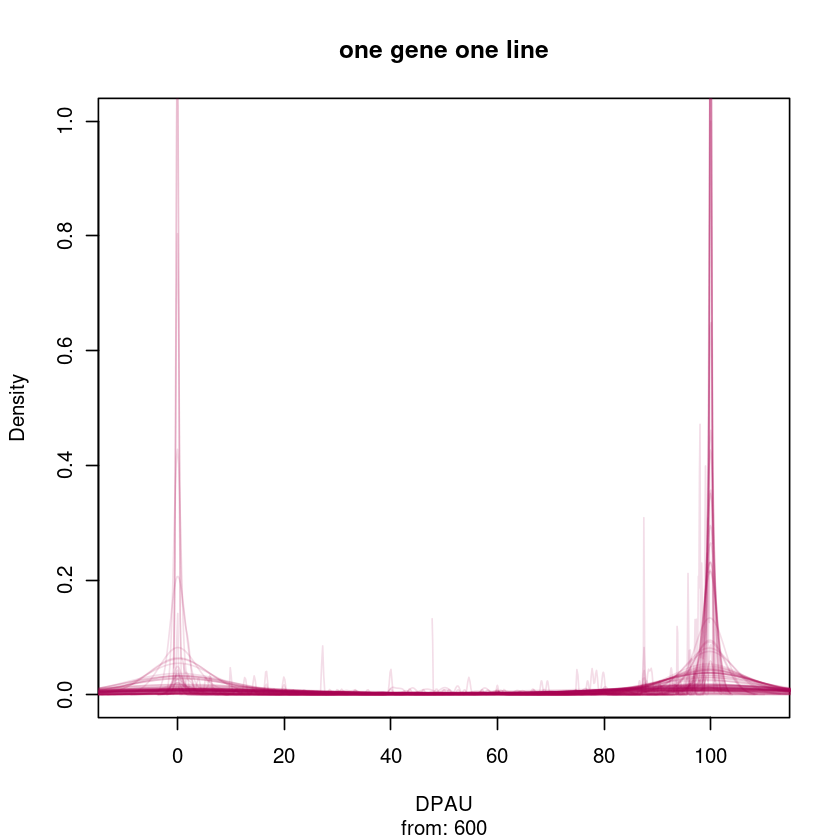

[1] "700 800"


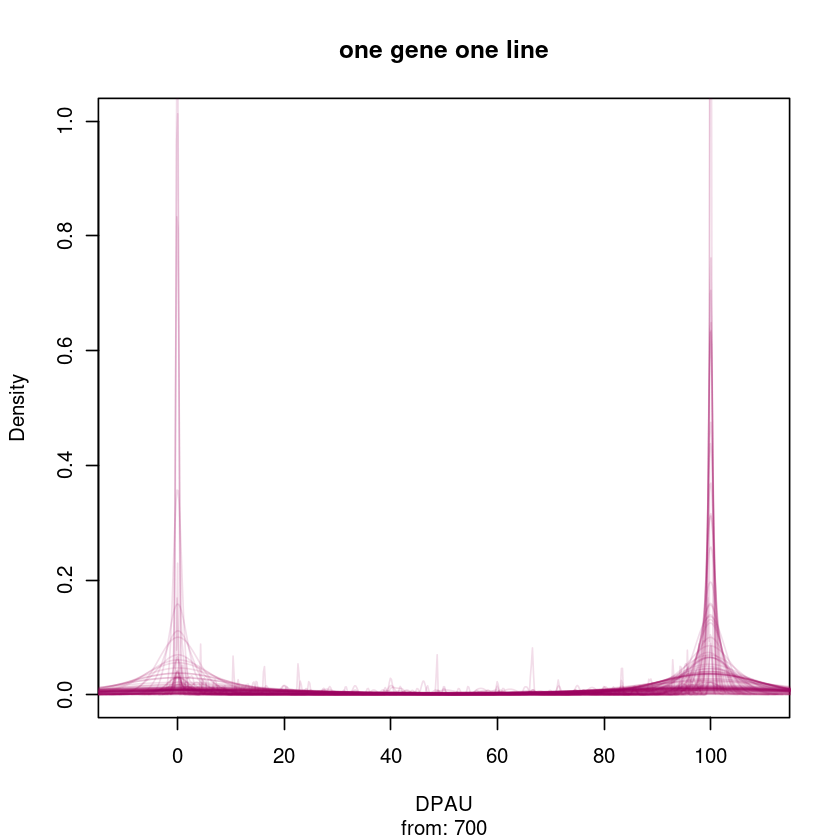

[1] "800 900"


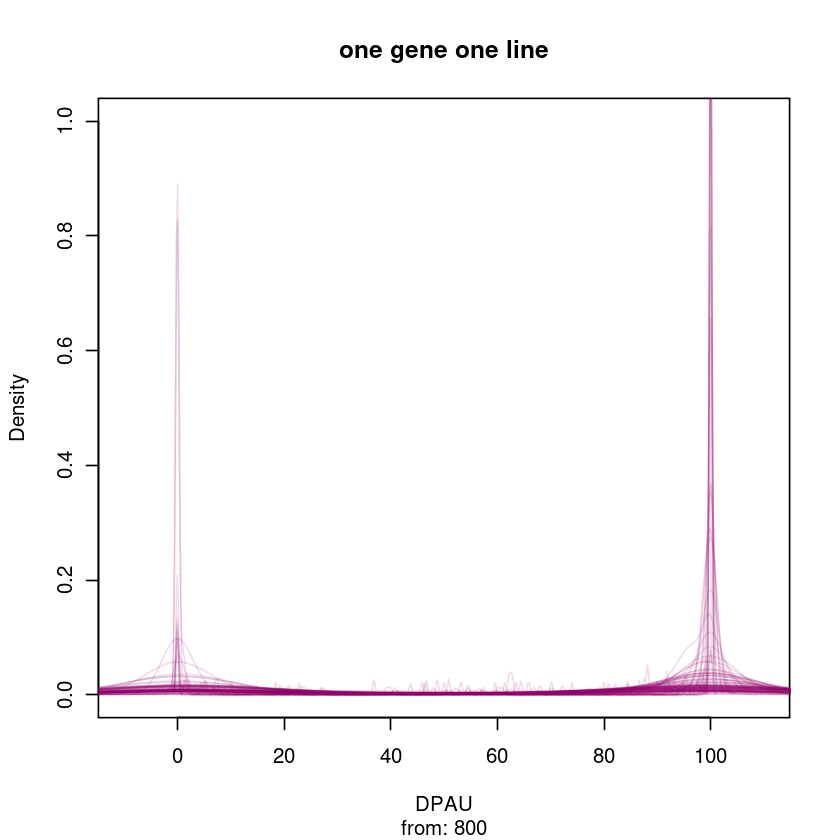

[1] "900 1000"


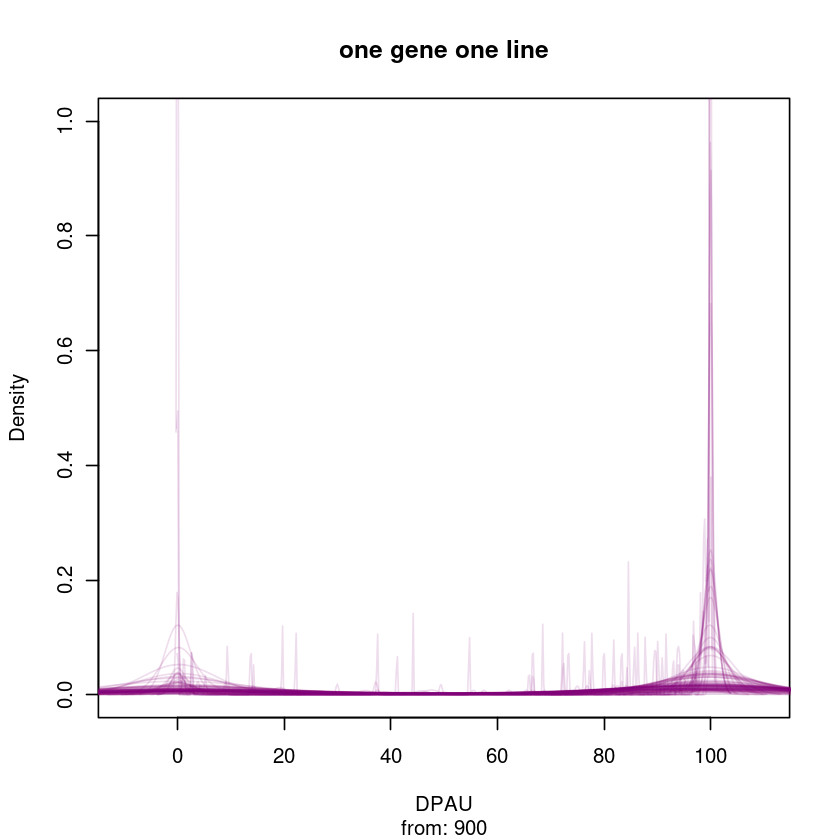

[1] "1000 1100"


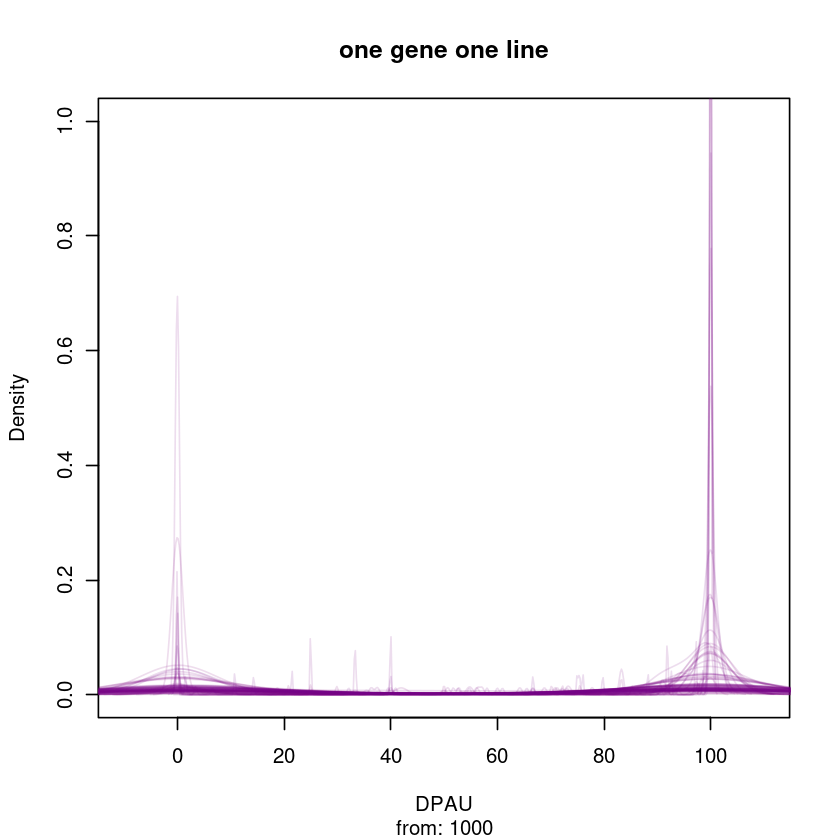

[1] "1100 1200"


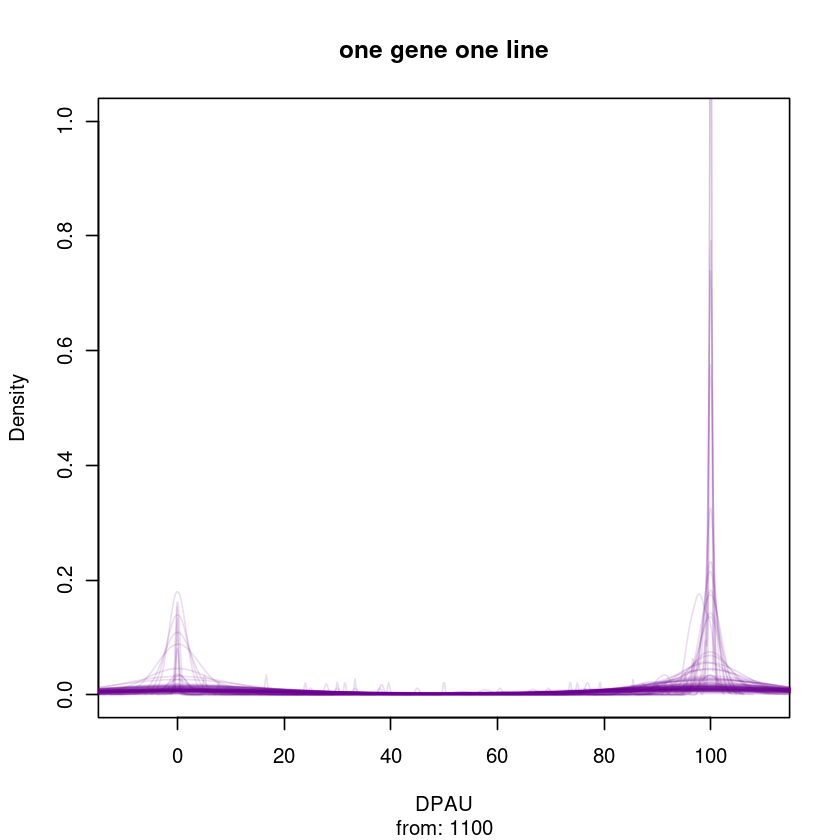

[1] "1200 1300"


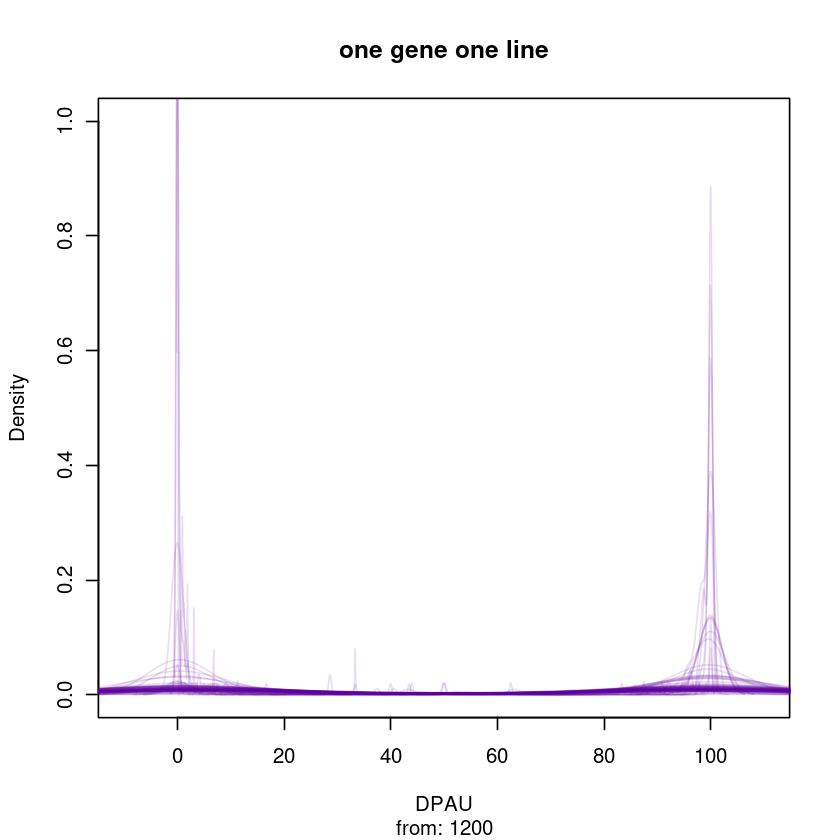

[1] "1300 1400"


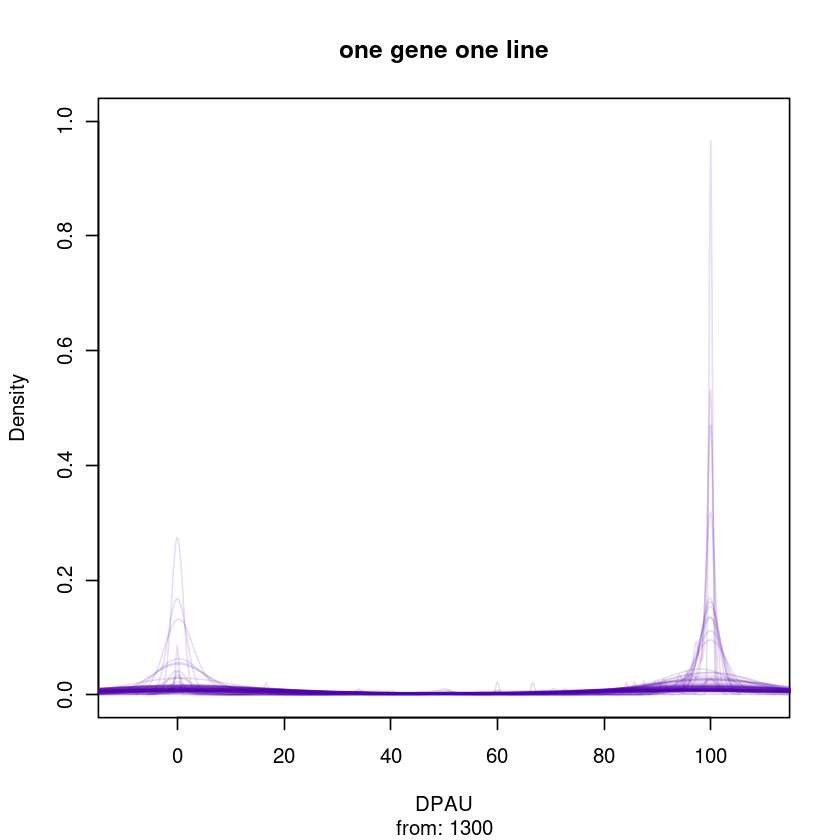

[1] "1400 1500"


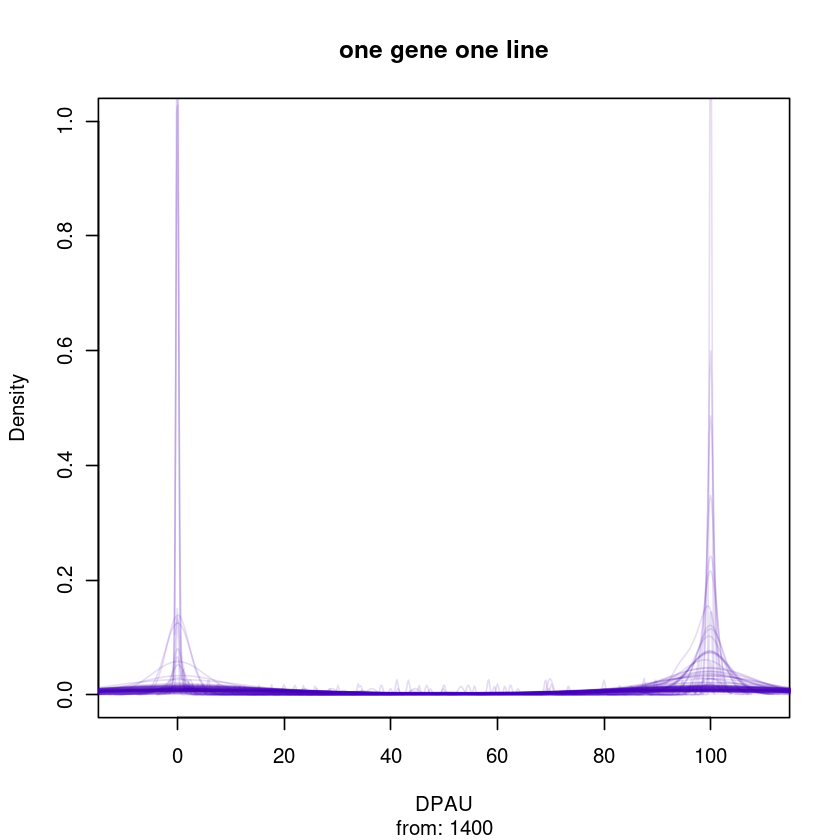

[1] "1500 1600"


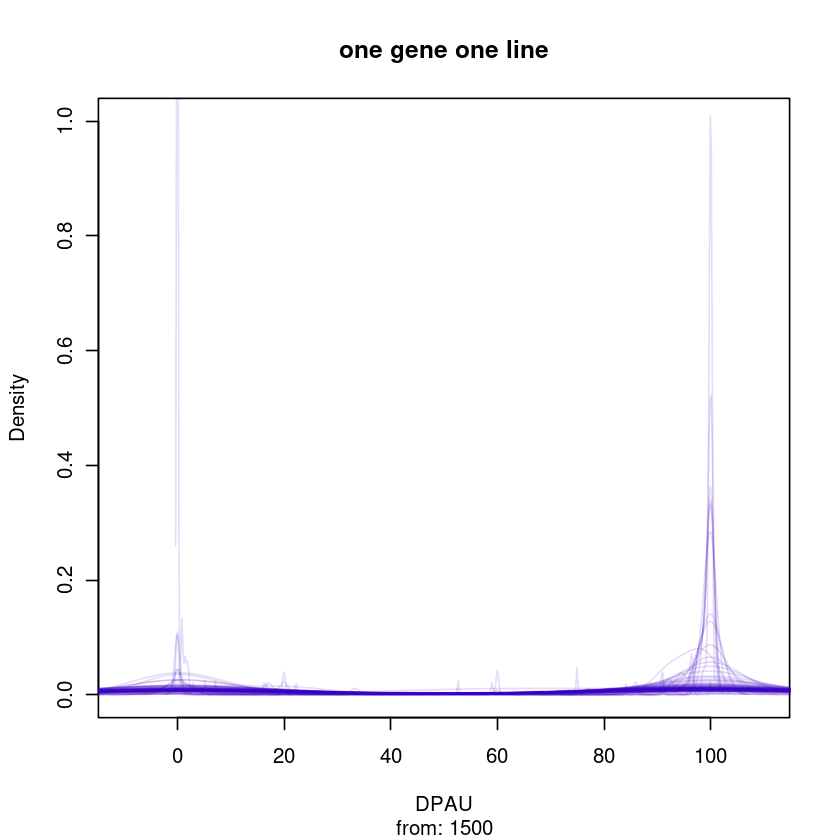

[1] "1600 1700"


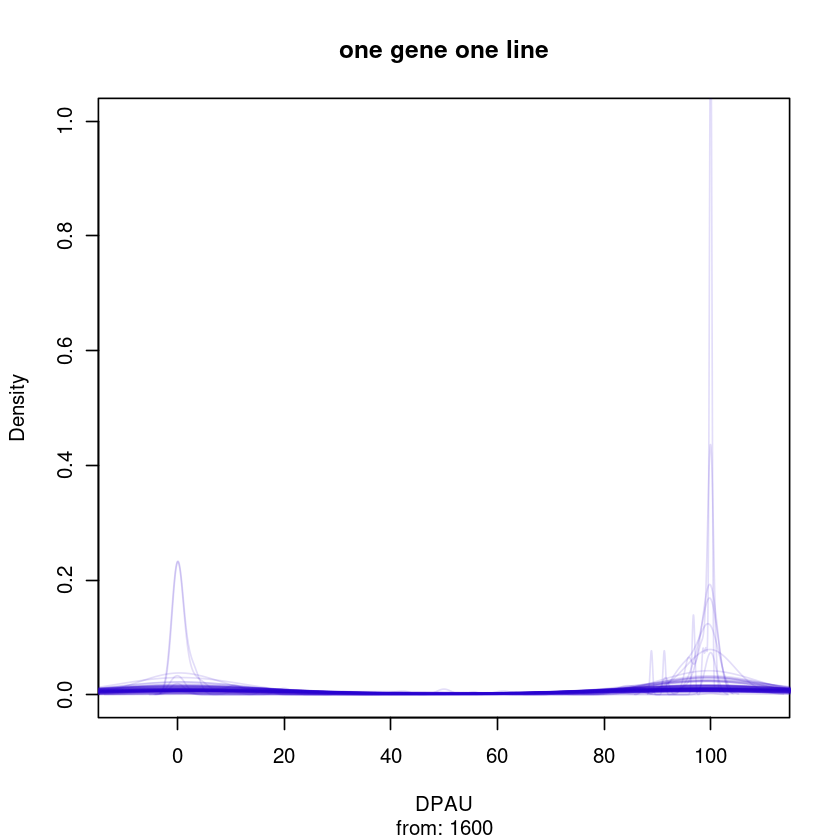

[1] "1700 1800"


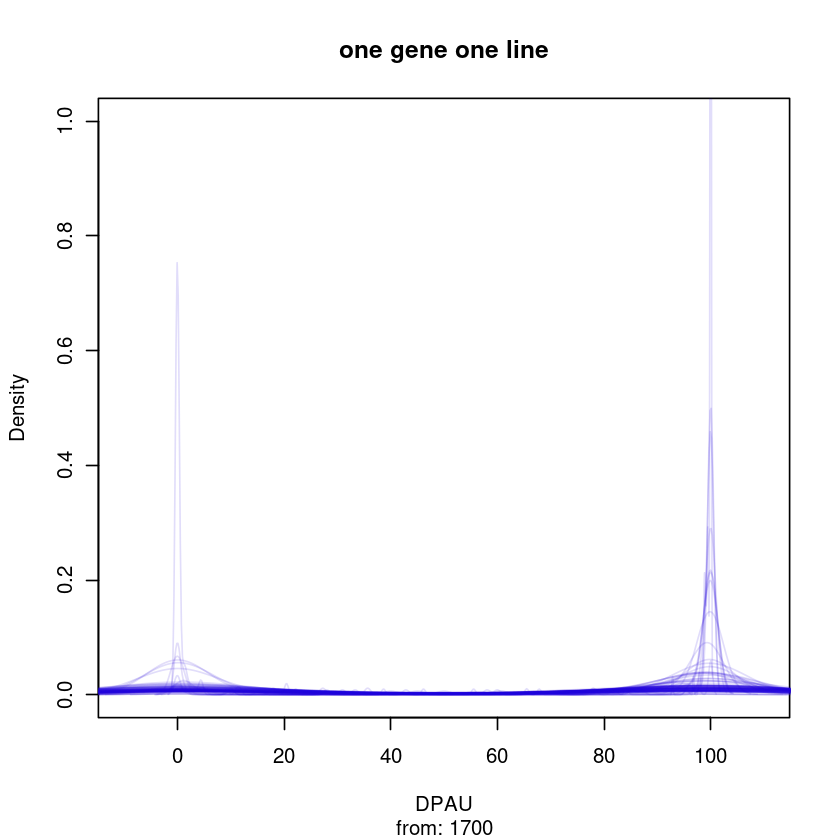

[1] "1800 1900"


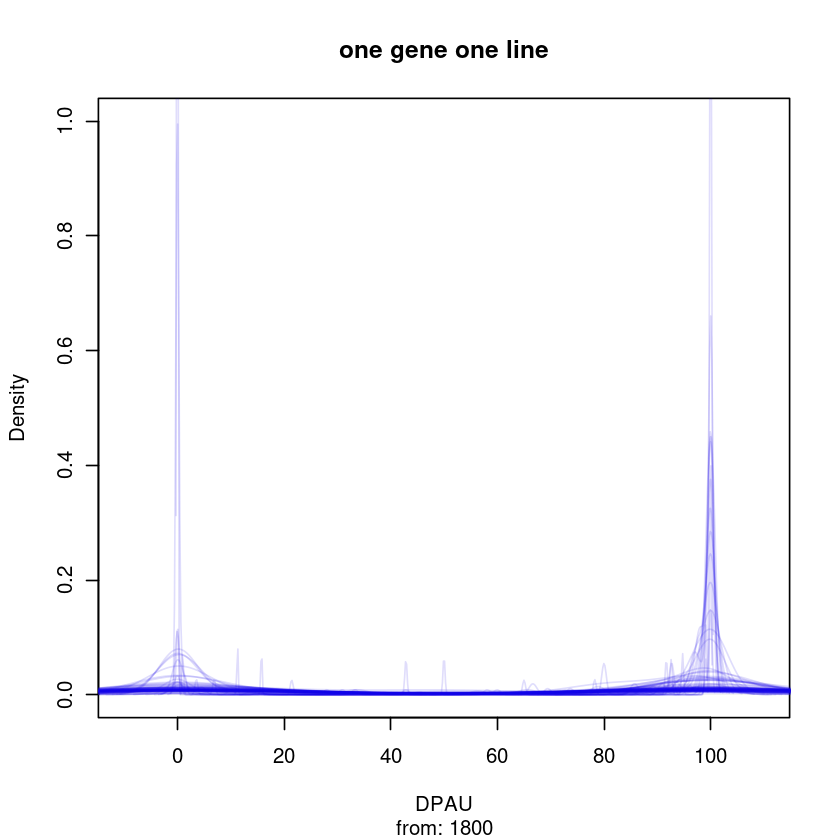

[1] "1900 2000"


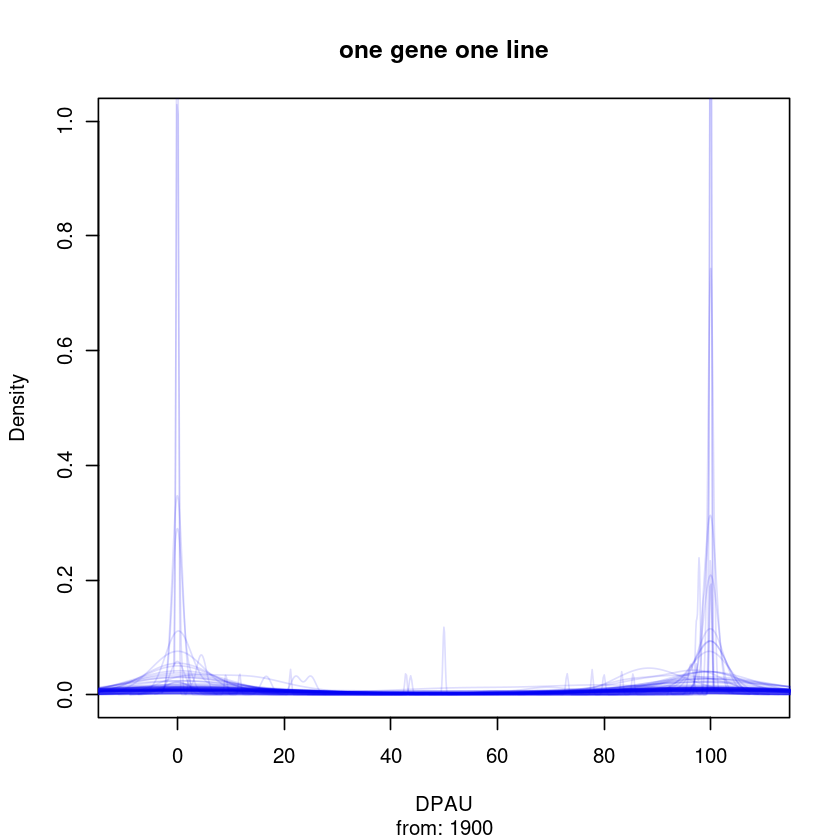

In [44]:
j=0
while(j< (nrow(rnaCounts_df) -100) ){
  drawByGeneBatch(j)
  #Sys.sleep(2)
  j=j+100
}

# get each gene's non-NA cell number, mean and sd of DPAU

In [45]:
dim(rnaCounts_df)
head(rnaCounts_df)

[1] 2036    3

,gene,counts,cellNumber
,<fct>,<dbl>,<dbl>
RPL8,RPL8,712259,225
RPL3,RPL3,542531,225
RPS23,RPS23,516940,19
COX4I1,COX4I1,507466,224
UQCRH,UQCRH,490253,224
RPLP2,RPLP2,467247,225


[1] 2036    4

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266
RPL3,RPL3,225,99.73653,0.9470744
RPS23,RPS23,19,82.75423,36.9176673
COX4I1,COX4I1,224,99.84831,1.0692406
UQCRH,UQCRH,224,99.50125,2.0955387
RPLP2,RPLP2,225,99.61910,1.4710506


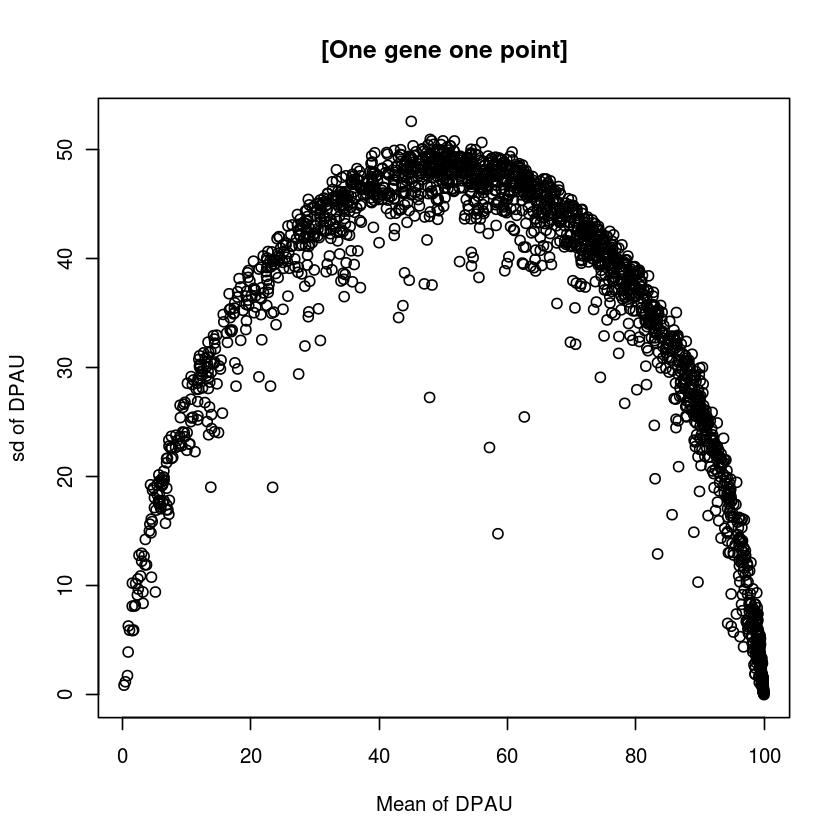

In [46]:
####
##get each gene's non-NA cell number, mean, sd of DPAU
rsDF=NULL

for(i in 1:nrow(rnaCounts_df)){
  #if(i>10){break;}
  geneSymbol=rownames(rnaCounts_df)[i]
  #printP(i, ' ', geneSymbol)

  dataRow1=DPAU[geneSymbol, which( !is.na(DPAU[geneSymbol,]) )];
  tmp=as.numeric(dataRow1)

  if(length(tmp)<2){
    printP(i, ' ', geneSymbol)
    next;
  }
  #
  
  tmpDF=data.frame(
    gene=geneSymbol,
    DPAUcellNumber=length(tmp),
    meanDPAU=mean(tmp),
    sdDPAU=sd(tmp)
  )
  rsDF=rbind(rsDF, tmpDF)
} #10seconds
#
rownames(rsDF)=rsDF$gene
dim(rsDF) #2036 4
head(rsDF)
#    gene cellNumber meanDPAU     sdDPAU
#1   RPL8        225 99.86553  0.3462266
#2   RPL3        225 99.73653  0.9470744
#3  RPS23         19 82.75423 36.9176673
#View(rsDF)
#
plot(rsDF$mean, rsDF$sd, xlab="Mean of DPAU", ylab="sd of DPAU", main="[One gene one point]" )
#

## diff of 2 hist plot(cell number per gene): non diff

png 
  2

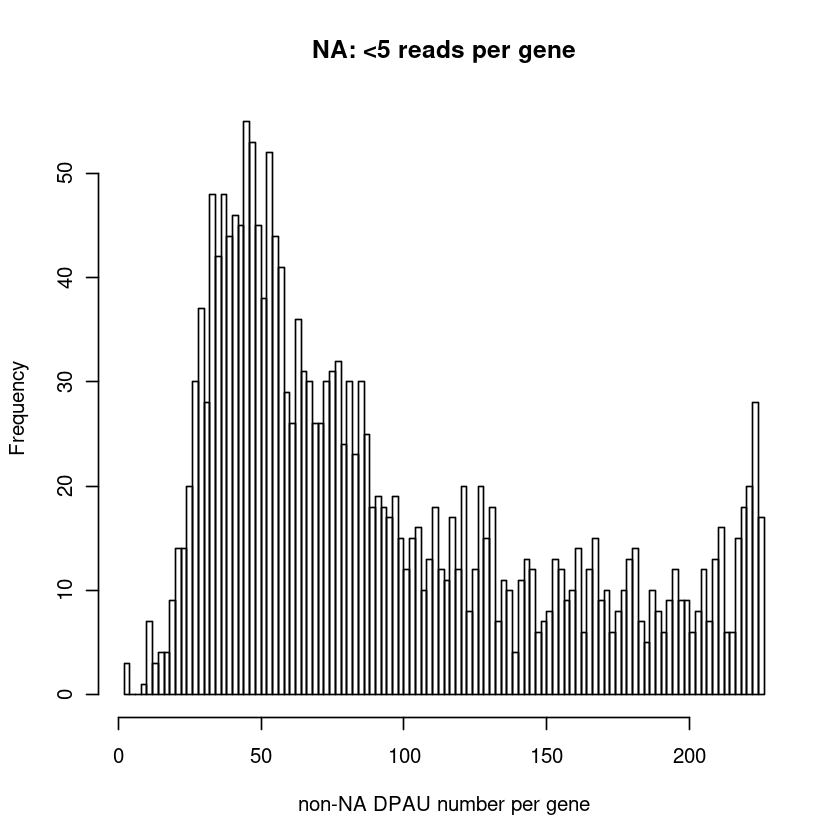

In [47]:
pdf('6_1_cellNumberPerGene.pdf', width=5, height=3)
hist(rsDF$DPAUcellNumber, n=100, xlab="non-NA DPAU number per gene", main=paste0("NA: <",readThreshold," reads per gene") )
dev.off()

hist(rsDF$DPAUcellNumber, n=100, xlab="non-NA DPAU number per gene", main=paste0("NA: <",readThreshold," reads per gene") )

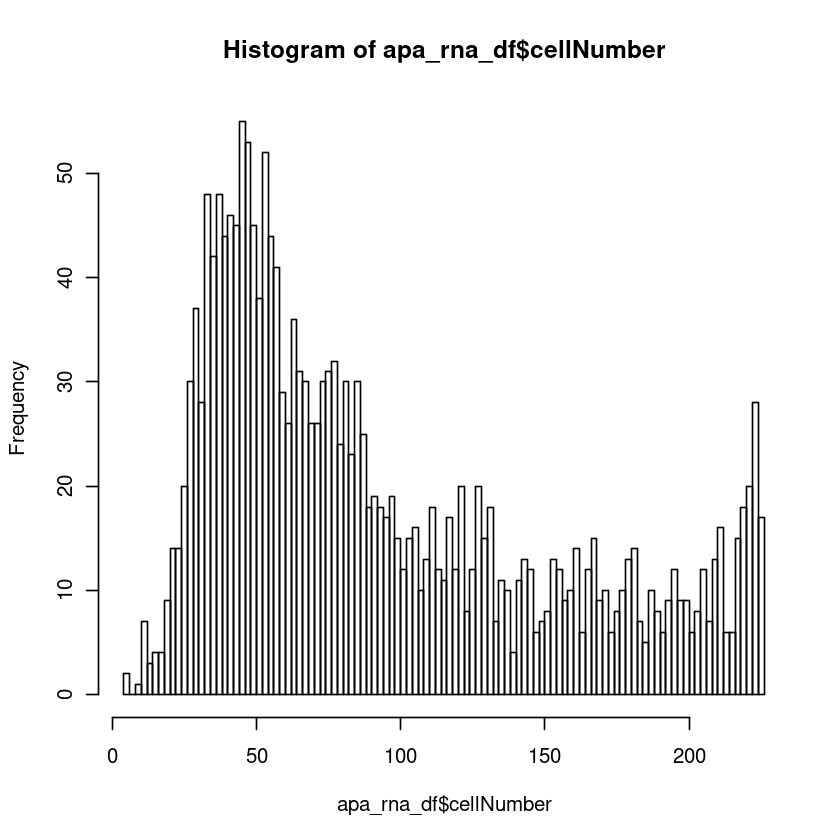

In [48]:
hist(apa_rna_df$cellNumber, n=100)

In [49]:
dim(rsDF)
head(rsDF)

[1] 2036    4

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266
RPL3,RPL3,225,99.73653,0.9470744
RPS23,RPS23,19,82.75423,36.9176673
COX4I1,COX4I1,224,99.84831,1.0692406
UQCRH,UQCRH,224,99.50125,2.0955387
RPLP2,RPLP2,225,99.61910,1.4710506


In [50]:
dim(apa_rna_df)
head(apa_rna_df)

[1] 2035    7

,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,AARD,28,2463,1714,0.03621516,0.8548330,0.9782914
2,AARS,114,10919,12588,-0.04320100,0.6481094,0.9658319
3,AASDHPPT,76,4225,2931,0.15448253,0.1827150,0.9658319
4,AATF,188,19210,13692,0.06393673,0.3833711,0.9658319
5,ABCB7,116,6475,699,-0.10824427,0.2474346,0.9658319
6,ABCC5,40,2528,0,NA,NA,NA


In [51]:
g0inter=intersect(row.names(rsDF), apa_rna_df$gene)
length(g0inter)

[1] 2035

In [52]:
head(rsDF)
head(apa_rna_df[match(g0inter,apa_rna_df$gene), ])

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266
RPL3,RPL3,225,99.73653,0.9470744
RPS23,RPS23,19,82.75423,36.9176673
COX4I1,COX4I1,224,99.84831,1.0692406
UQCRH,UQCRH,224,99.50125,2.0955387
RPLP2,RPLP2,225,99.61910,1.4710506


,gene,cellNumber,apaCount,rnaCount,correlation,pvalue,adj.p
,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1466,RPL8,225,295066,15247,0.00905728,0.8925287,0.9818848
1462,RPL3,225,127195,352,0.00888664,0.8945416,0.9829616
1474,RPS23,19,769,7,0.11312343,0.6447247,0.9658319
382,COX4I1,224,232044,153,0.04087243,0.5428198,0.9658319
1923,UQCRH,224,179070,8386,0.05762289,0.3907219,0.9658319
1468,RPLP2,225,315043,174444,0.08506516,0.2036661,0.9658319


In [53]:
##共有基因的cellNumber完全相等。
table(apa_rna_df[match(g0inter,apa_rna_df$gene), ]$cellNumber - rsDF[match(g0inter, rsDF$gene),]$DPAUcellNumber) 


   0 
2035 

In [54]:
#不共有的基因是哪些？
rsDF[-match(g0inter,rsDF$gene), ]

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
MTCYBP35,MTCYBP35,2,25,35.35534


## add RNA read counts for each genes

In [ ]:
###
# add RNA read counts for each genes
dim(rnaM) #18679 225
rnaM[1:10,1:10]
#
countsPerGene=getDF_fromNamesXX( apply(rnaM, 1, sum)  )
countsPerGene2=countsPerGene[rownames(rsDF), ]
dim(countsPerGene2) #2036 2
head(countsPerGene2)
rsDF$RNACounts=countsPerGene2$value
head(rsDF)
#        gene DPAUcellNumber meanDPAU     sdDPAU RNACounts
#RPL8     RPL8        225 99.86553  0.3462266    712259
#RPL3     RPL3        225 99.73653  0.9470744    542531

In [56]:
#save to file
write.table(rsDF,'6_2_gene_DPAUcellNumber_meanDPAU_sdDPAU_RNACounts.txt')

null device 
          1

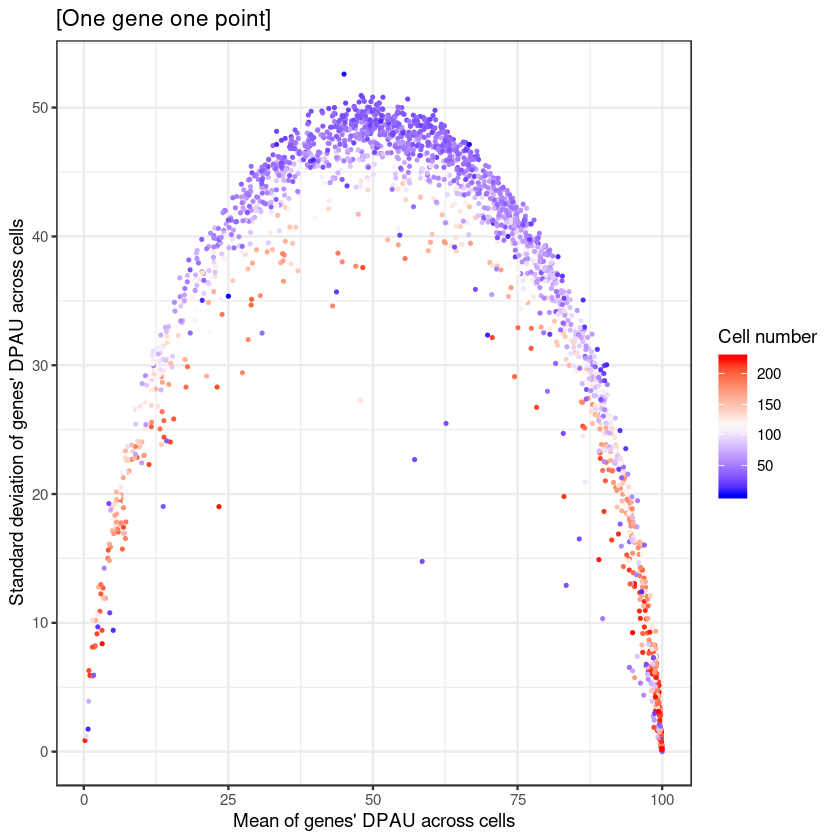

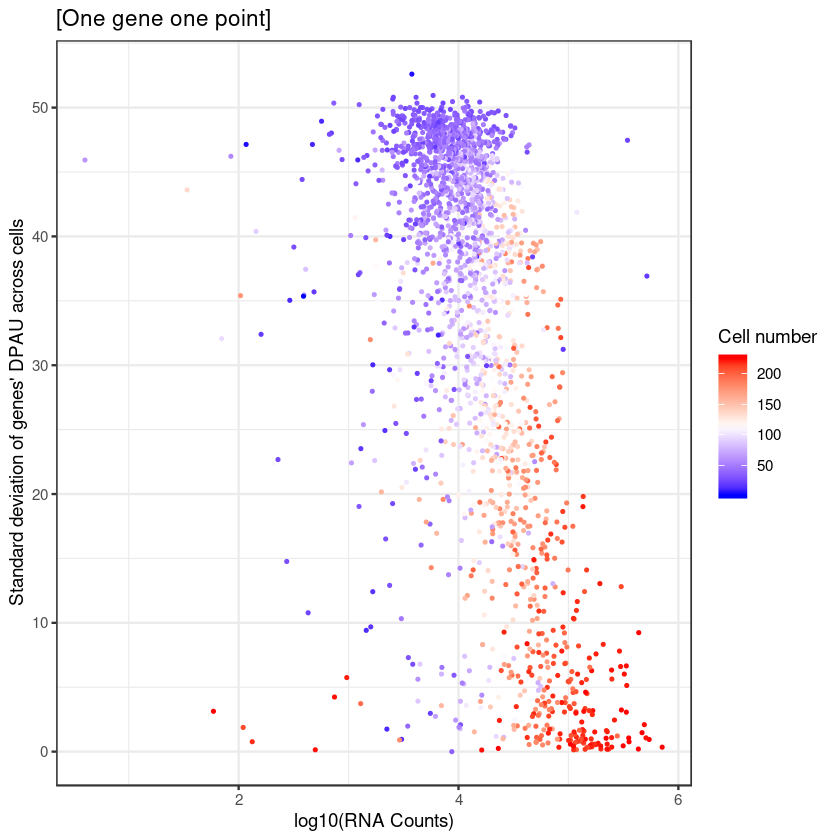

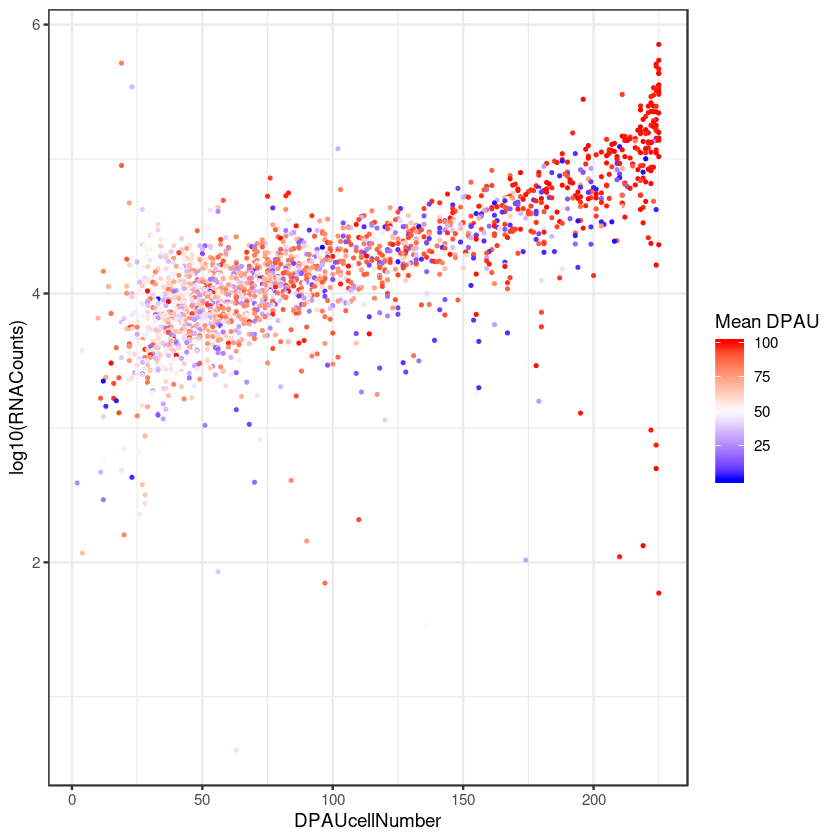

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts
,<fct>,<int>,<dbl>,<dbl>,<dbl>
NCAPD3,NCAPD3,71,49.92086,46.94474,12575
KIF1B,KIF1B,48,49.81644,48.19043,11194
FRMD4A,FRMD4A,30,49.95098,50.80559,10865
NUDT15,NUDT15,34,49.90409,48.90416,5919
PIGW,PIGW,27,49.83715,49.73616,4309


[1] 71


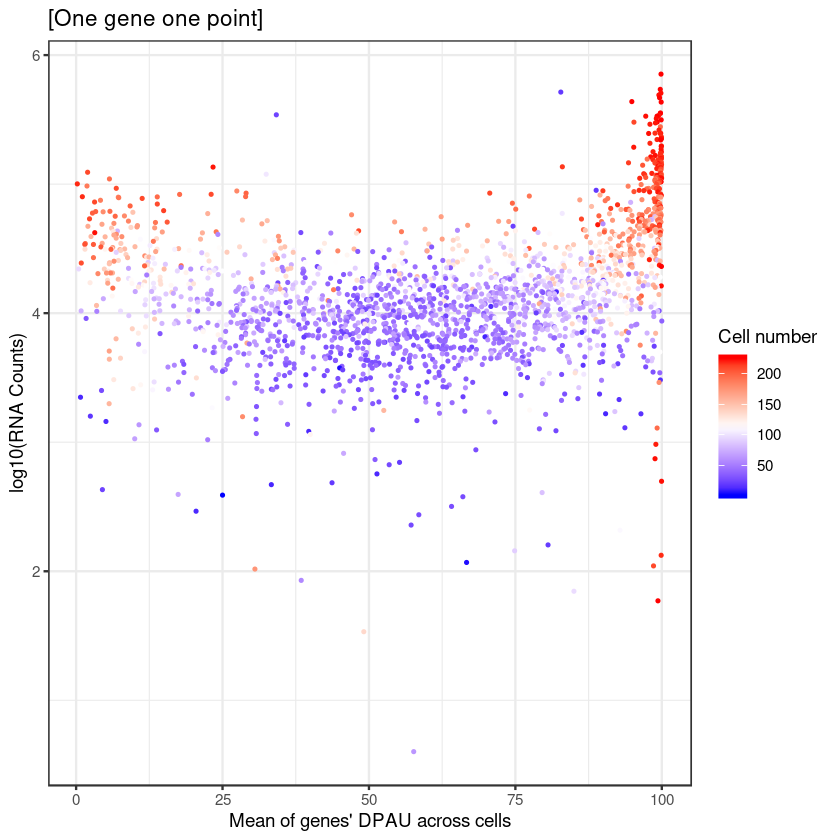

[1] 48


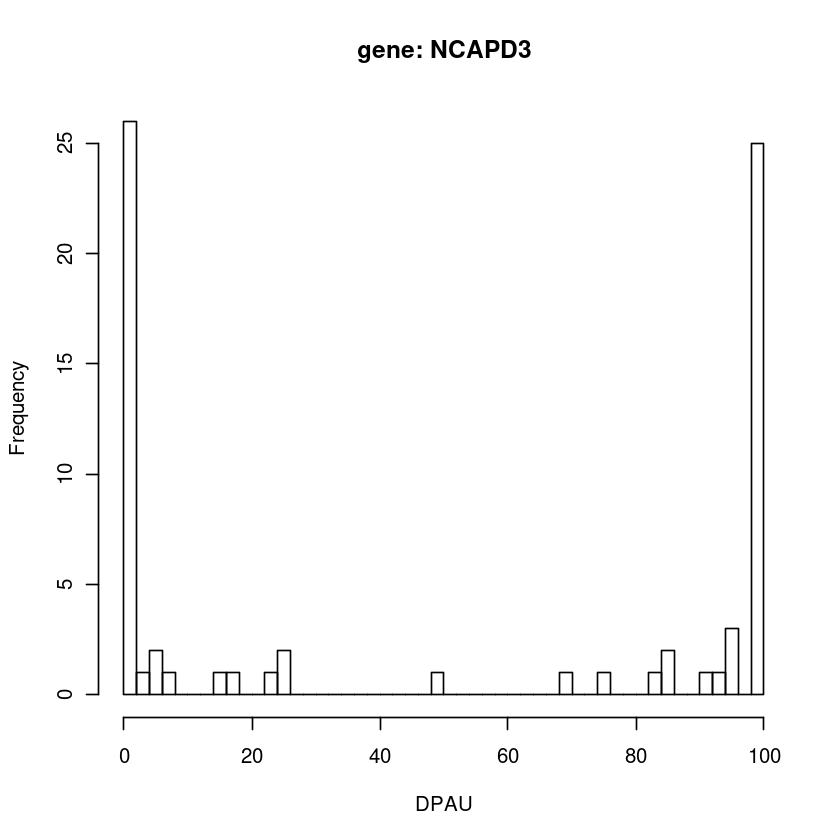

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts
,<fct>,<int>,<dbl>,<dbl>,<dbl>
NDUFB10,NDUFB10,220,0.2063000,0.8676502,100433
PHPT1,PHPT1,208,0.8826638,6.2961254,24472
FAM83D,FAM83D,96,0.4268724,1.1819498,22004
ITPR3,ITPR3,76,0.8546729,3.9111653,10413
HSP90AB3P,HSP90AB3P,12,0.7491582,1.7497892,2231


[1] 220


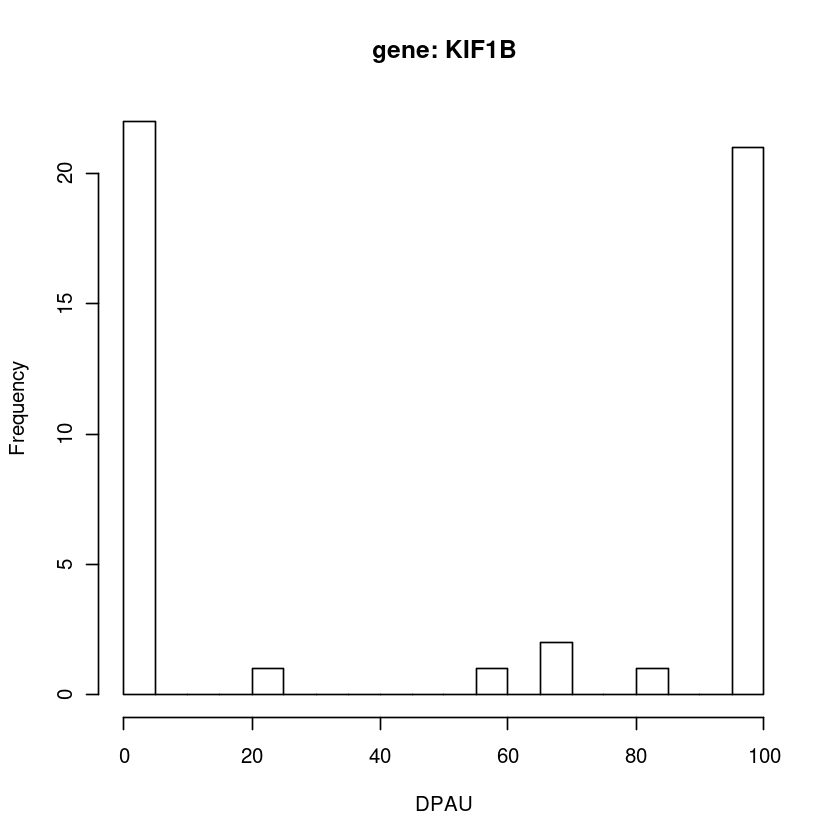

[1] 208


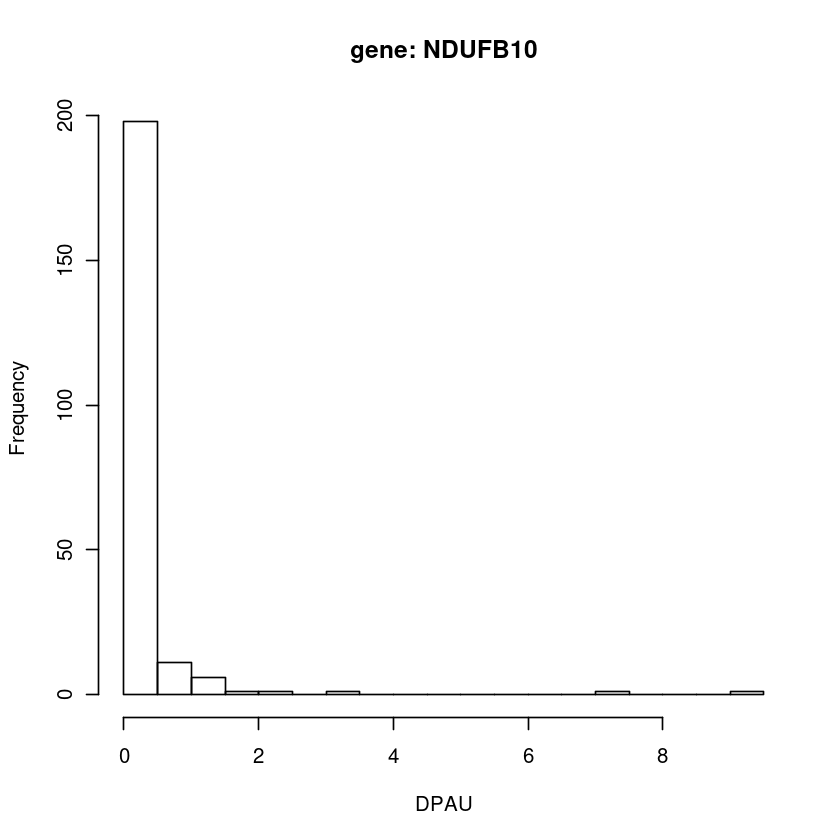

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts
,<fct>,<int>,<dbl>,<dbl>,<dbl>
UBC,UBC,218,99.94200,0.1927225,231936
RPL7,RPL7,224,99.91167,0.1930817,224372
ATP5MC1,ATP5MC1,219,99.94048,0.2047534,197375
PRDX5,PRDX5,224,99.90110,0.4383733,196489
ATP5MD,ATP5MD,224,99.92346,0.5472899,177676
NDUFA12,NDUFA12,217,99.93320,0.3789288,163932
KRT10,KRT10,211,99.92035,0.3315153,147903
PSMB5,PSMB5,216,99.95245,0.1830691,141708
S100A9,S100A9,197,99.94883,0.1557279,118384


[1] 218


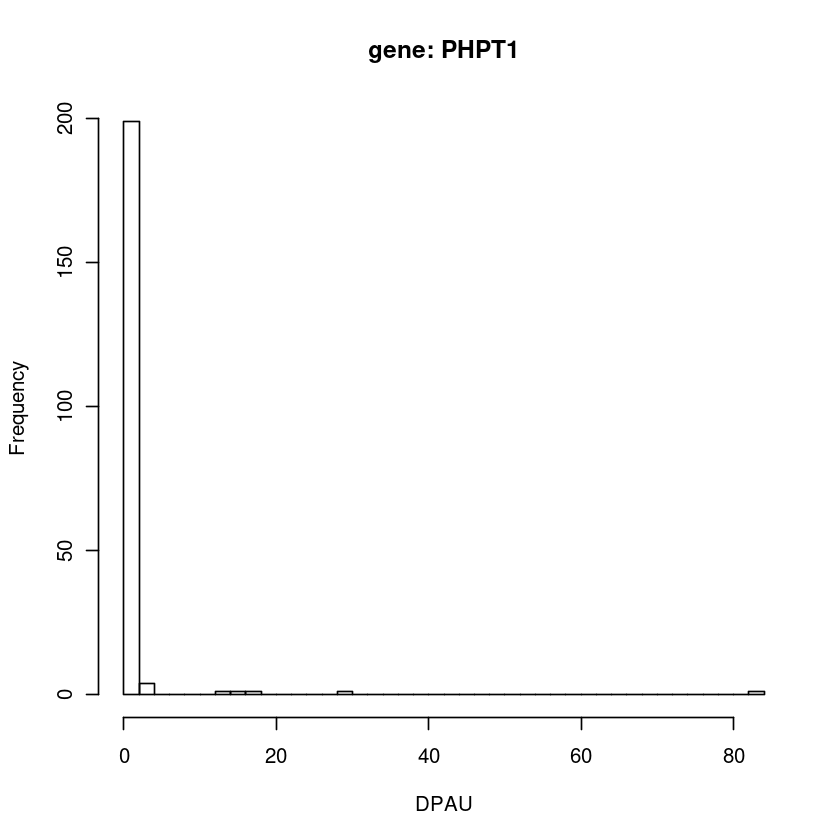

[1] 224


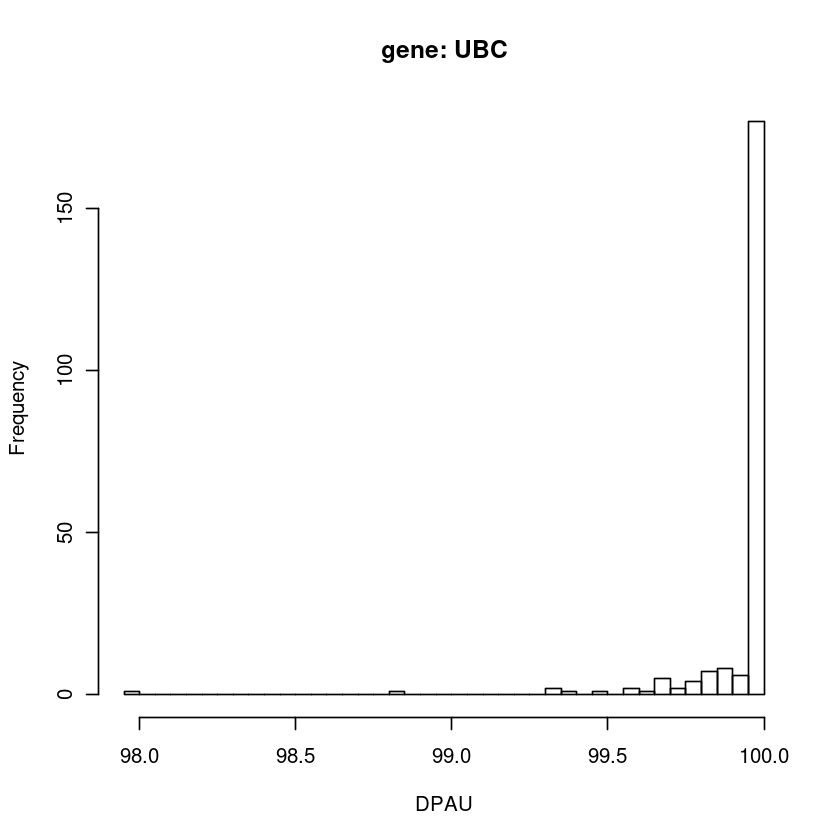

null device 
          1

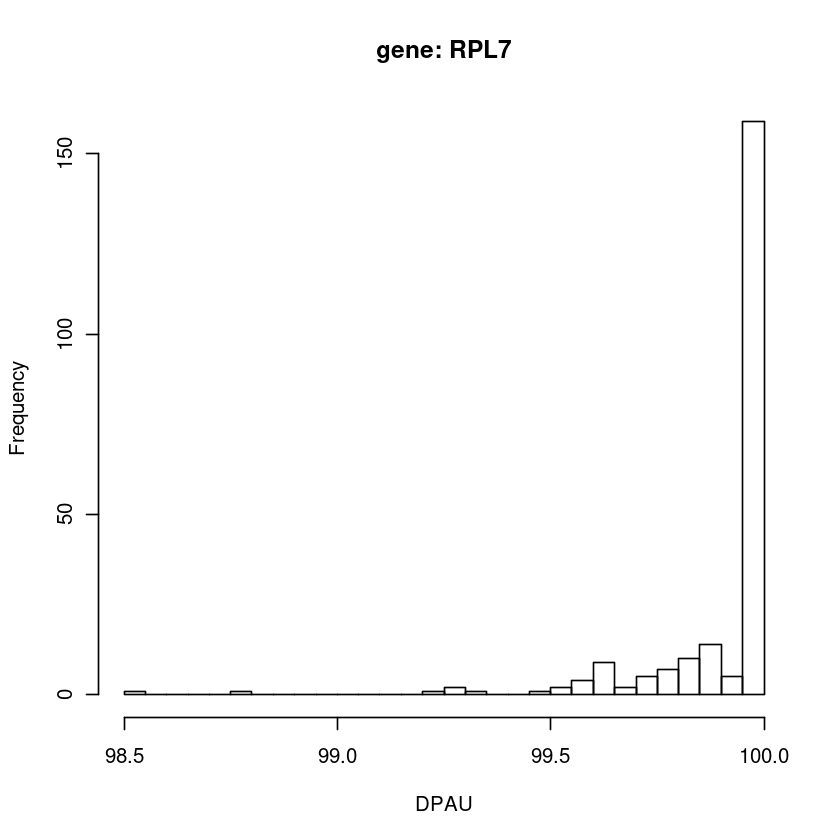

In [174]:
dev.off()
CairoPDF("6_2_gene_DPAUcellNumber_meanDPAU_sdDPAU_RNACounts.pdf", width=5, height=4)
ggplot(rsDF, aes(meanDPAU, sdDPAU, color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", title="[One gene one point]")+
  theme_bw()
##小结: 
#
ggplot(rsDF, aes(log10(RNACounts), sdDPAU, color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="log10(RNA Counts)", y="Standard deviation of genes' DPAU across cells", title="[One gene one point]")+
  theme_bw()
#
ggplot(rsDF, aes(DPAUcellNumber,log10(RNACounts), color=meanDPAU))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Mean DPAU', colours=c('blue', 'white', 'red') )+
  #labs(x="Mean of genes' DPAU across cells",y="log10(RNA Counts)", title="[One gene one point]")+
  theme_bw()
#
ggplot(rsDF, aes(meanDPAU,log10(RNACounts), color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="Mean of genes' DPAU across cells",y="log10(RNA Counts)", title="[One gene one point]")+
  theme_bw()

# hist plot of a gene's DPAU
plotDPAU_hist_byGene=function(gene, n=0){
  tmp=as.numeric(DPAU[gene, !is.na(DPAU[gene,])])
  print(length(tmp))
  if(n==0)n=length(tmp);
  hist( tmp, n=n, xlab="DPAU", main=paste('gene:',gene) )
}

## gene's mean DPAU around 50
rsDF[which(rsDF$mean>49.8 & rsDF$mean<50),]
plotDPAU_hist_byGene('NCAPD3', 50)
plotDPAU_hist_byGene('KIF1B', 30)
#hist( as.numeric(DPAU['NCAPD3', !is.na(DPAU['NCAPD3',])]), n=20 )
#
## gene's mean DPAU around 0
rsDF[which(rsDF$mean>0 & rsDF$mean<1),]
plotDPAU_hist_byGene('NDUFB10', 30)
plotDPAU_hist_byGene('PHPT1', 30)
#
## gene's mean DPAU around 100
rsDF[which(rsDF$mean>99.9 & rsDF$mean<100),]
plotDPAU_hist_byGene('UBC', 30)
plotDPAU_hist_byGene('RPL7', 30)
#
dev.off()

## mean DPAU per gene V.S. gene readCounts

[1] 2036

[1] 2036    4

,gene,counts,cellNumber,meanDPAU
,<fct>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,712259,225,99.86553
RPL3,RPL3,542531,225,99.73653
RPS23,RPS23,516940,19,82.75423
COX4I1,COX4I1,507466,224,99.84831
UQCRH,UQCRH,490253,224,99.50125
RPLP2,RPLP2,467247,225,99.61910


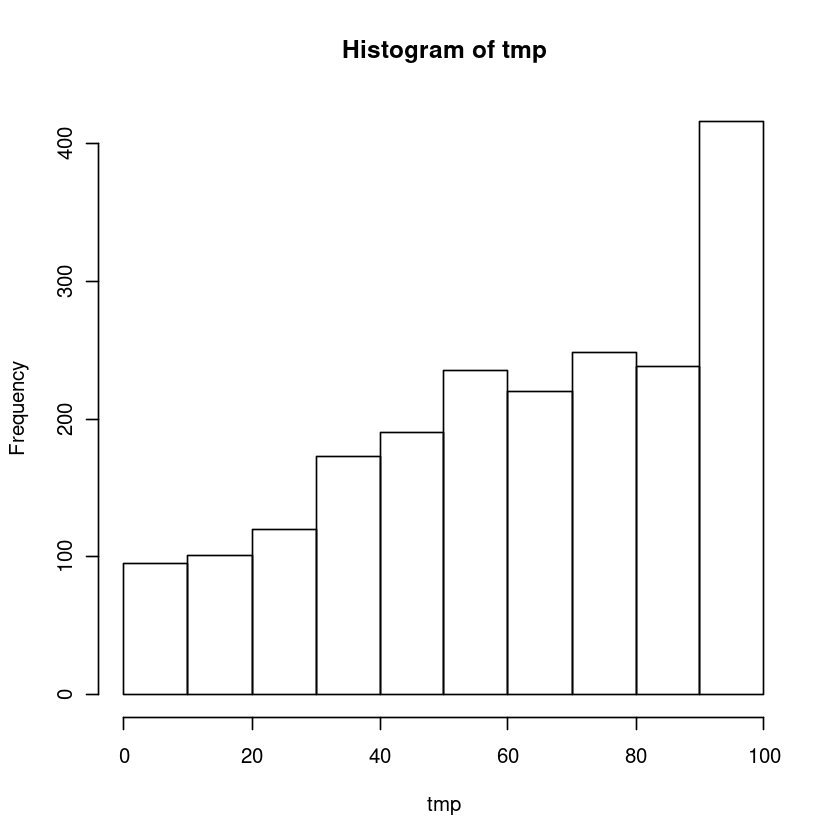

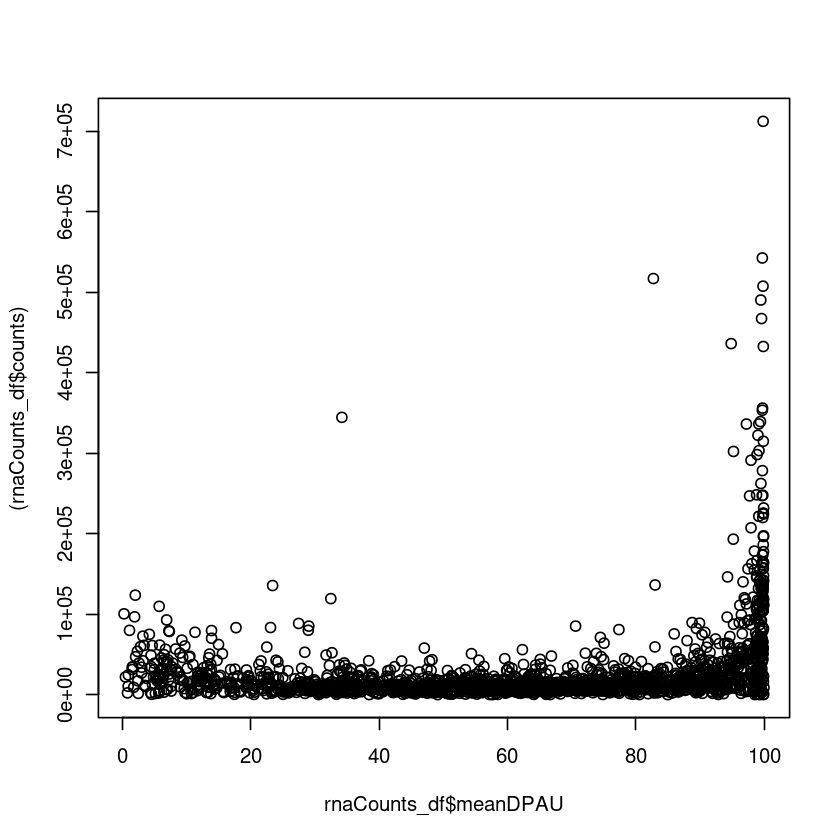

Warning message in cor.test.default(rnaCounts_df$meanDPAU, log10(rnaCounts_df$counts), :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  rnaCounts_df$meanDPAU and log10(rnaCounts_df$counts)
S = 968438659, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.3115219 


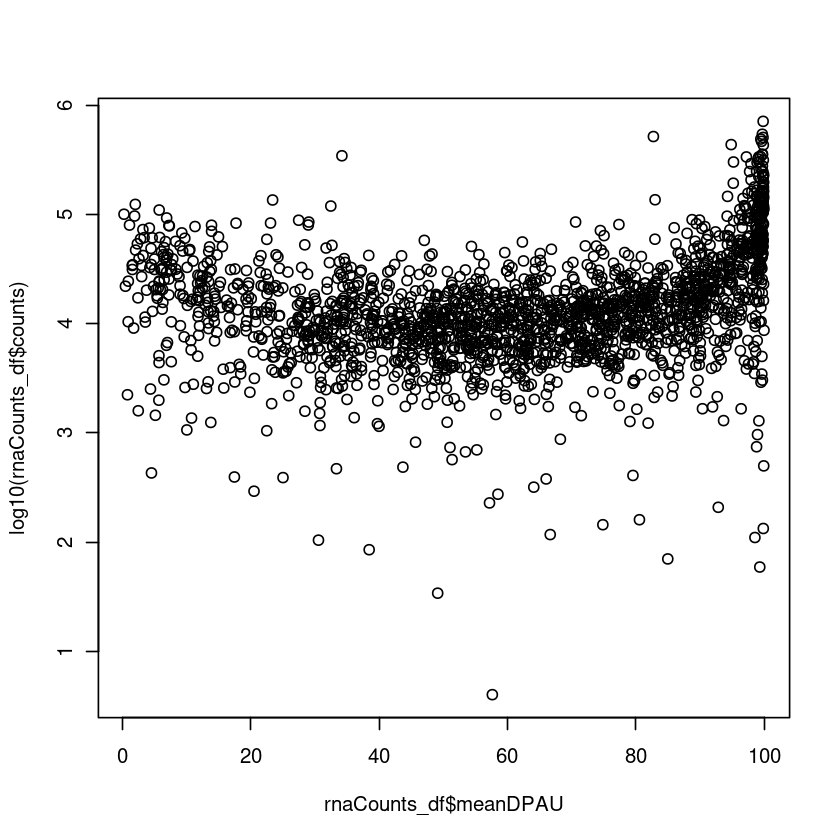

In [58]:
# mean DPAU per gene in all cells
tmp=c()
for(j in seq(1,nrow(rnaCounts_df) )){
  geneSymbol=rownames(rnaCounts_df)[j]
  rs=as.numeric(DPAU[geneSymbol, which(! is.na( DPAU[geneSymbol,] ) )  ])
  #hist(rs,n=30)
  tmp=c(tmp, mean(rs) )
}
length(tmp)
hist(tmp)
#
rnaCounts_df$meanDPAU=tmp
#
dim(rnaCounts_df)
head(rnaCounts_df)

# relation between counts and DPAU
plot(rnaCounts_df$meanDPAU, (rnaCounts_df$counts) )
plot(rnaCounts_df$meanDPAU, log10(rnaCounts_df$counts) )
cor.test(rnaCounts_df$meanDPAU, log10(rnaCounts_df$counts), method = "spearman")#rho=0.3115219;p<2.2e-16
#

## use CPM instead of counts

In [177]:
###
# add RNA read counts for each genes
dim(rnaM) #18679 225
#rnaM[1:10,1:10]
#
cpm=apply(rnaM, 2, function(x){1e6*x/sum(x)})
cpm[1:10,1:10]
#
cpmPerGene=getDF_fromNamesXX( apply(cpm, 1, sum)  )
cpmPerGene2=cpmPerGene[rownames(rsDF), ]
dim(cpmPerGene2) #2036 2
head(cpmPerGene2)
rsDF$cpm=cpmPerGene2$value
head(rsDF)

[1] 18679   225

,c01ROW24,c01ROW35,c01ROW31,c05ROW02,c05ROW14,c05ROW19,c05ROW31,c05ROW33,c2ROW19,c3ROW02
A1BG-AS1,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0
A2M,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0
A2M-AS1,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0
A2ML1,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0
A2MP1,0.00000,0.000000,0.00000,0,0.000000,318.1893,0.00000,0.000000,0,0
A4GALT,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,5.112949,0,0
AAAS,66.64613,0.000000,73.64291,0,4.567378,202.6683,28.31635,5.843370,0,0
AACS,0.00000,1.639898,0.00000,0,0.000000,129.7077,0.00000,0.000000,0,0
AADACL3,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0
AADAT,0.00000,0.000000,0.00000,0,0.000000,0.0000,0.00000,0.000000,0,0


[1] 18679     2
           name   value
MT-ATP6 MT-ATP6 9736716
MT-ND4   MT-ND4 9458798
MT-RNR2 MT-RNR2 6361875
MT-CO2   MT-CO2 5284310
MT-CYB   MT-CYB 4837817
MT-CO3   MT-CO3 4674185


[1] 2036    2

,name,value
,<fct>,<dbl>
RPL8,RPL8,492539.3
RPL3,RPL3,369992.2
RPS23,RPS23,350992.6
COX4I1,COX4I1,339512.8
UQCRH,UQCRH,341233.6
RPLP2,RPLP2,324160.3


,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


In [182]:
head(rsDF[order(-rsDF$RNACounts),])
head(rsDF[order(-rsDF$cpm),])

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


In [183]:
#save to file
write.table(rsDF,'6_4_gene_DPAUcellNumber_meanDPAU_sdDPAU_RNACounts_cpm.txt')

In [356]:
2**10

[1] 1024

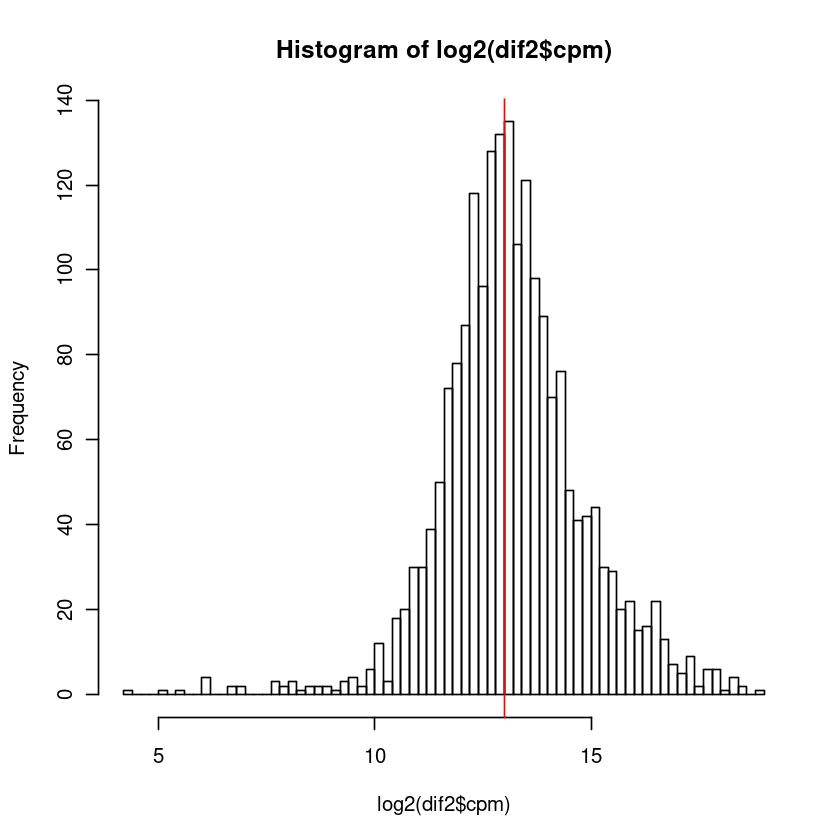

In [365]:
dif=rsDF

#hist(log2(dif$cpm), n=100)
dif2=dif[which(dif$cpm> 2**4 ),]
hist(log2(dif2$cpm), n=100)
abline(v=13, col='red')

In [373]:
corA=cor.test( rsDF$meanDPAU, log2(rsDF$cpm+1), method = "spearman" )
corA
corA$p.value
p.value=formatC(corA$p.value, format = "e", digits = 2)
p.value


	Spearman's rank correlation rho

data:  rsDF$meanDPAU and log2(rsDF$cpm + 1)
S = 965379237, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.3136969 


[1] 9.899346e-48

[1] "9.90e-48"

null device 
          1

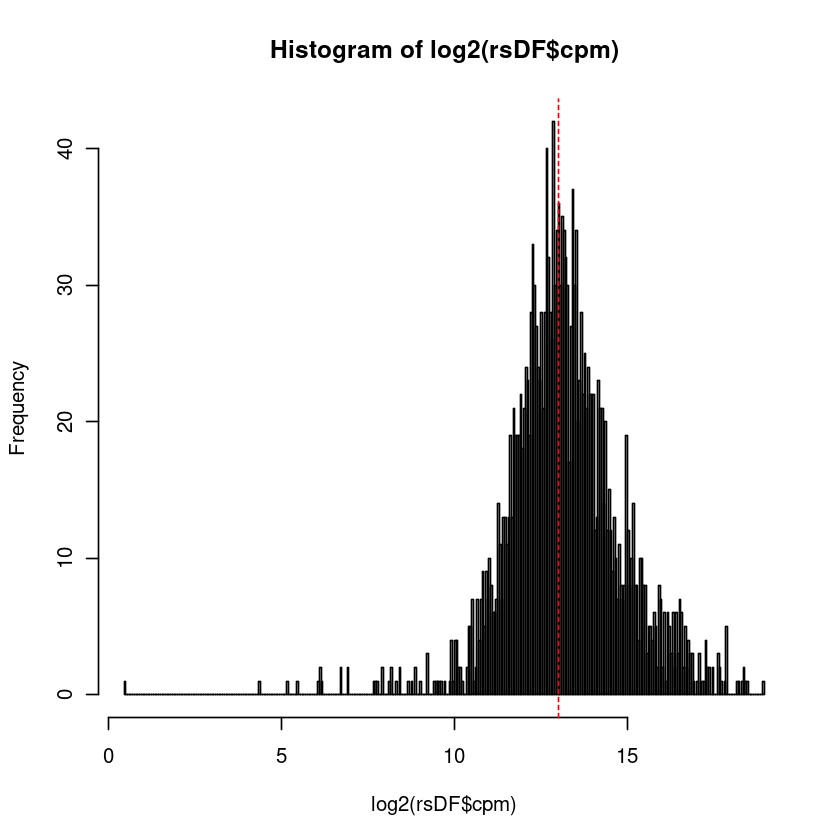

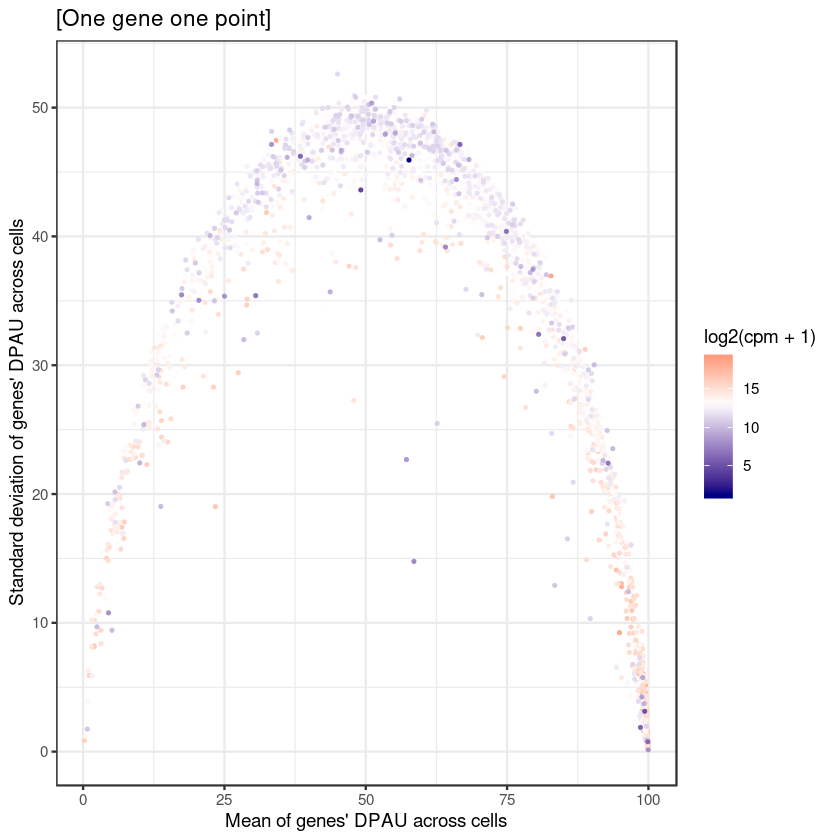

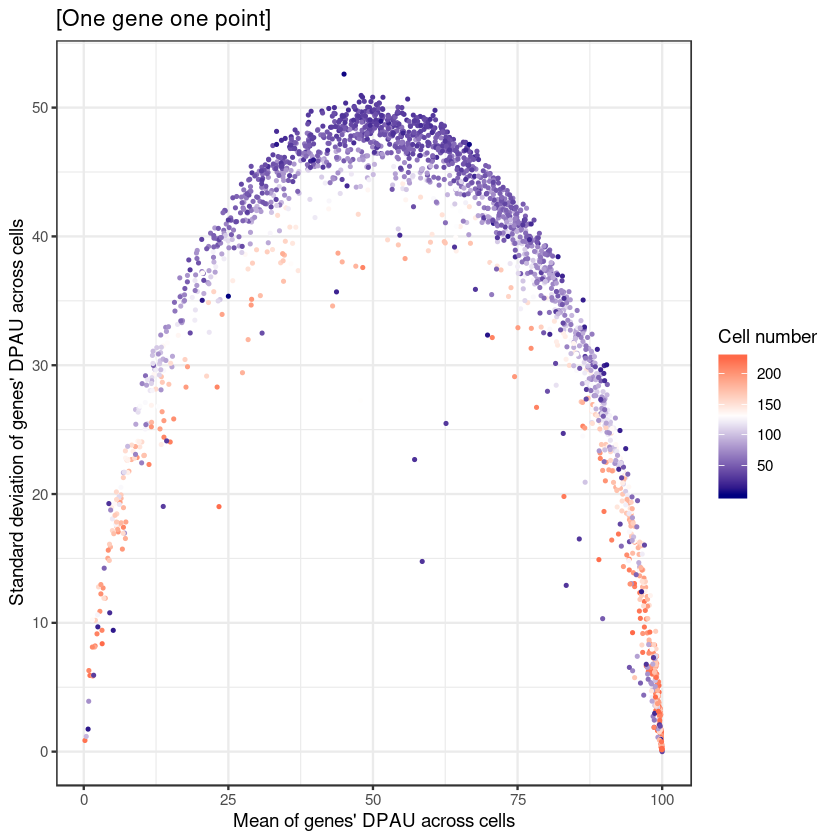

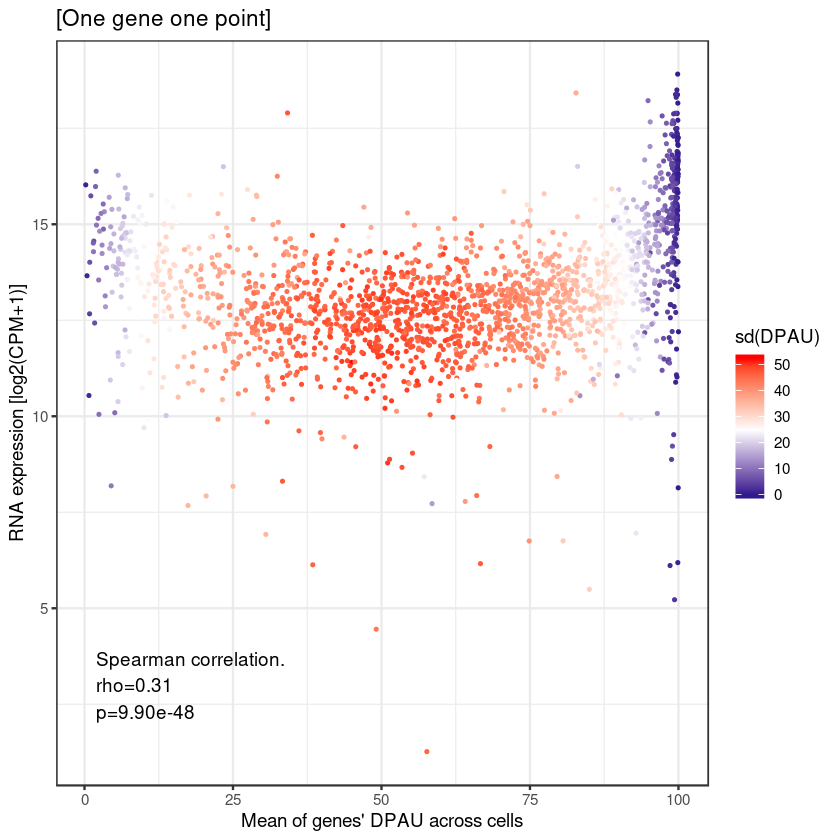

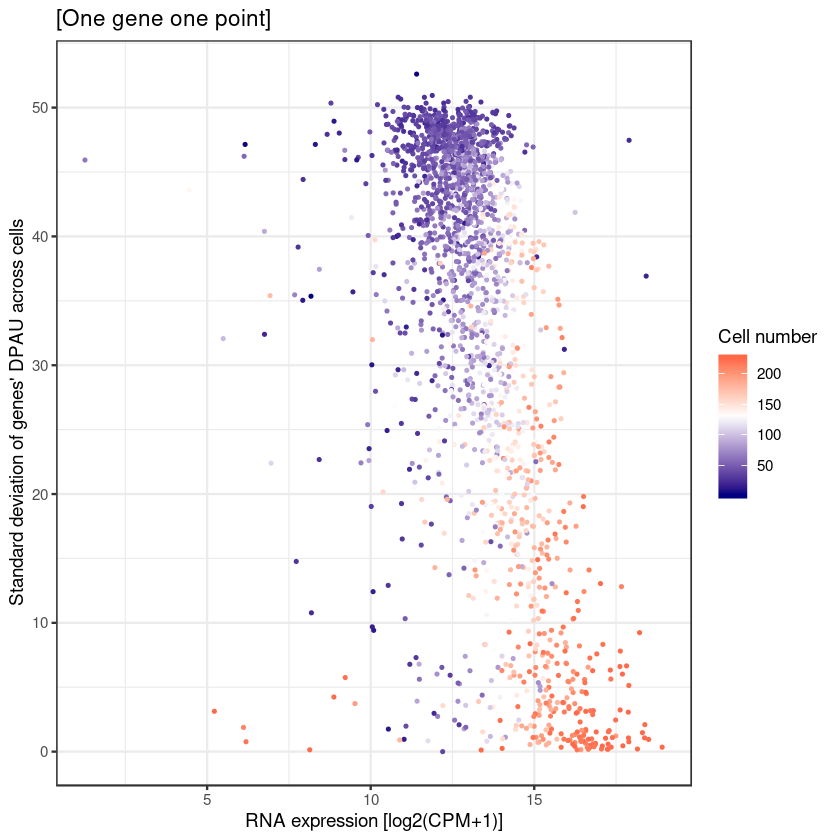

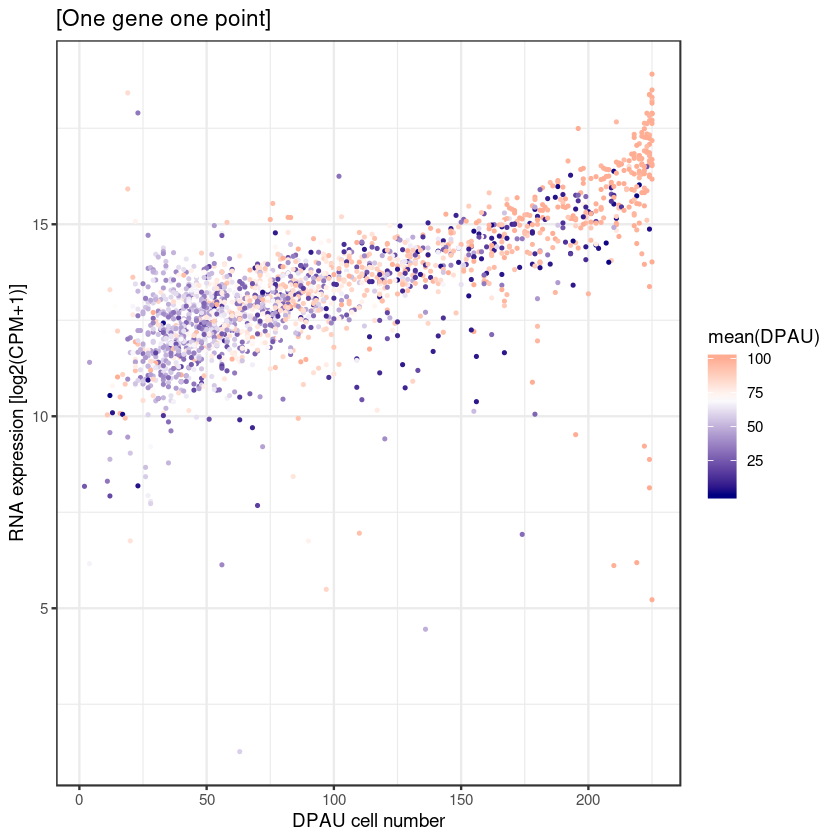

null device 
          1

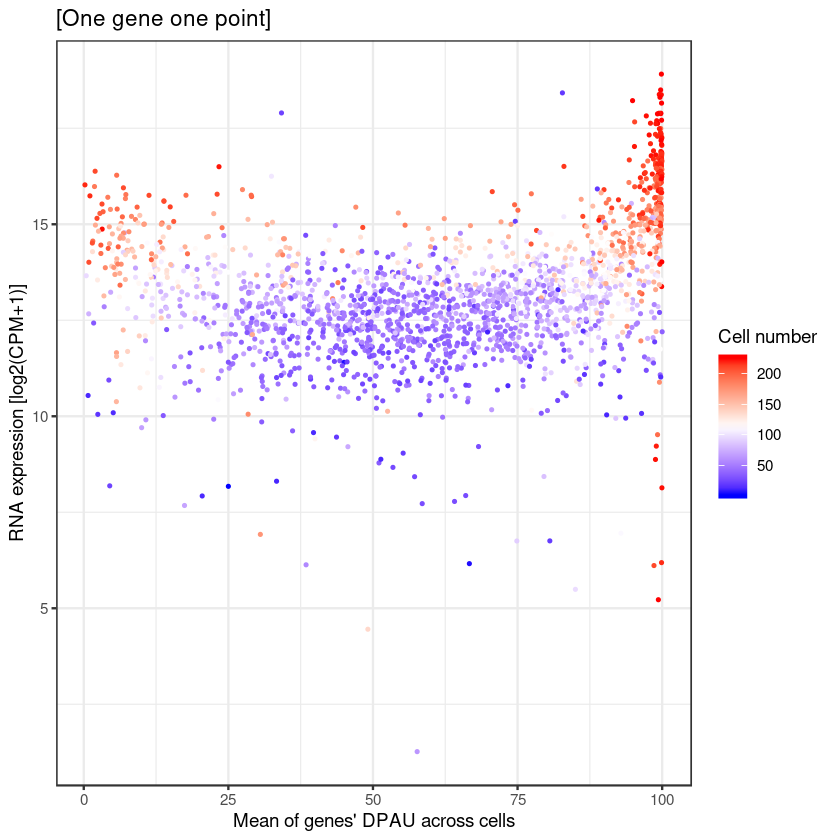

In [374]:
dev.off()
CairoPDF("6_4_gene_DPAUcellNumber_meanDPAU_sdDPAU_RNACounts.pdf", width=5, height=4)

#hist( rsDF$cpm, n=100)
hist( log2(rsDF$cpm), n=600)
abline(v=13, col='red', lty=2 )
##1
ggplot(rsDF, aes(meanDPAU, sdDPAU, color=log2( cpm+1 ) ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =13 )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]")+
  theme_bw()
###2
ggplot(rsDF, aes(meanDPAU, sdDPAU, color=DPAUcellNumber ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2('Cell number',low="navy", mid='white',  high="red", midpoint =130 )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]")+
  theme_bw()
###3
ggplot(rsDF, aes(meanDPAU, log2( cpm+1 ), color=sdDPAU ))+
  geom_point(size=0.4) + 
#   #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('sd(DPAU)', low="navy", mid='white',  high="red", midpoint =25 )+
   labs(x="Mean of genes' DPAU across cells", y="RNA expression [log2(CPM+1)]" , 
        title=paste0("[One gene one point]")  )+
  annotate("text", x=2, y=3,hjust = 0, label=paste0("Spearman correlation. \nrho=", 
                     round(corA$estimate,2), '\np=', p.value) )+
  theme_bw()

###
ggplot(rsDF, aes(log2( cpm+1 ), sdDPAU, color=DPAUcellNumber ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2('Cell number',low="navy", mid='white',  high="red", midpoint =130 )+
  labs(x="RNA expression [log2(CPM+1)]", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]")+
  theme_bw()

###
ggplot(rsDF, aes(DPAUcellNumber,log2(cpm+1), color=meanDPAU))+
  geom_point(size=0.4) + 
  scale_color_gradient2('mean(DPAU)', low="navy", mid='white',  high="red", midpoint =70 )+
  labs(x="DPAU cell number",y="RNA expression [log2(CPM+1)]", 
       title="[One gene one point]")+
  theme_bw()
###
ggplot(rsDF, aes(meanDPAU,log2(cpm+1), color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="Mean of genes' DPAU across cells",y="RNA expression [log2(CPM+1)]",
       title="[One gene one point]")+
  theme_bw()

dev.off()

[1] 1.265704

[1] 18.90988

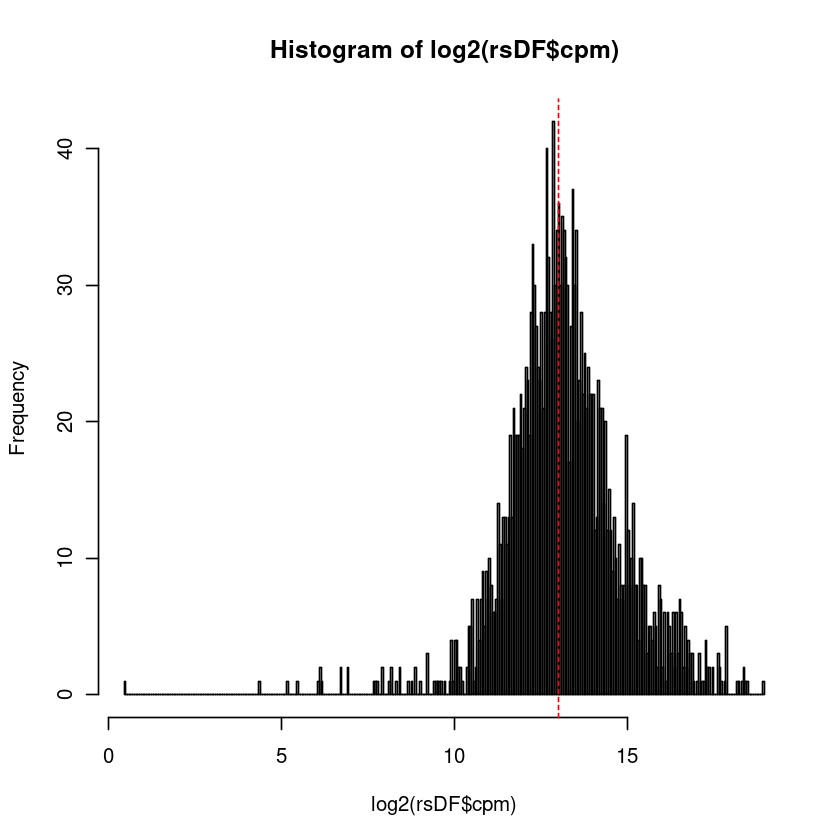

In [879]:
min(log2(rsDF$cpm+1) )
max(log2(rsDF$cpm+1) )

hist( log2(rsDF$cpm), n=600)
abline(v=13, col='red', lty=2 )

Cairo 
    3

Cairo 
    3

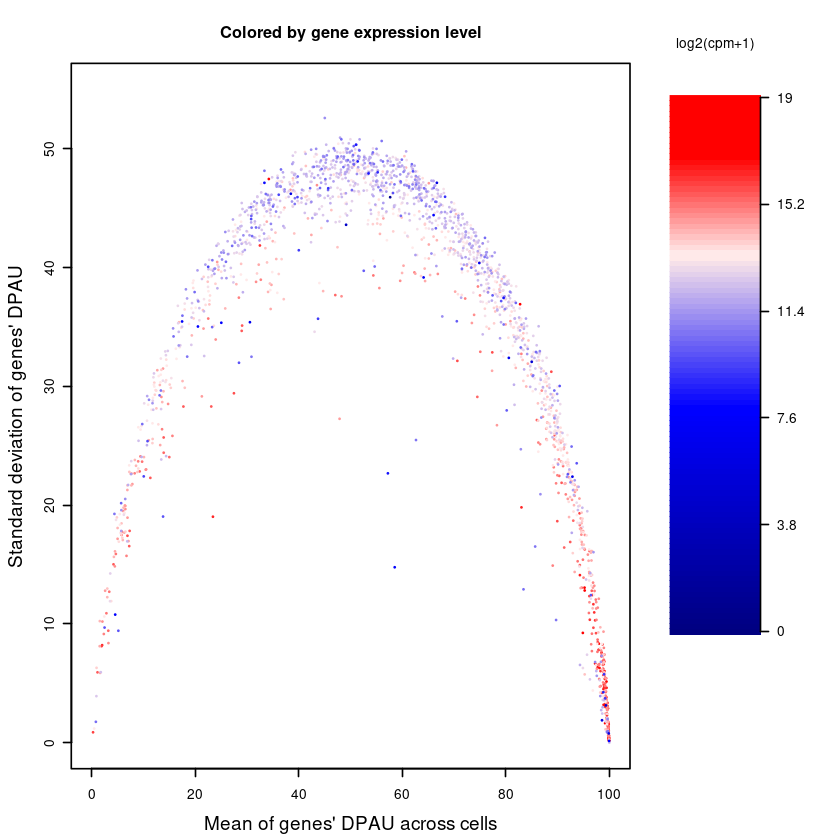

In [1189]:
cMax=max(log2(rsDF$cpm+1) )

# 色彩取值范围是0-1，但是数据偏斜向1,0.5以下基本上没有值 bk1=seq(0.4,0.59,by=0.01)
bk0=seq(0.0,round(8/cMax,2)-0.01,by=0.01) #almost non data
bk1=seq(round(8/cMax,2),round(13.5/cMax,2)-0.01,by=0.01)
#bk2=seq(round(9/cMax,2),round(13/cMax,2)-0.01,by=0.01)
bk3=seq(round(13.5/cMax,2),round(17/cMax,2)-0.01,by=0.01)
bk4=seq(round(17/cMax,2),1,by=0.01)
#
colors = c(
    colorRampPalette(colors = c("navy","blue"))(length(bk0)),
    colorRampPalette(colors = c("blue","#FFE9E9"))(length(bk1)),
    #colorRampPalette(colors = c("#00BFFF","#FFE9E9"))(length(bk2)),
    colorRampPalette(colors = c("#FFE9E9","red"))(length(bk3)),
    colorRampPalette(colors = c("red","red"))(length(bk4))
)
debug=F
if(debug==T){
    length(colors)
    tail(head(colors,n=60))
    colors[0.82*100]
    class(colors)
    str(colors)
}
#
dev.off()
CairoPDF('6_4_log2CPM_mean_sd_DPAU.pdf', width=4.5,height=4)

#sub plot
mat = matrix(c(1,1,1,1,1,1,2,2), nrow=1, byrow=TRUE);
layout(mat)

############
#step1: plot
par(mar=c(4.5,4.5,4,0))

plot(NULL, xlim=c(0,100), 
     type='n', cex.lab=1.4, #字体变大
     xlab="Mean of genes' DPAU across cells", 
     ylim=c(0,55),ylab="Standard deviation of genes' DPAU", 
     #ylim=c(0,20),ylab="RNA expression level [log2(cpm+1)]",
     main="Colored by gene expression level")
for(i in 1:nrow(rsDF)){
    #if(i>10){break;}
    v=round(log2(rsDF$cpm[i]+1)/cMax,2)*100
    color=colors[v]
    
    points(x=rsDF[i,'meanDPAU'], 
           #y=log2(rsDF[i, 'cpm']+1),
           y=rsDF[i, 'sdDPAU'],
           pch=20,
           cex=0.05,
           col=color)
}

############
#step2: 用image函数画color bar
par(mar=c(13,2.5,6,5)) #bottom, left, top, right
n=100
image(t(matrix(0:n)),col=colors,
      xaxt="n",
      yaxt="n",
      cex = 1.5,
      mgp=c(0,1,0),
      #main="Dominant\ncell ratio",
      bty='n',#box type
      xlab = "", ylab = ""
)
text(x=0,y=1.1,labels=c("log2(cpm+1)"),xpd=T)
axis(4,at=seq(0,1,by=0.2), #seq(0,n,by=200),
     labels=seq(0,round(cMax),round(cMax)*0.20),
     cex.axis=1, #坐标轴刻度字体大小
     #col.axis="red", #坐标轴刻度字体颜色
     #col="purple", #坐标轴颜色
     lwd=1, #坐标轴刻度粗细
     las=2)#las=0垂直于轴，2平行于轴
#
dev.off()

### 3D plot

In [1901]:
head(rsDF)
#head(dif)

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


[1] -0.3151433  8.1937265 -0.2133333  5.5466667

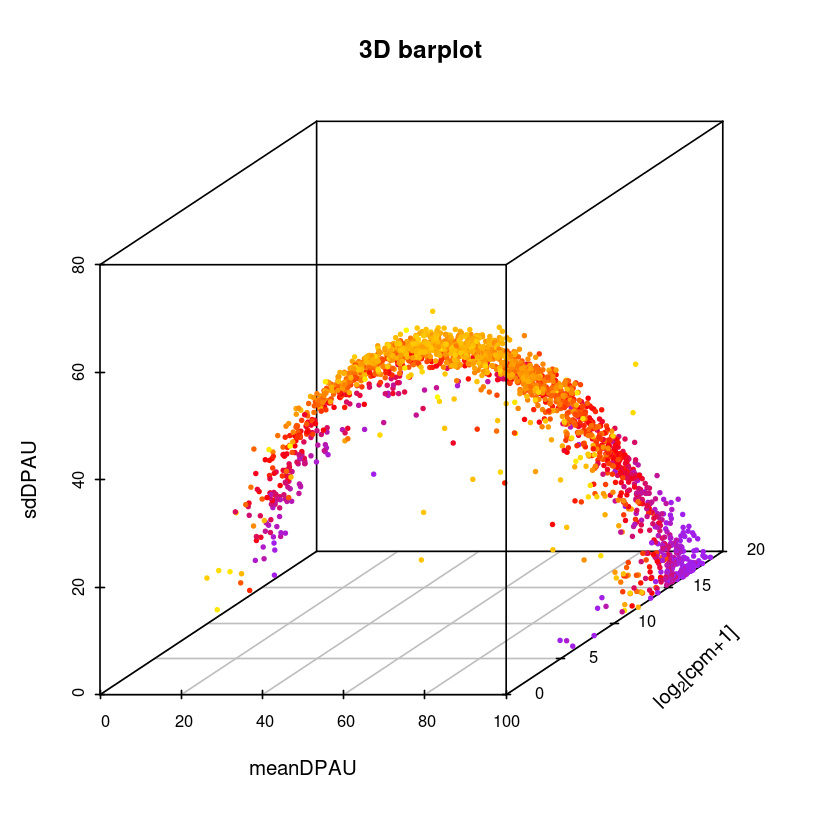

In [1946]:
# get color list
getColorList=function(df, i){
    mycolors=colorRampPalette(colors = c("yellow",'red','purple'))( 201 )
    stdvalue=round( (df[,i]-min(df[,i]) )/( max(df[,i])- min(df[,i]) )*200 );
   list.color=c()
    for(j in 1:nrow(df) ){
        color=mycolors[stdvalue[j]+1]
        list.color=c(list.color,color)
    }
    return(list.color)
}
#getColorList(rsDF, i)

library("scatterplot3d")
i=2; #染色的列
#mycolors=colorRampPalette(colors = c("yellow",'red','purple'))( 201 )
scatterplot3d(#rsDF[,c(3,4,6)], 
    x=rsDF[,3], y=log2(rsDF[,6]+1), z=rsDF[,4], zlim=c(0,80),
    xlab=colnames(rsDF)[3],
    ylab='',#paste0('log2 ', colnames(rsDF)[6] ),
    zlab=paste0('', colnames(rsDF)[4]),
              type = "p", lwd = 1, pch = 16, cex.symbols=0.5,
             color = getColorList(rsDF, i),
             angle=30,
             main = "3D barplot")
#添加y坐标
dims <- par("usr")
dims
x <- dims[1]+ 0.9*diff(dims[1:2])
y <- dims[3]+ 0.08*diff(dims[3:4])
text(x,y,expression(paste(log[2]*'[cpm+1]') ),srt=45)

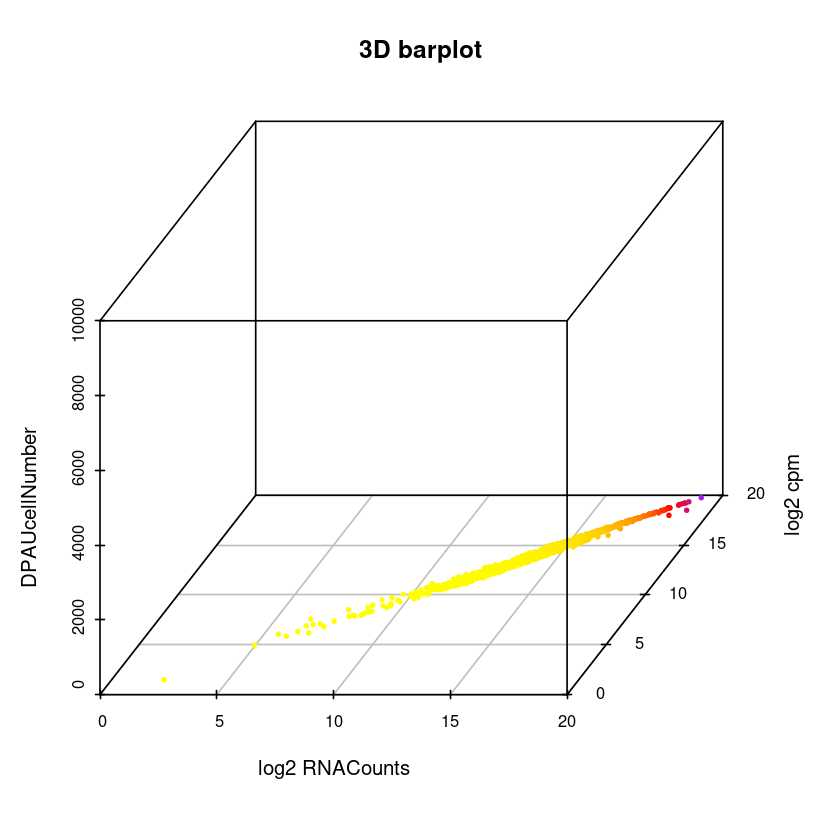

In [1948]:
# log RNA counts, log cpm， linear
i=6; scatterplot3d( #rsDF[,c(4,3,6)], 
    x=log2(rsDF[,5]+1), y=log2(rsDF[,6]+1), z=rsDF[,2], zlim=c(0,10000),
    xlab=paste0('log2 ', colnames(rsDF)[5] ),
    ylab=paste0('log2 ', colnames(rsDF)[6] ),
    zlab=colnames(rsDF)[2],
              type = "p", lwd = 1, pch = 16, cex.symbols=0.5,
             color = getColorList(rsDF, i),
             angle=60,
             main = "3D barplot")

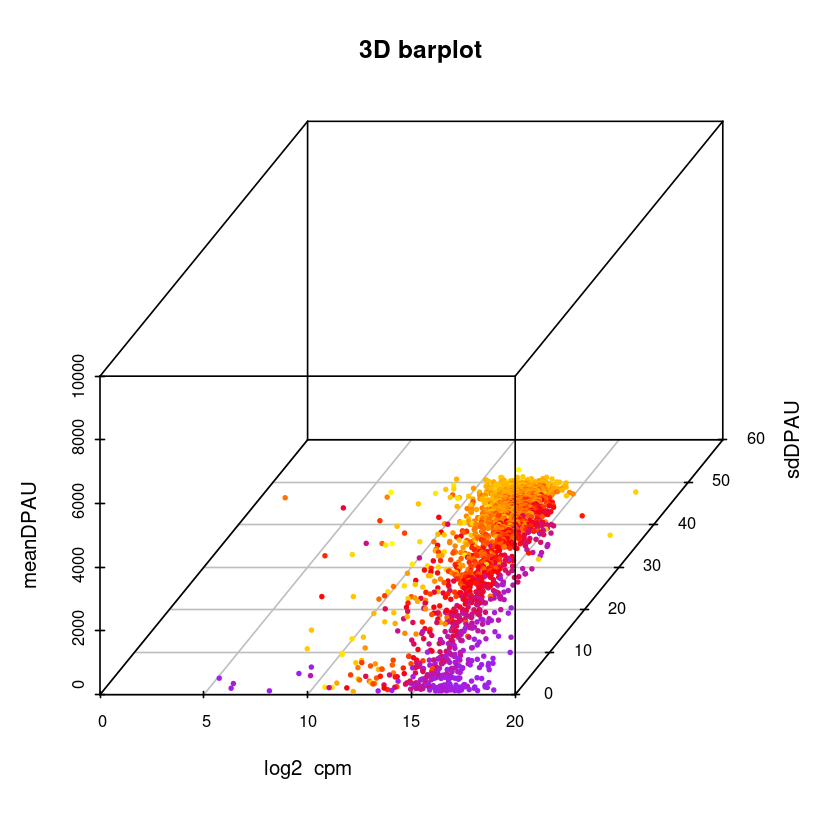

In [1969]:
# log cpm， sdDPAU, 2 part
# change : zlim, angle
i=2; scatterplot3d( #rsDF[,c(4,3,6)], 
    x=log2(rsDF[,6]+1), y=rsDF[,4], z=rsDF[,3], zlim=c(0,10000),
    xlab=paste('log2 ',colnames(rsDF)[6]),
    ylab=colnames(rsDF)[4],
    zlab=colnames(rsDF)[3],
              type = "p", lwd = 1, pch = 16, cex.symbols=0.5,
             color = getColorList(rsDF, i),
             angle=60,
             main = "3D barplot")

## house keeping genes?

null device 
          1

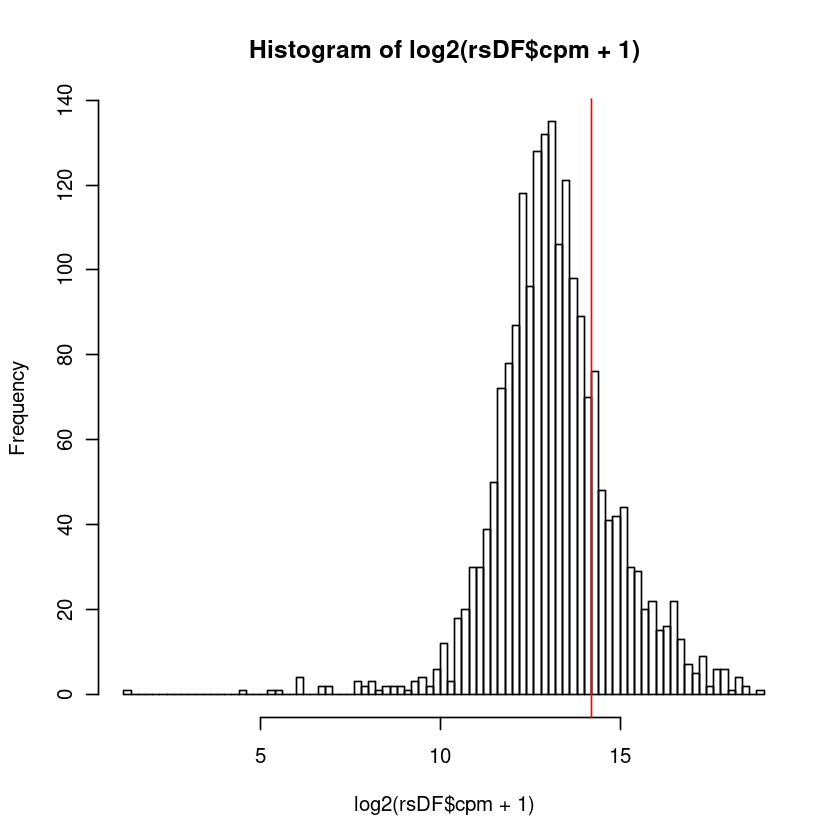

null device 
          1

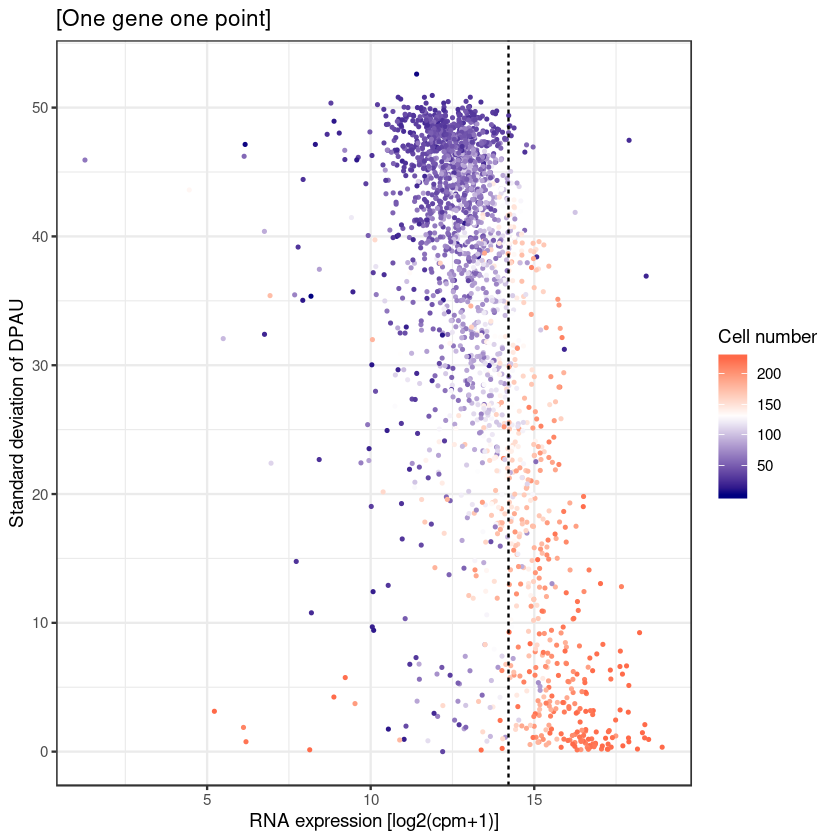

In [474]:
dev.off()
CairoPDF('6_4_RNA_vs_sdDPAU_cellNumber.pdf', width=4.5, height=3.5)
hist( log2(rsDF$cpm+1), n=100)
abline(v=14.2, col='red')

ggplot(rsDF, aes( log2(cpm+1), sdDPAU, color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('Cell number', low="navy", mid='white',  high="red", midpoint =130 )+
  labs(x="RNA expression [log2(cpm+1)]",y="Standard deviation of DPAU",
       title="[One gene one point]")+
  theme_bw()+
    geom_vline(aes(xintercept=14.2), colour="black", linetype="dashed")
dev.off()

In [467]:
over=log2(rsDF$cpm+1)>14.5
table(over)

over
FALSE  TRUE 
 1678   358 

In [470]:
writeLines( rownames(rsDF[over, ]), '6_4_popularGenes.txt' )

In [476]:
writeLines( rownames(rsDF[!over, ]), '6_4_NOT_popularGenes.txt' )

In [488]:
## cellnumber+,RNA-
set2= log2(rsDF$cpm+1)<12 & rsDF$DPAUcellNumber>130
table(set2)

#rownames(rsDF[set2, ])
head(rsDF[set2, ])

writeLines( rownames(rsDF[set2, ]), '6_4_genes_RNAlow_cellNumberHigh.txt' )

set2
FALSE  TRUE 
 2017    19 

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
PET100,PET100,180,96.312674,14.28314,5650,3989.826
SNHG25,SNHG25,167,5.656999,17.82399,5086,3223.545
SLC25A23,SLC25A23,139,7.577364,22.61382,4480,3296.968
CSKMT,CSKMT,156,5.671793,19.57405,4399,3012.976
NOL12,NOL12,131,85.197012,30.86389,3446,1925.157
RBM34,RBM34,133,20.534876,37.16209,3150,2341.709


In [491]:
## cellnumber+,RNA-, sdDPAU-
set3= log2(rsDF$cpm+1)<12 & rsDF$DPAUcellNumber>130 & rsDF$sdDPAU<10
table(set3)

rownames(rsDF[set3, ])
(rsDF[set3, ])

set3
FALSE  TRUE 
 2028     8 

[1] "ARF5"    "IFI30"   "GNG5"    "NDUFV2"  "NME2"    "TRAPPC5" "LBHD1"  
[8] "ALDOA"

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
ARF5,ARF5,178,99.52899,0.9040066,2906,1891.16038
IFI30,IFI30,195,99.20177,3.7288637,1288,733.39820
GNG5,GNG5,222,98.98569,5.7503082,963,596.14308
NDUFV2,NDUFV2,224,98.84220,4.2402163,745,468.47987
NME2,NME2,224,99.95715,0.1436741,498,280.32444
TRAPPC5,TRAPPC5,219,99.89074,0.7699506,133,71.91525
LBHD1,LBHD1,210,98.58532,1.8794542,110,68.15523
ALDOA,ALDOA,225,99.34209,3.1333745,59,36.32061


In [496]:
## cellnumber-, sdDPAU+
set3= rsDF$DPAUcellNumber<50 & rsDF$sdDPAU>40
table(set3)

#rownames(rsDF[set3, ])
head(rsDF[set3, ])
writeLines( rownames(rsDF[set3, ]), '6_4_genes_cellNumberlow_sdDPAUHigh.txt' )

set3
FALSE  TRUE 
 1551   485 

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
HIST1H4C,HIST1H4C,23,34.18453,47.46163,344512,244380.10
CEP350,CEP350,27,38.37091,46.54396,42132,26845.14
MTF2,MTF2,33,60.70646,48.41889,32584,21365.27
DHRS7,DHRS7,33,48.08999,47.81475,30082,20118.68
GCC2,GCC2,37,50.63852,48.58291,29974,19617.35
TMEM87A,TMEM87A,33,41.33835,48.55868,29700,19294.14


In [ ]:
## GO analysis.

## How about in BC

[1] "1257   SMIM10"
[1] "1985   CD70"
[1] "1990   H3F3C"
[1] "2023   ZNF540"


[1] 2032    4

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
RPL8,RPL8,169,99.90750,0.2080347
RPL3,RPL3,169,99.68651,1.0843607
RPS23,RPS23,16,80.13580,39.8504621
COX4I1,COX4I1,169,99.85387,1.1634788
UQCRH,UQCRH,169,99.73324,0.8244649
RPLP2,RPLP2,169,99.56700,1.6705028


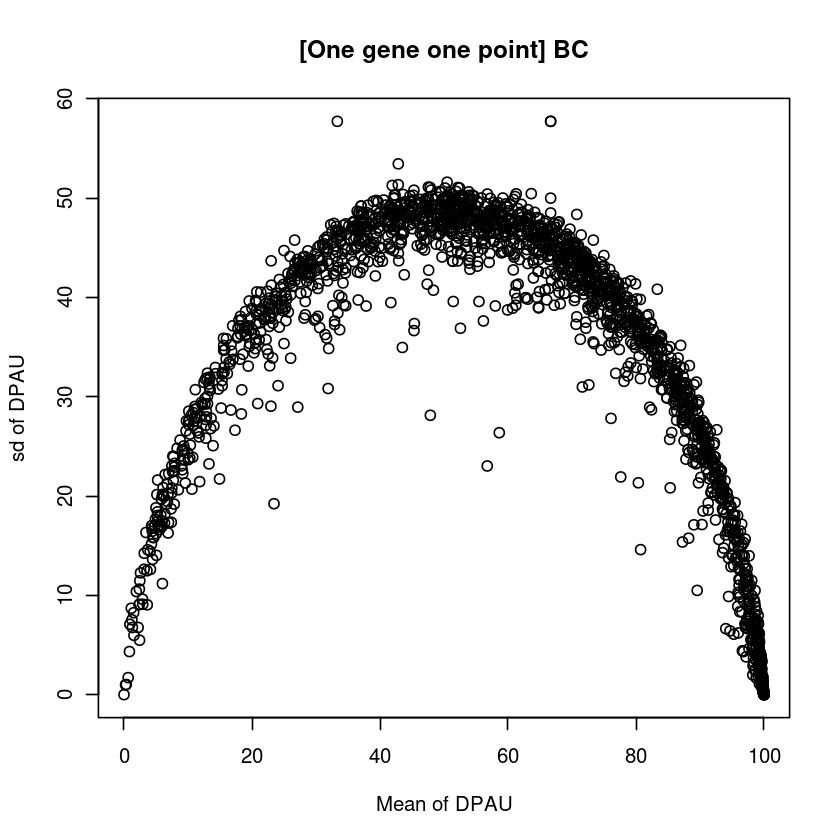

In [317]:
####
##get each gene's non-NA cell number, mean, sd of DPAU
bcDF=NULL

for(i in 1:nrow(rnaCounts_df)){
  
  geneSymbol=rownames(rnaCounts_df)[i]
  #printP(i, ' ', geneSymbol)

    BCcellId=rownames(cellInfo[substr(cellInfo$cellType,1,2)=="BC",])
  dataRow1=DPAU[geneSymbol, which( (!is.na(DPAU[geneSymbol,])) &  (colnames(DPAU) %in% BCcellId) )];
  tmp=as.numeric(dataRow1)

    #print(dim(dataRow1)); print(dataRow1)
    #if(i>0){break;}
    
  if(length(tmp)<2){
    printP(i, ' ', geneSymbol)
    next;
  }
  #
  tmpDF=data.frame(
    gene=geneSymbol,
    DPAUcellNumber=length(tmp),
    meanDPAU=mean(tmp),
    sdDPAU=sd(tmp)
  )
  bcDF=rbind(bcDF, tmpDF)
} #10seconds
#
rownames(bcDF)=bcDF$gene
dim(bcDF) #2036 4
head(bcDF)
#    gene cellNumber meanDPAU     sdDPAU
#1   RPL8        225 99.86553  0.3462266
#2   RPL3        225 99.73653  0.9470744
#3  RPS23         19 82.75423 36.9176673
#
plot(bcDF$mean, bcDF$sd, xlab="Mean of DPAU", ylab="sd of DPAU", main="[One gene one point] BC" )
#

In [319]:
# add RNA read counts for each genes
dim(rnaM) #18679 225
#rnaM[1:10,1:10]
#
cpm=apply(rnaM, 2, function(x){1e6*x/sum(x)})
#cpm[1:10,1:10]
#
cpmPerGene=getDF_fromNamesXX( apply(cpm, 1, sum)  )
cpmPerGene2=cpmPerGene[rownames(bcDF), ]
dim(cpmPerGene2) #18679     2
#head(cpmPerGene2)
bcDF$cpm=cpmPerGene2$value
head(bcDF)

[1] 18679   225

[1] 18679     2
           name   value
MT-ATP6 MT-ATP6 9736716
MT-ND4   MT-ND4 9458798
MT-RNR2 MT-RNR2 6361875
MT-CO2   MT-CO2 5284310
MT-CYB   MT-CYB 4837817
MT-CO3   MT-CO3 4674185


[1] 2032    2

,gene,DPAUcellNumber,meanDPAU,sdDPAU,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,169,99.90750,0.2080347,492539.3
RPL3,RPL3,169,99.68651,1.0843607,369992.2
RPS23,RPS23,16,80.13580,39.8504621,350992.6
COX4I1,COX4I1,169,99.85387,1.1634788,339512.8
UQCRH,UQCRH,169,99.73324,0.8244649,341233.6
RPLP2,RPLP2,169,99.56700,1.6705028,324160.3


In [324]:
#save to file
write.table(bcDF,'6_5_gene_DPAUcellNumber_meanDPAU_sdDPAU_cpm__BC.txt')

In [326]:
corBC=cor.test( bcDF$meanDPAU, log2(bcDF$cpm+1), method = "spearman" )
corBC
BCp.value=formatC(corBC$p.value, format = "e", digits = 2)
BCp.value


	Spearman's rank correlation rho

data:  bcDF$meanDPAU and log2(bcDF$cpm + 1)
S = 968604585, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.3073294 


[1] "1.06e-45"

null device 
          1

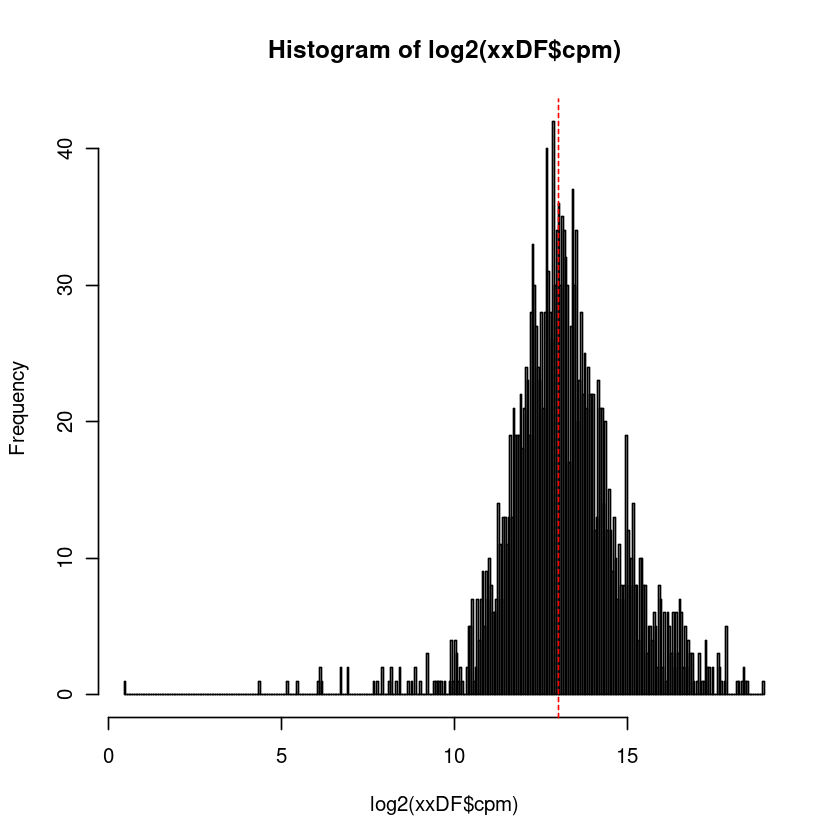

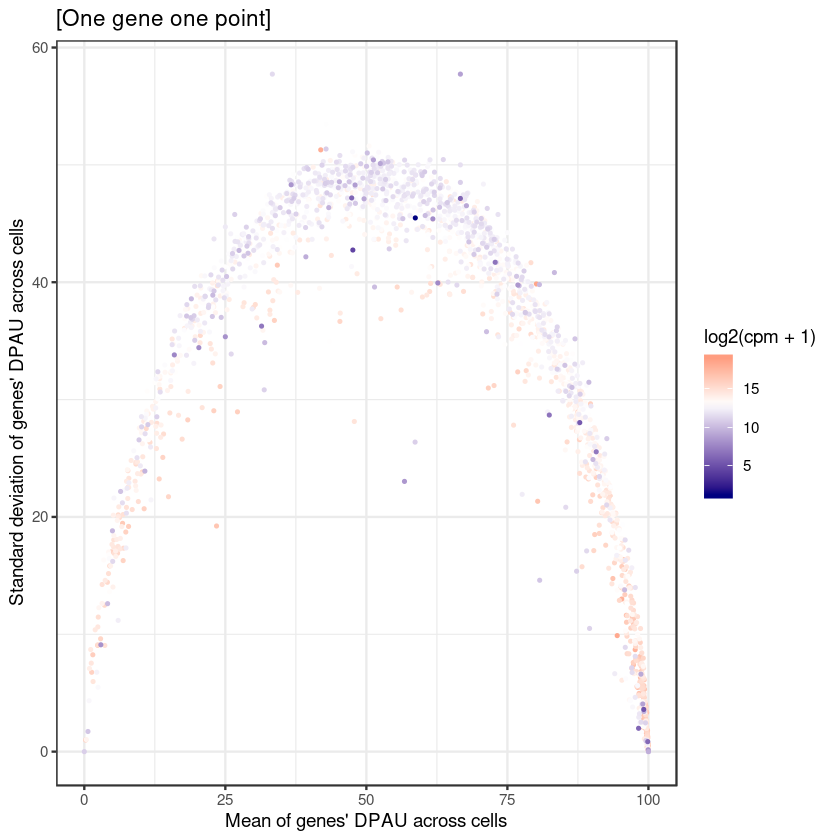

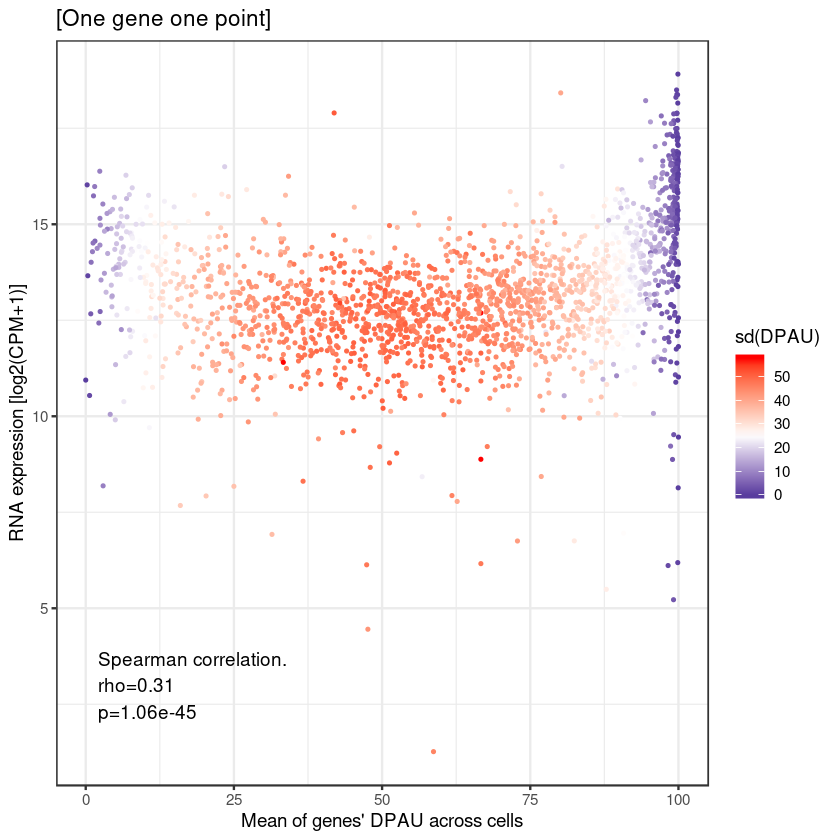

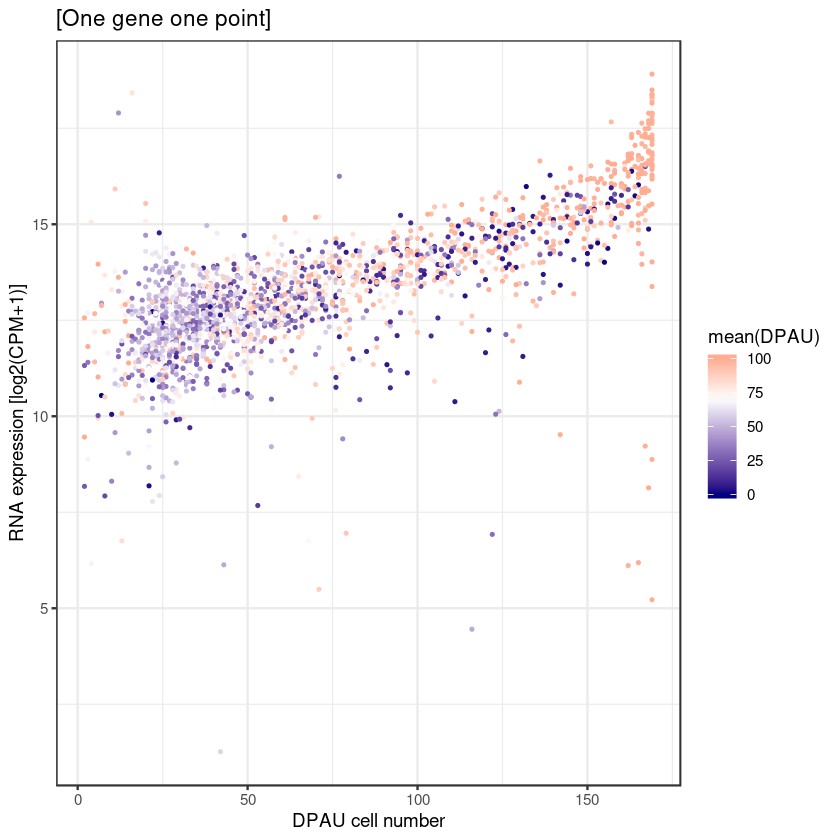

null device 
          1

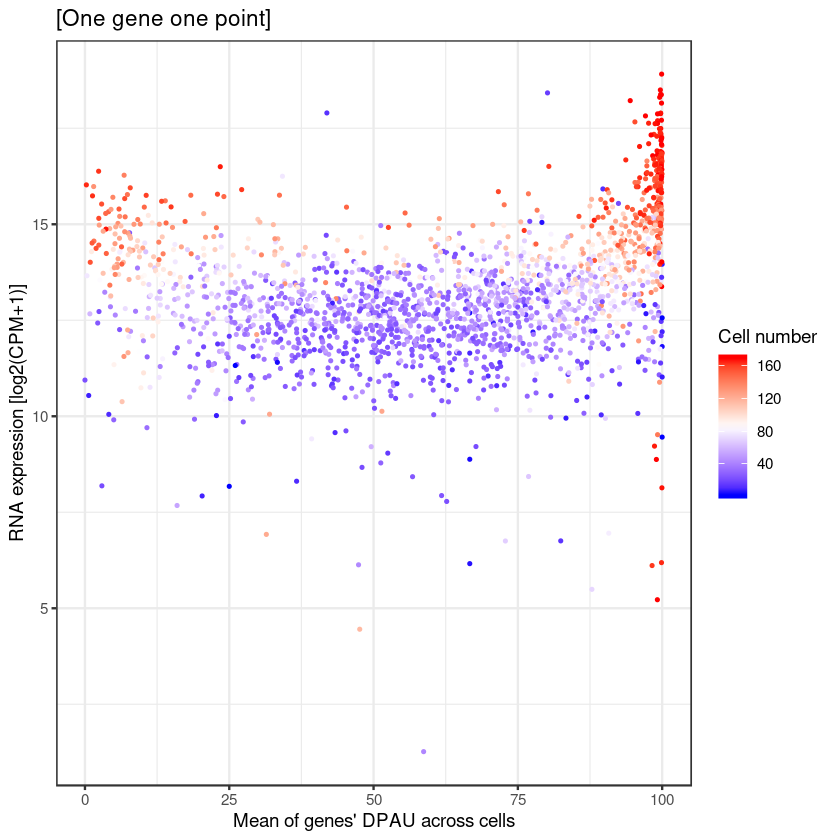

In [375]:
xxDF=bcDF

dev.off()
CairoPDF("6_5_gene_DPAUcellNumber_meanDPAU_sdDPAU__BC.pdf", width=5, height=4)
#hist( xxDF$cpm, n=100)
hist( log2(xxDF$cpm), n=600)
abline(v=13, col='red', lty=2 )
##
ggplot(xxDF, aes(meanDPAU, sdDPAU, color=log2( cpm+1 ) ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =13 )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]")+
  theme_bw()

###
ggplot(xxDF, aes(meanDPAU, log2( cpm+1 ), color=sdDPAU ))+
  geom_point(size=0.4) + 
#   #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('sd(DPAU)', low="navy", mid='white',  high="red", midpoint =25 )+
   labs(x="Mean of genes' DPAU across cells", y="RNA expression [log2(CPM+1)]" , 
        title=paste0("[One gene one point]")  )+
  annotate("text", x=2, y=3, hjust=0, label=paste0("Spearman correlation. \nrho=", 
                     round(corBC$estimate,2), '\np=', BCp.value) )+
  theme_bw()
###
ggplot(xxDF, aes(DPAUcellNumber,log2(cpm+1), color=meanDPAU))+
  geom_point(size=0.4) + 
  scale_color_gradient2('mean(DPAU)', low="navy", mid='white',  high="red", midpoint =70 )+
  labs(x="DPAU cell number",y="RNA expression [log2(CPM+1)]", 
       title="[One gene one point]")+
  theme_bw()
###
ggplot(xxDF, aes(meanDPAU,log2(cpm+1), color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="Mean of genes' DPAU across cells",y="RNA expression [log2(CPM+1)]",
       title="[One gene one point]")+
  theme_bw()

dev.off()

## How about in HeLa

[1] "566   AARD"
[1] "1008   PTPRK"
[1] "1137   ZNF827"
[1] "1225   POPDC3"
[1] "1549   RNF214"
[1] "1596   TC2N"
[1] "1647   IL22RA2"
[1] "1671   ARL5A"
[1] "1698   PSG9"
[1] "1809   SGCB"
[1] "1833   CCL28"
[1] "1835   ARMCX5"
[1] "1861   BEST1"
[1] "1900   MAB21L4"
[1] "1913   TTC9"
[1] "1983   NBPF14"
[1] "1989   CLDN8"
[1] "2000   TNRC18"
[1] "2015   MTRNR2L3"
[1] "2019   MTCYBP35"
[1] "2024   ST6GALNAC2"
[1] "2029   PEBP4"


[1] 2014    4

,gene,DPAUcellNumber,meanDPAU,sdDPAU
,<fct>,<int>,<dbl>,<dbl>
RPL8,RPL8,56,99.73889,0.5781632
RPL3,RPL3,56,99.88748,0.1746200
RPS23,RPS23,3,96.71922,2.8985070
COX4I1,COX4I1,55,99.83125,0.7137594
UQCRH,UQCRH,55,98.78842,3.9158196
RPLP2,RPLP2,56,99.77632,0.5058458


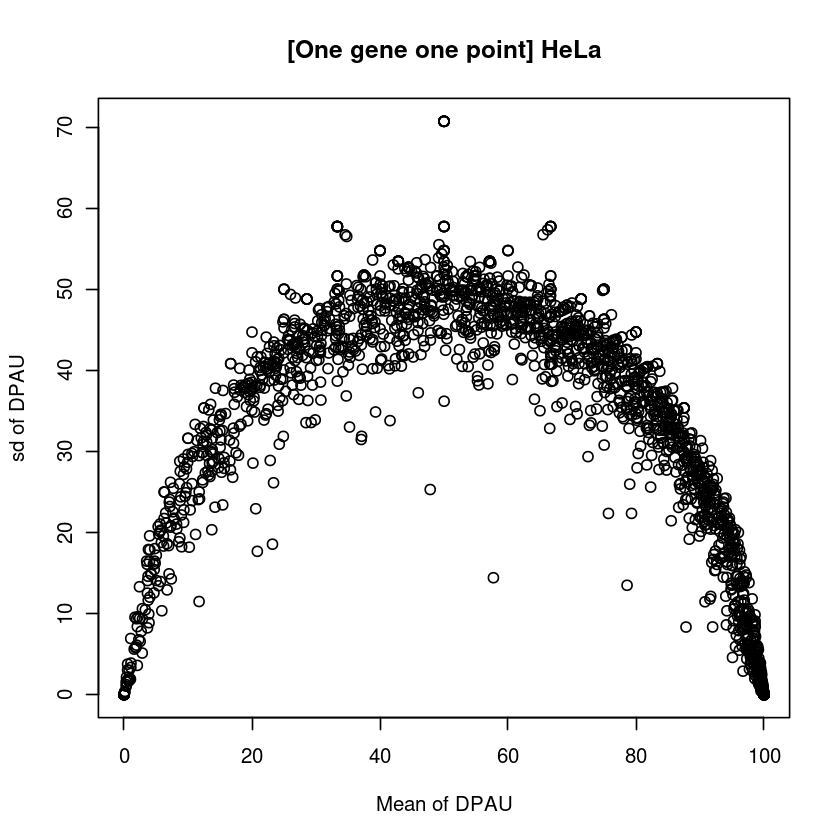

In [335]:
####
##get each gene's non-NA cell number, mean, sd of DPAU
HeLaDF=NULL

for(i in 1:nrow(rnaCounts_df)){
  
  geneSymbol=rownames(rnaCounts_df)[i]
  #printP(i, ' ', geneSymbol)

    HeLacellId=rownames(cellInfo[substr(cellInfo$cellType,1,2)=="He",])
  dataRow1=DPAU[geneSymbol, which( (!is.na(DPAU[geneSymbol,])) &  (colnames(DPAU) %in% HeLacellId) )];
  tmp=as.numeric(dataRow1)

    #print(dim(dataRow1)); print(dataRow1)
    #if(i>0){break;}
    
  if(length(tmp)<2){
    printP(i, ' ', geneSymbol)
    next;
  }
  #
  tmpDF=data.frame(
    gene=geneSymbol,
    DPAUcellNumber=length(tmp),
    meanDPAU=mean(tmp),
    sdDPAU=sd(tmp)
  )
  HeLaDF=rbind(HeLaDF, tmpDF)
} #10seconds
#
rownames(HeLaDF)=HeLaDF$gene
dim(HeLaDF) #2036 4
head(HeLaDF)
#    gene cellNumber meanDPAU     sdDPAU
#1   RPL8        225 99.86553  0.3462266
#2   RPL3        225 99.73653  0.9470744
#3  RPS23         19 82.75423 36.9176673
#
plot(HeLaDF$mean, HeLaDF$sd, xlab="Mean of DPAU", ylab="sd of DPAU", main="[One gene one point] HeLa" )
#

In [336]:
# add RNA read counts for each genes
dim(rnaM) #18679 225
#rnaM[1:10,1:10]
#
cpm=apply(rnaM, 2, function(x){1e6*x/sum(x)})
#cpm[1:10,1:10]
#
cpmPerGene=getDF_fromNamesXX( apply(cpm, 1, sum)  )
cpmPerGene2=cpmPerGene[rownames(HeLaDF), ]
dim(cpmPerGene2) #18679     2
#head(cpmPerGene2)
HeLaDF$cpm=cpmPerGene2$value
head(HeLaDF)

[1] 18679   225

[1] 18679     2
           name   value
MT-ATP6 MT-ATP6 9736716
MT-ND4   MT-ND4 9458798
MT-RNR2 MT-RNR2 6361875
MT-CO2   MT-CO2 5284310
MT-CYB   MT-CYB 4837817
MT-CO3   MT-CO3 4674185


[1] 2014    2

,gene,DPAUcellNumber,meanDPAU,sdDPAU,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,56,99.73889,0.5781632,492539.3
RPL3,RPL3,56,99.88748,0.1746200,369992.2
RPS23,RPS23,3,96.71922,2.8985070,350992.6
COX4I1,COX4I1,55,99.83125,0.7137594,339512.8
UQCRH,UQCRH,55,98.78842,3.9158196,341233.6
RPLP2,RPLP2,56,99.77632,0.5058458,324160.3


In [337]:
#save to file
write.table(HeLaDF,'6_5_gene_DPAUcellNumber_meanDPAU_sdDPAU_cpm__HeLa.txt')

corHeLa=cor.test( HeLaDF$meanDPAU, log2(HeLaDF$cpm+1), method = "spearman" )
corHeLa
HeLap.value=formatC(corHeLa$p.value, format = "e", digits = 2)
HeLap.value


	Spearman's rank correlation rho

data:  HeLaDF$meanDPAU and log2(HeLaDF$cpm + 1)
S = 983612918, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.2775677 


[1] "5.97e-37"

null device 
          1

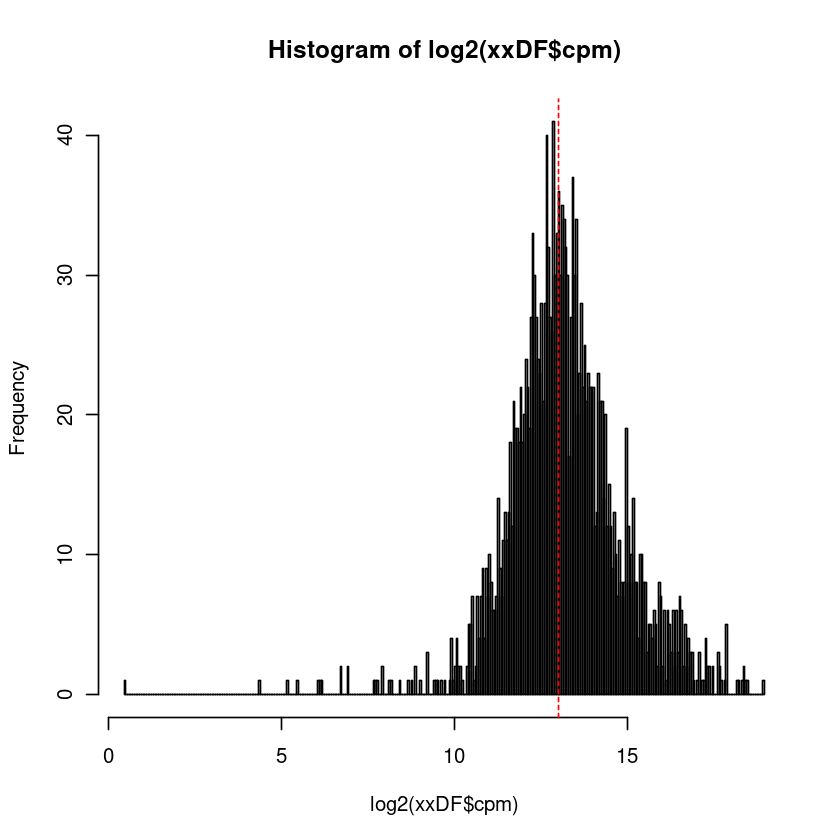

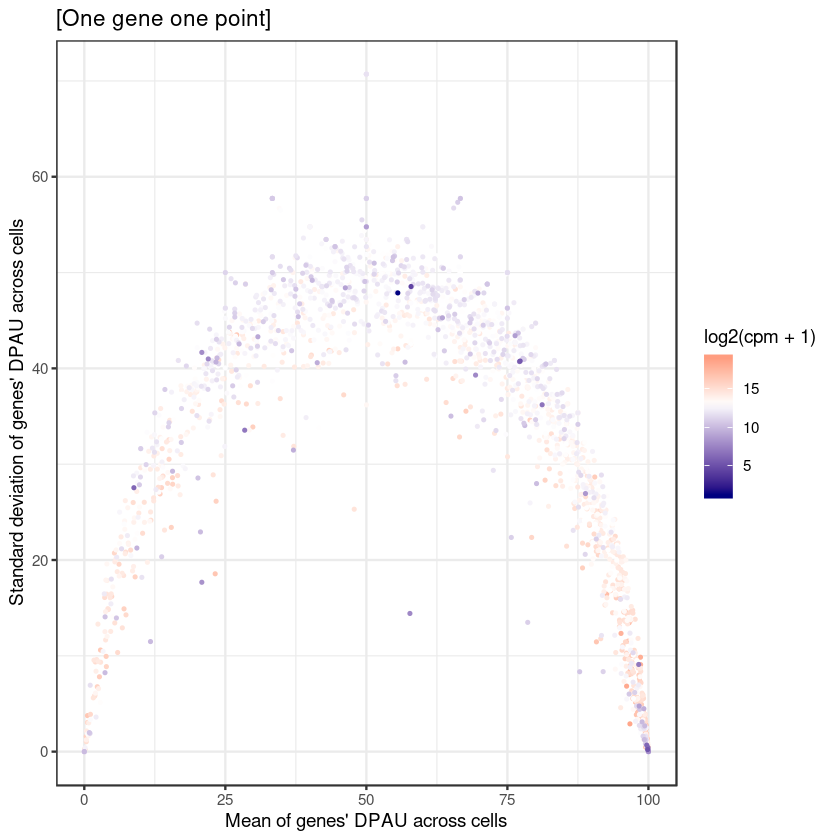

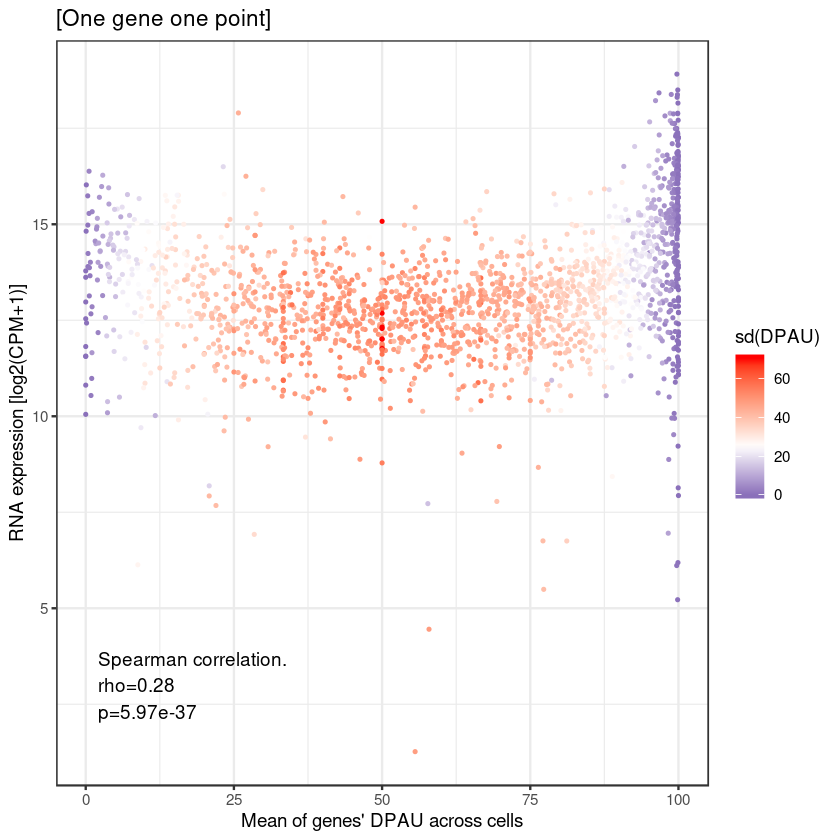

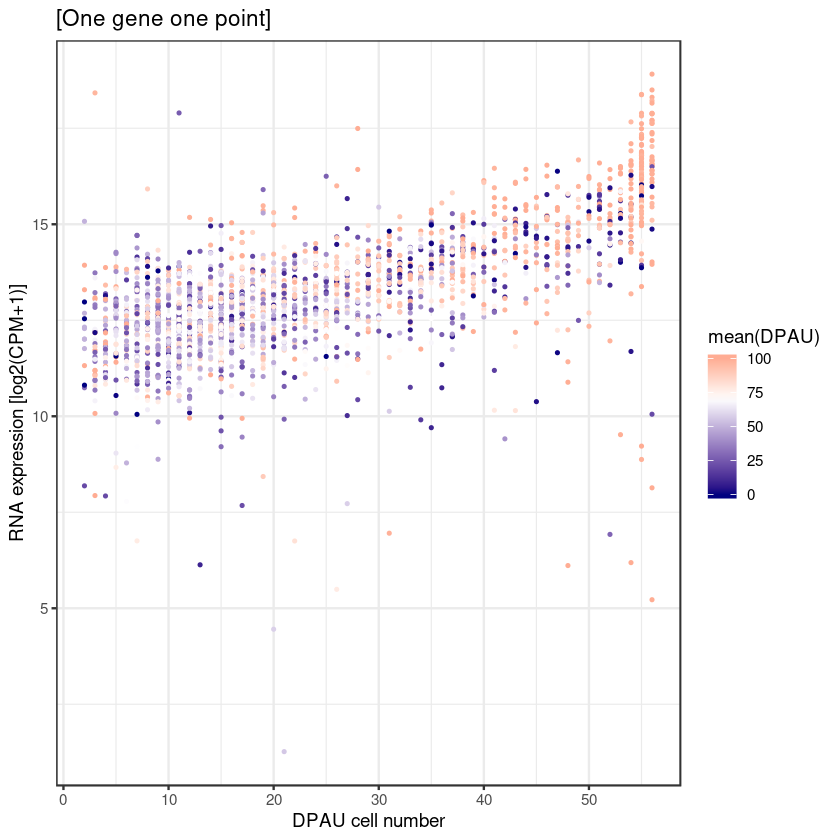

null device 
          1

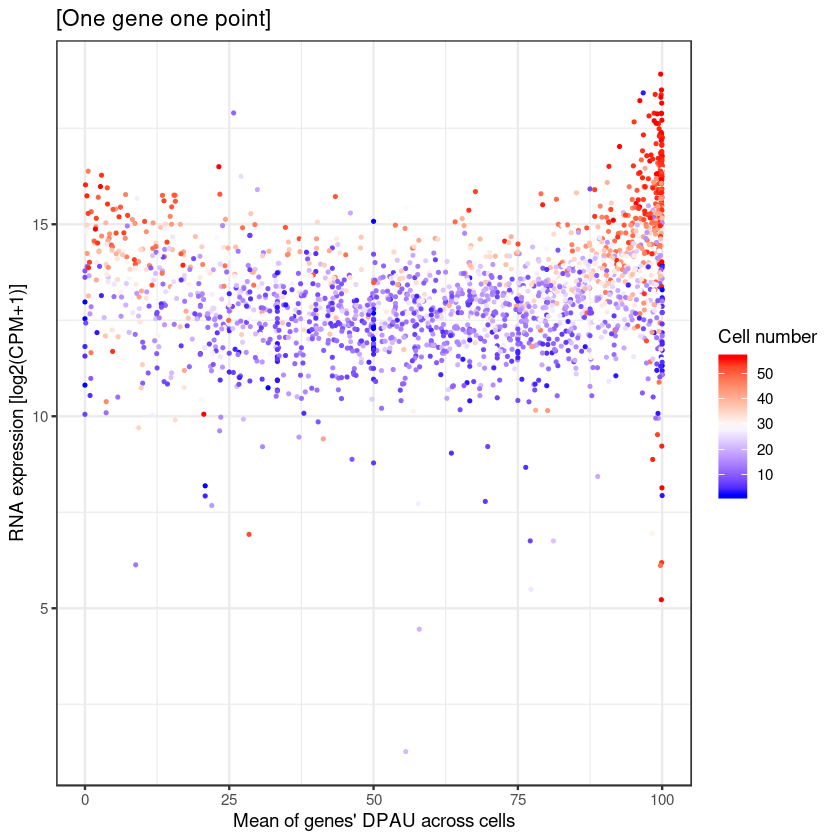

In [376]:
xxDF=HeLaDF

dev.off()
CairoPDF("6_5_gene_DPAUcellNumber_meanDPAU_sdDPAU__HeLa.pdf", width=5, height=4)
#hist( xxDF$cpm, n=100)
hist( log2(xxDF$cpm), n=600)
abline(v=13, col='red', lty=2 )
##
ggplot(xxDF, aes(meanDPAU, sdDPAU, color=log2( cpm+1 ) ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =13 )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]")+
  theme_bw()

###
ggplot(xxDF, aes(meanDPAU, log2( cpm+1 ), color=sdDPAU ))+
  geom_point(size=0.4) + 
#   #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('sd(DPAU)', low="navy", mid='white',  high="red", midpoint =25 )+
   labs(x="Mean of genes' DPAU across cells", y="RNA expression [log2(CPM+1)]" , 
        title=paste0("[One gene one point]")  )+
  annotate("text", x=2, y=3, hjust=0, label=paste0("Spearman correlation. \nrho=", 
                     round(corHeLa$estimate,2), '\np=', HeLap.value) )+
  theme_bw()
###
ggplot(xxDF, aes(DPAUcellNumber,log2(cpm+1), color=meanDPAU))+
  geom_point(size=0.4) + 
  scale_color_gradient2('mean(DPAU)', low="navy", mid='white',  high="red", midpoint =70 )+
  labs(x="DPAU cell number",y="RNA expression [log2(CPM+1)]", 
       title="[One gene one point]")+
  theme_bw()
###
ggplot(xxDF, aes(meanDPAU,log2(cpm+1), color=DPAUcellNumber))+
  geom_point(size=0.4) + 
  scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  labs(x="Mean of genes' DPAU across cells",y="RNA expression [log2(CPM+1)]",
       title="[One gene one point]")+
  theme_bw()

dev.off()

## APA Shannon index

In [395]:
geneEntropy=read.table("/home/wangjl/data/apa/191111Figure/f3/apaShannonIndex/gene_entropy_df.txt")
dim(geneEntropy)
head(geneEntropy)

[1] 4038    6

,gene,num,entropy,entropy2,sd,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
PTMA,PTMA,225,0.462053446,0.466213373,0.128404550,1323428.2
MALAT1,MALAT1,225,1.072532340,1.101012911,0.111409813,1269465.3
FTH1,FTH1,225,0.159638706,0.132301776,0.136828460,1194676.5
RPS11,RPS11,225,0.007437469,0.005938546,0.006638387,1085106.1
MGP,MGP,216,0.047659432,0.030473026,0.055685666,734765.9
GAPDH,GAPDH,225,0.005781800,0.003337626,0.011166182,719963.9


In [396]:
dim(rsDF)
head(rsDF)

[1] 2036    6

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


In [397]:
gene.set=intersect(rownames(rsDF), rownames(geneEntropy))
length(gene.set)

[1] 2036

In [398]:
geneEntropy=geneEntropy[rownames(rsDF),]
head(geneEntropy)

,gene,num,entropy,entropy2,sd,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,0.003636281,0.001105200,0.007455458,492539.3
RPL3,RPL3,225,0.005928237,0.000000000,0.014837377,369992.2
RPS23,RPS23,70,0.010766408,0.000000000,0.043022427,350992.6
COX4I1,COX4I1,225,0.003016374,0.000000000,0.014029514,339512.8
UQCRH,UQCRH,224,0.008923149,0.000000000,0.025886527,341233.6
RPLP2,RPLP2,225,0.007833098,0.003279819,0.020452432,324160.3


In [1011]:
shannon_df=cbind(rsDF, geneEntropy[,c(3,4,5)])
head(shannon_df)

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,entropy,entropy2,sd
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,0.003636281,0.001105200,0.007455458
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,0.005928237,0.000000000,0.014837377
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,0.010766408,0.000000000,0.043022427
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,0.003016374,0.000000000,0.014029514
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,0.008923149,0.000000000,0.025886527
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,0.007833098,0.003279819,0.020452432


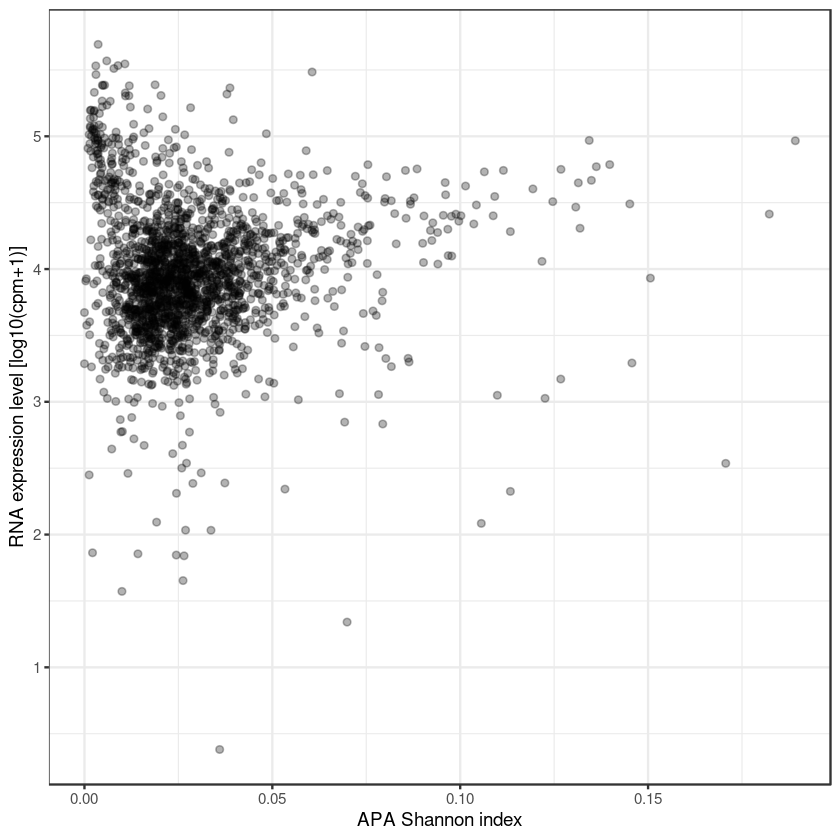

In [1012]:
ggplot(shannon_df, aes(entropy, log10(cpm+1) ))+
    geom_point(alpha=0.3)+theme_bw()+
    labs(x="APA Shannon index", y="RNA expression level [log10(cpm+1)]")

In [1013]:
cor.test(shannon_df$entropy, shannon_df$cpm, method="spearman")


	Spearman's rank correlation rho

data:  shannon_df$entropy and shannon_df$cpm
S = 1376741185, p-value = 0.3378
alternative hypothesis: true rho is not equal to 0
sample estimates:
       rho 
0.02125324 


Cairo 
    3

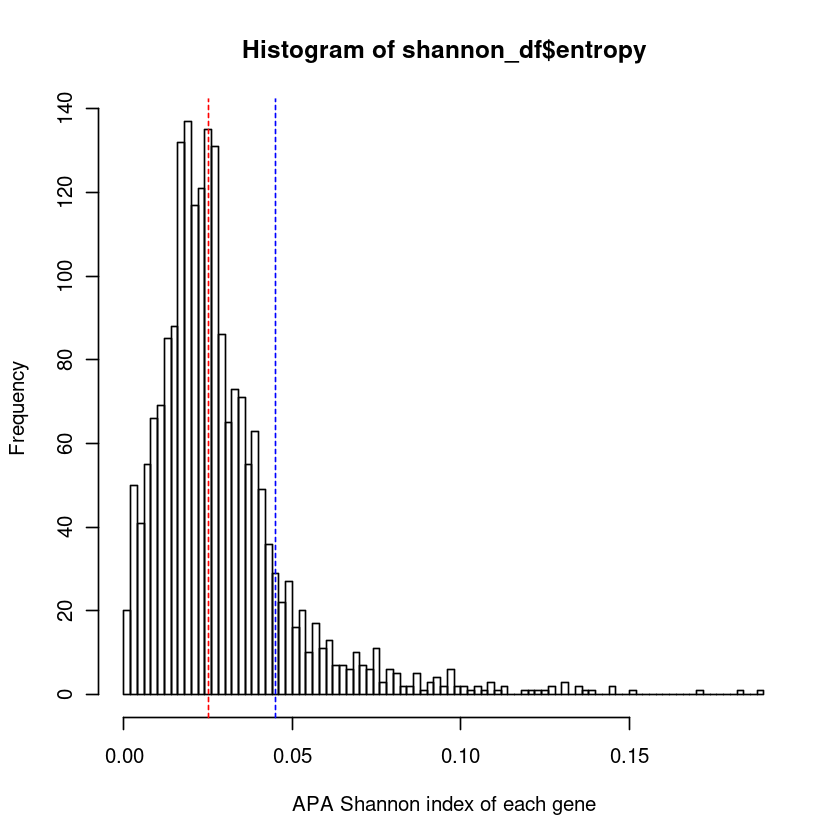

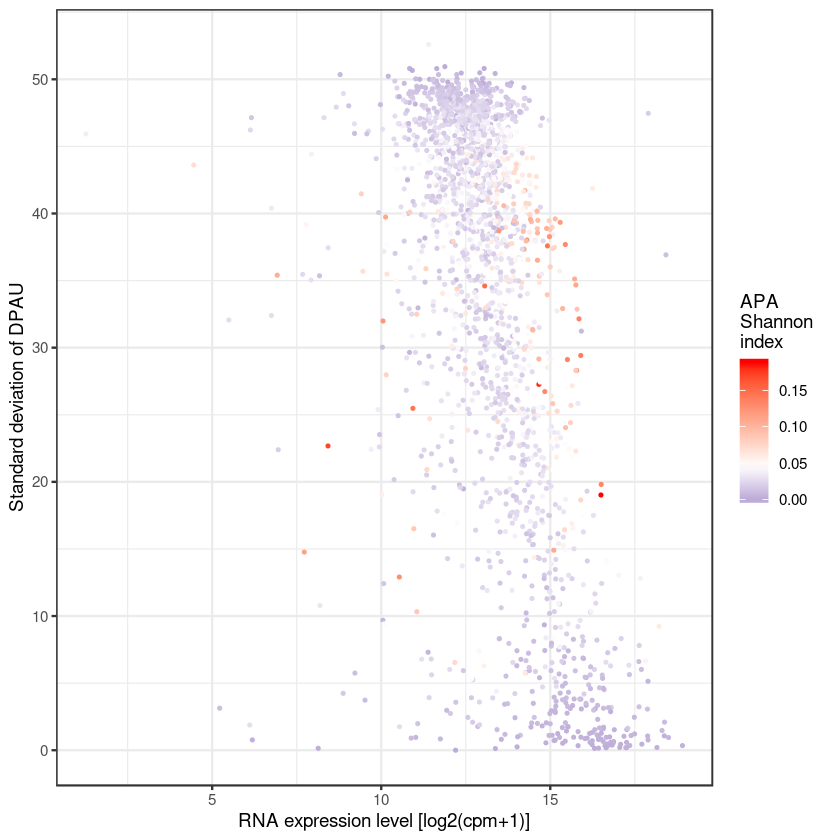

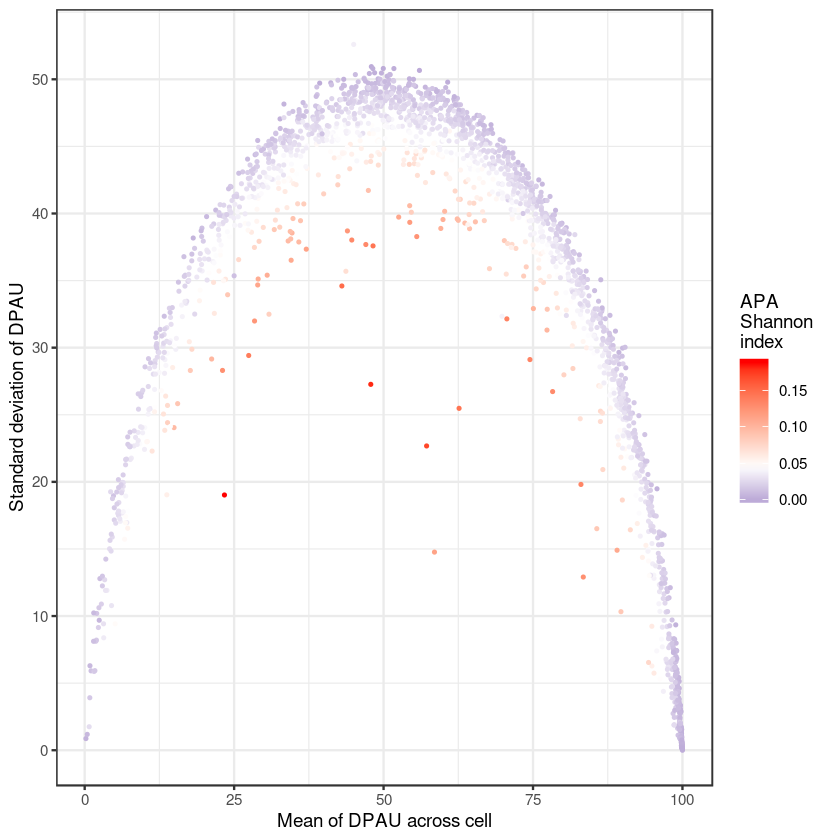

Cairo 
    3

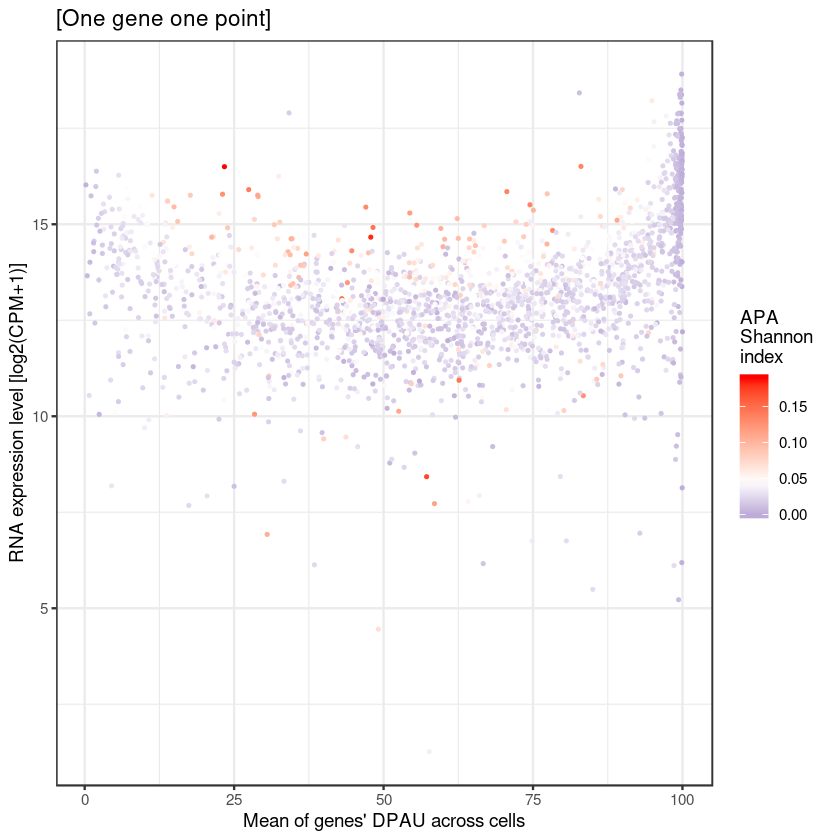

In [1059]:
xxDF=shannon_df

dev.off()
CairoPDF("6_8_APAShannonIndex_gene_DPAUcellNumber_meanDPAU_sdDPAU.pdf", width=5, height=4)
##
hist(shannon_df$entropy, n=100, xlab="APA Shannon index of each gene")
abline(v=0.025, col='red', lty=2)
abline(v=0.045, col='blue', lty=2)
##
ggplot(xxDF, aes(log2( cpm+1 ), sdDPAU, color= entropy))+
    geom_point(size=0.4)+
    scale_color_gradient2('APA \nShannon \nindex', low="navy", mid='white',  high="red", midpoint =0.045 )+
    theme_bw()+
    labs(x="RNA expression level [log2(cpm+1)]",y="Standard deviation of DPAU")
###
ggplot(xxDF, aes(meanDPAU, sdDPAU, color= entropy))+
    geom_point(size=0.4)+
    scale_color_gradient2('APA \nShannon \nindex', 
                          low="navy", mid='white',  high="red", midpoint =0.045 )+
    theme_bw()+
    labs(x="Mean of DPAU across cell",y="Standard deviation of DPAU")
##
ggplot(xxDF, aes(meanDPAU, log2( cpm+1 ), color=entropy ))+
  geom_point(size=0.4) + 
#   #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('APA \nShannon \nindex', low="navy", mid='white',  high="red", midpoint =0.045 )+
   labs(x="Mean of genes' DPAU across cells", y="RNA expression level [log2(CPM+1)]" , 
        title=paste0("[One gene one point]")  )+
  theme_bw()
##
dev.off()

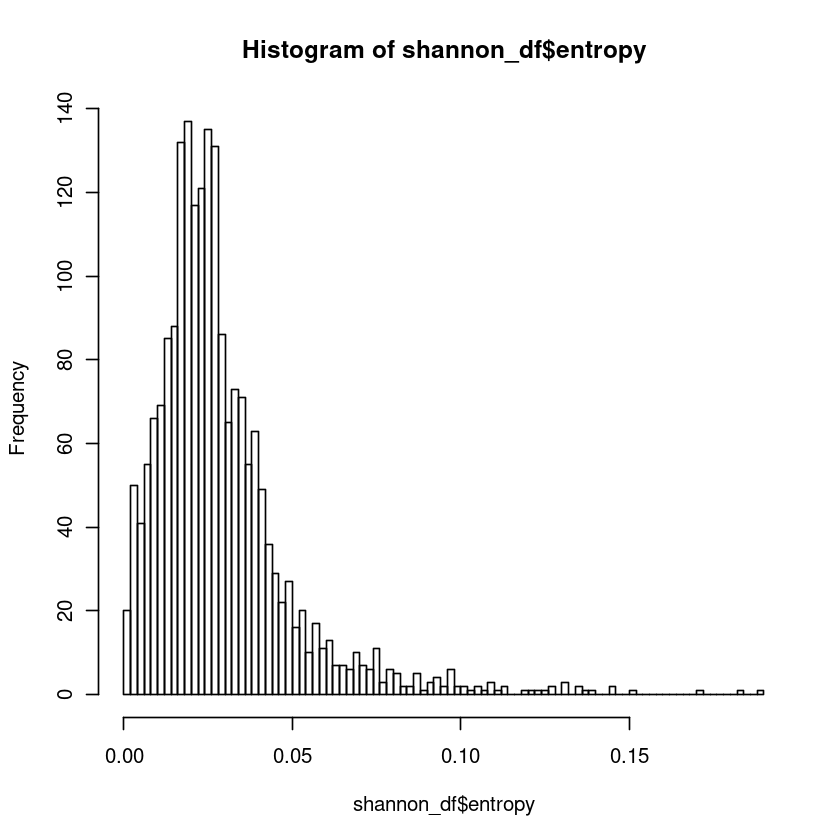

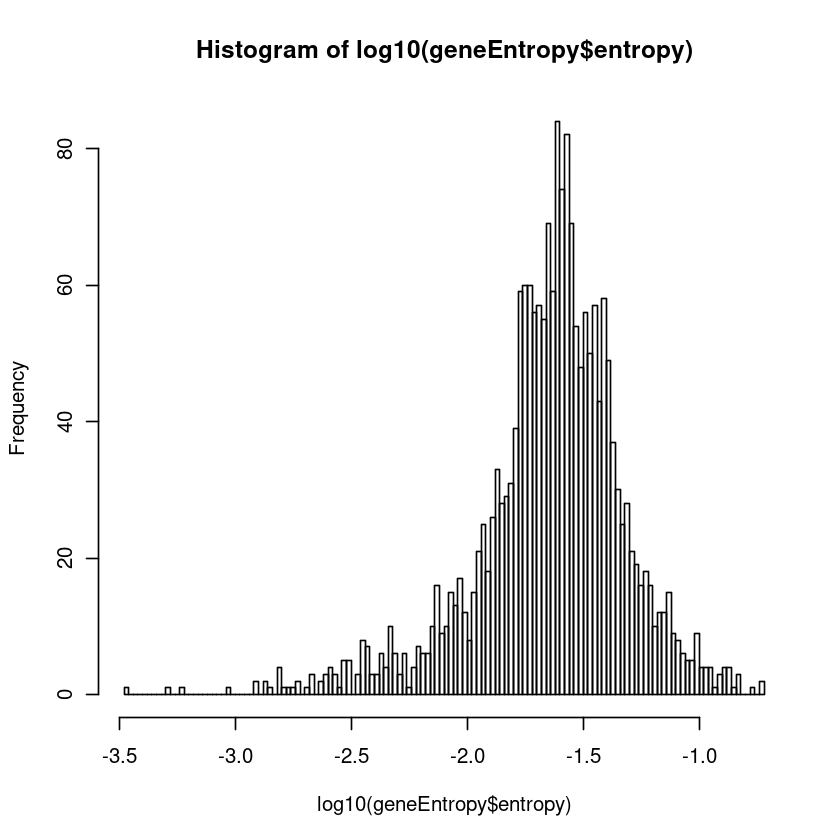

In [1061]:
hist(shannon_df$entropy, n=100)
hist( log10(geneEntropy$entropy), n=100)


	Spearman's rank correlation rho

data:  shannon_df$entropy and log2(shannon_df$cpm + 1)
S = 1376741185, p-value = 0.3378
alternative hypothesis: true rho is not equal to 0
sample estimates:
       rho 
0.02125324 


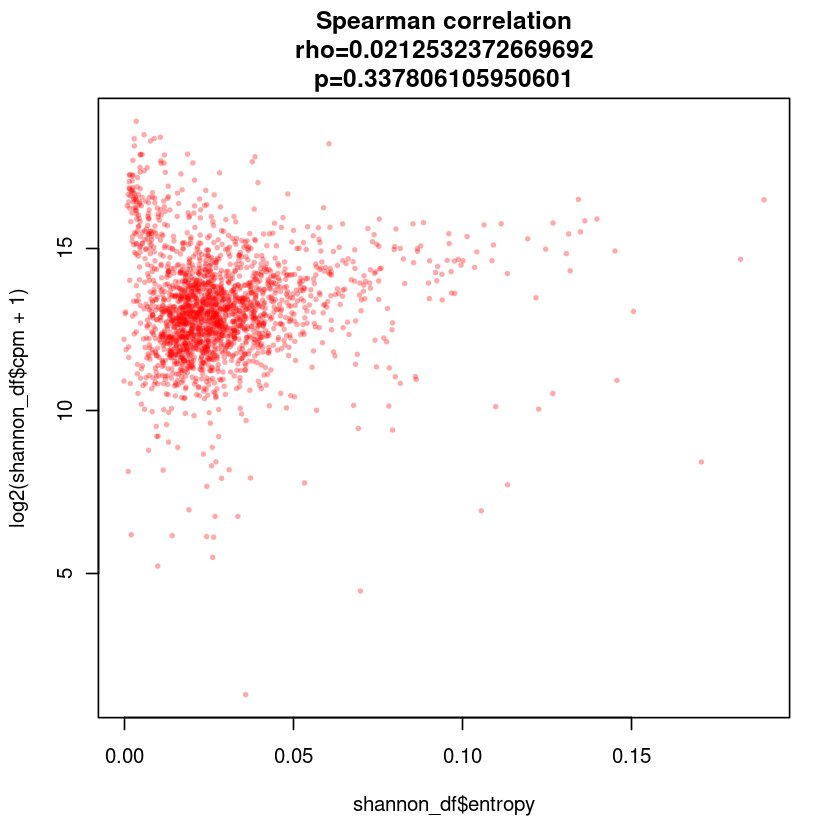

In [1124]:
c3=cor.test(shannon_df$entropy, log2(shannon_df$cpm+1), method="spearman" );c3

plot( shannon_df$entropy, log2(shannon_df$cpm+1), pch=16, cex=0.5, col='#ff000055',
    main=paste0("Spearman correlation\nrho=", c3$estimate, '\np=',c3$p.value))

## 对apa shannon index 分bin统计 cpm

In [1105]:
sapply( split(shannon_df[,-1], (100*shannon_df$entropy) %/% 2 ), dim )

0,1,2,3,4,5,6,7,8,9
743,917,237,76,32,13,12,3,1,2
8,8,8,8,8,8,8,8,8,8


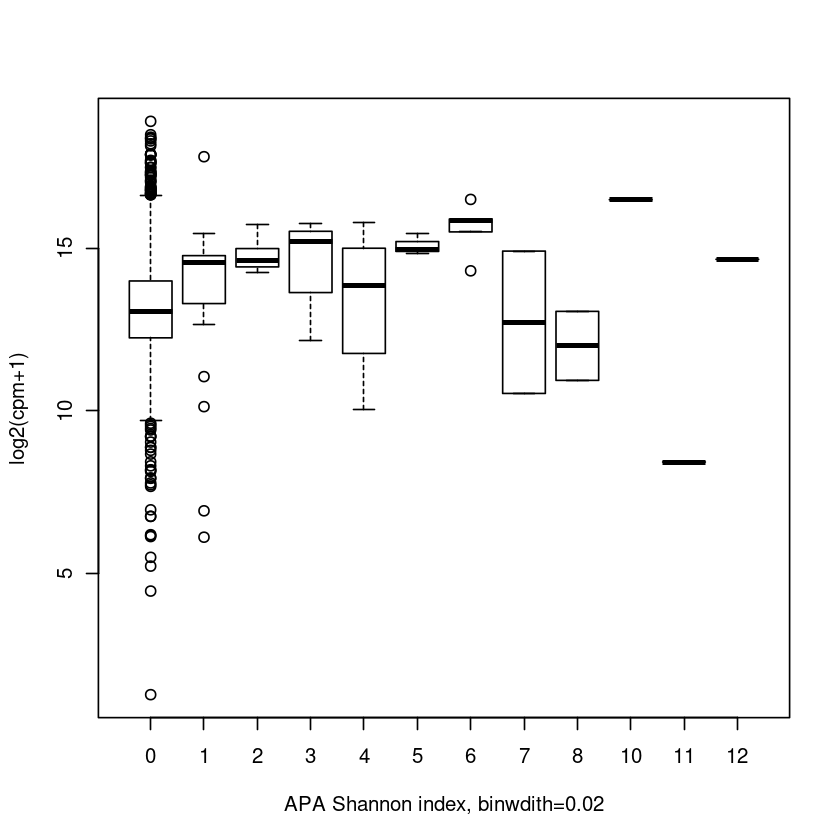

In [1129]:
t1=sapply(  split(shannon_df[,'cpm'], (100*shannon_df$entropy2) %/% 2 ) , function(x){
    sapply(x,mean)
})
#t1
t2=lapply(t1, function(x){ log2(x+1) })
#head(t2)
boxplot(t2, xlab="APA Shannon index, binwdith=0.02", ylab="log2(cpm+1)")

In [1133]:
## high Shannon index genes: use 2 sites in one cell
shannon_df_Big=shannon_df[which(shannon_df$entropy>0.055),]
shannon_df_Big=shannon_df_Big[order(-shannon_df_Big$entropy),]
dim(shannon_df_Big)
head(shannon_df_Big)

[1] 172   9

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,entropy,entropy2,sd
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RPL23,RPL23,223,23.38036,19.02151,135571,92596.8036,0.1891907,0.2121194,0.09806721
DNAJC15,DNAJC15,131,47.85952,27.26722,41697,25952.9538,0.1822621,0.2495716,0.12789883
ST6GALNAC2,ST6GALNAC2,26,57.19943,22.67563,228,342.8832,0.1706715,0.2337666,0.13681646
C1orf43,C1orf43,180,43.02326,34.59759,12530,8547.0120,0.1506233,0.1705364,0.11732345
TMEM79,TMEM79,30,62.63055,25.47949,2690,1959.7197,0.1457069,0.1756414,0.12735796
OTUB1,OTUB1,210,48.23732,37.58395,43439,30941.8567,0.1451398,0.1505737,0.10381587


In [1134]:
write.table(shannon_df_Big, "6_8_shannon_df_Big.txt", quote = F)
writeLines(rownames(shannon_df_Big), "6_8_shannon_df_Big_geneName.txt")

[1] 2036    9

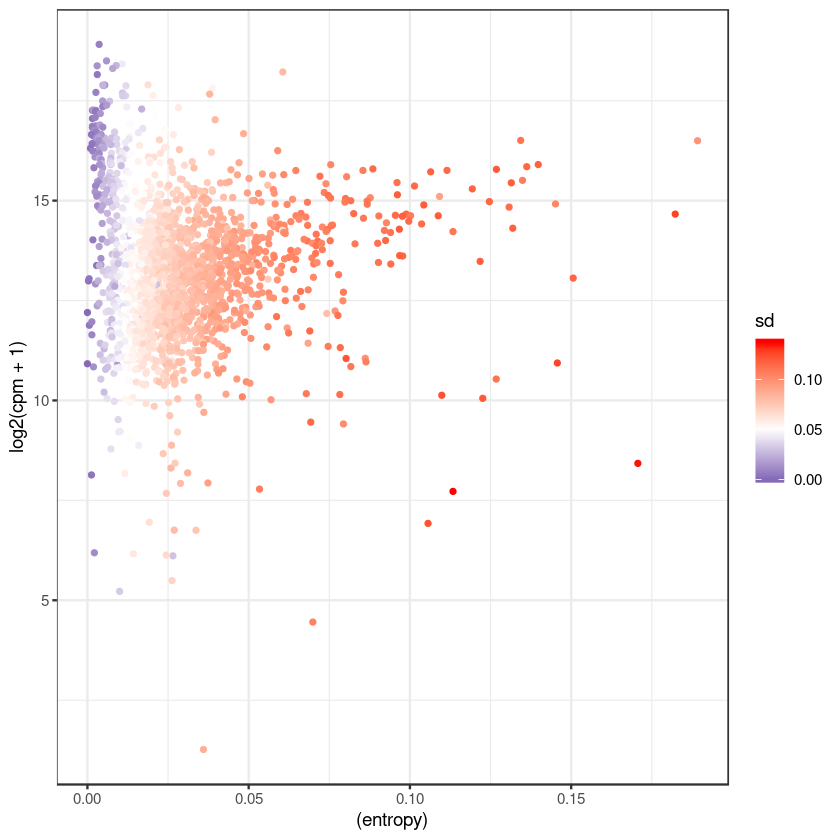

In [1140]:
dim(shannon_df)
ggplot(shannon_df, aes( (entropy), log2(cpm+1), color=sd ))+
    geom_point(size=1)+
    scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =0.05 )+
    theme_bw()

## gene's dominate DPAU cell ratio

In [506]:
dim(DPAU)
DPAU[1:3,1:10]

[1] 2082  225

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35,c04ROW06,c04ROW14,c05ROW02,c05ROW14,c05ROW19
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,50,100,NA,34.48276,39.375,0,0
AASDHPPT,NA,NA,100,100,NA,NA,NA,NA,NA,100


[1] 0.8479108

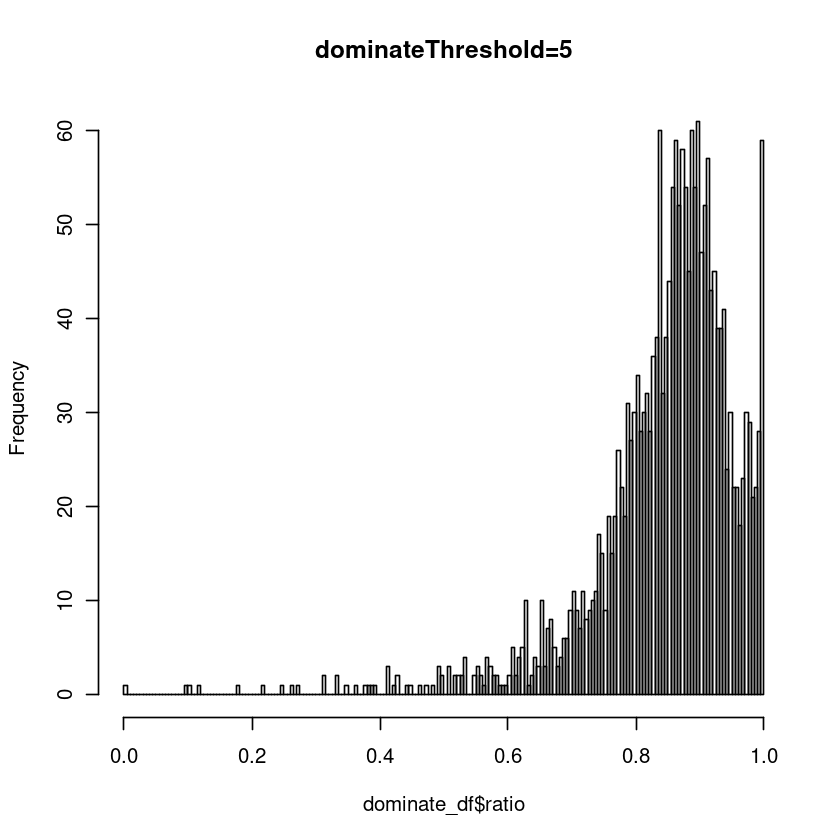

In [566]:
# define a gene's DPAU <=5 or >=95 as dominate
# cell ratio of dominate or not
get_dominate_df=function(dominateThreshold){
    #dominateThreshold=5
    i=0
    dominate_df=NULL
    for(gene in rownames(DPAU)){
        i=i+1
        #if(i>200){break;}

        #get a row
        tmp=DPAU[gene,]
        #filter NA
        tmp=tmp[, !is.na(tmp)]

        #define dorminate
        tmp2=apply(tmp, 1, function(x){
            ifelse(x<=dominateThreshold,1, ifelse(x>=(100-dominateThreshold), 1, 0))
        })
        tmp2=as.data.frame(t(tmp2))
        # count
        total=ncol(tmp2)
        dominate=sum(tmp2[gene,])

        #output
        #printP(gene, total, dominate)
        #print(tmp)
        #print( tmp2 )
        #print(table(as.numeric(tmp2)) )
        dominate_df=rbind(dominate_df, data.frame(
            gene=gene,
            totalCell=total,
            dominateCell=dominate,
            nonDominateCell=total-dominate,
            ratio=dominate/total
        ))
    }
    rownames(dominate_df)=dominate_df$gene
    dominate_df=dominate_df[order(-dominate_df$ratio),]
    
    #print(i)
    #dim(dominate_df)
    #head(dominate_df)
    
    return(dominate_df)
}
##
dominateThreshold=5
dominate_df=get_dominate_df(dominateThreshold)
hist(dominate_df$ratio, n=200, main=paste0("dominateThreshold=",dominateThreshold) )
mean(dominate_df$ratio)

[1] 2082    5

,gene,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>
ATP5MC1,ATP5MC1,219,219,0,1
ATP6V0E1,ATP6V0E1,218,218,0,1
COX7A2,COX7A2,225,225,0,1
CRTC3,CRTC3,37,37,0,1
CUL2,CUL2,31,31,0,1
FLVCR1,FLVCR1,25,25,0,1


png 
  2

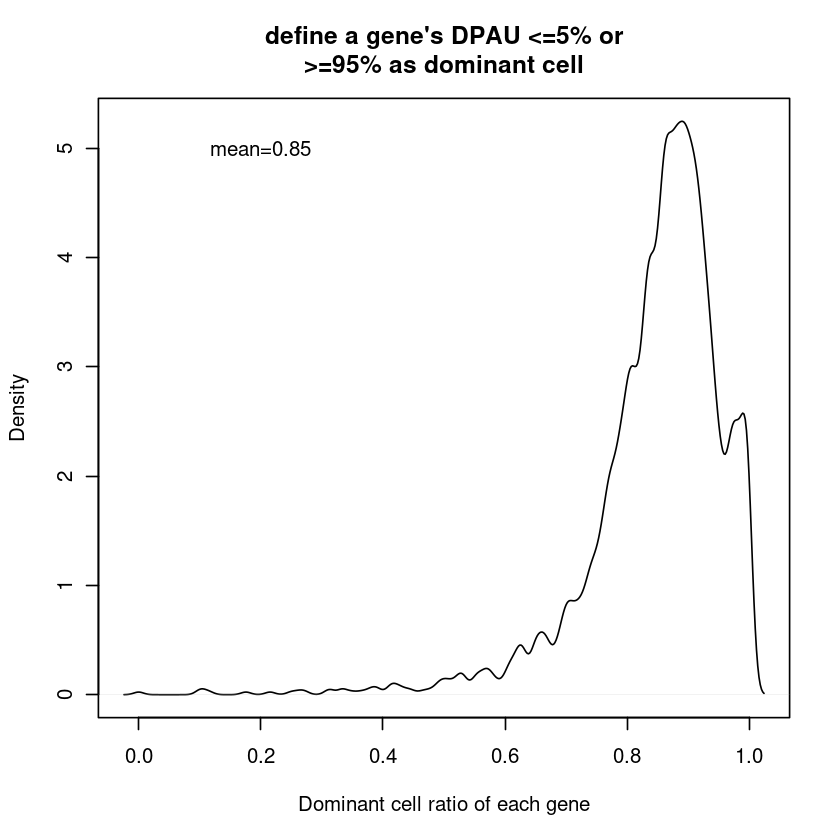

In [583]:
dim(dominate_df)
head(dominate_df)

CairoPDF('6_9_Dominant_cell_ratio_of_each_gene.pdf', width=4,height=4)
plot(density(dominate_df$ratio, bw=0.008), 
     xlab="Dominant cell ratio of each gene", 
     main=paste0("define a gene's DPAU <=5% or\n>=95% as dominant cell") )
text(0.2,5, paste0("mean=",round( mean(dominate_df$ratio),2 )) )
dev.off()

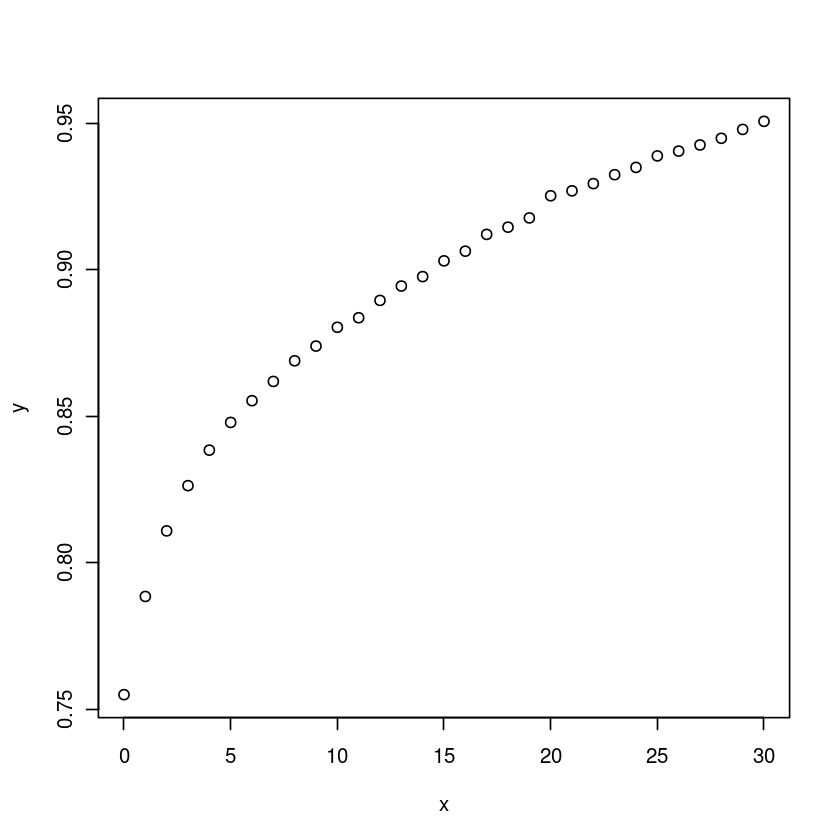

In [549]:
## for a range [耗时]
if(0){
    x=seq(0,30,1)
    y=c()
    for(i in x ){
        dominateThreshold=i
        dominate_df=get_dominate_df(dominateThreshold)
        #hist(dominate_df$ratio, n=100, main=paste0("dominateThreshold=",dominateThreshold) )
        y=c(y, mean(dominate_df$ratio) )
    }
    plot(x,y)
}

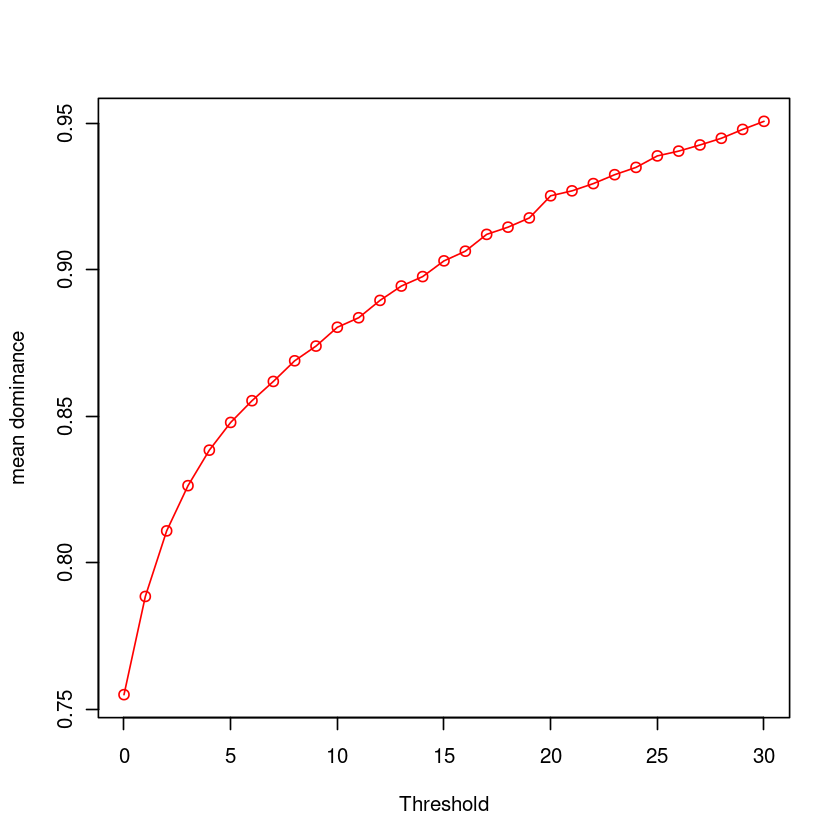

In [553]:
plot(x,y, type='o', col='red', xlab="Threshold", ylab="mean dominance")

In [587]:
dim(dominate_df)
head(dominate_df)

[1] 2082    5

,gene,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>
ATP5MC1,ATP5MC1,219,219,0,1
ATP6V0E1,ATP6V0E1,218,218,0,1
COX7A2,COX7A2,225,225,0,1
CRTC3,CRTC3,37,37,0,1
CUL2,CUL2,31,31,0,1
FLVCR1,FLVCR1,25,25,0,1


In [586]:
dim(rsDF)
head(rsDF)

[1] 2036    6

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3


In [588]:
gene.set1=intersect( rownames(dominate_df), rownames(rsDF) )
length(gene.set1)
head(gene.set1)

[1] 2036

[1] "ATP5MC1"  "ATP6V0E1" "COX7A2"   "CRTC3"    "CUL2"     "FLVCR1"

In [592]:
dif=cbind(rsDF[gene.set,],  dominate_df[gene.set,-1] ) 
dim(dif)
head(dif)

[1] 2036   10

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,225,225,0,1.0000000
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,225,223,2,0.9911111
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,19,16,3,0.8421053
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,224,222,2,0.9910714
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,224,219,5,0.9776786
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,225,221,4,0.9822222


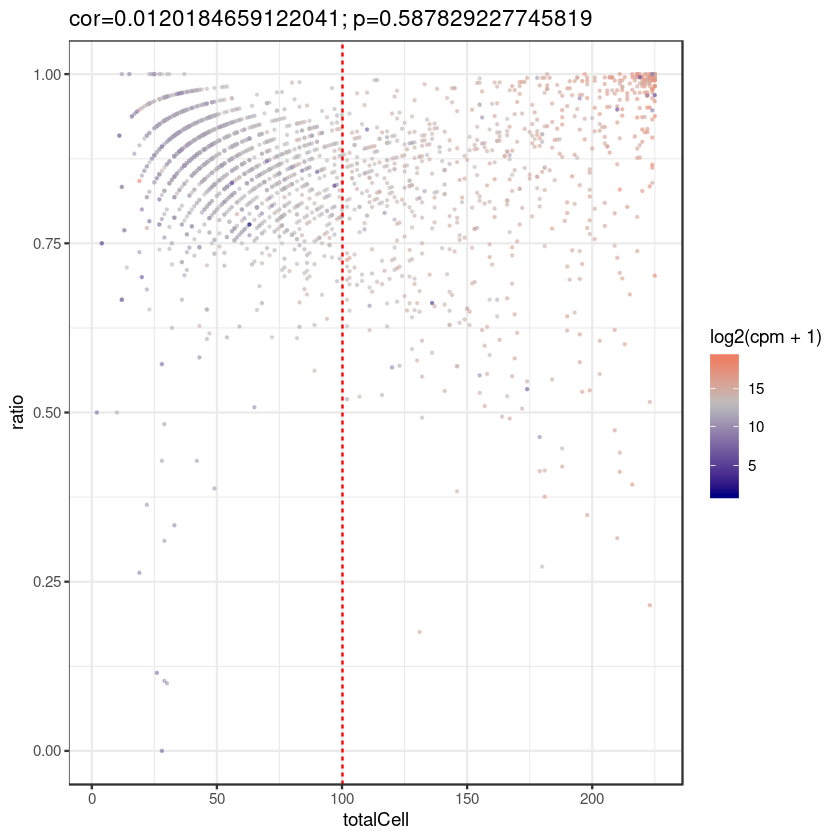

In [1343]:
# total cell number VS dominant cell ratio; no sig cor
#cor3=cor.test(dif$totalCell, dif$ratio, method="spearman")
cor3=cor.test(dif$totalCell, dif$ratio, method="pearson")

ggplot(dif, aes(totalCell, ratio, color=log2(cpm+1)))+
    geom_point(alpha=0.5, size=0.2)+
    scale_color_gradient2(low="navy", mid='grey',  high="red", midpoint =13 )+
    theme_bw()+labs(title=paste0("cor=", cor3$estimate, '; p=',cor3$p.value) )+
    geom_vline(xintercept = 100, color="red", linetype='dashed')

Cairo 
    3

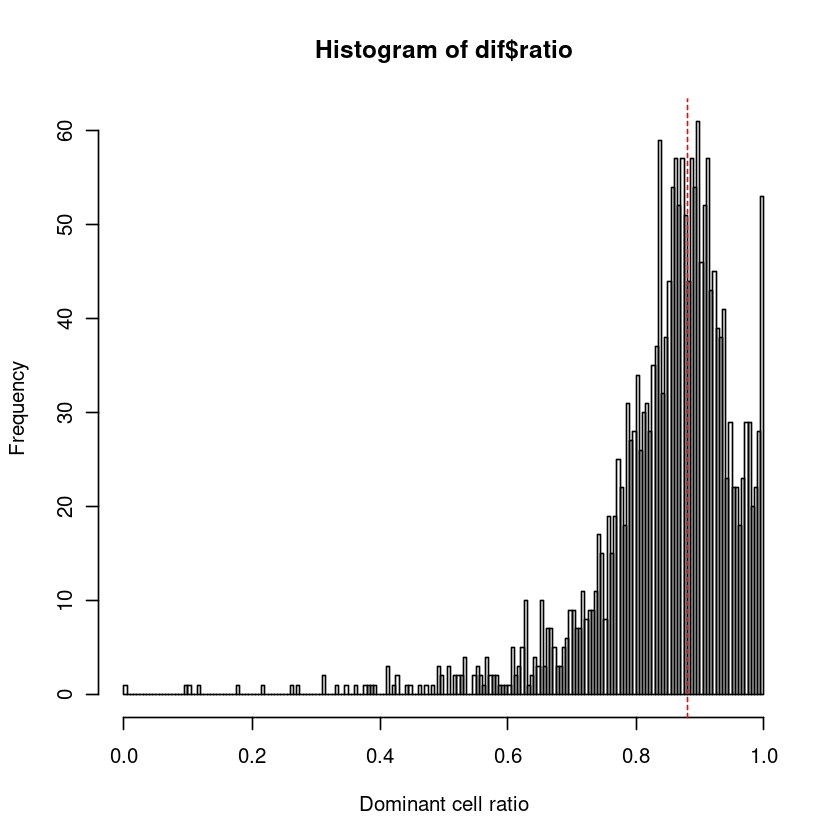

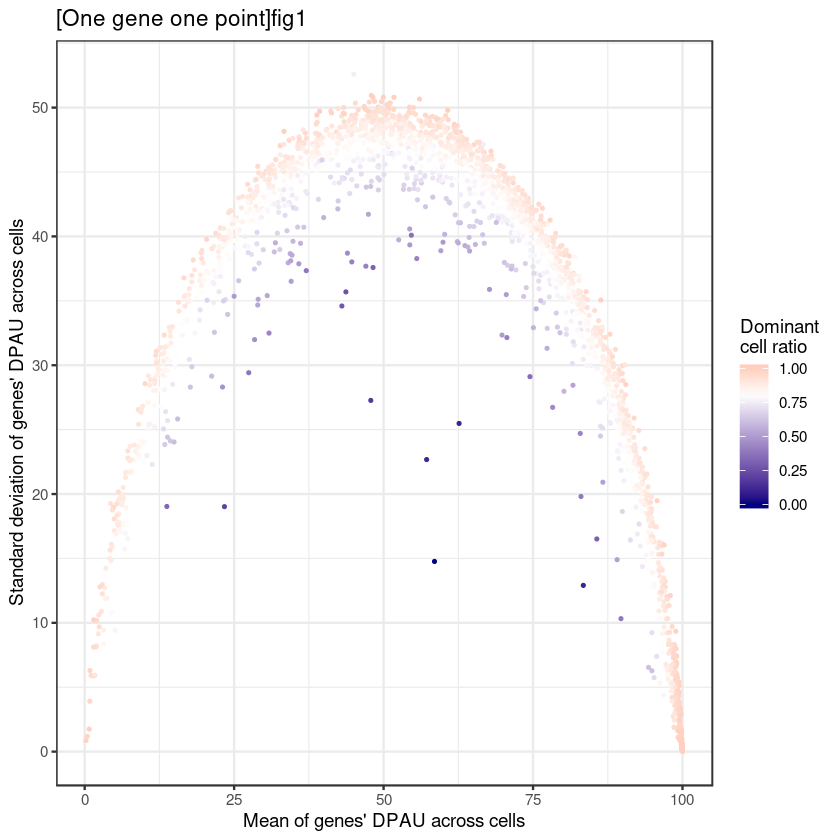

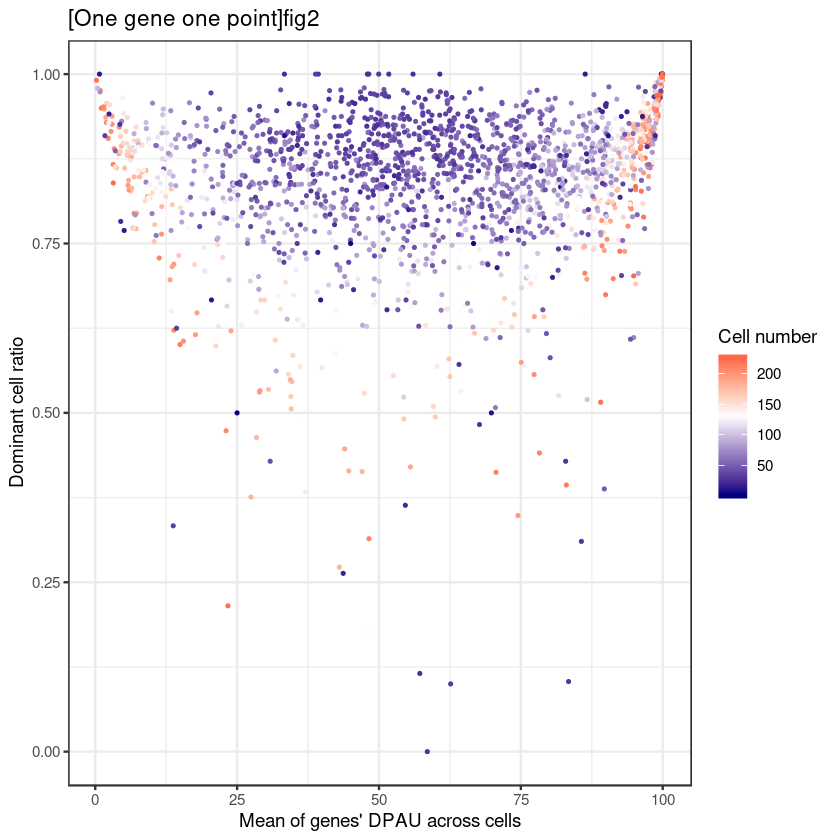

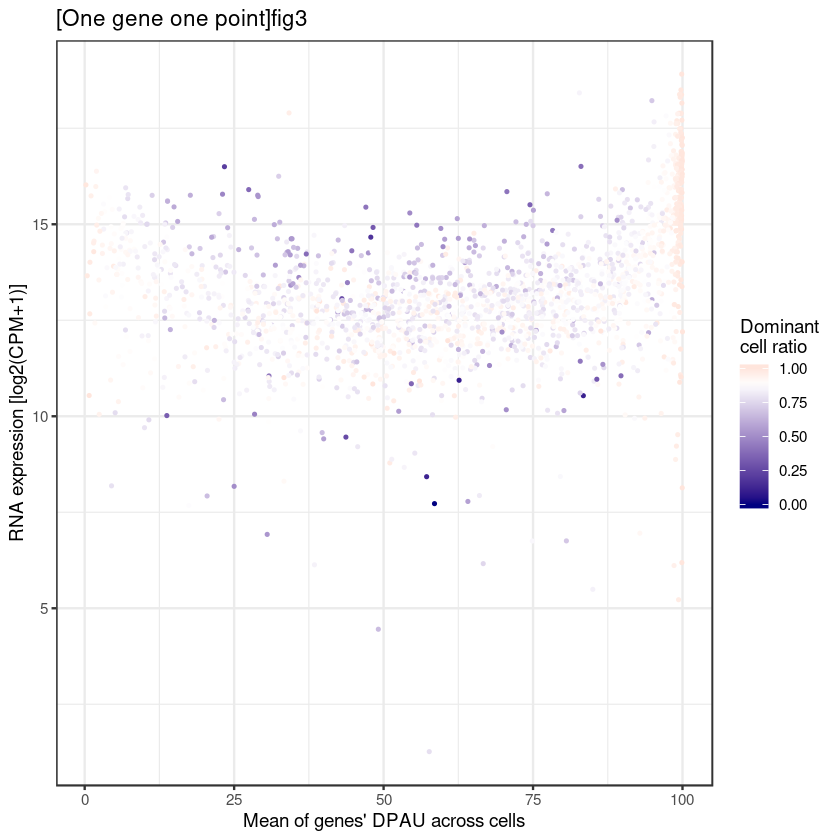

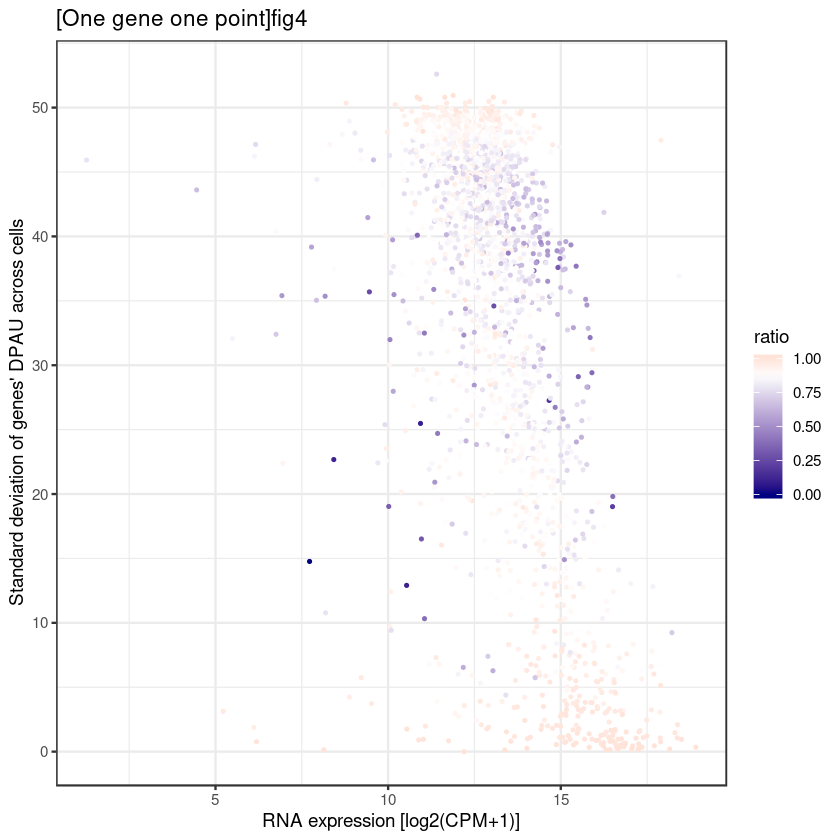

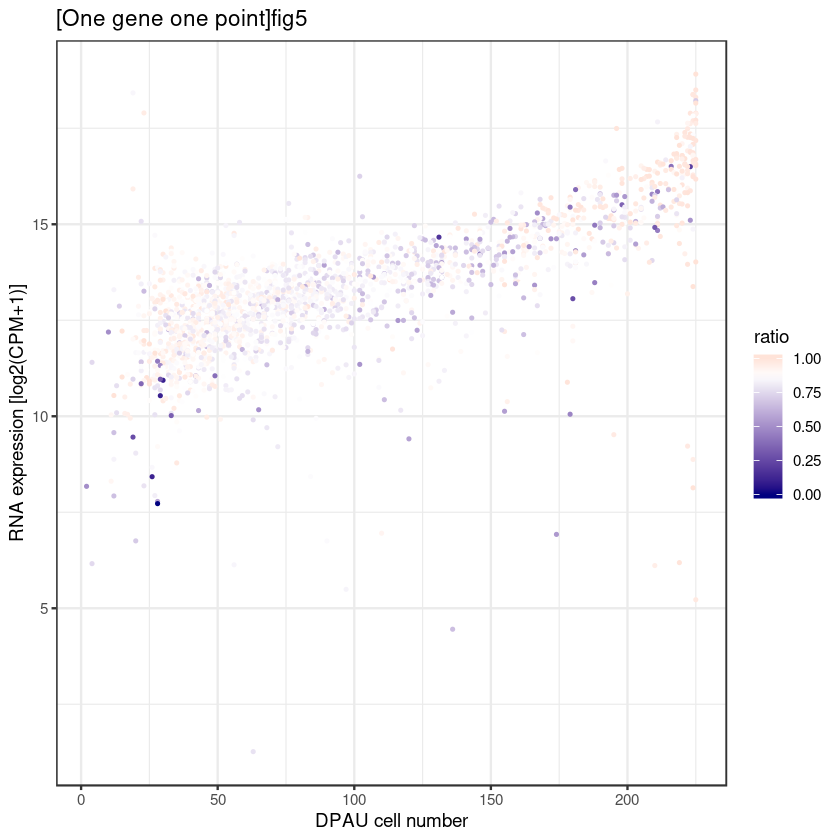

Cairo 
    3

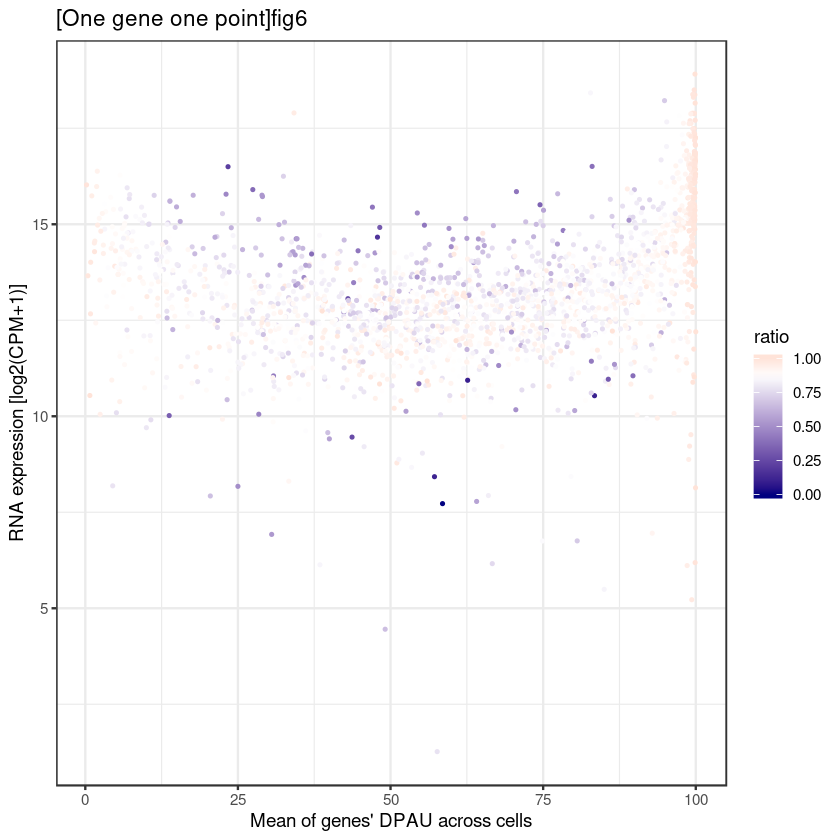

In [940]:
dev.off()
CairoPDF("6_9_0dominateCellRatio_gene_DPAUcellNumber_meanDPAU_sdDPAU_RNACounts.pdf", width=5, height=4)

#hist( rsDF$cpm, n=100)
hist( dif$ratio, n=200, xlab="Dominant cell ratio")
abline(v=0.88, col='red', lty=2 )
##1
ggplot(dif, aes(meanDPAU, sdDPAU, color=ratio ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2("Dominant\ncell ratio",
                        low="navy", mid='white',  high="red", midpoint =0.8 )+
  labs(x="Mean of genes' DPAU across cells", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]fig1")+
  theme_bw()
###2
ggplot(dif, aes(meanDPAU, ratio, color=DPAUcellNumber ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2('Cell number',
                        low="navy", mid='white',  high="red", midpoint =130 )+
  labs(x="Mean of genes' DPAU across cells", 
       y="Dominant cell ratio", 
       title="[One gene one point]fig2")+
  theme_bw()
###3
ggplot(dif, aes(meanDPAU, log2( cpm+1 ), color=ratio ))+
  geom_point(size=0.4) + 
#   #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
   scale_color_gradient2('Dominant\ncell ratio', 
                         low="navy", mid='white',  high="red", midpoint =0.88 )+
   labs(x="Mean of genes' DPAU across cells", y="RNA expression [log2(CPM+1)]" , 
        title=paste0("[One gene one point]fig3")  )+
  theme_bw()

###4
ggplot(dif, aes(log2( cpm+1 ), sdDPAU, color=ratio ))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('CPM', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2(,low="navy", mid='white',  high="red", midpoint =0.87 )+
  labs(x="RNA expression [log2(CPM+1)]", y="Standard deviation of genes' DPAU across cells", 
       title="[One gene one point]fig4")+
  theme_bw()

###5
ggplot(dif, aes(DPAUcellNumber,log2(cpm+1), color=ratio))+
  geom_point(size=0.4) + 
  scale_color_gradient2( low="navy", mid='white',  high="red", midpoint =0.87 )+
  labs(x="DPAU cell number",y="RNA expression [log2(CPM+1)]", 
       title="[One gene one point]fig5")+
  theme_bw()
###6
ggplot(dif, aes(meanDPAU,log2(cpm+1), color=ratio))+
  geom_point(size=0.4) + 
  #scale_colour_gradientn('Cell number', colours=c('blue', 'white', 'red') )+
  scale_color_gradient2( low="navy", mid='white',  high="red", midpoint =0.87 )+
  labs(x="Mean of genes' DPAU across cells",y="RNA expression [log2(CPM+1)]",
       title="[One gene one point]fig6")+
  theme_bw()

dev.off()

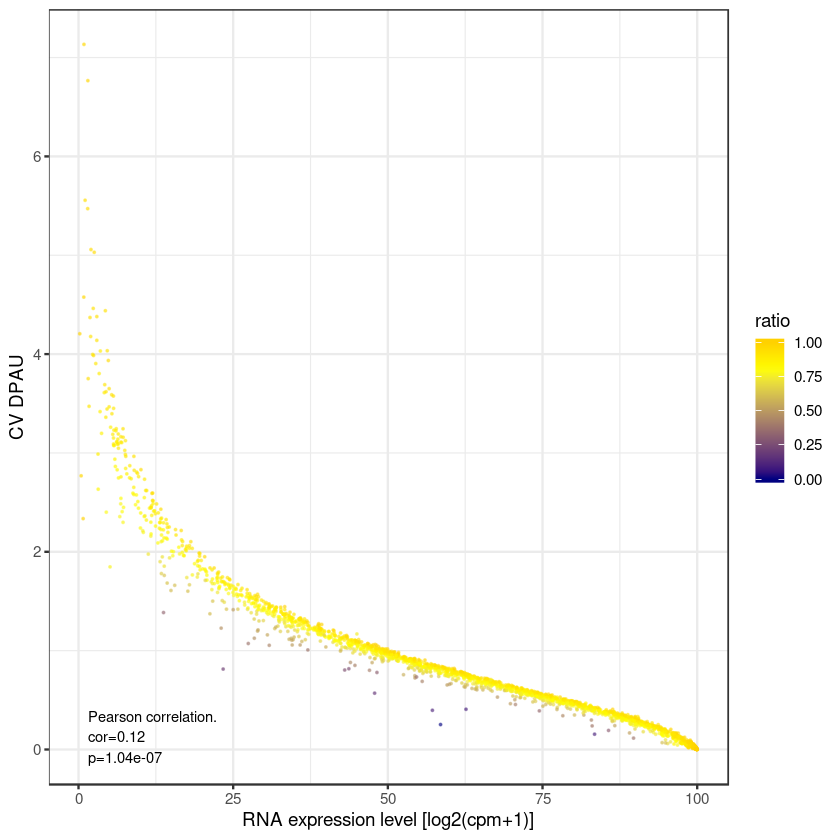

In [1003]:
ggplot(dif, aes( meanDPAU, sdDPAU/meanDPAU , color=ratio ))+
    geom_point(size=0.05, alpha=0.5)+
    scale_color_gradient2(low="navy", mid='yellow',  high="red", midpoint =0.80)+
    annotate("text", x=1.5, y=0.13, size=3, hjust = 0, #文字左对齐
        label=paste0("Pearson correlation. \ncor=", #拼接要显示的文字
                  round(c2$estimate,2), '\np=', p.value) )+
    theme_bw()+
    labs(x="RNA expression level [log2(cpm+1)]", 
         #y="Dominant cell ratio"
         y="CV DPAU"
        )


	Pearson's product-moment correlation

data:  log2(dif$cpm + 1) and dif$ratio
t = 5.3396, df = 2034, p-value = 1.035e-07
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.07451329 0.16019771
sample estimates:
      cor 
0.1175743 


png 
  2

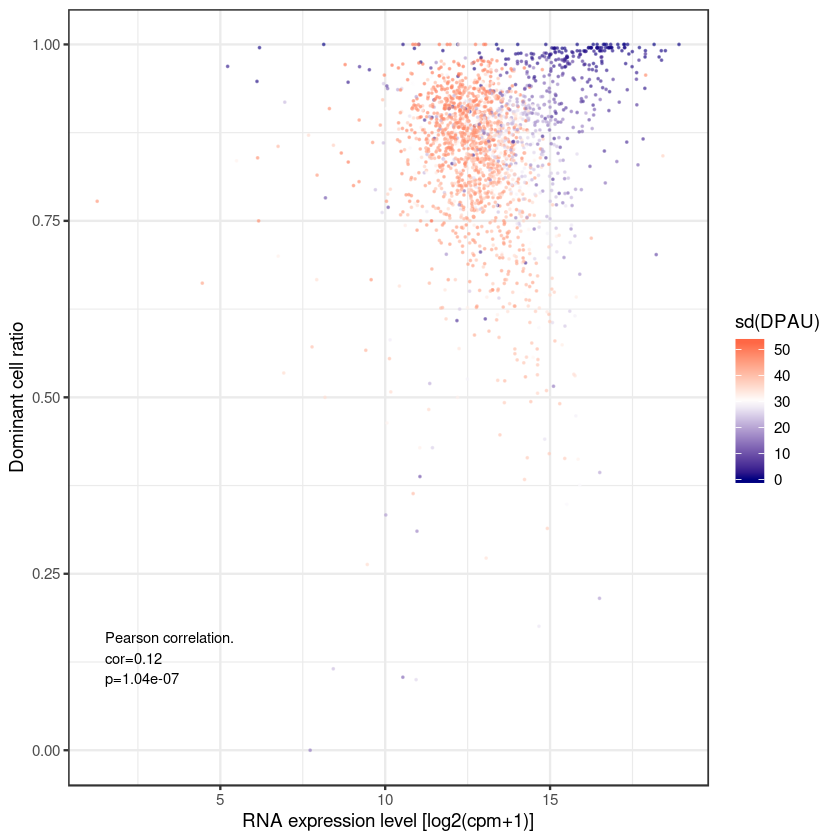

In [996]:
c2=cor.test(log2(dif$cpm+1), dif$ratio);c2
p.value=formatC(c2$p.value, digits = 3)

CairoPDF('6_9_3_dominantCellRatio_log2CPM.pdf',width=4,height=3.5)
ggplot(dif, aes(log2(cpm+1), ratio, color=sdDPAU))+
    geom_point(size=0.01, alpha=0.5)+
    scale_color_gradient2('sd(DPAU)',low="navy", mid='white',  high="red", midpoint =30)+
    annotate("text", x=1.5, y=0.13, size=3, hjust = 0, #文字左对齐
        label=paste0("Pearson correlation. \ncor=", #拼接要显示的文字
                  round(c2$estimate,2), '\np=', p.value) )+
    theme_bw()+
    labs(x="RNA expression level [log2(cpm+1)]", y="Dominant cell ratio")
dev.off()

png 
  2

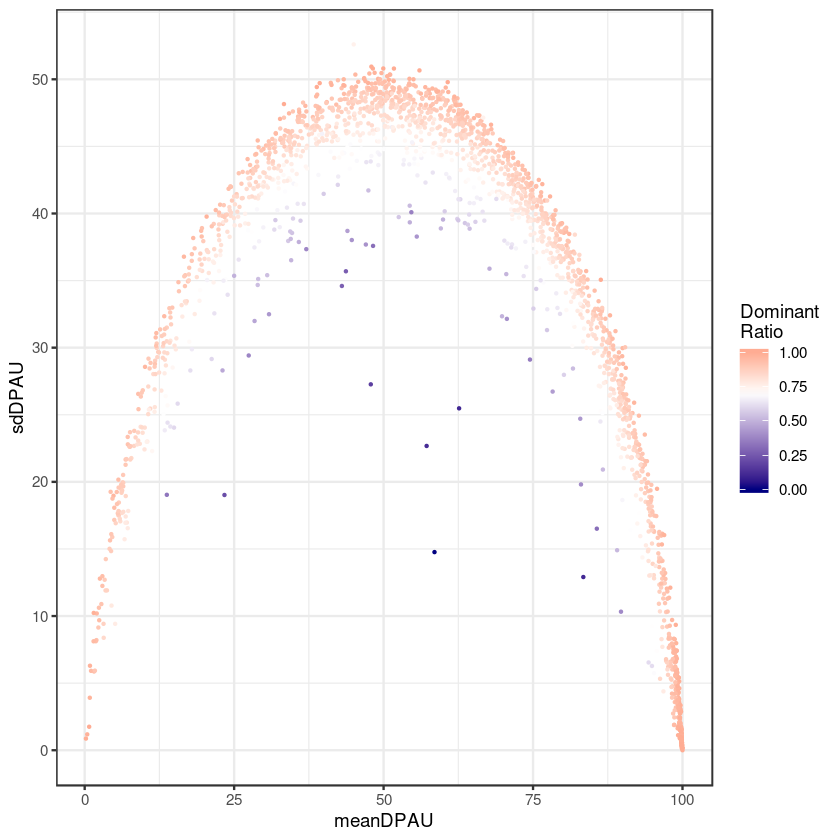

In [635]:
# too white. not used. Remake below this cell:
CairoPDF("6_9_meanDPAU_sdDPAU_dominantRatio.pdf", width=4,height=4)
ggplot(dif, aes(meanDPAU, sdDPAU, color=ratio))+
    geom_point(size=0.2)+
    scale_color_gradient2('Dominant\nRatio', low="navy", mid='white',  high="red", midpoint =0.7)+
    theme_bw()
dev.off()

[1] 1.00 0.99 0.84 0.99 0.98 0.98

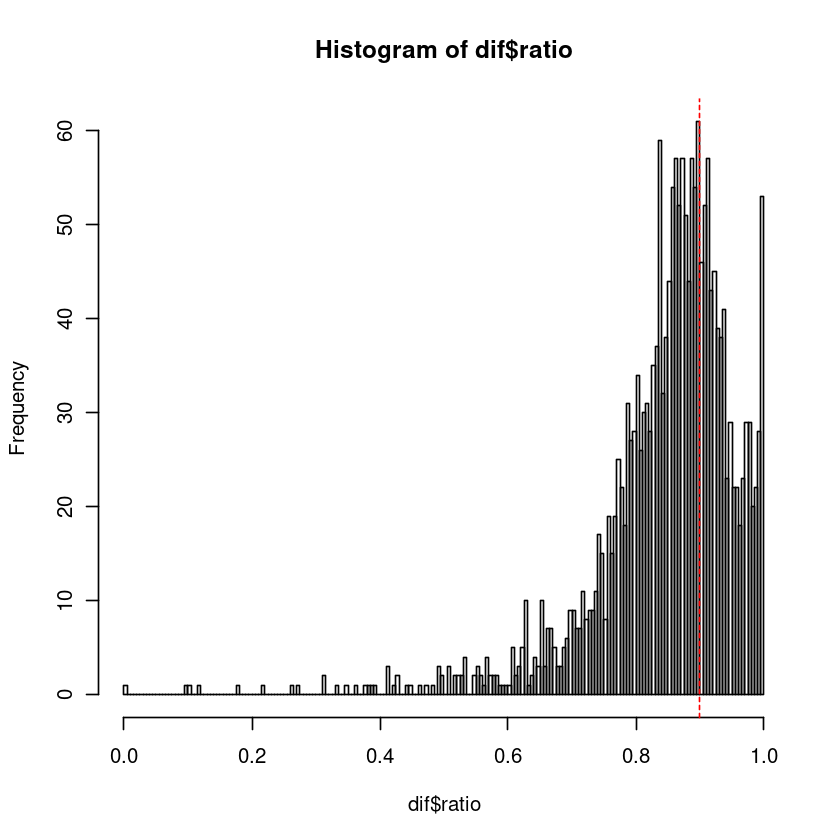

In [655]:
hist(dif$ratio, n=200)
abline(v=0.9, col='red', lty=2)

head(round(dif$ratio, 2))

Cairo 
    3

Cairo 
    3

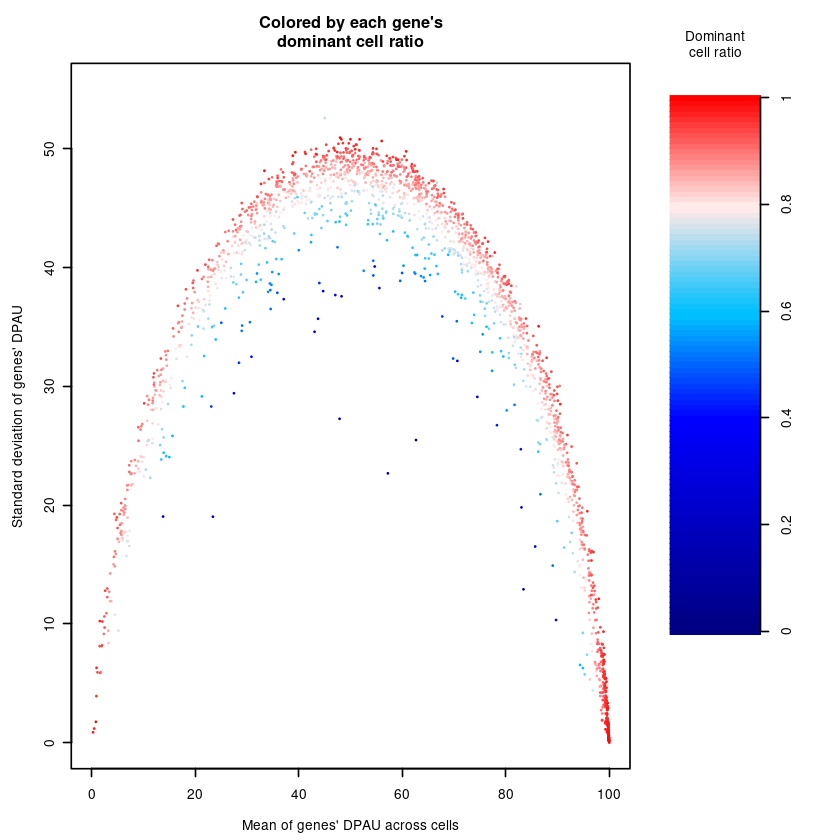

In [854]:
# 色彩取值范围是0-1，但是数据偏斜向1,0.5以下基本上没有值
bk0=seq(0.0,0.39,by=0.01) #almost non data
bk1=seq(0.4,0.59,by=0.01)
bk2=seq(0.6,0.79,by=0.01)
bk3=seq(0.8,1,by=0.01)
#
colors = c(
    colorRampPalette(colors = c("navy","blue"))(length(bk0)),
    colorRampPalette(colors = c("blue","#00BFFF"))(length(bk1)),
    colorRampPalette(colors = c("#00BFFF","#FFE9E9"))(length(bk2)),
    colorRampPalette(colors = c("#FFE9E9","red"))(length(bk3)) 
)
debug=F
if(debug==T){
    length(colors)
    tail(head(colors,n=60))
    colors[0.82*100]
    class(colors)
    str(colors)
}
#
dev.off()
CairoPDF('6_9_dominantCellRatio_mean_sd_DPAU.pdf', width=4.5,height=4)

#sub plot
mat = matrix(c(1,1,1,1,1,1,2,2), nrow=1, byrow=TRUE);
layout(mat)

############
#step1: plot
par(mar=c(4.5,4.5,4,0))
plot(NULL, xlim=c(0,100), ylim=c(0,55), type='n', 
     xlab="Mean of genes' DPAU across cells", 
     ylab="Standard deviation of genes' DPAU", 
     main="Colored by each gene's\ndominant cell ratio")
for(i in 1:nrow(dif)){
    #if(i>10){break;}
    v=round(dif$ratio[i],2)*100
    color=colors[v]
    
    #printP(">>>>>>",i, v, color)
    
    points(dif[i,'meanDPAU'], dif[i, 'sdDPAU'],
           pch=20,
           cex=0.05,
           col=color)
}

############
#step2: 用image函数画color bar
par(mar=c(13,2.5,6,5)) #bottom, left, top, right
n=100
image(t(matrix(0:n)),col=colors,
      xaxt="n",
      yaxt="n",
      cex = 1.5,
      mgp=c(0,1,0),
      #main="Dominant\ncell ratio",
      bty='n',#box type
      xlab = "", ylab = ""
)
text(x=0,y=1.1,labels=c("Dominant\ncell ratio"),xpd=T)
axis(4,at=seq(0,1,by=0.2), #seq(0,n,by=200),
     labels=seq(0,1,0.20),
     cex.axis=1, #坐标轴刻度字体大小
     #col.axis="red", #坐标轴刻度字体颜色
     #col="purple", #坐标轴颜色
     lwd=1, #坐标轴刻度粗细
     las=0)#las=0垂直于轴，2平行于轴
#
dev.off()

In [624]:
write.table(dif, '6_9_gene_DPAU_dominant_ratio_DF.txt',quote = F)

### filter out genes whose totalCell number <100

png 
  2

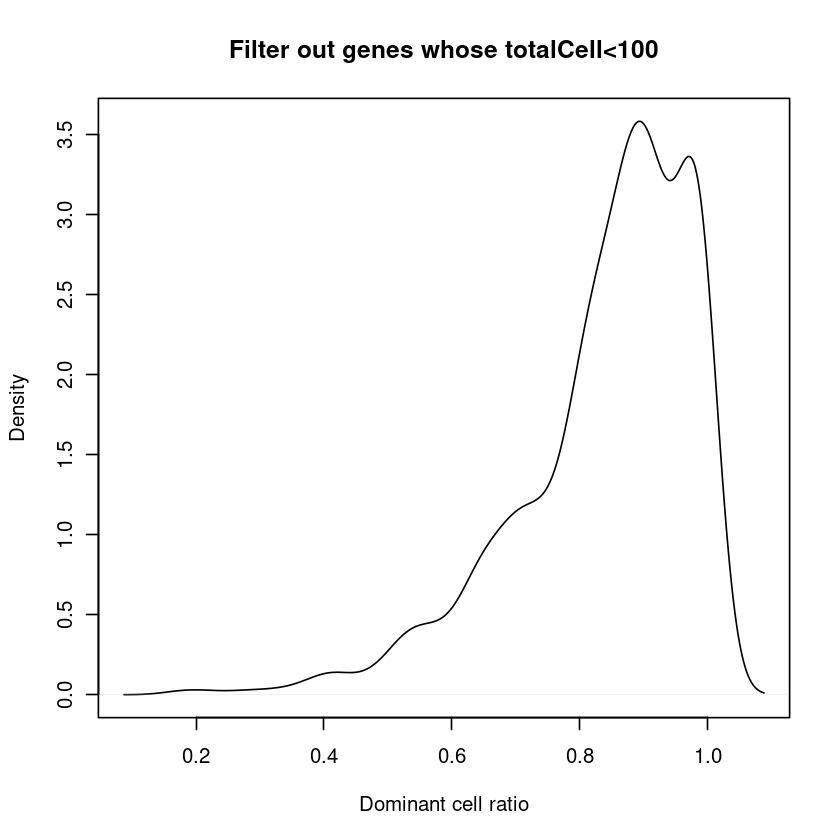

In [1346]:
CairoPDF('6_9_1_dominantCellRatio_density_mt100Cells.pdf', width=4.5,height=4.5)
plot(density(dif[which(dif$totalCell>=100),]$ratio), xlab="Dominant cell ratio", main="Filter out genes whose totalCell<100")
dev.off()

In [1354]:
threshold=0.8
gene.set2=rownames(dif[dif$ratio<threshold & dif$totalCell>=100,]);
writeLines(gene.set2, paste0('6_9_gene_DPAU_dominant_ratio_lessThan_',threshold,'.txt') )
message(threshold, ':', length(gene.set2))

0.8:206



In [857]:
# GO analysis

### domidant cell ratio negative correlate with APA Shannon index 

In [1142]:
dim(shannon_df)
head(shannon_df)

[1] 2036    9

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,entropy,entropy2,sd
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,0.003636281,0.001105200,0.007455458
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,0.005928237,0.000000000,0.014837377
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,0.010766408,0.000000000,0.043022427
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,0.003016374,0.000000000,0.014029514
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,0.008923149,0.000000000,0.025886527
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,0.007833098,0.003279819,0.020452432


In [1143]:
dim(dif)
head(dif)

[1] 2036   10

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,225,225,0,1.0000000
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,225,223,2,0.9911111
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,19,16,3,0.8421053
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,224,222,2,0.9910714
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,224,219,5,0.9776786
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,225,221,4,0.9822222


In [1145]:
#length( intersect(rownames(dif), rownames(shannon_df)))
dif3=dif
dif3$entropy=shannon_df[rownames(dif3), ]$entropy
head(dif3)

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,totalCell,dominateCell,nonDominateCell,ratio,entropy
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,225,225,0,1.0000000,0.003636281
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,225,223,2,0.9911111,0.005928237
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,19,16,3,0.8421053,0.010766408
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,224,222,2,0.9910714,0.003016374
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,224,219,5,0.9776786,0.008923149
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,225,221,4,0.9822222,0.007833098



	Pearson's product-moment correlation

data:  dif3$entropy and dif3$ratio
t = -111.85, df = 2034, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.9332818 -0.9211112
sample estimates:
       cor 
-0.9274417 


png 
  2

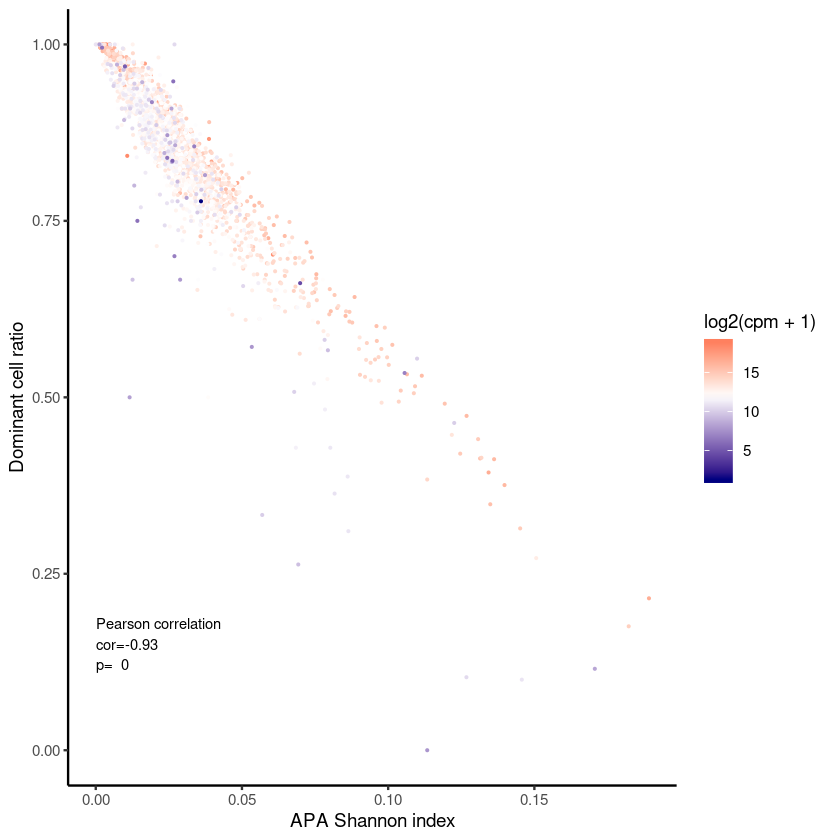

In [1176]:
c691=cor.test(dif3$entropy, dif3$ratio)
c691

CairoPDF("6_9_1_APAShannonIndex_DominantCellRatio.pdf", width=4,height=3.5)
ggplot(dif3, aes(entropy, ratio, color=log2(cpm+1)))+geom_point(size=0.1)+
    scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =12 )+
    annotate("text", x=0, y=0.15, size=3, hjust = 0, #文字左对齐
        label=paste0("Pearson correlation\ncor=", #拼接要显示的文字
                  round(c691$estimate,2), '\np=', 
                     formatC(c691$p.value,digits = 2)) )+
    theme_classic()+
    labs(x="APA Shannon index",y="Dominant cell ratio")
dev.off()

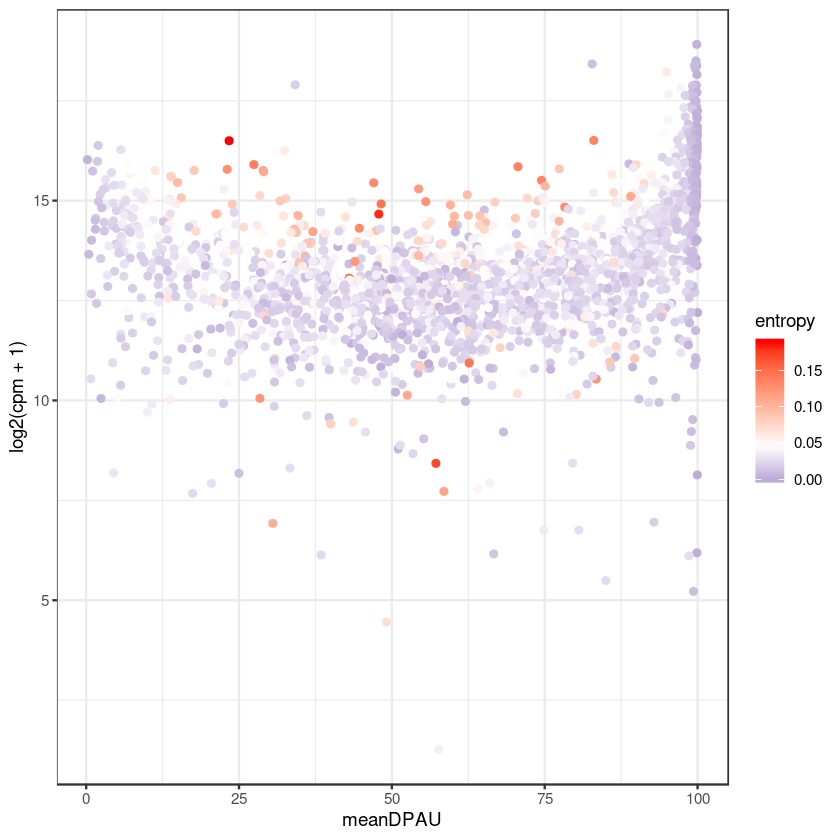

In [1154]:
ggplot(dif3, aes(meanDPAU, log2(cpm+1), color=entropy ))+
    scale_color_gradient2(low="navy", mid='white',  high="red", midpoint =0.045 )+
    geom_point()+theme_bw()

## (RNA, DPAU)heatmap of dominate cell ratio genes

In [1355]:
head(dif)

threshold=0.65
gene.set2=rownames(dif[dif$ratio<threshold & dif$totalCell>=100,]);
length(gene.set2)
head(gene.set2)

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
RPL8,RPL8,225,99.86553,0.3462266,712259,492539.3,225,225,0,1.0000000
RPL3,RPL3,225,99.73653,0.9470744,542531,369992.2,225,223,2,0.9911111
RPS23,RPS23,19,82.75423,36.9176673,516940,350992.6,19,16,3,0.8421053
COX4I1,COX4I1,224,99.84831,1.0692406,507466,339512.8,224,222,2,0.9910714
UQCRH,UQCRH,224,99.50125,2.0955387,490253,341233.6,224,219,5,0.9776786
RPLP2,RPLP2,225,99.61910,1.4710506,467247,324160.3,225,221,4,0.9822222


[1] 74

[1] "RPS26"   "RPL23"   "ARHGDIB" "LMAN2"   "JPT1"    "NDUFA2"

In [1356]:
getNormalizedCts <- function ( cts ) {
    #cts <- read.table ( ctsPath , header = T , as.is = T )
    apply ( cts , 2 , function ( x ) { log2 ( ( 10^6 ) * x / sum ( x ) + 1 ) })
}
rnaM.cpm=apply(rnaM, 2, function(x){
    1e6*x/sum(x)
})
# rnaM.log2cpm= apply(rnaM.cpm, 2, function(x){
#     log2(x+1)
# }) #

#
rnaM.log2cpm=getNormalizedCts(rnaM)
#
dim(rnaM.log2cpm) #18679 225
head(rnaM.log2cpm)

[1] 18679   225

,c01ROW24,c01ROW35,c01ROW31,c05ROW02,c05ROW14,c05ROW19,c05ROW31,c05ROW33,c2ROW19,c3ROW02,⋯,c19ROW30,c19ROW32,c19ROW33,c19ROW34,c19ROW35,c19ROW36,c19ROW37,c19ROW38,c19ROW39,c19ROW40
A1BG-AS1,0,0,0,0,0,0.000000,0,0.000000,0,0,⋯,1.698578,1.369031,0.847305,0.000000,0.0000000,0,0,0,0,0
A2M,0,0,0,0,0,0.000000,0,0.000000,0,0,⋯,0.000000,0.000000,0.000000,4.747776,0.8775856,0,0,0,0,0
A2M-AS1,0,0,0,0,0,0.000000,0,0.000000,0,0,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0,0,0,0,0
A2ML1,0,0,0,0,0,0.000000,0,0.000000,0,0,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0,0,0,0,0
A2MP1,0,0,0,0,0,8.318268,0,0.000000,0,0,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0,0,0,0,0
A4GALT,0,0,0,0,0,0.000000,0,2.611868,0,0,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0,0,0,0,0


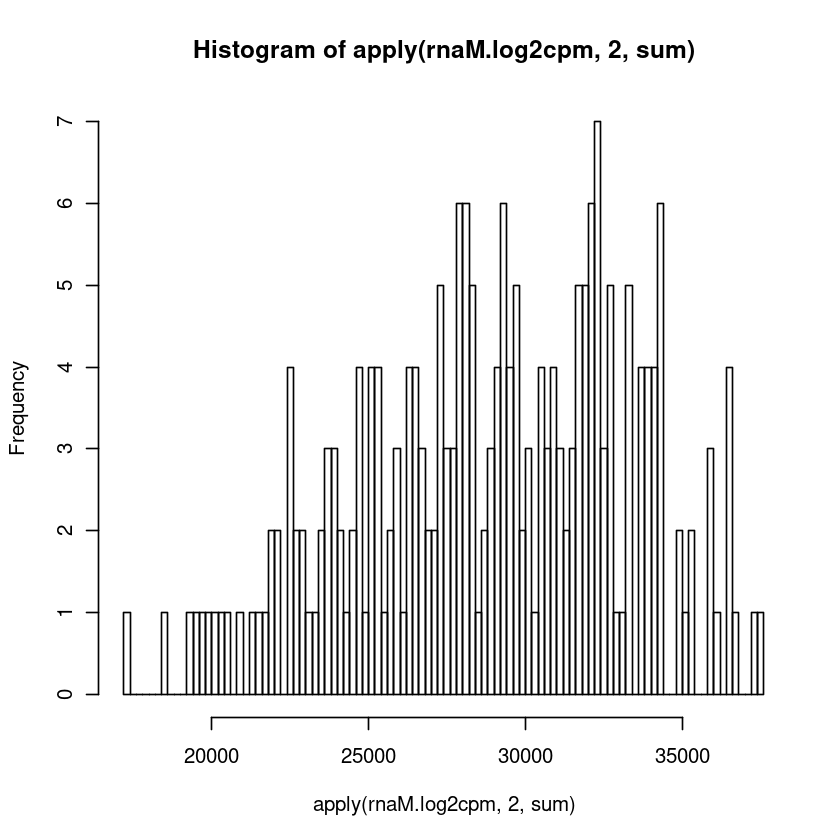

In [1357]:
hist( apply(rnaM.log2cpm,2,sum), n=100 )

,cellType,cellType2,cellCycle
,<fct>,<fct>,<fct>
c01ROW24,HeLa_sync,HeLa_syncMix,G2M
c01ROW35,HeLa_sync,HeLa_syncMix,M


$cellType
       BC_0        BC_1 HeLa_normal   HeLa_sync 
   "yellow"    "orange"   "#619CFF"   "#98BEFD" 

$cellType2
        BC_0         BC_1  HeLa_normal    HeLa_sync HeLa_syncMix 
    "yellow"     "orange"    "#619CFF"    "#98BEFD"    "#CADEFF"

[1] 19

Cairo 
    3

Cairo 
    3

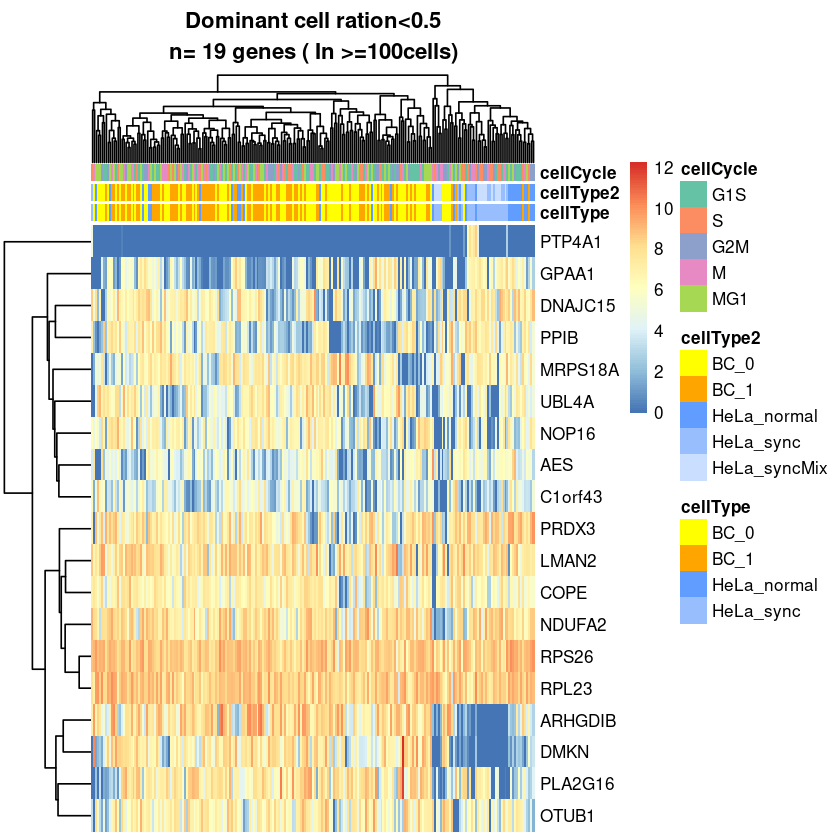

In [1428]:
# 构建列注释信息
annotation_col = data.frame(
  cellType = as.character(cellInfo$cellType),
  cellType2 = as.character(cellInfo$cellType2),
  cellCycle=factor(cellInfo$cellCycle, levels = c('G1S', 'S', 'G2M', 'M', 'MG1') )
)
rownames(annotation_col) = rownames(cellInfo)
head(annotation_col, n=2)
#str(annotation_col)

# 自定义注释颜色
col=RColorBrewer::brewer.pal(n = 5,name = "Set2")
#barplot(1:5,col=col)

# 自定注释信息的颜色列表
ann_colors = list(
  #batch=c('1'='white', '2'='black'),
  cellType = c('BC_0'="yellow", 'BC_1'="orange", 'HeLa_normal'="#619CFF", 'HeLa_sync'="#98BEFD"),
  cellType2 = c('BC_0'="yellow", 'BC_1'="orange", 'HeLa_normal'="#619CFF", 'HeLa_sync'="#98BEFD", 'HeLa_syncMix'="#CADEFF"),
  cellCycle=c('G1S'=col[1], 'S'=col[2], 'G2M'=col[3],   'M'=col[4], 'MG1'=col[5])
)
head(ann_colors, n=2)

######################
# can change condition here
######################
threshold=0.5
#t  height
#0.5 6
#0.6 11

gene.set2=rownames(dif[dif$ratio<threshold & dif$totalCell>100,]);
length(gene.set2)
dev.off()
CairoPDF(paste0("6_10_heatMap_RNA_dominantCellRatio_lt_",threshold,".pdf"), width=8,height=6)
library(pheatmap)
pheatmap(rnaM.log2cpm[gene.set2, ], 
         border=FALSE,
         #scale = 'row',
         show_colnames=F,
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         main=paste0("Dominant cell ration<",threshold,"\nn= ", length(gene.set2) ,' genes ( In >=100cells)' )
)
dev.off()

### heatmap use deltaDPAU sig genes (sync vs normal HeLa)

[1] "c01ROW24" "c01ROW35" "c01ROW31" "c05ROW02" "c05ROW14" "c05ROW19"

[1] "c12ROW02" "c12ROW03" "c12ROW04" "c12ROW05" "c12ROW06" "c12ROW07"

[1] 129

Cairo 
    3

Cairo 
    3

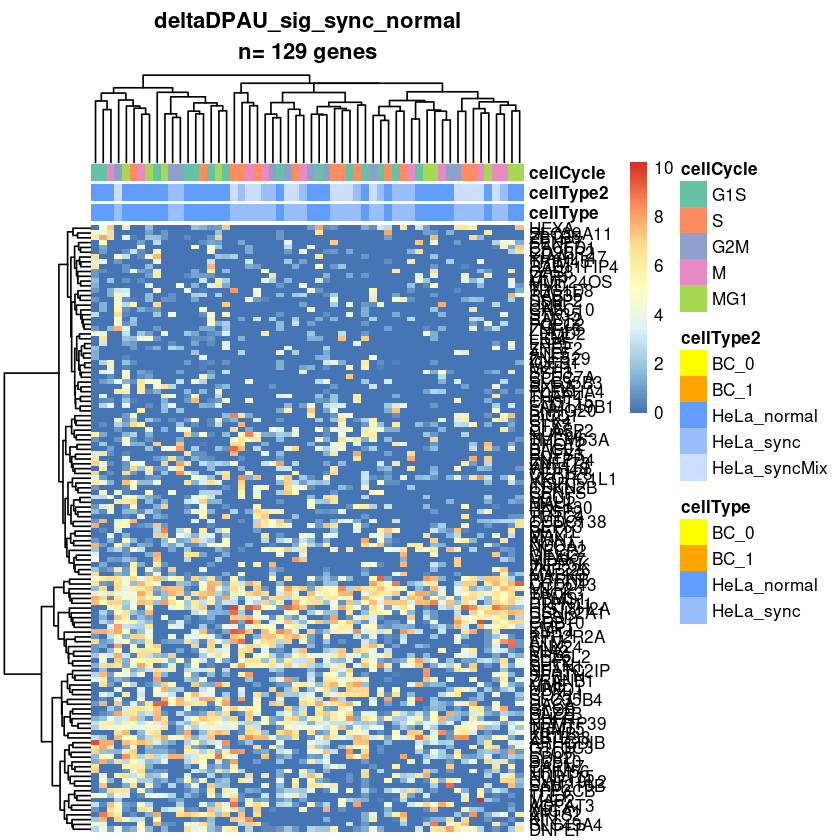

In [1459]:
#head(cellInfo)
cid.HeLa=rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="He"), ])
head(cid.HeLa)
cid.BC=rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="BC"), ])
head(cid.BC)

## use genes with deltaDPAU sig: sync vs normal
deltaDPAU_sig_sync_normal=readLines("/home/wangjl/data/apa/191111Figure/f3/distalAPA_RNA_5/deltaDPAU/deltaDPAU_sigAll_sync_vs_normalHeLa.txt")
length(deltaDPAU_sig_sync_normal)

dev.off()
CairoPDF(paste0("6_10_heatMap_RNA_deltaDPAUGenes_sync_normal.pdf"), width=8,height=9)
pheatmap(rnaM.log2cpm[ intersect(deltaDPAU_sig_sync_normal, rownames(rnaM.log2cpm) ), cid.HeLa], 
         border=FALSE,
         #scale = 'row',
         
        clustering_method='ward.D2', #'average', #"complete", #median/single
         show_colnames=F,
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         main=paste0("deltaDPAU_sig_sync_normal\nn= ", length(deltaDPAU_sig_sync_normal) ,' genes' )
)
dev.off()

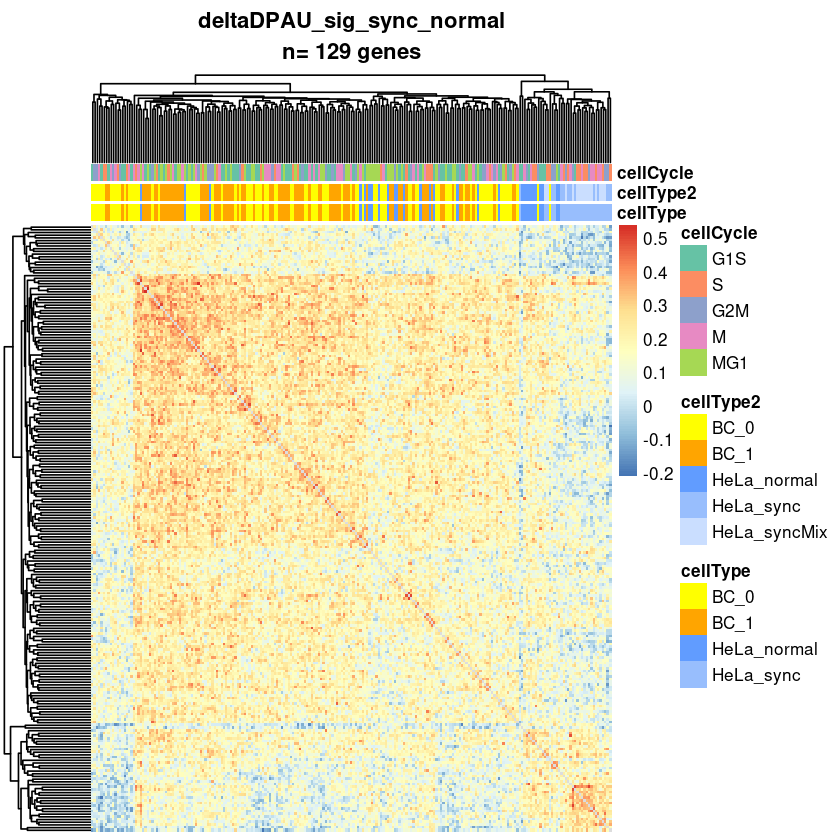

In [1489]:
cor610=cor(rnaM.log2cpm[intersect(deltaDPAU_sig_sync_normal, rownames(rnaM.log2cpm) ), ], 
              use = "pairwise.complete.obs")
diag(cor610)<-NA
pheatmap( cor610,
         border=FALSE,
         #scale = 'row',
         
        clustering_method='average', #'average', #"complete", #median/single
         show_rownames=F,
         show_colnames=F,
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         main=paste0("deltaDPAU_sig_sync_normal\nn= ", length(deltaDPAU_sig_sync_normal) ,' genes' )
)

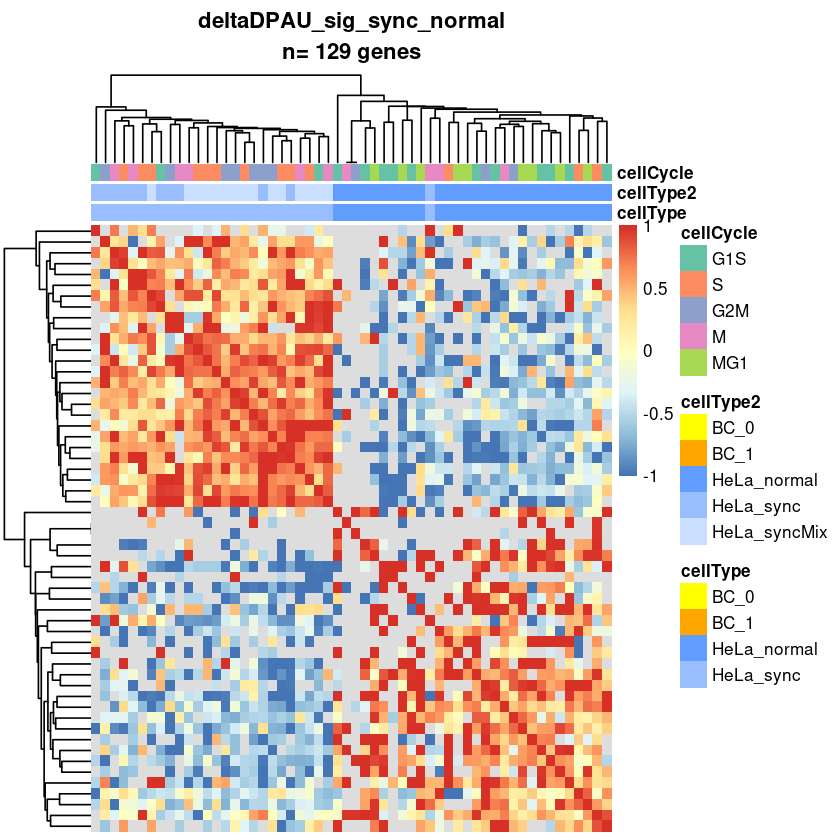

In [1478]:
pheatmap( cor(DPAU[intersect(deltaDPAU_sig_sync_normal, rownames(DPAU) ), cid.HeLa], use = "pairwise.complete.obs"),
# pheatmap(DPAU[ intersect(deltaDPAU_sig_sync_normal, rownames(rnaM.log2cpm) ), cid.HeLa], 
         border=FALSE,
         #scale = 'row',
         
        clustering_method='average', #'average', #"complete", #median/single
         show_rownames=F,
         show_colnames=F,
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         main=paste0("deltaDPAU_sig_sync_normal\nn= ", length(deltaDPAU_sig_sync_normal) ,' genes' )
)

In [1458]:
head(DPAU)

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35,c04ROW06,c04ROW14,c05ROW02,c05ROW14,c05ROW19,⋯,c3ROW02,c3ROW04,c3ROW35,c7ROW12,c7ROW27,c8ROW12,c9ROW04,c9ROW08,c9ROW14,c9ROW15
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,50,100,NA,34.48276,39.375,0,0,⋯,100,NA,0,28.45528,80,25.00,NA,5.882353,100.00000,NA
AASDHPPT,NA,NA,100,100,NA,NA,NA,NA,NA,100,⋯,NA,NA,NA,25.49020,NA,NA,NA,NA,NA,7.142857
AATF,100.00000,100,NA,100,100,NA,NA,NA,NA,100,⋯,100,17.85714,100,100.00000,100,93.75,9.677419,100.000000,10.22727,100.000000
ABCB7,0.00000,100,NA,100,100,83.33333,55.55556,NA,100,NA,⋯,NA,97.03704,100,100.00000,100,0.00,96.216216,NA,11.76471,54.838710
ABCC5,NA,NA,NA,NA,100,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


[1]  19 225

c01ROW07 c01ROW12 c01ROW24 c01ROW31 c01ROW35 c04ROW06 
      16       12       11       16       16       12

tmp2
 5  7  9 10 11 12 13 14 15 16 17 18 19 
 1  2  5  7  7 10 17 16 25 31 43 43 18 

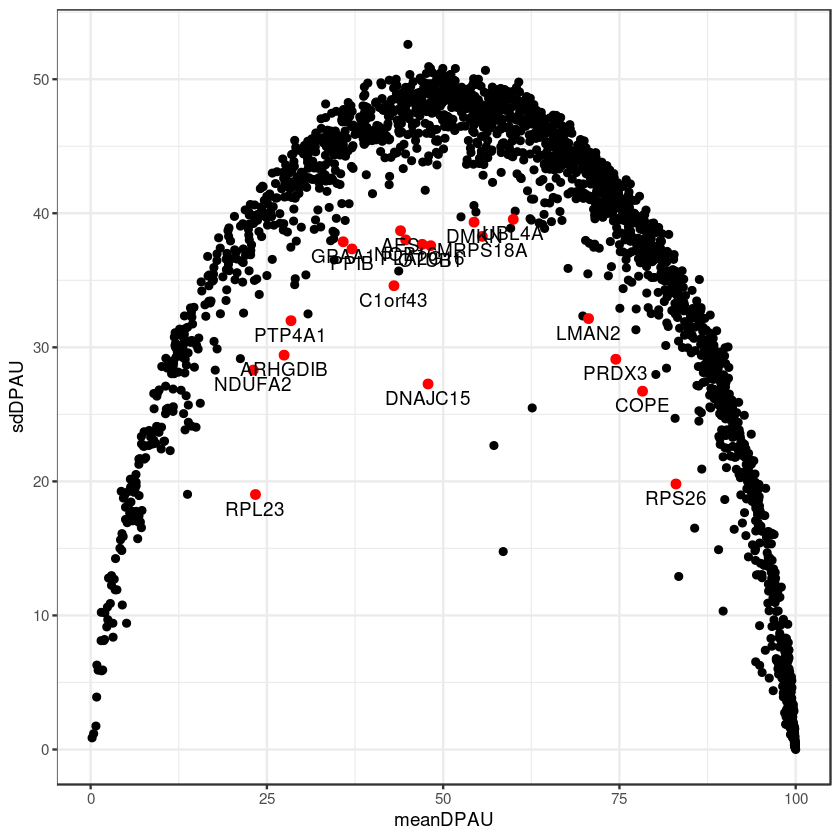

In [1423]:
##(Falure) by DPAU, with NA in the matrix, could not plot heatmap.
tmp=DPAU[gene.set2,]
dim(tmp)
#tmp
(function(){

     d1=   apply(tmp,1, function(x){mean(x, na.rm = T)})
     d2=   apply(tmp,1, function(x){sd(x, na.rm = T)})
    df=data.frame(
        gene=names(d1),
        mean=unname(d1),
        sd=unname(d2)#,
        #row.names=1
    )
    #print(unname(d1) )
    #print(df)
    ggplot(dif, aes(meanDPAU, sdDPAU))+geom_point()+
        geom_point(mapping = aes(mean, sd),color="red",size=2, data=df)+theme_bw()+
        geom_text(mapping=aes(x=mean,y=sd,label=gene),vjust=1.5, data=df)
})()

tmp2=apply(tmp, 2, function(x){ sum(!is.na(x) ) })
head(tmp2)
table(tmp2)
# pheatmap(DPAU[ intersect(gene.set2, rownames(DPAU)), ], 
#          border=FALSE,
#          #scale = 'row',
#          show_colnames=F,
#          annotation_col=annotation_col,
#          annotation_colors = ann_colors,
#          main=paste0("Dominant cell ration<",threshold,"\nn= ", length(gene.set2) ,' genes ( In >=100cells)' )
# )

In [1416]:
#head(dif)
dif[which(dif$ratio>0.85 & dif$meanDPAU<60 & dif$meanDPAU>40 & dif$DPAUcellNumber>70),]

,gene,DPAUcellNumber,meanDPAU,sdDPAU,RNACounts,cpm,totalCell,dominateCell,nonDominateCell,ratio
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
CREM,CREM,71,44.88953,48.17172,14223,8879.584,71,63,8,0.8873239
SUPT20H,SUPT20H,85,57.75803,47.74570,13925,9239.434,85,77,8,0.9058824
METTL21A,METTL21A,76,50.40881,48.72708,13516,9726.027,76,71,5,0.9342105
CSTF2,CSTF2,79,57.37907,47.50204,13127,8476.315,79,68,11,0.8607595
SLC35A1,SLC35A1,74,40.49307,48.30181,10599,6996.292,74,70,4,0.9459459
EIF2B5,EIF2B5,76,48.85261,47.87026,10328,6435.121,76,66,10,0.8684211
KLC1,KLC1,71,45.98680,48.31230,8099,5453.623,71,62,9,0.8732394


In [1417]:
apaSite[which(apaSite$gene=="SUPT20H"),]

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60,motif,distance
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr13:37583454:-,chr13:37583454:-,chr13,37583454,-,3058,PA,SUPT20H-203,TGAAAATGTGGTGGCTGTTTA,SUPT20H,TTTATTTAGTATAAAACGTTTGTGCACAGTGTTAACAAATACAATTTTTACAAATCTGTTT,TATAAA,52
chr13:37583633:-,chr13:37583633:-,chr13,37583633,-,1716,PA,SUPT20H-224,AAACTAGGGTTGGTTTGCCTA,SUPT20H,CAAACTTTATACAGAAGCACAACCTTATCATTTTTAAATAAAAACAGGGAAATGGTTTAAC,AATAAA,25


# delta DPAU, sync-normal HeLa, gene by gene;

In [1555]:
##########
# delta DPAU, sync-normal HeLa, gene by gene;
dim(DPAU) #2082  225
DPAU[1:4,1:4]
table(cellInfo$cellType)
#BC_0        BC_1 HeLa_normal   HeLa_sync 
#87          82          29          27 
#
# normal
cid.normal=rownames(cellInfo[which(cellInfo$cellType=="HeLa_normal"),]) #29
cid.sync=rownames(cellInfo[which(cellInfo$cellType=="HeLa_sync"),]) #27
genes=rownames(DPAU)
#

# 
getSub=function(gene,cids){
  rs=DPAU[gene, cids]
  rs=rs[,!is.na(rs)]
  return(as.numeric(rs) )
}

[1] 2082  225

,c01ROW07,c01ROW12,c01ROW24,c01ROW31
,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA
AARS,46.71053,0,NA,50
AASDHPPT,NA,NA,100,100
AATF,100.00000,100,NA,100



       BC_0        BC_1 HeLa_normal   HeLa_sync 
         87          82          29          27 

In [60]:
options(warn=-1)

deltaDPAU_df=NULL;
for(i in 1:nrow(DPAU)){
  #debug
  #if(i>10){break;}
  geneSymbol=genes[i]
  #if(i%%100==0){ printP(i, ' ', geneSymbol) }
  #
  list.normal=getSub(geneSymbol, cid.normal)
  list.sync=getSub(geneSymbol, cid.sync)
  if(length(list.normal)==0 || length(list.sync)==0){
    printP(i, ' ', geneSymbol)
    next;
  }
  #
  p=1
  if(length(list.normal)>=2 || length(list.sync)>=2){
    p=wilcox.test(list.sync, list.normal)$p.value
  }
  delta=mean(list.sync) - mean(list.normal)
  df=data.frame(
    gene=geneSymbol,
    deltaDPAU=delta,
    p=p
  )
  deltaDPAU_df=rbind(deltaDPAU_df, df)
}

dim(deltaDPAU_df) #1980
row.names(deltaDPAU_df)=deltaDPAU_df$gene
deltaDPAU_df$adj.p=p.adjust(deltaDPAU_df$p, method = 'fdr')
deltaDPAU_df=deltaDPAU_df[order(deltaDPAU_df$adj.p),]
head(deltaDPAU_df)
#	gene	deltaDPAU	p	adj.p
#GRB10	GRB10	82.8837579	5.051093e-05	0.08224184
#HIST3H2A	HIST3H2A	-87.8365211	1.085082e-04	0.08224184

[1] "1   AARD"
[1] "10   ABHD13"
[1] "14   ABRACL"
[1] "20   AC012640.4"
[1] "21   AC022784.1"
[1] "98   AMOT"
[1] "147   ARL5A"
[1] "151   ARMCX5"
[1] "173   ATP13A5"
[1] "207   BEST1"
[1] "250   C21orf91"
[1] "259   CA2"
[1] "287   CCL28"
[1] "320   CDS1"
[1] "339   CEP89"
[1] "369   CLDN8"
[1] "380   CMTM8"
[1] "419   CPA6"
[1] "453   CTSH"
[1] "463   CYB5A"
[1] "470   CYYR1"
[1] "513   DMKN"
[1] "530   DTNA"
[1] "553   EFHD1"
[1] "555   EFL1"
[1] "587   EPHB2"
[1] "610   FAM111A"
[1] "651   FOXI1"
[1] "714   GRB14"
[1] "730   H3F3C"
[1] "757   HMGA2"
[1] "766   HOOK1"
[1] "781   ID4"
[1] "793   IGFBP4"
[1] "795   IL22RA2"
[1] "819   IRF1"
[1] "821   IRX2"
[1] "879   LAMA4"
[1] "900   LINC00598"
[1] "912   LRRC1"
[1] "930   MAB21L4"
[1] "942   MAP3K6"
[1] "971   MED28"
[1] "998   MIR200CHG"
[1] "999   MIR4435"
[1] "1021   MPP5"
[1] "1023   MPZL2"
[1] "1063   MTCYBP35"
[1] "1071   MTND4P35"
[1] "1074   MTRNR2L3"
[1] "1080   MYEOV"
[1] "1098   NBPF14"
[1] "1149   NME4"
[1] "1151   NMU

[1] 1980    3

,gene,deltaDPAU,p,adj.p
,<fct>,<dbl>,<dbl>,<dbl>
GRB10,GRB10,74.25332,6.275678e-06,0.006143889
SLC39A11,SLC39A11,-100.00000,5.935807e-06,0.006143889
HIST3H2A,HIST3H2A,-89.80504,3.982372e-05,0.025991617
RPS29,RPS29,1.09742,6.182952e-05,0.030265550
IFT20,IFT20,-38.16050,2.992689e-04,0.086399746
NPM1P39,NPM1P39,94.85431,3.088857e-04,0.086399746


## delta DPAU plot

png 
  2

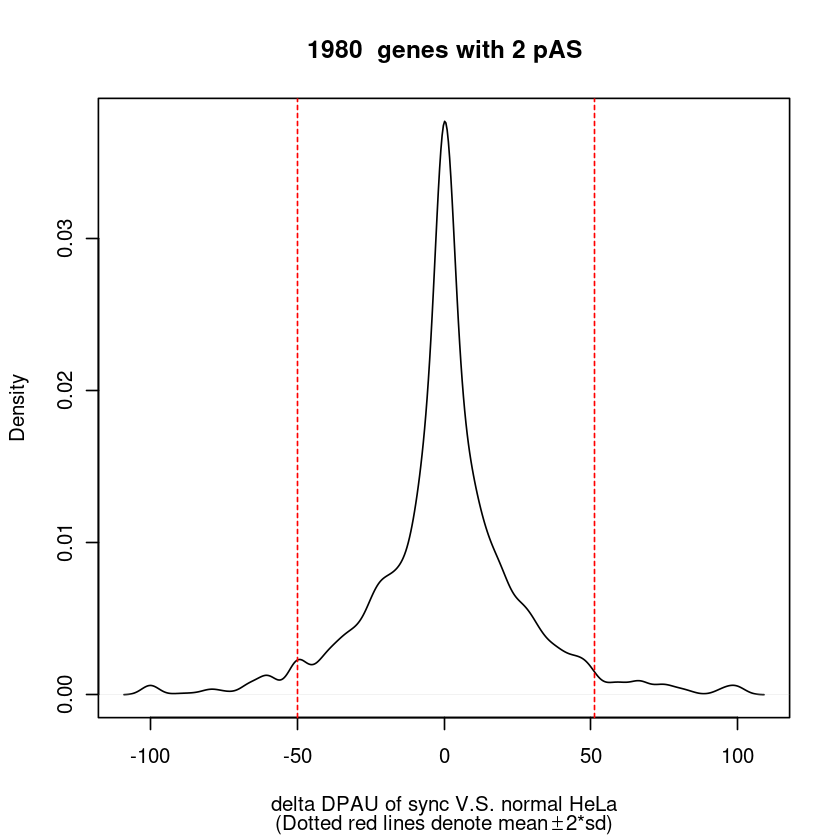

In [1556]:
m=mean(deltaDPAU_df$deltaDPAU)
s=sd(deltaDPAU_df$deltaDPAU)
#
CairoPDF(file="7_1_deltaDPAU_sync_normalHeLa_density.pdf", width=4,height=4 )
plot(density(deltaDPAU_df$deltaDPAU), xlab="delta DPAU of sync V.S. normal HeLa", 
     main=paste(nrow(deltaDPAU_df)," genes with 2 pAS"), 
     sub=expression("(Dotted red lines denote mean" %+-% "2*sd)") )
abline(v=c((m-s*2),(m+2*s)), lty=2, col='red')
dev.off()

[1] 129   6

[1] GRB10   NPM1P39 CCDC138 GLCE    KIF1B   CEP63  
1980 Levels: AARS AASDHPPT AATF ABCB7 ABCC5 ABCD3 ABCF2 ABHD10 ABHD8 ... ZYG11B

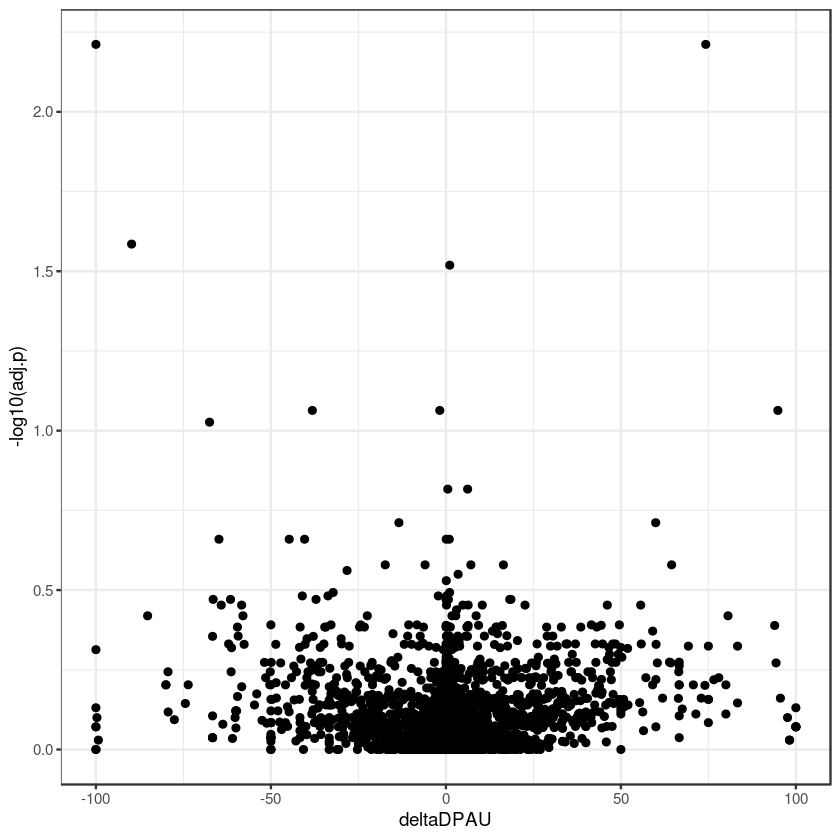

In [1557]:
# by wilcox p, it is too tight; perhaps, we will use mean+-2*sd
ggplot(deltaDPAU_df, aes(deltaDPAU, -log10(adj.p)) )+
  geom_point()+theme_bw()
#
deltaDPAU_df2=rbind(
  deltaDPAU_df[which(deltaDPAU_df$deltaDPAU > (m+2*s) ),],
  deltaDPAU_df[which(deltaDPAU_df$deltaDPAU < (m-2*s) ),]
)
dim(deltaDPAU_df2) #129 4

head(deltaDPAU_df2$gene)

In [1558]:
# write to files
writeLines( rownames(deltaDPAU_df[which(deltaDPAU_df$deltaDPAU > (m+2*s) ),]),
            '7_1_sync_normalHeLa_deltaDPAU_plus.txt' ) #73 (5-57)
writeLines( rownames(deltaDPAU_df[which(deltaDPAU_df$deltaDPAU < (m-2*s) ),]),
            '7_1_sync_normalHeLa_deltaDPAU_minus.txt' ) #55 (5-72)
writeLines( rownames(deltaDPAU_df2), '7_1_sync_normalHeLa_deltaDPAU_all.txt' ) #129
#
write.table(deltaDPAU_df, file="7_1_sync_normalHeLa_deltaDPAU_df.txt")
# GO analysis

## heatmap(NOT good)

[1] 56 56

$cellType
     sync   syncMix    normal 
"#CC6400" "#FFB772" "#3333FF"

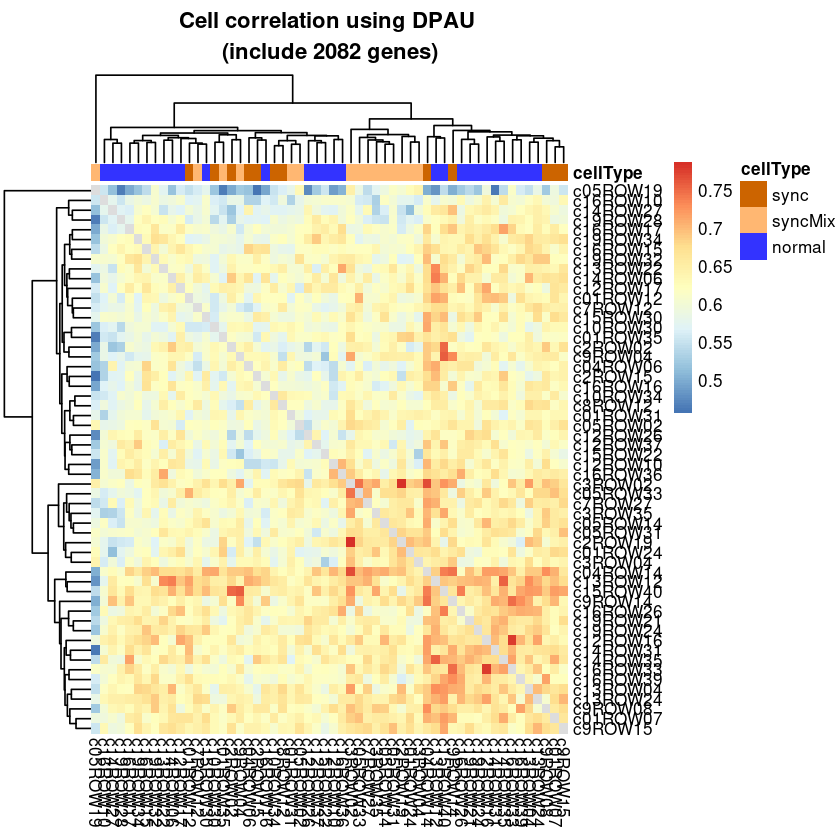

In [1576]:
# DPAU pearson cor

###########
# heatmap(NOT good)
cid.sync1=rownames(cellInfo[which(cellInfo$cellType2=="HeLa_sync"),]) #12
cid.syncM=rownames(cellInfo[which(cellInfo$cellType2=="HeLa_syncMix"),]) #15
#
rs=cor(DPAU[,c(cid.sync1,cid.syncM, cid.normal)], method = "pearson", use = "pairwise.complete.obs")
dim(rs) #56*56
#heatmap(rs)
#
annotation_col = data.frame(
  cid = c(cid.sync1,cid.syncM, cid.normal), 
  cellType = c(rep("sync", length(cid.sync1)),  rep('syncMix', length(cid.syncM)),  rep('normal', length(cid.normal))),
  row.names = 1
)
#rownames(annotation_col) = annotation_col$cid

# 自定注释信息的颜色列表
ann_colors = list(
  cellType = c(sync = "#CC6400", syncMix = "#FFB772", normal="#3333FF")
)
head(ann_colors)

library(pheatmap)
diag(rs)<-NA
pheatmap(rs, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         clustering_method="complete",
         #scale="column",
         annotation_col=annotation_col,
         annotation_colors = ann_colors,

         annotation_legend =T,legend =T, 
         main=paste0('Cell correlation using DPAU \n(include ',nrow(DPAU),' genes)')
)
#

[1] 56 56

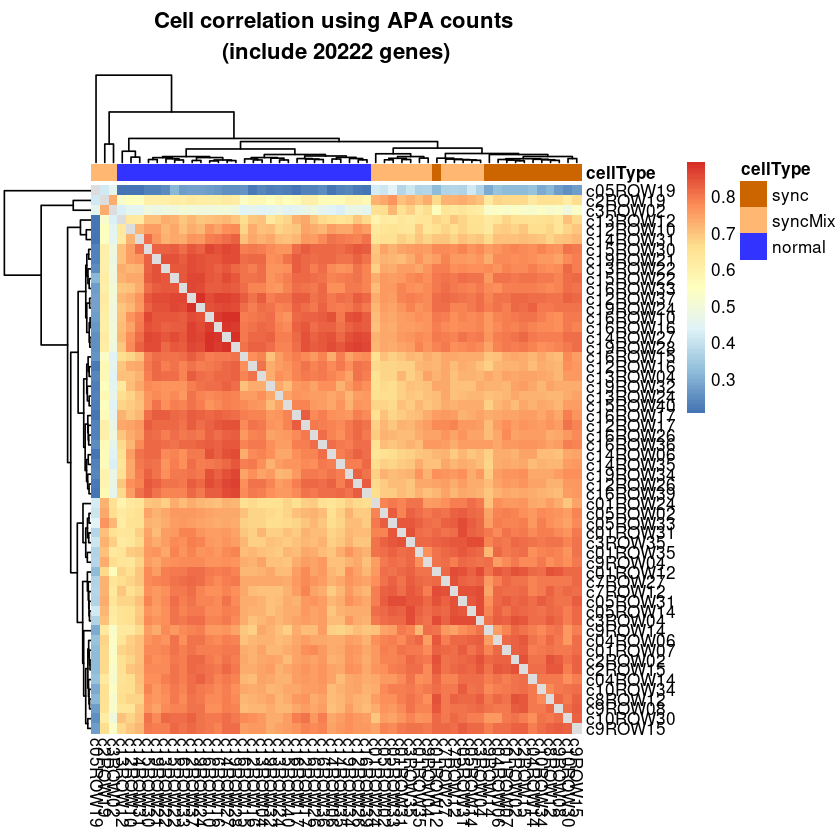

In [1577]:
# apa Matrix pearson cor

rsM=cor(apaM[, c(cid.sync1,cid.syncM, cid.normal)])
dim(rsM) #56 56
diag(rsM) <- NA
pheatmap(rsM, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         clustering_method="complete",
         #scale="column",
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         
         annotation_legend =T,legend =T,
         main=paste0('Cell correlation using APA counts \n(include ',nrow(apaM),' genes)')
)

[1] 41 41

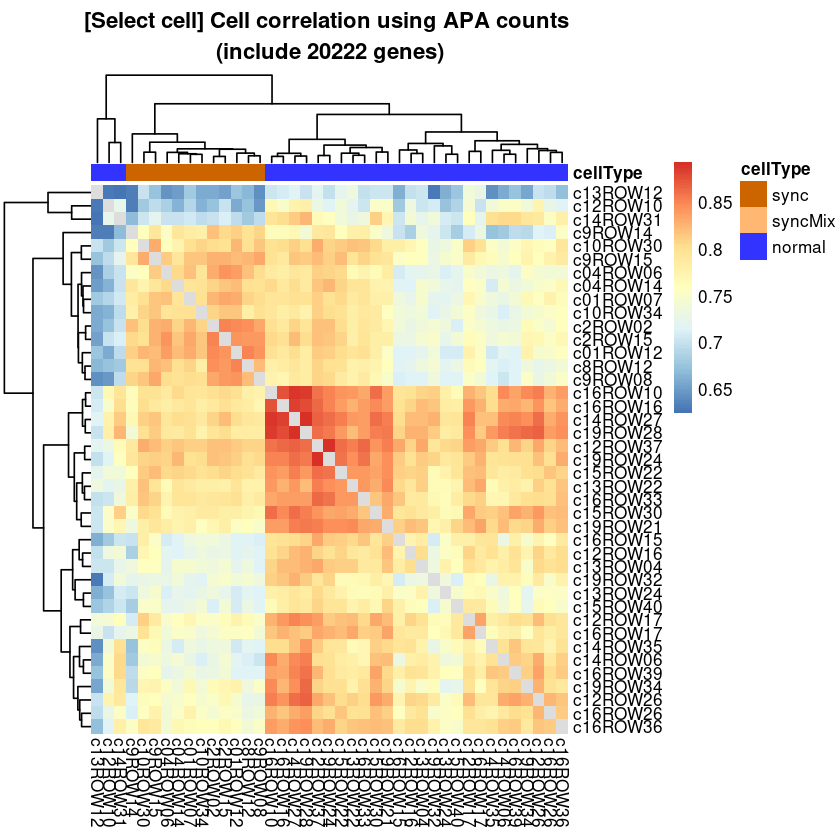

In [1580]:
# select cells
rsM2=cor(apaM[, c(cid.sync1, cid.normal)])
dim(rsM2) #41 41
diag(rsM2)<-NA
pheatmap(rsM2, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         clustering_method="complete",
         #scale="column",
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         
         annotation_legend =T,legend =T,
         main=paste0('[Select cell] Cell correlation using APA counts \n(include ',nrow(apaM),' genes)')
)

## heatmap use delta DPAU gene.

[1] 20222   225

[1] 129   6

[1] GRB10   NPM1P39 CCDC138 GLCE    KIF1B   CEP63  
1980 Levels: AARS AASDHPPT AATF ABCB7 ABCC5 ABCD3 ABCF2 ABHD10 ABHD8 ... ZYG11B

,PASid,chr,pos,strand,count,region,transcript,down20,gene,up60
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
chr10:320403:-,chr10:320403:-,chr10,320403,-,10945,UTR3,DIP2C-201,TGAAAATAGCAGTTTCTTAAT,DIP2C,TCTGTGATAACGCCTGTTTTATATTCAAATGAACAAATAAAAGCTTTTATTTTTGTTGCTC
chr10:855485:-,chr10:855485:-,chr10,855485,-,3583,PA,LARP4B-201,TCAATTTTTCTTTTGATTTTT,LARP4B,GTGTAAAACTGTCTAATTTGAAAAAAAATGTAGGTTATGAAAATAAAGATTTAGGCACTGT
chr10:1085971:-,chr10:1085971:-,chr10,1085971,-,10905,UTR3,IDI1-201,AAAGTTAAATGTTTGTTAAAT,IDI1,ACAGATTTATTATTCTTAAATGCTGTATGATAATGAAGAAAAATAAAAATTTATTTCTTGC
chr10:1087286:-,chr10:1087286:-,chr10,1087286,-,947,exon,IDI1-205,AAAGGAAGAACTAAAAGAACT,IDI1,TGAGGAAGAATGTAACTTTGAATCCAGATCCCAATGAGATTAAAAGCTATTGTTATGTGTC


[1] 258  56

,c01ROW07,c01ROW12,c04ROW06,c04ROW14,c10ROW34,c10ROW30,c2ROW02,c2ROW15,c8ROW12,c9ROW08
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
chr10:7797765:-,0,0,0,0,0,1,0,0,0,0
chr10:7820893:-,0,0,0,0,0,0,89,0,0,0
chr10:21781590:-,0,0,0,0,0,0,0,0,0,0
chr10:21783429:-,0,0,0,0,0,0,1,0,0,0
chr10:75196563:-,1,0,36,0,0,1,2,0,3,0
chr10:75203547:-,0,0,0,0,0,0,0,0,0,0
chr10:118644310:-,69,0,22,0,14,0,1,2,0,0
chr10:118781757:-,0,0,0,0,0,0,3,0,0,0
chr10:125767219:-,0,0,0,0,0,0,0,0,0,0


[1] 56 56

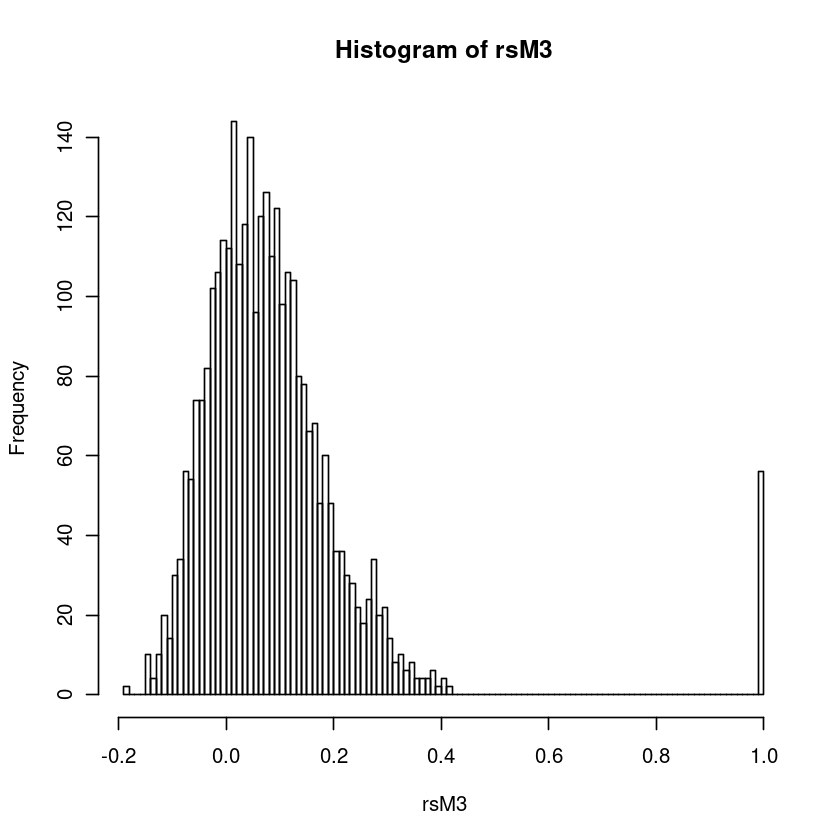

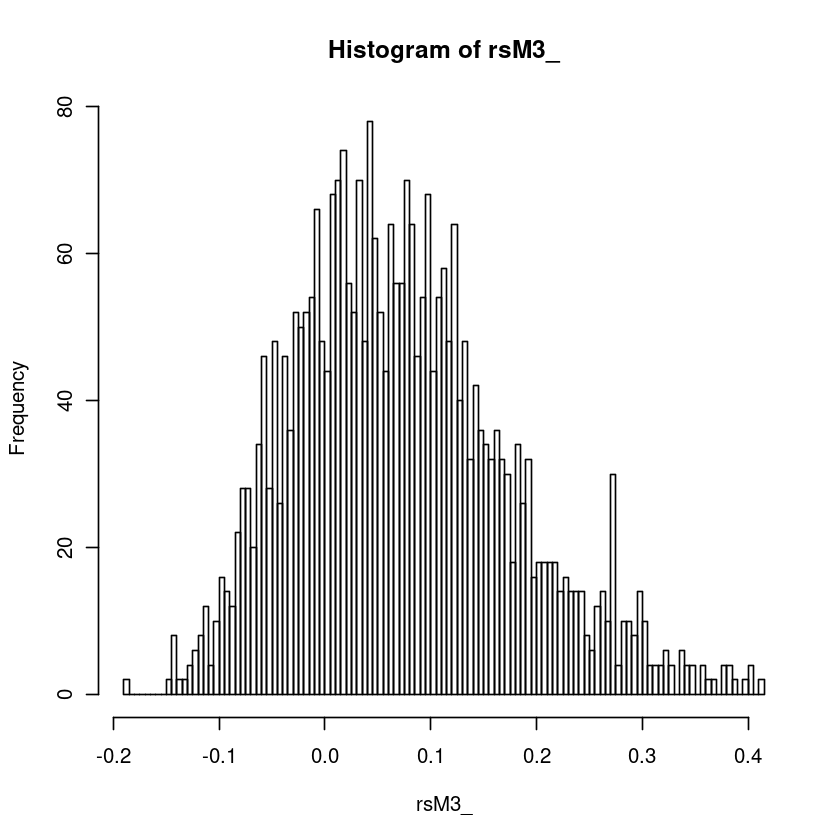

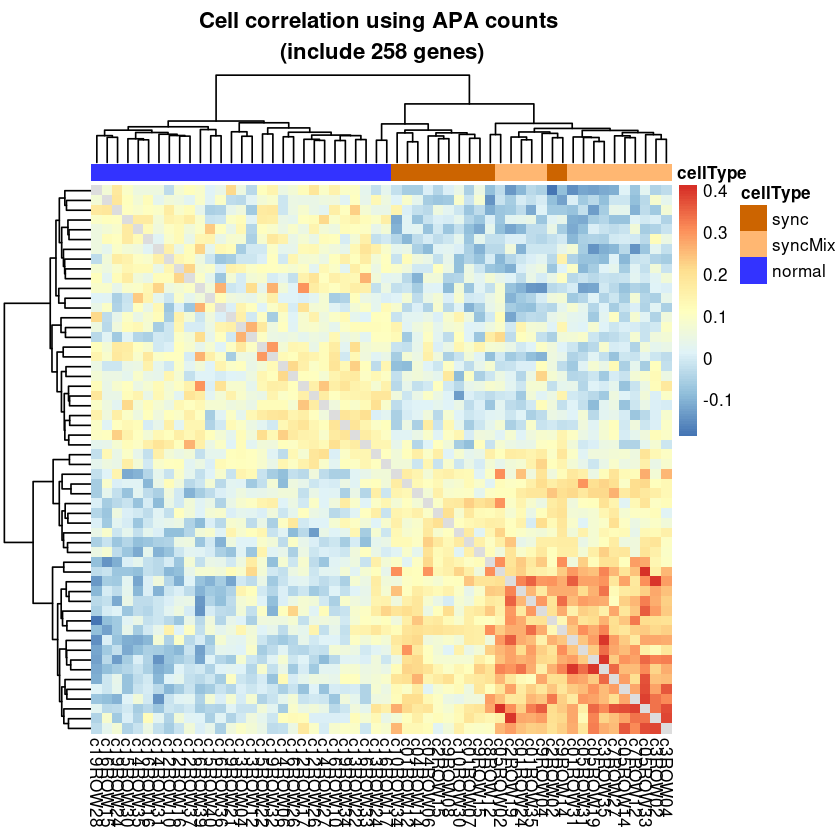

In [1581]:
# use delta DPAU gene.
# apa counts, spearman cor

dim(apaM) #[1] 20222   225
dim(deltaDPAU_df2) #129   4
head( deltaDPAU_df2$gene ) #  "GRB10"   "NPM1P39" "CCDC138"
apaSite[1:4,1:10]
#
gene.set73=apaSite[which(apaSite$gene %in%  deltaDPAU_df2$gene), 'PASid']
apaM.3=apaM[ gene.set73,  c(cid.sync1,cid.syncM, cid.normal)]
dim(apaM.3) #258 56
apaM.3[1:10,1:10]

rsM3=cor(apaM.3, method = 'spearman')
dim(rsM3) #225 225
#
hist(rsM3, n=100)

## replace diag 1 with NA
rsM3_=rsM3
diag(rsM3_)=NA
hist(rsM3_, n=100)
pheatmap(rsM3_, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         #clustering_method="single",
         #scale="column",
         annotation_col=annotation_col,
         annotation_colors = ann_colors,
         
         show_rownames =F,
         annotation_legend =T,legend =T,
         main=paste0('Cell correlation using APA counts \n(include ',length(gene.set73),' genes)')
)

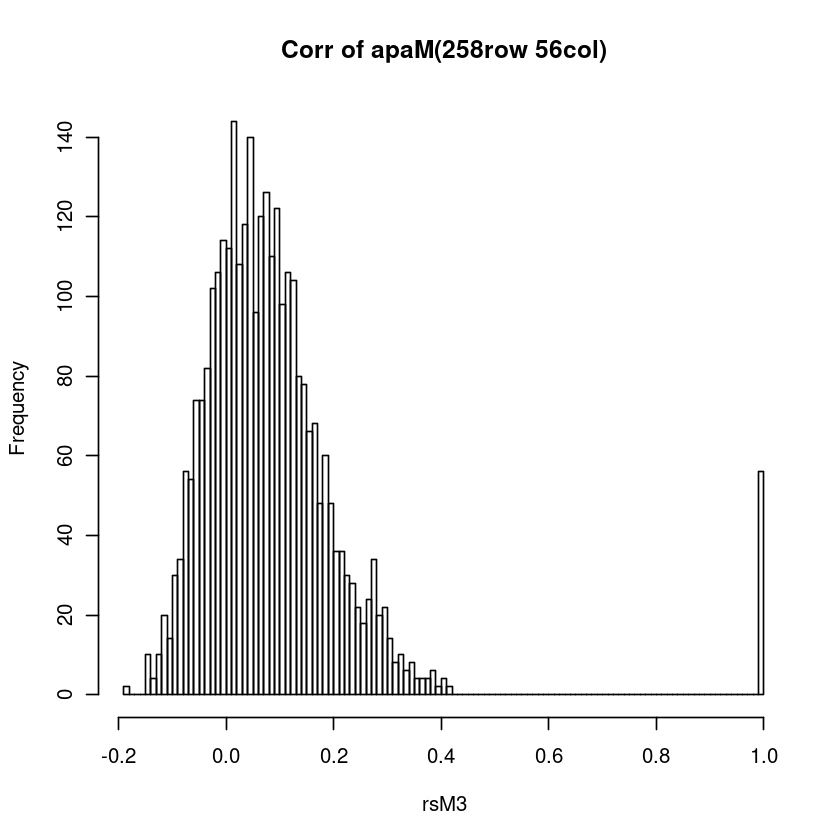

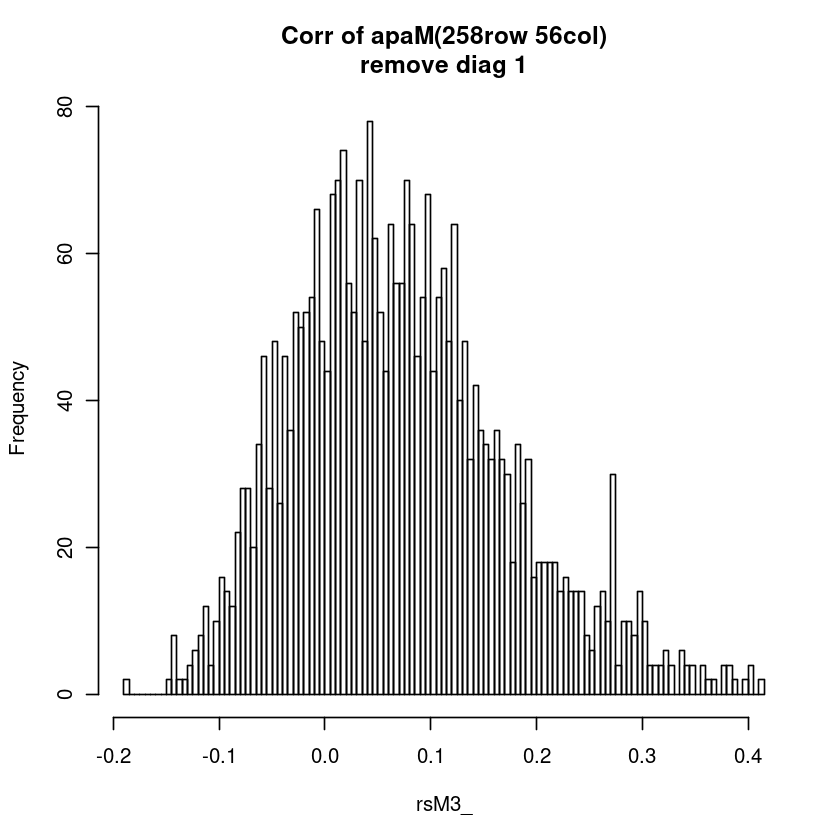

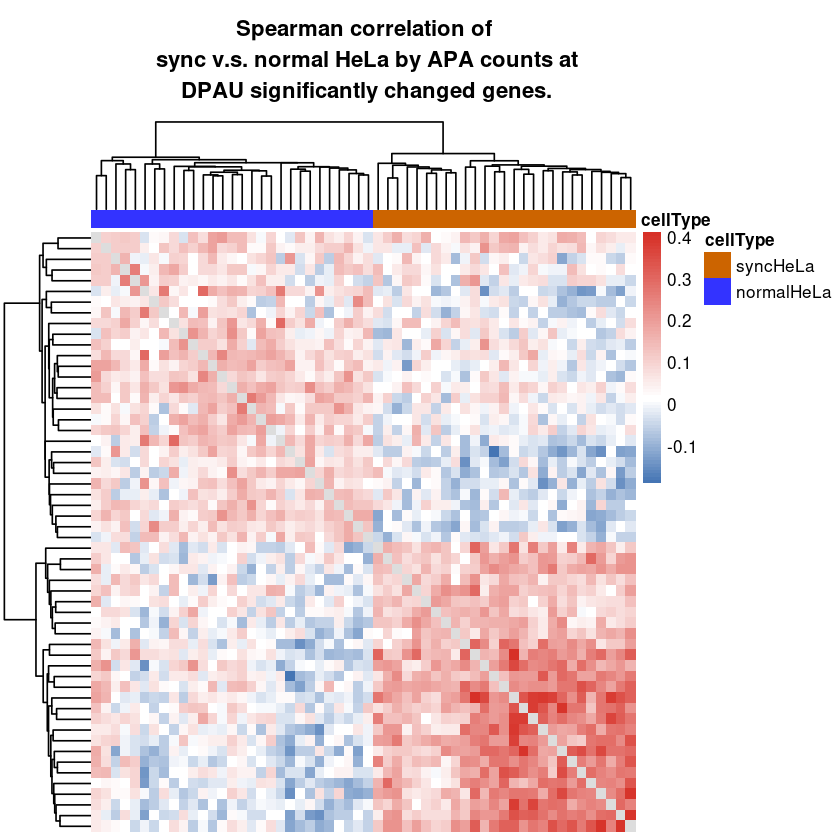

In [1582]:
#
annotation_col2 = data.frame(
  cid = c(cid.sync1,cid.syncM, cid.normal), 
  cellType = c(rep("syncHeLa", length(cid.sync1)+ length(cid.syncM)),  rep('normalHeLa', length(cid.normal))),
  row.names = 1
)
ann_colors2 = list(
  cellType = c(syncHeLa = "#cc6400",  normalHeLa="#3333FF")
)
#

## save to pdf file
#CairoPDF('5_5_correlation_of_sync_vs_normalHeLa_of_apaCounts_at_deltaDPAU_changed_sites.pdf', width=5,height=4)
hist(rsM3, n=100, main="Corr of apaM(258row 56col)")
hist(rsM3_, n=100, main="Corr of apaM(258row 56col)\nremove diag 1")
# 
bk1=seq(-0.25,0, by=0.01); bk2=seq(0,0.5,by=0.01) ;bk <- c(bk1,bk2)
pheatmap(rsM3_, border=FALSE, 
         cluster_cols = T, cluster_rows = T,
         clustering_method="average",
         #scale="row",
         annotation_col=annotation_col2,
         annotation_colors = ann_colors2,
         
         color = c(colorRampPalette(colors = c("#4575B4","white"))(length(bk1)),
                  colorRampPalette(colors = c("white","#D73027"))(length(bk2))),
         #legend_breaks=seq(-5,0.5,0.1),
         
         show_rownames =F, show_colnames =F,
         annotation_legend =T,legend =T, 
         main=paste0('Cell correlation using APA counts \n(include ',length(gene.set73),' genes)')
         #main="Spearman correlation of\n sync v.s. normal HeLa by APA counts at\n DPAU significantly changed genes."
)
# deltaDPAU_df2$gene: #no complete element pairs

## DPAU of all genes with 2 polya sites?(不筛选基因)

[1] 2082   56

,c01ROW07,c01ROW12,c04ROW06,c04ROW14,c10ROW34,c10ROW30,c2ROW02,c2ROW15,c8ROW12,c9ROW08
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,34.48276,26.55738,NA,1.635514,NA,25.00,5.882353
AASDHPPT,NA,NA,NA,NA,NA,100,NA,NA,NA,NA
AATF,100.00000,100,NA,NA,100.00000,100,69.902913,100,93.75,100.000000


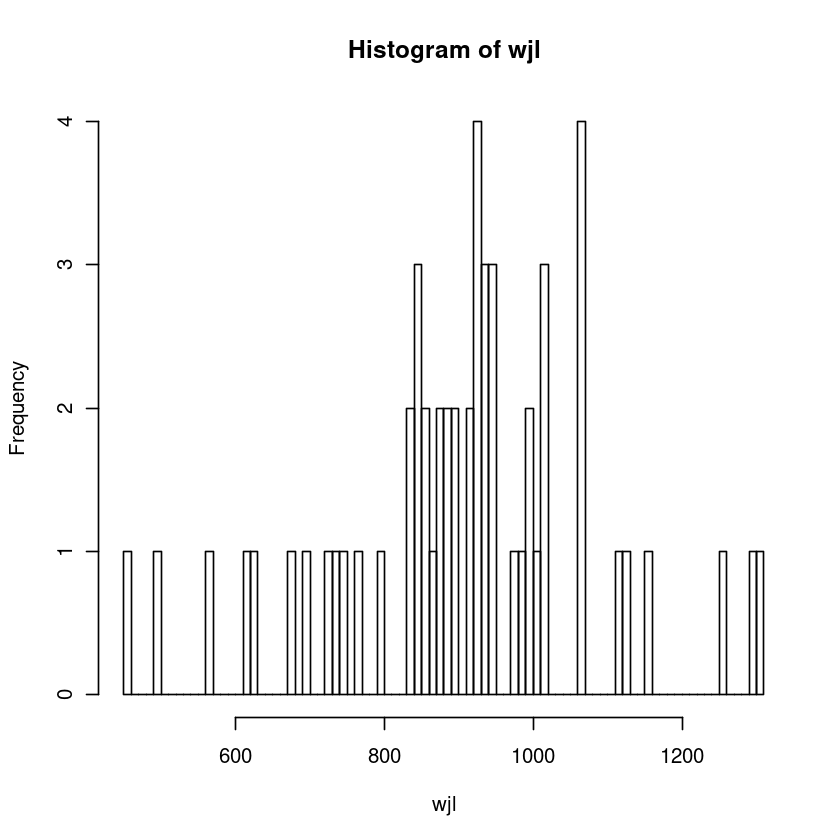

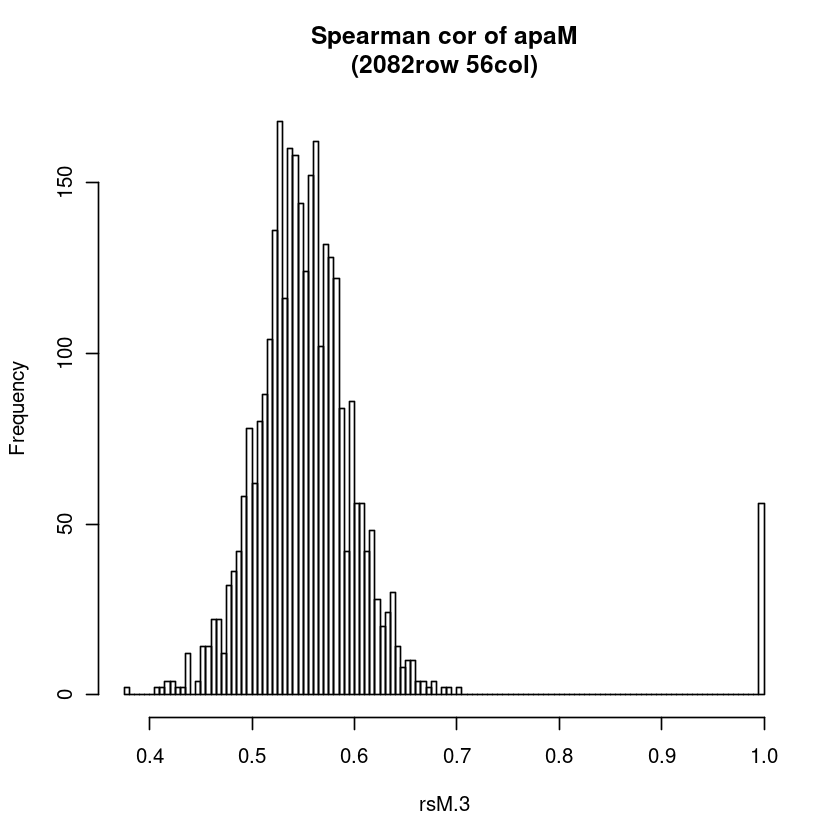

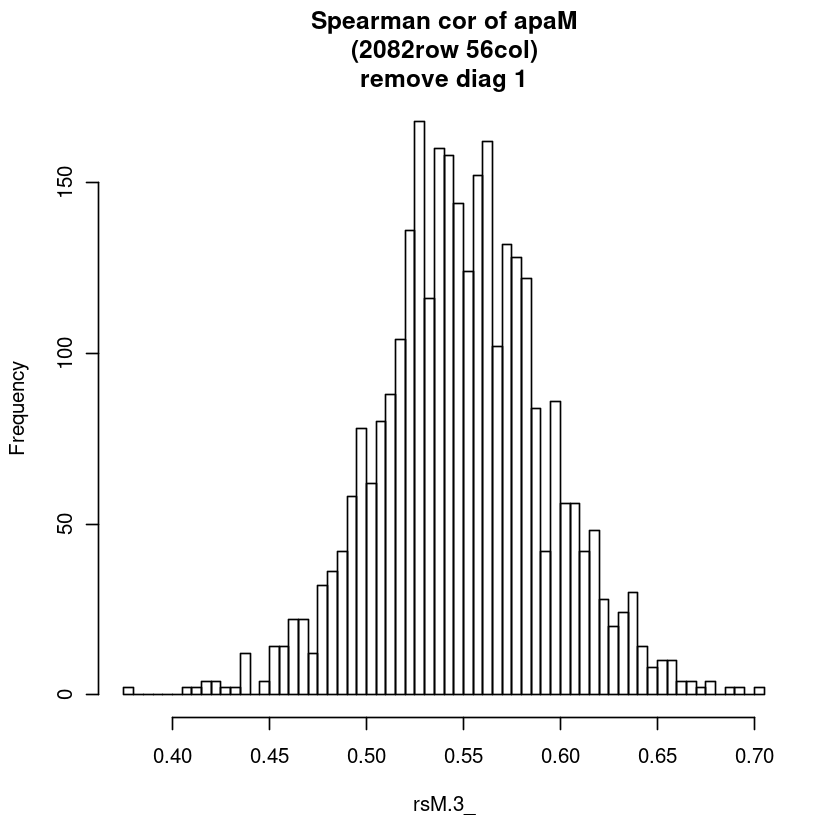

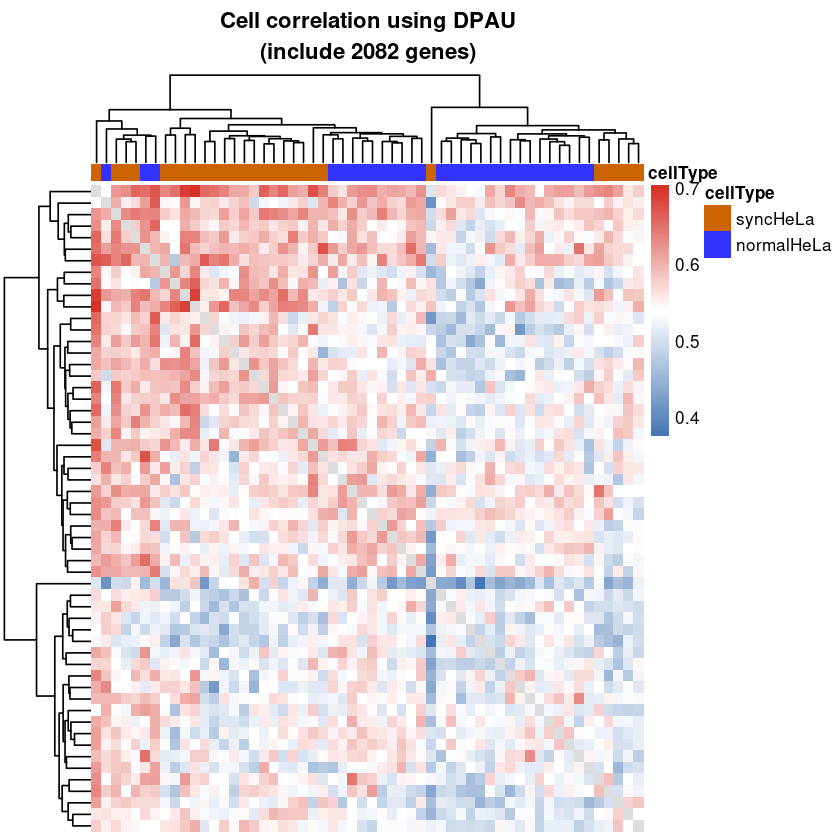

In [1585]:
##what about DPAU of all genes with 2 polya sites?
DPAU.3=DPAU[, c(cid.sync1,cid.syncM, cid.normal)]
dim(DPAU.3) #2082  56
DPAU.3[1:4,1:10]

wjl=apply(DPAU.3, 2, function(x) {
  sum( !is.na(x)  )
})
hist(wjl, n=100)

#rsM.3=cor(DPAU.3, method = 'pearson', use='complete.obs')
rsM.3=cor(DPAU.3, method = 'spearman', use='pairwise.complete.obs') 

rsM.3_=rsM.3
diag(rsM.3_)=NA

hist(rsM.3, n=100, main="Spearman cor of apaM\n(2082row 56col)")
hist(rsM.3_, n=100, main="Spearman cor of apaM\n(2082row 56col)\nremove diag 1")
bk1=seq(0,0.5, by=0.01); bk2=seq(0.5,1,by=0.01) ;bk <- c(bk1,bk2)
pheatmap(rsM.3_, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         #clustering_method="average",
         #scale="row",
         #
         annotation_col=annotation_col2,
         annotation_colors = ann_colors2,
         
         color = c(colorRampPalette(colors = c("#4575B4","white"))(length(bk1)),
                   colorRampPalette(colors = c("white","#D73027"))(length(bk2))),
         legend_breaks=seq(0,1,0.1),
         
         show_rownames =F, show_colnames =F,
         annotation_legend =T,legend =T, 
         main=paste0('Cell correlation using DPAU\n(include ',nrow(DPAU),' genes)')
         #main=" Spearman correlation of cells by DPAU\n of genes with 2 poly(A) sites."
)
#dev.off()
#

## what about gene DPAU correlation? (pairwise.complete.obs)

[1] 2082   56

[1]   56 2082

,AARD,AARS,AASDHPPT,AATF,ABCB7,ABCC5,ABCD3,ABCF2,ABHD10,ABHD13
c01ROW07,NA,46.71053,NA,100,0.00000,NA,NA,0,NA,NA
c01ROW12,NA,0.00000,NA,100,100.00000,NA,100,0,NA,NA
c04ROW06,NA,NA,NA,NA,83.33333,NA,NA,NA,NA,NA
c04ROW14,NA,34.48276,NA,NA,55.55556,NA,NA,NA,NA,NA


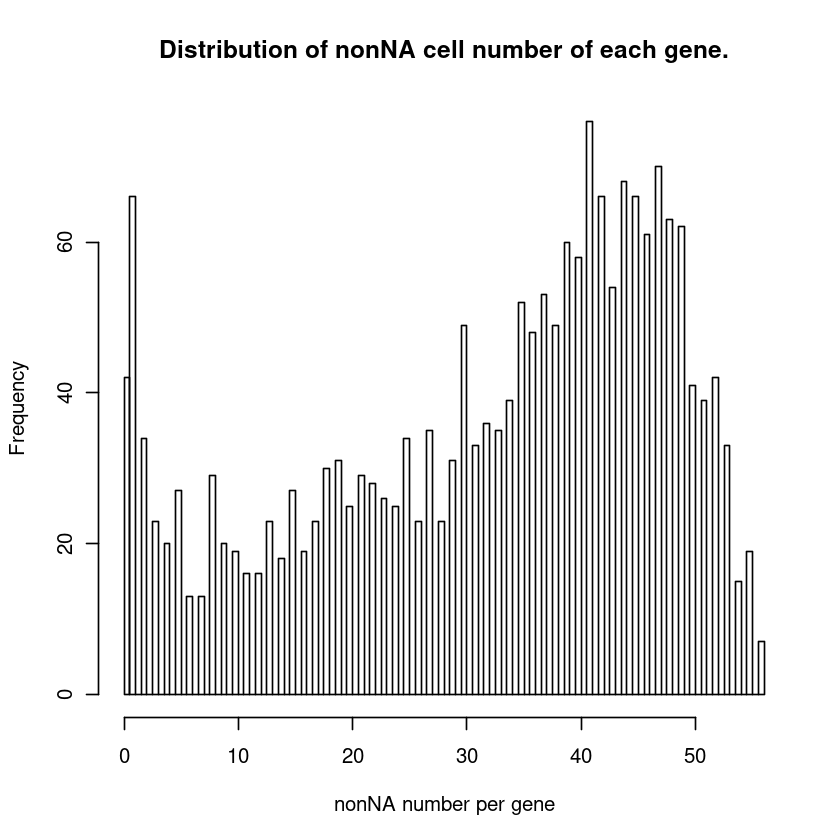

In [1627]:
###### what about gene correlation?
apaM.4=DPAU[, c(cid.sync1,cid.syncM, cid.normal)]
dim(apaM.4) #2082   56
apaM.4=t(as.matrix(apaM.4))

dim(apaM.4)
apaM.4[1:4,1:10]

hist( apply(apaM.4, 2, function(x){ sum(is.na(x) ) }), n=100, 
     xlab="nonNA number per gene", main="Distribution of nonNA cell number of each gene." )

[1]   56 1032


FALSE  TRUE 
   37    19 

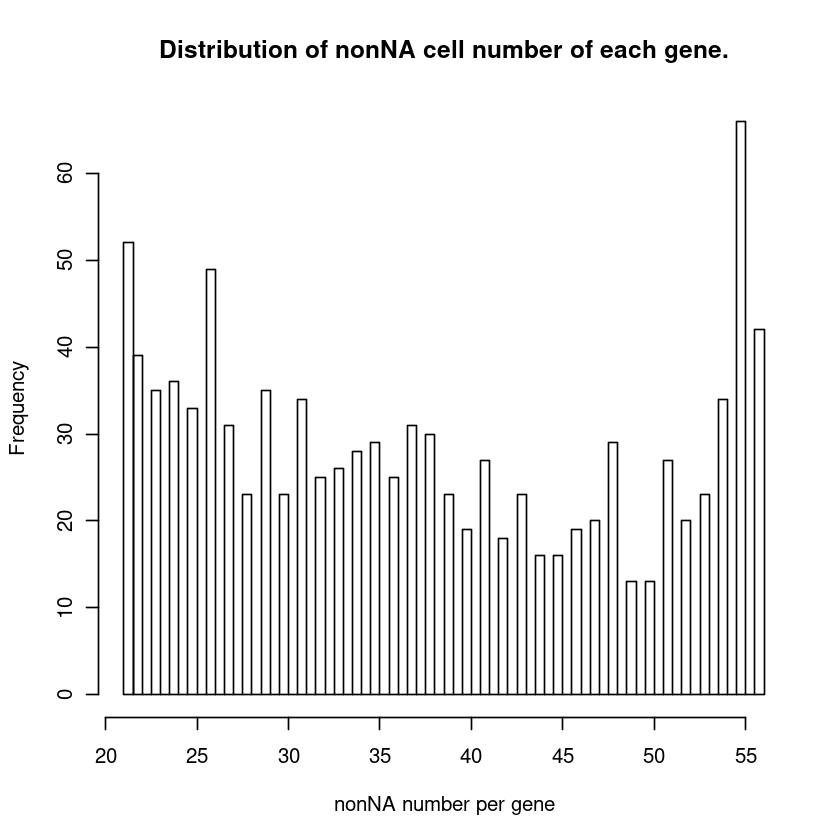

In [1628]:
# remove genes whose non-NA number is too low
apaM.5=apaM.4[,apply(apaM.4, 2, function(x){ sum(!is.na(x) ) })>20]
dim(apaM.5) #56 1917
table( is.na(apaM.5[,1]))

hist( apply(apaM.5, 2, function(x){ sum(!is.na(x) ) }), n=100, 
     xlab="nonNA number per gene", main="Distribution of nonNA cell number of each gene." )

rsM.5=cor(apaM.5, method = 'spearman', use="pairwise.complete.obs") # 耗时

[1] 1030

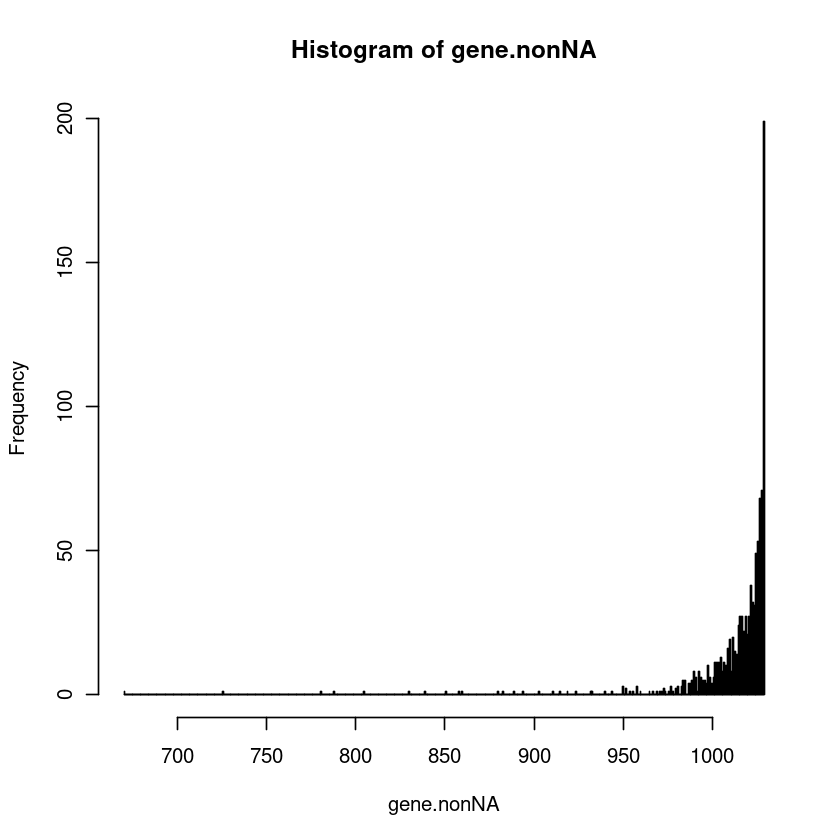

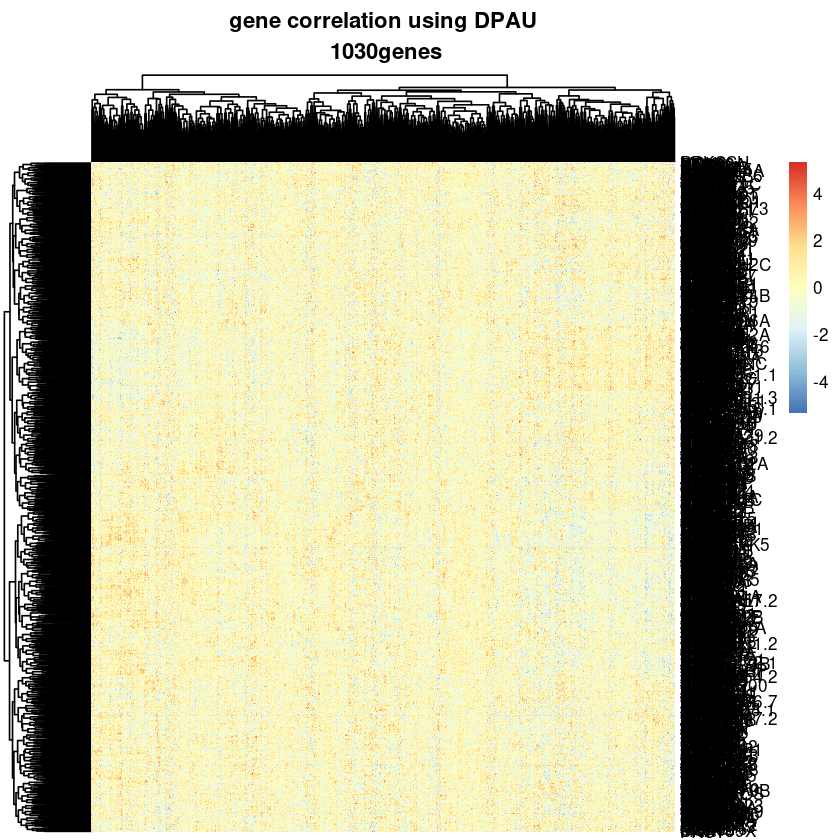

In [1629]:
diag(rsM.5)=NA

# remove NA row and columns
#rsM.5[100:110, 100:200]
gene.nonNA=apply(rsM.5, 2, function(x){ sum(!is.na(x)) })
gene.nonNA=gene.nonNA[gene.nonNA>200]
hist(gene.nonNA, n=1000)
length(gene.nonNA)

pheatmap(rsM.5[names(gene.nonNA), names(gene.nonNA)], border=FALSE,
         show_colnames=F,
         scale='row',
        # clustering_method="complete"
         main=paste0('gene correlation using DPAU\n ', length(gene.nonNA), 'genes')
)

keep
FALSE  TRUE 
 1870   212 

[1]  56 212

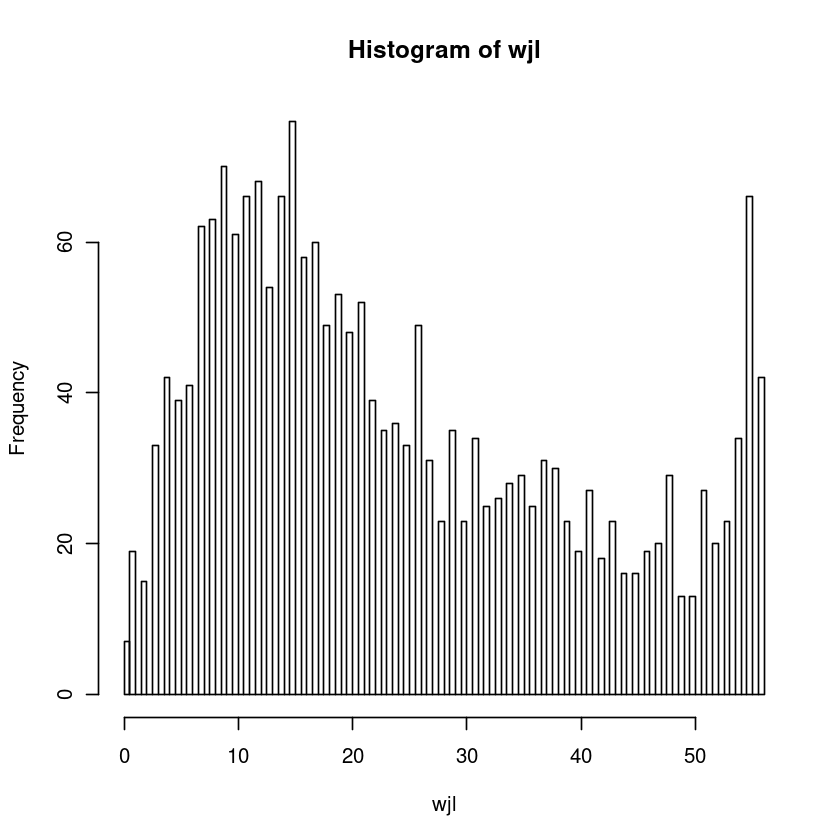

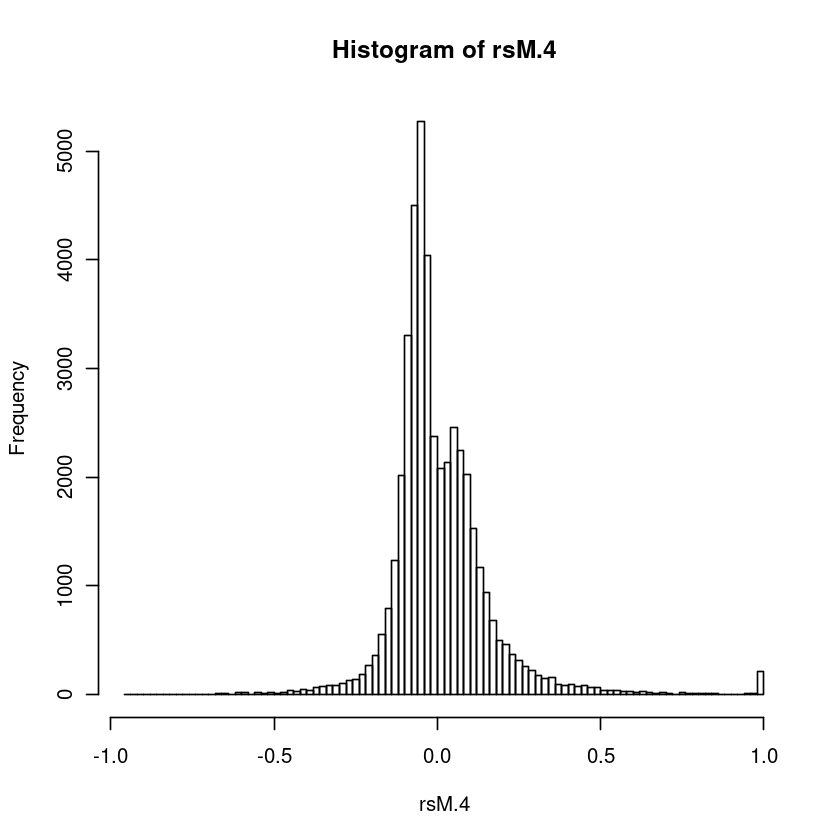

[1] 212 212

,AC120057.2,AC253536.7,ACOT13,AES,ALDOA,ALG3,ALG8,ANXA1,AP2M1,AP2S1
AC120057.2,NA,-0.07211633,0.09808404,0.01282018,-0.05816566,-0.1658277,-0.08818808,-0.047409110,-0.05651131,0.25019597
AC253536.7,-0.07211633,NA,-0.07800563,-0.12577120,-0.02303512,-0.3427075,-0.13116482,0.024595483,-0.12466251,-0.02470530
ACOT13,0.09808404,-0.07800563,NA,-0.12815713,-0.07981860,-0.3398096,0.18566043,-0.003748455,-0.07541849,-0.05239138
AES,0.01282018,-0.12577120,-0.12815713,NA,-0.07355499,0.1648418,-0.08648105,0.074218319,0.10778146,0.18266234


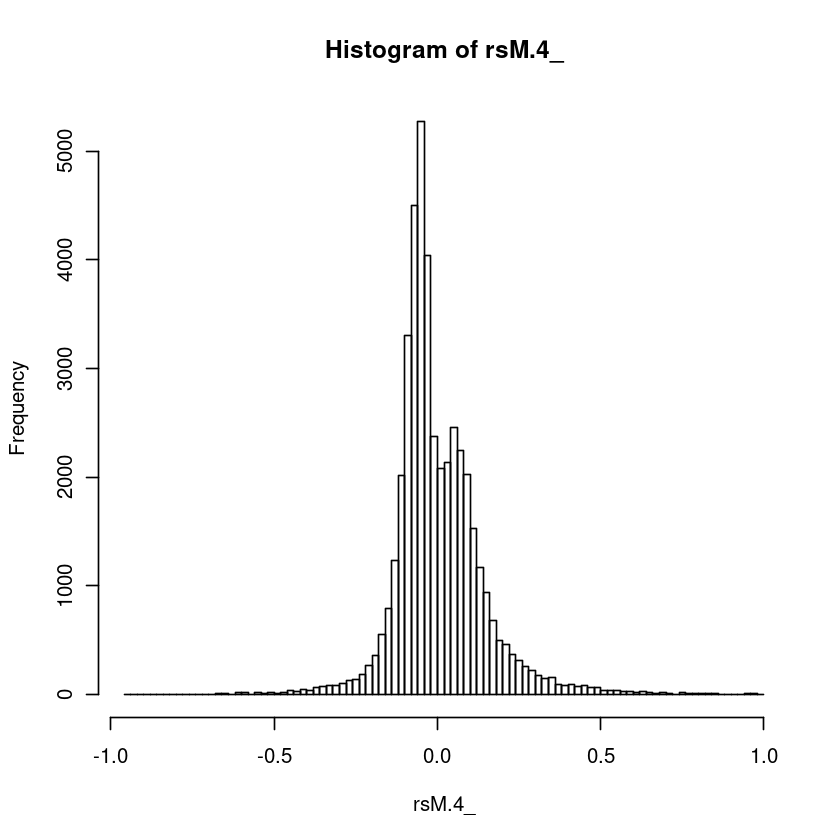

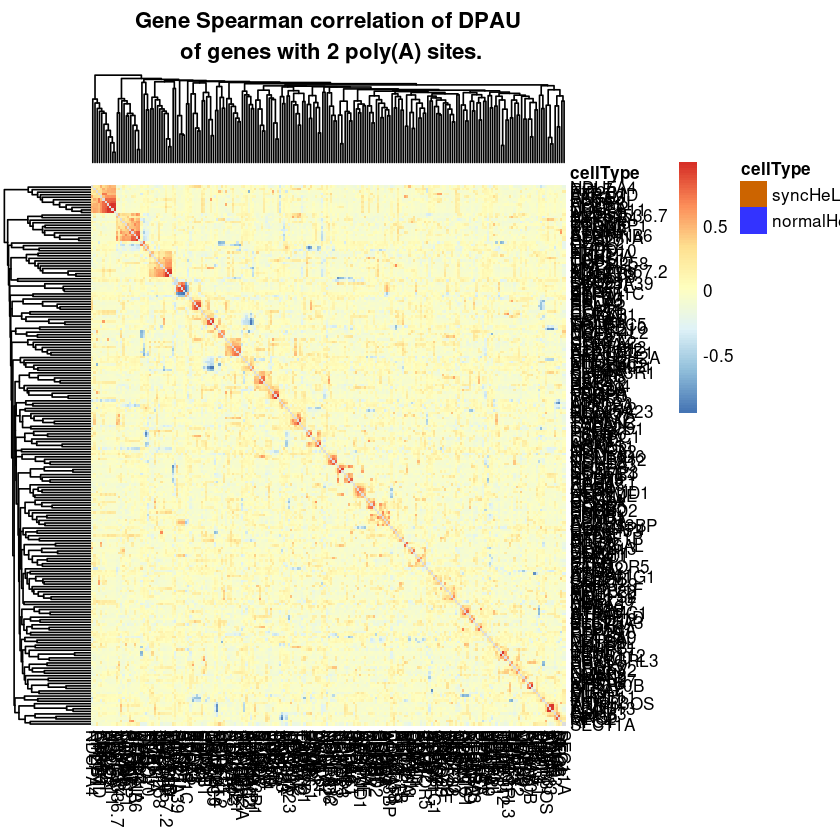

In [1637]:
wjl=apply(apaM.4, 2, function(x){
  sum(!is.na(x))
})
hist(wjl, n=100)
#
keep=wjl>50
table(keep)
apaM.4_=apaM.4[, keep]
dim(apaM.4_) #56 1630
#
rsM.4=cor(apaM.4_, method = 'pearson', use="pairwise.complete.obs")
#

hist(rsM.4, n=100)
rsM.4_=rsM.4
diag(rsM.4_)=NA
hist(rsM.4_, n=100)

dim(rsM.4_) #2082
rsM.4_[1:4,1:10]

#bk1=seq(-0.5,0, by=0.01); bk2=seq(0,0.5,by=0.01) ;bk <- c(bk1,bk2)
pheatmap(rsM.4_, border=FALSE, 
         cluster_cols = T,
         cluster_rows = T,
         clustering_method="average",
         
         #scale="row",
         #
         annotation_col=annotation_col2,
         annotation_colors = ann_colors2,
         
#          color = c(colorRampPalette(colors = c("#4575B4","white"))(length(bk1)),
#                    colorRampPalette(colors = c("white","#D73027"))(length(bk2))),
#         legend_breaks=seq(-0.5,0.5,0.1),
         
#         show_rownames =F, show_colnames =F,
         annotation_legend =T,legend =T, 
         main="Gene Spearman correlation of DPAU\n of genes with 2 poly(A) sites."
)
#

## compare delta DPAU bewteen 2 groups(type / cycle)

In [1510]:
##
# tools
getSub=function(gene,cids){
  rs=DPAU[gene, cids]
  rs=rs[,!is.na(rs)]
  return(as.numeric(rs) )
}

In [1525]:
detect=function(gene){
    #gene="CCDC71L"
    print(table(is.na(DPAU[gene,])))
    #
    print(table(is.na(DPAU[gene,cid.sync])))
    print(table(is.na(DPAU[gene,cid.normal])))
    #
    line=DPAU[gene,cid.sync]; print(line[,!is.na(line)])
    line2=DPAU[gene,cid.normal]; print(line2[,!is.na(line2)])
}

detect('ZSCAN16')


FALSE  TRUE 
   72   153 

FALSE  TRUE 
    9    18 

FALSE  TRUE 
    8    21 
        c01ROW24 c01ROW35 c05ROW14 c7ROW27 c9ROW04 c01ROW12 c04ROW06 c04ROW14
ZSCAN16      100        0        0     100       0        0      100        0
        c2ROW15
ZSCAN16     100
        c12ROW17 c12ROW26 c13ROW04 c13ROW24 c14ROW31 c15ROW22 c16ROW26 c19ROW24
ZSCAN16        0        0      100      100 97.77778        0      100        0


In [1638]:
get_deltaDPAU_df=function(cid.A, cid.B, output, keyword){
    #options(warn=-1) 
    discardGenes=c()
    deltaDPAU_df=NULL;
    genes=rownames(DPAU)
    #
    for(i in 1:nrow(DPAU)){
      #debug
      #if(i>10){break;}
      geneSymbol=genes[i]
      #if(i%%100==0){ printP(i, ' ', geneSymbol) }
      #
      value.A=getSub(geneSymbol, cid.A)
      value.B=getSub(geneSymbol, cid.B)
      if(length(value.A)==0 || length(value.B)==0){
        #printP(i, ' ', geneSymbol)
          discardGenes=c(discardGenes, geneSymbol)
        next;
      }
      #
      p=1
      if(length(value.A)>=2 || length(value.B)>=2){
        p=wilcox.test(value.B, value.A)$p.value
      }
      delta=mean(value.A) - mean(value.B)
      df=data.frame(
        gene=geneSymbol,
          numA=length(value.A),
          numB=length(value.B),
        deltaDPAU=delta,
        p=p
      )
      deltaDPAU_df=rbind(deltaDPAU_df, df)
    }

    dim(deltaDPAU_df) #1980
    row.names(deltaDPAU_df)=deltaDPAU_df$gene
    deltaDPAU_df$adj.p=p.adjust(deltaDPAU_df$p, method = 'fdr')
    deltaDPAU_df=deltaDPAU_df[order(deltaDPAU_df$adj.p),]
    #
    write.table(deltaDPAU_df, file=paste0(output, '/deltaDPAU_',keyword,".csv"), quote = F)
    #
    length(discardGenes)
    return( list(deltaDPAU_df, discardGenes))
    #       gene	numA	numB	deltaDPAU	p	adj.p
    #GRB10	GRB10	21	10	74.25332	6.275678e-06	0.006143889
    #SLC39A11	SLC39A11	17	5	-100.00000	5.935807e-06	0.006143889
}

#
cid.A=rownames(cellInfo[which(cellInfo$cellType=="HeLa_sync"),]) #27
cid.B=rownames(cellInfo[which(cellInfo$cellType=="HeLa_normal"),]) #29

deltaDPAU_df0=get_deltaDPAU_df(cid.A, cid.B, "deltaDPAU", 'sync_vs_normalHeLa')
deltaDPAU_df=deltaDPAU_df0[[1]]

In [1708]:
plot_deltaDPAU_df=function(deltaDPAU_df, output, keyword,cid.A,cid.B){
    # by wilcox p, it is too tight; perhaps, we will use mean+-2*sd
    print( paste( 'p<0.05 gene number: ', nrow(deltaDPAU_df[deltaDPAU_df$p<0.05,]) ) )
    print(head(deltaDPAU_df[deltaDPAU_df$p<0.05,]))
    #
    m=mean(deltaDPAU_df$deltaDPAU)
    s=sd(deltaDPAU_df$deltaDPAU)
    #
    dif=deltaDPAU_df
    dif$sig="NS"
    dif[which(dif$deltaDPAU > (m+2*s) ),]$sig="lengthen"
    dif[which(dif$deltaDPAU < (m-2*s) ),]$sig="shorten"
    #
    # write to files, to do  GO analysis
    writeLines( rownames(dif[which(dif$sig =="lengthen" ),]),
               paste0(output, "/deltaDPAU_lengthen_", keyword, '.txt') )
    writeLines( rownames(dif[which(dif$sig =="shorten" ),]),
               paste0(output, "/deltaDPAU_shorten_", keyword, '.txt') )
    writeLines( rownames(dif[which(dif$sig !="NS" ),]),
               paste0(output, "/deltaDPAU_sigAll_", keyword, '.txt') )
    write.table(dif, paste0(output, "/deltaDPAU_DF_", keyword, '.txt') )
    
    # plot points
    tb2=table(dif$sig);tb2
    g=ggplot(dif, aes(deltaDPAU, -log10(adj.p), color=sig) )+
          geom_point(size=0.1)+theme_bw()+
            scale_color_manual('Significant',labels=c(paste0("lengthen(",tb2[[1]],')'),'ns',
                                            paste0("shorten(",tb2[[3]],')' )),
                     values=c("red", "grey",'blue') )+
        labs(title="Define gene's DPAU outside \nmean +- 2sd as significant.", 
             x="delta DPAU of gene")
    
    dev.off()
    CairoPDF(file=paste0(output,"/deltaDPAU_density_",keyword,".pdf"), width=4,height=4 )
    plot(density(deltaDPAU_df$deltaDPAU), xlab=expression(paste(Delta, " DPAU of gene")), 
         main=paste(nrow(deltaDPAU_df)," genes with 2 pAS\n", keyword, length(cid.A),length(cid.B)), 
         sub=expression("(Dotted red lines denote mean" %+-% "2*sd)") )
    abline(v=c((m-s*2),(m+2*s)), lty=2, col='red')
    print(g)
    dev.off()
}
#plot_deltaDPAU_df(deltaDPAU_df, "deltaDPAU", keyword='sync_vs_normalHeLa', cid.A, cid.B)

In [1705]:
######################
# plot heatmap
###################### 
heatmap_deltaDPAU=function(deltaDPAU_df, output, keyword){
    ###################
    # part 1: define style
    # define col annotation
    annotation_col = data.frame(
      cellType = as.character(cellInfo$cellType),
      cellType2 = as.character(cellInfo$cellType2),
      cellCycle=factor(cellInfo$cellCycle, levels = c('G1S', 'S', 'G2M', 'M', 'MG1') )
    )
    rownames(annotation_col) = rownames(cellInfo)
    head(annotation_col, n=2)
    #str(annotation_col)

    # define color
    col=RColorBrewer::brewer.pal(n = 5,name = "Set2")
    
    # define color for col annotation
    ann_colors = list(
      #batch=c('1'='white', '2'='black'),
      cellType = c('BC_0'="#FF9ECE", 'BC_1'="#F81082", 'HeLa_normal'="#005FFF", 'HeLa_sync'="#619CFF"),
      cellType2 = c('BC_0'="#FF9ECE", 'BC_1'="#F81082", 'HeLa_normal'="#005FFF", 'HeLa_sync'="#619CFF", 'HeLa_syncMix'="#98BEFD"),
      cellCycle=c('G1S'=col[1], 'S'=col[2], 'G2M'=col[3],   'M'=col[4], 'MG1'=col[5])
    )
    head(ann_colors, n=2)
    #
    ###################
    # part 2: define data
    m=mean(deltaDPAU_df$deltaDPAU)
    s=sd(deltaDPAU_df$deltaDPAU)
    #
    dif=deltaDPAU_df
    dif$sig="NS"
    dif[which(dif$deltaDPAU > (m+2*s) ),]$sig="lengthen"
    dif[which(dif$deltaDPAU < (m-2*s) ),]$sig="shorten"
    
    # define genes to use
    gene.delta=rownames(dif[which(dif$sig!="NS"),])
    drawByCid=function(cid="", cid.name=""){
        if(cid==''){
            cor.tmp=cor( DPAU[gene.delta, ], method="pearson", use = "pairwise.complete.obs")
        }else{
            cor.tmp=cor( DPAU[gene.delta, cid], method="pearson", use = "pairwise.complete.obs")
        }
        
        diag(cor.tmp) <- NA #remove diag
        pheatmap( cor.tmp, border=FALSE,
                cluster_method="median", #average/
             #scale = 'row',
             show_rownames=F,show_colnames=F,
             annotation_col=annotation_col,
             annotation_colors = ann_colors,
             main=paste0(cid.name,'\tSpearman correlation of cells using DPAU\nInclude ', length(gene.delta), ' genes. ', keyword))
    }
    ###
    CairoPDF(file=paste0(output,"/deltaDPAU_heatmap_",keyword,".pdf"), width=9,height=8 )
    drawByCid("","")
    drawByCid(cid.BC,"[BC]")
    drawByCid(cid.HeLa,"[HeLa]")
    dev.off()
}

In [1706]:
# combine function
compareA_B=function(cid.A, cid.B, output, keyword){
    printP(length(cid.A), length(cid.B), keyword)
    #
    deltaDPAU_df0=get_deltaDPAU_df(cid.A, cid.B, output, keyword )
    deltaDPAU_df=deltaDPAU_df0[[1]]
    #
    print(dim(deltaDPAU_df))
    plot_deltaDPAU_df(deltaDPAU_df, output, keyword,  cid.A, cid.B)
    heatmap_deltaDPAU(deltaDPAU_df, output, keyword)
    #
    paste0('Results in: ',getwd(),'/', output,'/')
}

In [1702]:
# deltaDPAU_df0=get_deltaDPAU_df(cid.A, cid.B, output="deltaDPAU", keyword='sync_vs_normalHeLa' )
#     deltaDPAU_df=deltaDPAU_df0[[1]]
head(deltaDPAU_df)

,gene,numA,numB,deltaDPAU,p,adj.p
,<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>
GRB10,GRB10,21,10,74.25332,6.275678e-06,0.006143889
SLC39A11,SLC39A11,17,5,-100.00000,5.935807e-06,0.006143889
HIST3H2A,HIST3H2A,27,6,-89.80504,3.982372e-05,0.025991617
RPS29,RPS29,25,29,1.09742,6.182952e-05,0.030265550
IFT20,IFT20,23,15,-38.16050,2.992689e-04,0.086399746
NPM1P39,NPM1P39,15,6,94.85431,3.088857e-04,0.086399746


[1] 204

In [1709]:
# sync vs normal
cid.A=rownames(cellInfo[which(cellInfo$cellType=="HeLa_sync"),]) #27
cid.B=rownames(cellInfo[which(cellInfo$cellType=="HeLa_normal"),]) #29
#
compareA_B(cid.A, cid.B,output="deltaDPAU", keyword='sync_vs_normalHeLa' )

[1] "27 29 sync_vs_normalHeLa"
[1] 1980    6
[1] "p<0.05 gene number:  204"
             gene numA numB  deltaDPAU            p       adj.p
GRB10       GRB10   21   10   74.25332 6.275678e-06 0.006143889
SLC39A11 SLC39A11   17    5 -100.00000 5.935807e-06 0.006143889
HIST3H2A HIST3H2A   27    6  -89.80504 3.982372e-05 0.025991617
RPS29       RPS29   25   29    1.09742 6.182952e-05 0.030265550
IFT20       IFT20   23   15  -38.16050 2.992689e-04 0.086399746
NPM1P39   NPM1P39   15    6   94.85431 3.088857e-04 0.086399746


[1] "Results in: /data/jinwf/wangjl/apa/191111Figure/f3/distalAPA_RNA_5/deltaDPAU/"

In [172]:
table(cellInfo$cellType)


       BC_0        BC_1 HeLa_normal   HeLa_sync 
         87          82          29          27 

In [142]:
table(cellInfo$cellType2)


        BC_0         BC_1  HeLa_normal    HeLa_sync HeLa_syncMix 
          87           82           29           12           15 

In [143]:
table(cellInfo$cellCycle)


G1S G2M   M MG1   S 
 63  34  42  50  36 

In [144]:
table(cellInfo$cellCycle, substr(cellInfo$cellType,1,2))

     
      BC He
  G1S 49 14
  G2M 24 10
  M   32 10
  MG1 41  9
  S   23 13

In [1710]:
# BC vs normal HeLa
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC"),])
cid.B=rownames(cellInfo[which( cellInfo$cellType=="HeLa_normal"),])
#
compareA_B(cid.A, cid.B,output="deltaDPAU", keyword='BC_vs_normalHeLa' )

[1] "169 29 BC_vs_normalHeLa"
[1] 2062    6
[1] "p<0.05 gene number:  152"
           gene numA numB    deltaDPAU            p        adj.p
KHSRP     KHSRP   42   14 -47.71453436 5.939919e-07 0.0006194075
RUVBL2   RUVBL2  156   26 -16.74684370 6.013665e-07 0.0006194075
AFAP1     AFAP1   45    7 -74.68125827 4.947713e-05 0.0267392037
NDUFA12 NDUFA12  162   29   0.03812195 6.490098e-05 0.0267392037
PLXNB2   PLXNB2  125   19  14.33876975 5.341428e-05 0.0267392037
LBHD1     LBHD1  162   26  -1.20451588 1.216302e-04 0.0417596935


[1] "Results in: /data/jinwf/wangjl/apa/191111Figure/f3/distalAPA_RNA_5/deltaDPAU/"

In [1707]:
# BC vs HeLa
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="He"),])
#
compareA_B(cid.A, cid.B,output="deltaDPAU", keyword='BC_vs_HeLa' )

[1] "169 56 BC_vs_HeLa"
[1] 2074    6
[1] "p<0.05 gene number:  238"


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


### BC's cell cycle

In [1720]:
# BC, BC_0 vs BC_1
cid.A=rownames(cellInfo[which(cellInfo$cellType=="BC_0"),])
cid.B=rownames(cellInfo[which(cellInfo$cellType=="BC_1"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC0_vs_BC1' )

[1] "87 82"
[1] "87 82 BC0_vs_BC1"
[1] 2073    6
[1] "p<0.05 gene number:  187"
             gene numA numB    deltaDPAU            p        adj.p
TCF25       TCF25   56   66   5.44621147 2.465134e-07 0.0005097897
GRTP1       GRTP1   30   51  30.26417195 1.235956e-05 0.0104942091
NEDD8       NEDD8   87   82   0.36858016 1.522371e-05 0.0104942091
CCNA2       CCNA2   24   24 -48.45191738 5.457847e-05 0.0282170680
C19orf53 C19orf53   87   82   0.09340475 9.612462e-05 0.0326926404
GSTK1       GSTK1   85   82   1.46146704 1.106617e-04 0.0326926404


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


In [1715]:
# BC, cell cycle: G1S vs S
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="G1S"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="S"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC_G1S_vs_S' )

[1] "49 23"
[1] "49 23 BC_G1S_vs_S"
[1] 2051    6
[1] "p<0.05 gene number:  103"
       gene numA numB  deltaDPAU           p     adj.p
ALG14 ALG14   14    8   1.352676 0.012823024 0.9215959
ALG3   ALG3   41   23 -12.733259 0.006019713 0.9215959
AP4M1 AP4M1   17    5  57.483699 0.005336635 0.9215959
ATF2   ATF2   10    4 -87.219048 0.006953112 0.9215959
CBX1   CBX1   16   10  52.035957 0.006519122 0.9215959
CDKN3 CDKN3   42   20   2.070165 0.006336151 0.9215959


[1] "Results in: /data/jinwf/wangjl/apa/191111Figure/f3/distalAPA_RNA_5/deltaDPAU_BC/"

In [1716]:
# BC, cell cycle: S vs G2M
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="S"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="G2M"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC_S_vs_G2M' )

[1] "23 24"
[1] "23 24 BC_S_vs_G2M"
[1] 2004    6
[1] "p<0.05 gene number:  102"
                 gene numA numB  deltaDPAU           p adj.p
AC091167.2 AC091167.2   16   15  -8.474503 0.045365217     1
AGPS             AGPS    7    4  95.779565 0.004912411     1
AP2M1           AP2M1   21   19   3.839993 0.013106600     1
AURKAIP1     AURKAIP1   19   17   6.094151 0.005625257     1
C1orf43       C1orf43   21   18  21.865020 0.049204037     1
CBWD1           CBWD1   15   13 -15.028998 0.015223271     1


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


In [1717]:
# BC, cell cycle: G2M vs M
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="G2M"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="M"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC_G2M_vs_M' )

[1] "24 32"
[1] "24 32 BC_G2M_vs_M"
[1] 1999    6
[1] "p<0.05 gene number:  89"
                 gene numA numB  deltaDPAU           p adj.p
AC091167.2 AC091167.2   15   19   5.600568 0.037278225     1
ADNP             ADNP   12   21  35.453243 0.002425260     1
AGPAT3         AGPAT3    4   12 -53.778134 0.024338269     1
AGPS             AGPS    4    8 -75.087209 0.019609939     1
ALDH16A1     ALDH16A1    6    8  82.075163 0.005809881     1
ARFGAP3       ARFGAP3    5   13 -53.643170 0.009916411     1


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


In [1718]:
# BC, cell cycle: M vs MG1
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="M"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="MG1"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC_M_vs_MG1' )

[1] "32 41"
[1] "32 41 BC_M_vs_MG1"
[1] 2047    6
[1] "p<0.05 gene number:  106"
         gene numA numB  deltaDPAU            p      adj.p
TRMU     TRMU   18   19 -59.052494 4.600264e-05 0.09361537
INSIG2 INSIG2   17   18  51.926224 7.443805e-04 0.75740716
LBHD1   LBHD1   31   39   1.256900 1.187264e-03 0.80536103
ACBD6   ACBD6   16   23   3.874061 3.895602e-02 0.96380482
AGPAT3 AGPAT3   12   16  34.557317 2.525596e-02 0.96380482
APTX     APTX    8   18 -27.320504 4.711695e-02 0.96380482


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


In [1719]:
# BC, cell cycle: MG1 vs G1S
cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="MG1"),])
cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle=="G1S"),])
printP(length(cid.A), length(cid.B))
#
compareA_B(cid.A, cid.B,output="deltaDPAU_BC", keyword='BC_MG1_vs_G1S' )

[1] "41 49"
[1] "41 49 BC_MG1_vs_G1S"
[1] 2062    6
[1] "p<0.05 gene number:  103"
                 gene numA numB deltaDPAU            p      adj.p
GLO1             GLO1   28   39  15.65048 4.151937e-05 0.08528078
ABRACL         ABRACL   39   49  -4.98084 2.933560e-03 0.95171512
AKIRIN2       AKIRIN2    9   10 -30.63126 4.049317e-02 0.95171512
AL591806.3 AL591806.3   10    6 -49.58333 4.234873e-02 0.95171512
AMOTL2         AMOTL2   12   13  60.44333 6.791964e-03 0.95171512
ANTXR1         ANTXR1    2   10  90.00000 1.525274e-02 0.95171512


ERROR: Error in hclust(d, method = method): NA/NaN/Inf in foreign function call (arg 11)


### HeLa's cell cycle

In [1729]:
cycles=c('G1S', 'S', 'G2M', 'M', "MG1")
cycles2=c(cycles,cycles)
for(i in 1:length(cycles)){
    printP(i, cycles2[i], cycles2[i+1])    
    cid.A=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="He" & cellInfo$cellCycle==cycles2[i]),])
    cid.B=rownames(cellInfo[which(substr(cellInfo$cellType,1,2)=="He" & cellInfo$cellCycle==cycles2[i+1]),])
    printP(length(cid.A), length(cid.B))
    #
    msg <- tryCatch({
         compareA_B(cid.A, cid.B,output="deltaDPAU_HeLa", keyword=paste0('HeLa_',cycles2[i],'_vs_',cycles2[i+1]) )
      }, error = function(e) {
        "catch an error, go on."
      })   
    message("end of i, ===")
}

[1] "1 G1S S"
[1] "14 13"
[1] "14 13 HeLa_G1S_vs_S"
[1] 1917    6
[1] "p<0.05 gene number:  126"
                 gene numA numB  deltaDPAU            p     adj.p
BASP1           BASP1   13   12 19.7056161 0.0005215088 0.9616622
AATF             AATF   12    9 32.5498610 0.0050248368 1.0000000
AC253536.7 AC253536.7   13   12 -0.1256424 0.0452950543 1.0000000
ACTN4           ACTN4    7   10  4.0468987 0.0395373684 1.0000000
ANKH             ANKH    4    9 55.3482466 0.0336410013 1.0000000
APTX             APTX    7    7 28.2851427 0.0396811819 1.0000000


end of i, ===



[1] "2 S G2M"
[1] "13 10"
[1] "13 10 HeLa_S_vs_G2M"
[1] 1830    6
[1] "p<0.05 gene number:  140"
           gene numA numB  deltaDPAU          p adj.p
AATF       AATF    9    9 -32.549861 0.01395012     1
ABCB7     ABCB7   11    6 -22.948601 0.03959148     1
ACTN4     ACTN4   10    8  -4.046899 0.02832593     1
ADM         ADM    9    8 -45.164411 0.04082104     1
ALDH7A1 ALDH7A1    6    5  44.019048 0.01502429     1
ALG8       ALG8   12    9  17.702229 0.02708699     1


end of i, ===



[1] "3 G2M M"
[1] "10 10"
[1] "10 10 HeLa_G2M_vs_M"
[1] 1770    6
[1] "p<0.05 gene number:  197"
             gene numA numB    deltaDPAU          p adj.p
ABCB7       ABCB7    6    8  45.22849462 0.02818189     1
ABL2         ABL2    5    5  66.50774804 0.04417134     1
BRD8         BRD8   10    8 -28.42463356 0.02003763     1
C19orf53 C19orf53   10   10  -0.09925517 0.03498310     1
CARHSP1   CARHSP1    7    8 -21.80778792 0.03917017     1
COPE         COPE   10    7  30.18491653 0.04603686     1


end of i, ===



[1] "4 M MG1"
[1] "10 9"
[1] "10 9 HeLa_M_vs_MG1"
[1] 1761    6
[1] "p<0.05 gene number:  166"
             gene numA numB   deltaDPAU           p adj.p
AES           AES   10    7  36.7827430 0.018510901     1
ATOX1       ATOX1    8    9   3.9061300 0.001030721     1
ATP1B3     ATP1B3   10    8  -9.0229953 0.017362429     1
C19orf53 C19orf53   10    9   0.1487247 0.025603681     1
CD70         CD70    8    6 -22.6559162 0.029138864     1
CHPF         CHPF    4    3 -70.5396825 0.047678103     1


end of i, ===



[1] "5 MG1 G1S"
[1] "9 14"
[1] "9 14 HeLa_MG1_vs_G1S"
[1] 1847    6
[1] "p<0.05 gene number:  130"
           gene numA numB   deltaDPAU           p adj.p
ACO1       ACO1    2    7 -92.0258426 0.036158575     1
ARL6IP1 ARL6IP1    6   12 -24.0170196 0.016462911     1
ATOX1     ATOX1    9   13  -3.0067682 0.003142073     1
ATP6V1F ATP6V1F    9   13   0.1256671 0.045433633     1
CCNH       CCNH    6    9   3.3464790 0.028505326     1
CD70       CD70    6    9  25.1683107 0.003508061     1


end of i, ===



### venn plot of BC cycle related genes

In [1970]:
head(DPAU)

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35,c04ROW06,c04ROW14,c05ROW02,c05ROW14,c05ROW19,⋯,c3ROW02,c3ROW04,c3ROW35,c7ROW12,c7ROW27,c8ROW12,c9ROW04,c9ROW08,c9ROW14,c9ROW15
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,50,100,NA,34.48276,39.375,0,0,⋯,100,NA,0,28.45528,80,25.00,NA,5.882353,100.00000,NA
AASDHPPT,NA,NA,100,100,NA,NA,NA,NA,NA,100,⋯,NA,NA,NA,25.49020,NA,NA,NA,NA,NA,7.142857
AATF,100.00000,100,NA,100,100,NA,NA,NA,NA,100,⋯,100,17.85714,100,100.00000,100,93.75,9.677419,100.000000,10.22727,100.000000
ABCB7,0.00000,100,NA,100,100,83.33333,55.55556,NA,100,NA,⋯,NA,97.03704,100,100.00000,100,0.00,96.216216,NA,11.76471,54.838710
ABCC5,NA,NA,NA,NA,100,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [2019]:
# load all genes
geneList.BC=list()
cycles=c('G1S', 'S', 'G2M', 'M', "MG1")
cycles2=c(cycles,cycles)
for(i in 1:length(cycles)){
    fileName=paste0('deltaDPAU_BC/deltaDPAU_sigAll_BC_',cycles2[i],'_vs_',cycles2[i+1],'.txt')
    keyword=paste0(cycles2[i], '_vs_',cycles2[i+1])
    printP(i, keyword, fileName)
    geneList.BC[[keyword]]=readLines(fileName)
}
sapply(geneList.BC, length) #G1S_vs_S 137 S_vs_G2M 140 G2M_vs_M 125 M_vs_MG1 130 MG1_vs_G1S 128
#geneList.BC

[1] "1 G1S_vs_S deltaDPAU_BC/deltaDPAU_sigAll_BC_G1S_vs_S.txt"
[1] "2 S_vs_G2M deltaDPAU_BC/deltaDPAU_sigAll_BC_S_vs_G2M.txt"
[1] "3 G2M_vs_M deltaDPAU_BC/deltaDPAU_sigAll_BC_G2M_vs_M.txt"
[1] "4 M_vs_MG1 deltaDPAU_BC/deltaDPAU_sigAll_BC_M_vs_MG1.txt"
[1] "5 MG1_vs_G1S deltaDPAU_BC/deltaDPAU_sigAll_BC_MG1_vs_G1S.txt"


G1S_vs_S   S_vs_G2M   G2M_vs_M   M_vs_MG1 MG1_vs_G1S 
       137        140        125        130        128

In [1999]:
## pull all genes
sum(sapply(geneList.BC, length)) #660

genesDF.BC=data.frame(
    'group'=names(unlist(geneList.BC)),
    'genes'=unname(unlist(geneList.BC))
)
dim(genesDF.BC)
head(genesDF.BC)

[1] 660

[1] 660   2

,group,genes
,<fct>,<fct>
1,G1S_vs_S1,AP4M1
2,G1S_vs_S2,ATF2
3,G1S_vs_S3,CBX1
4,G1S_vs_S4,ERP44
5,G1S_vs_S5,MIGA1
6,G1S_vs_S6,MRTO4


In [2020]:
# uniq genes
genes.BC=unique(as.character( genesDF.BC$genes) )
length(genes.BC) #430
head(genes.BC)

[1] 430

[1] "AP4M1" "ATF2"  "CBX1"  "ERP44" "MIGA1" "MRTO4"

In [2039]:
# Venn plot
cols=RColorBrewer::brewer.pal(n = 5,name = "Set2")
#
library("VennDiagram")
grid.newpage()
n=1800
venn.plot <- venn.diagram(
  x =geneList.BC ,
  filename = "deltaDPAU_BC/Venn/Cycle_gene_Venn_5set_pretty.png", #dpi=300,
    resolution =200, 
    imagetype = "png", units = "px",height = n, width = n, 
    
  col = "black",
  fill = cols, #c("dodgerblue", "goldenrod1", "darkorange1", "seagreen3", "orchid3"),
  alpha = 0.50,
  cex = c(1.5, 1.5, 1.5, 1.5, 1.5, 1, 0.8, 1, 0.8, 1, 0.8, 1, 0.8,
          1, 0.8, 1, 0.55, 1, 0.55, 1, 0.55, 1, 0.55, 1, 0.55, 1, 1, 1, 1, 1, 1.5),
  cat.col = cols,#c("dodgerblue", "goldenrod1", "darkorange1", "seagreen3", "orchid3"),
  cat.cex = 1.5,
  cat.fontface = "bold",
  margin = 0.3,
    main="Cycle related genes of BC at DPAU level"
);

In [2043]:
## psudo - time plot
# change cell id to cell phase
DPAU.BC=DPAU[genes.BC, cid.BC]
dim(DPAU.BC) #430 169

DPAU.BC[1:5,1:5]

[1] 430 169

,c12ROW02,c12ROW03,c12ROW04,c12ROW05,c12ROW06
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AP4M1,NA,NA,53.33333,NA,NA
ATF2,NA,NA,NA,100,NA
CBX1,0,NA,NA,24,NA
ERP44,0,NA,0.00000,0,NA
MIGA1,100,NA,NA,NA,NA


In [2077]:
## cell cycle time point, mean DPAU, sd DPAU, num
cycles=c('G1S', 'S', 'G2M', 'M', "MG1")
##
timeDPAU.BC=NULL;

num=1
for(gene in genes.BC){
    #if(num>20){break;}
    
    tmp_DF=NULL;
    for(cycle in cycles){
        num=num+1
        #if(num>20){break;}
        #
        cid.tmp=rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="BC" & cellInfo$cellCycle==cycle ), ] )
        #printP(cycle, length(cid.tmp), head(cid.tmp, n=3))
        DPAU.tmp=DPAU[gene, cid.tmp]
        DPAU.tmp=DPAU.tmp[,!is.na(DPAU.tmp)]
        DPAU.tmp=as.numeric(DPAU.tmp)
        #
        tmp=data.frame(
            'a'=mean(DPAU.tmp),
            'b'=sd(DPAU.tmp),
            'c'=length(DPAU.tmp)
        );

        
        colnames(tmp)=paste0(cycle, c('_mean', '_sd', '_n') )
        #
        if(is.null(tmp_DF)){tmp_DF=tmp}else{
            tmp_DF=cbind(tmp_DF, tmp );
        }        
    }
    tmp_DF$gene=gene;
    timeDPAU.BC=rbind(timeDPAU.BC, tmp_DF)
}
##
rownames(timeDPAU.BC)=timeDPAU.BC$gene
dim(timeDPAU.BC) #430 16
head(timeDPAU.BC)

[1] 430  16

,G1S_mean,G1S_sd,G1S_n,S_mean,S_sd,S_n,G2M_mean,G2M_sd,G2M_n,M_mean,M_sd,M_n,MG1_mean,MG1_sd,MG1_n,gene
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>
AP4M1,57.48370,43.73407,17,0.000000,0.000000,5,32.05128,49.71318,6,13.68524,34.95409,8,43.91947,46.02883,20,AP4M1
ATF2,10.40000,31.50732,10,97.619048,4.761905,4,75.00000,50.00000,4,52.82475,48.06162,9,74.56710,43.02394,7,ATF2
CBX1,55.03622,48.56089,16,3.000262,9.112149,10,29.85209,39.86614,6,20.82105,38.48845,10,29.42648,38.90153,19,CBX1
ERP44,0.00000,0.00000,10,56.400602,49.357628,8,20.00000,44.72136,5,24.65659,45.66104,8,21.11111,40.31332,18,ERP44
MIGA1,30.34979,45.79401,12,93.207547,15.188386,5,56.70996,53.05813,7,57.14286,53.45225,7,66.13806,47.58921,8,MIGA1
MRTO4,100.00000,0.00000,6,20.000000,44.721360,5,100.00000,0.00000,2,38.46154,NA,1,88.63563,31.35120,10,MRTO4


In [2142]:
write.table(timeDPAU.BC, "deltaDPAU_BC/timeDPAU.BC.mean.sd.n.txt", quote = F)

In [2155]:
#get mean, and heatmap
tmp=timeDPAU.BC[, seq(1,15,3)]
dim(tmp)
tail( head(tmp, n=100) )

#table(apply(tmp, 1, function(x){ sum(is.na(x)) }))
# 0   1   2   3 
#393  31   2   4 
tmp[is.na(tmp)] <- (-10)
#timeDPAU.BC.mean=tmp
#
table(apply(tmp, 1, function(x){ sum(is.na(x)) }))
#head(tmp)

[1] 430   5

,G1S_mean,S_mean,G2M_mean,M_mean,MG1_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PAK1,63.06486,22.29915,54.38678,39.93933,64.19388
PGAM5,85.03551,40.00000,100.00000,50.00000,86.15257
PHLDA1,52.53099,100.00000,91.42857,43.90592,46.02930
PNPO,37.50000,100.00000,60.00000,50.00000,40.90395
POLR3E,44.88950,100.00000,25.00000,46.25468,56.49351
PTPN11,43.87755,100.00000,66.66667,0.00000,29.19255



  0 
430 

In [ ]:
# //todo list
(function(){
    head(timeDPAU.BC)
})()

In [2157]:
colnames(tmp)=gsub('_mean','',colnames(tmp))
head(tmp)
pheatmap( as.matrix( tmp ) )

,G1S,S,G2M,M,MG1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AP4M1,57.48370,0.000000,32.05128,13.68524,43.91947
ATF2,10.40000,97.619048,75.00000,52.82475,74.56710
CBX1,55.03622,3.000262,29.85209,20.82105,29.42648
ERP44,0.00000,56.400602,20.00000,24.65659,21.11111
MIGA1,30.34979,93.207547,56.70996,57.14286,66.13806
MRTO4,100.00000,20.000000,100.00000,38.46154,88.63563


Cairo 
   19

Cairo 
   19

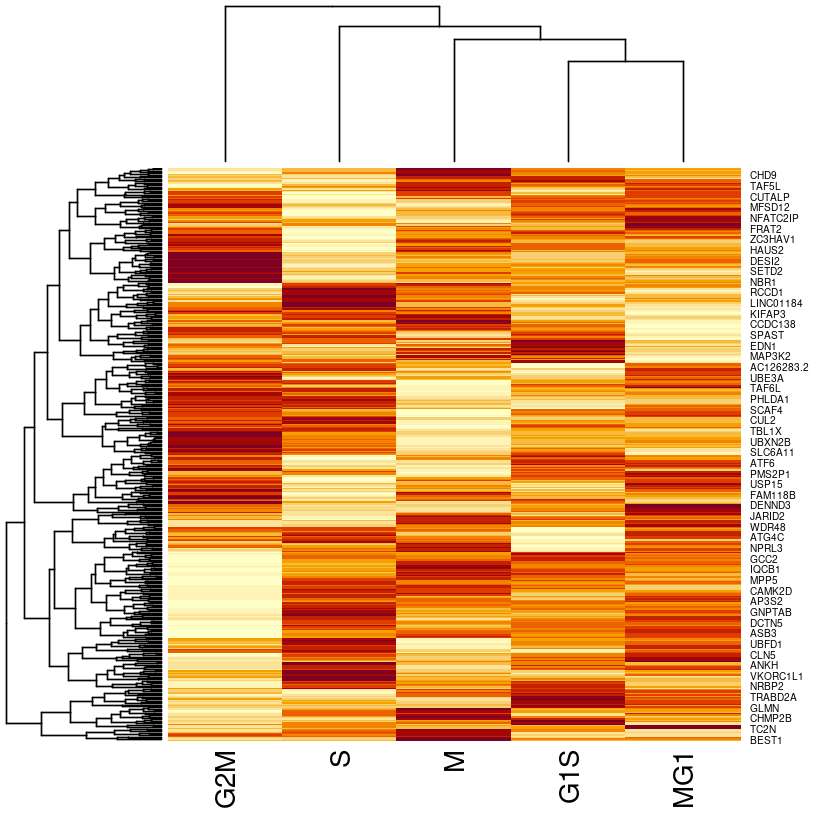

In [2162]:
#dev.off()
#CairoPDF('deltaDPAU_BC/7_6_3_heatmap_BC_cycle.pdf', width=8, height=8)
library(pheatmap)
#grid.newpage()

# plot(c(1,2,3))
# ggplot(diamonds[1:100,], aes(price, x))+geom_point()
heatmap( as.matrix( tmp ), Rowv=F )
#dev.off()

In [2163]:
library(pheatmap)
pheatmap(mtcars)

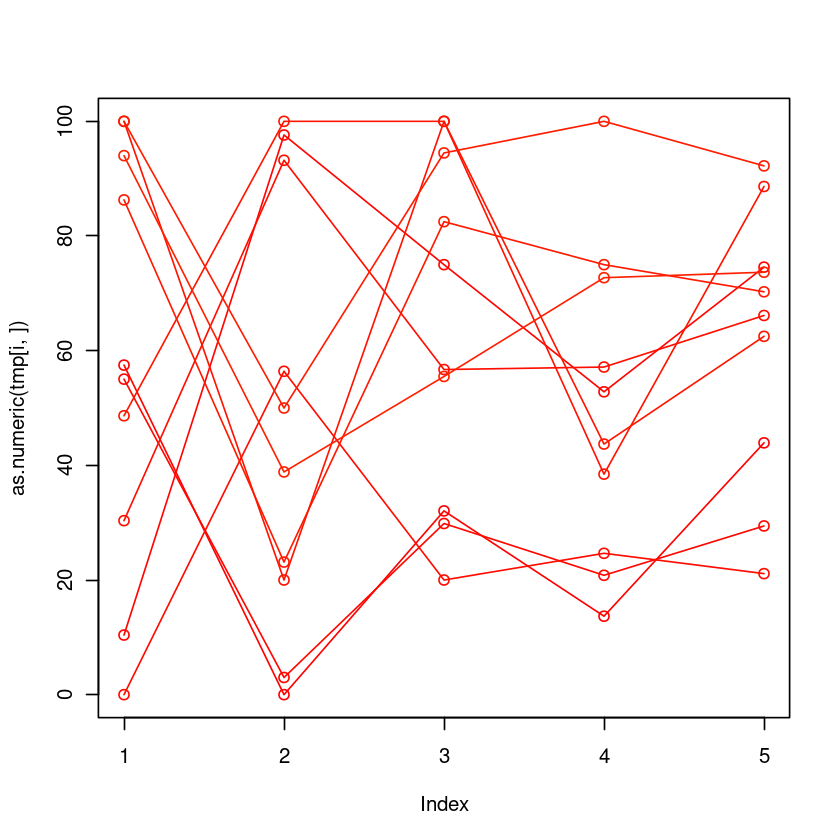

In [2118]:
##
plot(as.numeric(tmp[i,]), type='n', col='red', ylim=c(0,100) )
colors=rainbow(nrow(tmp))
for(i in 1:nrow(tmp)){
    if(i>10)break;
    points(as.numeric(tmp[i,]), type='o', col=colors[i] )
}

In [ ]:
## go on to f3/script/cycle_related_genes_Using_DPAU.R.ipynb

### venn plot of HeLa cycle related genes

In [2164]:
# load all genes
geneList.HeLa=list()
cycles=c('G1S', 'S', 'G2M', 'M', "MG1")
cycles2=c(cycles,cycles)
for(i in 1:length(cycles)){
    fileName=paste0('deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_',cycles2[i],'_vs_',cycles2[i+1],'.txt')
    keyword=paste0(cycles2[i], '_vs_',cycles2[i+1])
    printP(i, keyword, fileName)
    geneList.HeLa[[keyword]]=readLines(fileName)
}
sapply(geneList.HeLa, length) #G1S_vs_S 137 S_vs_G2M 140 G2M_vs_M 125 M_vs_MG1 130 MG1_vs_G1S 128
#geneList.HeLa

[1] "1 G1S_vs_S deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_G1S_vs_S.txt"
[1] "2 S_vs_G2M deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_S_vs_G2M.txt"
[1] "3 G2M_vs_M deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_G2M_vs_M.txt"
[1] "4 M_vs_MG1 deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_M_vs_MG1.txt"
[1] "5 MG1_vs_G1S deltaDPAU_HeLa/deltaDPAU_sigAll_HeLa_MG1_vs_G1S.txt"


G1S_vs_S   S_vs_G2M   G2M_vs_M   M_vs_MG1 MG1_vs_G1S 
       132        114        128        121        137

In [2165]:
## pull all genes
sum(sapply(geneList.HeLa, length)) #632

genesDF.HeLa=data.frame(
    'group'=names(unlist(geneList.HeLa)),
    'genes'=unname(unlist(geneList.HeLa))
)
dim(genesDF.HeLa)
head(genesDF.HeLa)

[1] 632

[1] 632   2

,group,genes
,<fct>,<fct>
1,G1S_vs_S1,ABHD13
2,G1S_vs_S2,AC069288.1
3,G1S_vs_S3,ACOT8
4,G1S_vs_S4,AMFR
5,G1S_vs_S5,ATF5
6,G1S_vs_S6,ATF6


In [2166]:
# uniq genes
genes.HeLa=unique(as.character( genesDF.HeLa$genes) )
length(genes.HeLa) #418
head(genes.HeLa)

[1] 418

[1] "ABHD13"     "AC069288.1" "ACOT8"      "AMFR"       "ATF5"      
[6] "ATF6"

In [2167]:
# Venn plot
cols=RColorBrewer::brewer.pal(n = 5,name = "Set2")
#
library("VennDiagram")
grid.newpage()
n=1800
venn.plot <- venn.diagram(
  x =geneList.HeLa ,
  filename = "deltaDPAU_HeLa/Venn/Cycle_gene_Venn_5set_pretty.png", #dpi=300,
    resolution =200, 
    imagetype = "png", units = "px",height = n, width = n, 
    
  col = "black",
  fill = cols, #c("dodgerblue", "goldenrod1", "darkorange1", "seagreen3", "orchid3"),
  alpha = 0.50,
  cex = c(1.5, 1.5, 1.5, 1.5, 1.5, 1, 0.8, 1, 0.8, 1, 0.8, 1, 0.8,
          1, 0.8, 1, 0.55, 1, 0.55, 1, 0.55, 1, 0.55, 1, 0.55, 1, 1, 1, 1, 1, 1.5),
  cat.col = cols,#c("dodgerblue", "goldenrod1", "darkorange1", "seagreen3", "orchid3"),
  cat.cex = 1.5,
  cat.fontface = "bold",
  margin = 0.3,
    main="Cycle related genes of HeLa at DPAU level"
);

In [2168]:
## psudo - time plot
# change cell id to cell phase
DPAU.HeLa=DPAU[genes.HeLa, cid.HeLa]
dim(DPAU.HeLa) #418 56

DPAU.HeLa[1:5,1:5]

[1] 418  56

,c01ROW24,c01ROW35,c01ROW31,c05ROW02,c05ROW14
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABHD13,NA,NA,NA,NA,NA
AC069288.1,NA,NA,61.90476,NA,NA
ACOT8,NA,100,NA,NA,NA
AMFR,NA,100,NA,0,NA
ATF5,100,NA,100.00000,NA,NA


In [2169]:
## cell cycle time point, mean DPAU, sd DPAU, num
cycles=c('G1S', 'S', 'G2M', 'M', "MG1")
##
timeDPAU.HeLa=NULL;

num=1
for(gene in genes.HeLa){
    #if(num>20){break;}
    
    tmp_DF=NULL;
    for(cycle in cycles){
        num=num+1
        #if(num>20){break;}
        #
        cid.tmp=rownames(cellInfo[which( substr(cellInfo$cellType,1,2)=="He" & cellInfo$cellCycle==cycle ), ] )
        #printP(cycle, length(cid.tmp), head(cid.tmp, n=3))
        DPAU.tmp=DPAU[gene, cid.tmp]
        DPAU.tmp=DPAU.tmp[,!is.na(DPAU.tmp)]
        DPAU.tmp=as.numeric(DPAU.tmp)
        #
        tmp=data.frame(
            'a'=mean(DPAU.tmp),
            'b'=sd(DPAU.tmp),
            'c'=length(DPAU.tmp)
        );

        
        colnames(tmp)=paste0(cycle, c('_mean', '_sd', '_n') )
        #
        if(is.null(tmp_DF)){tmp_DF=tmp}else{
            tmp_DF=cbind(tmp_DF, tmp );
        }        
    }
    tmp_DF$gene=gene;
    timeDPAU.HeLa=rbind(timeDPAU.HeLa, tmp_DF)
}
##
rownames(timeDPAU.HeLa)=timeDPAU.HeLa$gene
dim(timeDPAU.HeLa) #430 16
head(timeDPAU.HeLa)

[1] 418  16

,G1S_mean,G1S_sd,G1S_n,S_mean,S_sd,S_n,G2M_mean,G2M_sd,G2M_n,M_mean,M_sd,M_n,MG1_mean,MG1_sd,MG1_n,gene
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>
ABHD13,66.66667,57.73503,3,2.222222,NA,1,NaN,NA,0,NaN,NA,0,98.07692,2.719641,2,ABHD13
AC069288.1,0.00000,NA,1,65.476190,47.20054,4,41.66667,58.92557,2,66.66667,57.73503,3,53.30893,44.943549,5,AC069288.1
ACOT8,0.00000,NA,1,100.000000,0.00000,4,100.00000,NA,1,96.17486,5.40956,2,NaN,NA,0,ACOT8
AMFR,69.04762,53.61110,3,0.000000,NA,1,84.61538,21.75713,2,91.17647,12.47835,2,100.00000,NA,1,AMFR
ATF5,0.00000,0.00000,2,100.000000,0.00000,2,100.00000,NA,1,NaN,NA,0,0.00000,NA,1,ATF5
ATF6,0.00000,NA,1,59.883721,49.05360,4,100.00000,0.00000,4,NaN,NA,0,NaN,NA,0,ATF6


In [2170]:
write.table(timeDPAU.HeLa, "deltaDPAU_HeLa/timeDPAU.HeLa.mean.sd.n.txt", quote = F)

In [ ]:
## go on to : f3/script/cycle_related_genes_Using_DPAU.R.ipynb

# step6 cell DPAU, and UMAP plot(use DPAU, DPAU2, respectively)

[1] 2082  225

,c01ROW07,c01ROW12,c01ROW24,c01ROW31,c01ROW35
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AARD,NA,NA,NA,NA,NA
AARS,46.71053,0,NA,50,100
AASDHPPT,NA,NA,100,100,NA
AATF,100.00000,100,NA,100,100
ABCB7,0.00000,100,NA,100,100


[1] 15138.35


[1] 225   2

,cell,DPAU
,<fct>,<dbl>
c01ROW07,c01ROW07,67.49290
c01ROW12,c01ROW12,65.97089
c01ROW24,c01ROW24,66.59947
c01ROW31,c01ROW31,65.99750


[1] 14020.41


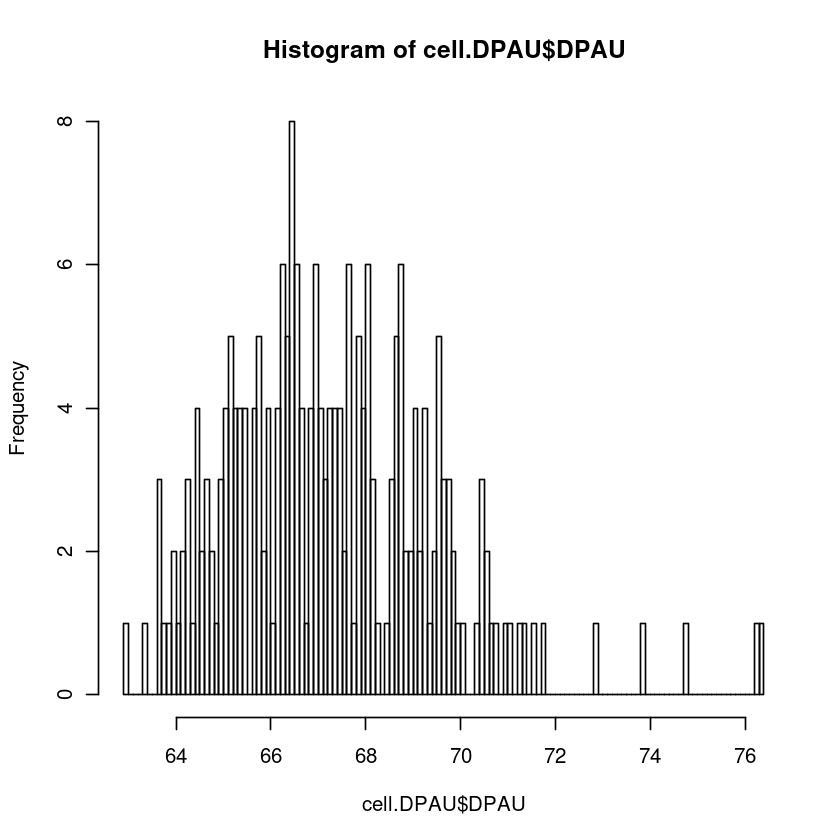

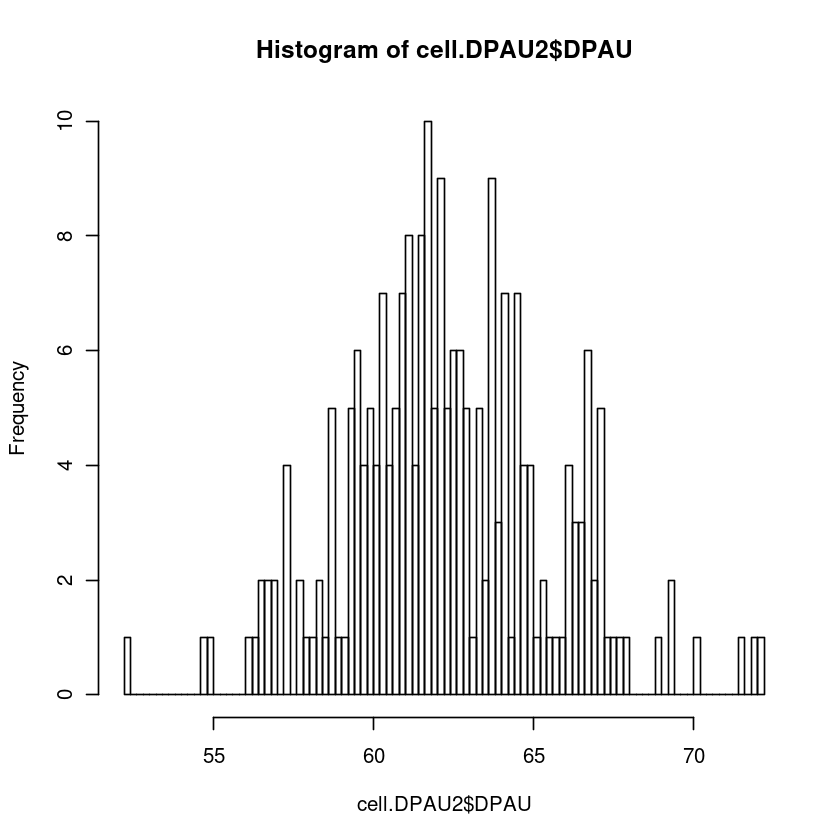

In [1490]:
#########################
# step6 cell DPAU, and UMAP plot(use DPAU, DPAU2, respectively)
getGeoMean=function(c1){
  exp(mean(log(c1)))
}

# c1=c(1,100,1000)
# (1*100*1000)**(1/3) #21
# getGeoMean(c1)
dim(DPAU)
DPAU[1:5,1:5]
#
###
getCellDPAU=function(DPAU_){
  cell.DPAU=NULL;
  for(i in 1:ncol(DPAU_)){
    #if(i>10){break;}
    cell=colnames(DPAU_)[i]
    #
    #print( paste(i, cell) )
    #
    tmp=as.numeric( DPAU_[,i])
    tmp=tmp[!is.na(tmp)]
    #
    tmpDF=data.frame(
      cell=cell,
      DPAU=mean(tmp)
    )
    cell.DPAU=rbind(cell.DPAU, tmpDF)
  }
  row.names(cell.DPAU)=cell.DPAU$cell
  print( sum(cell.DPAU$DPAU) )
  cell.DPAU
}
cell.DPAU=getCellDPAU(DPAU)
dim(cell.DPAU) #225 2
cell.DPAU[1:4,]
#             cell     DPAU
#c01ROW07 c01ROW07 67.49290
#c01ROW12 c01ROW12 65.97089
#c01ROW24 c01ROW24 66.59947
#
hist( cell.DPAU$DPAU, n=100)

#
cell.DPAU2=getCellDPAU(DPAU2)
hist( cell.DPAU2$DPAU, n=100)

[1] 8562.847


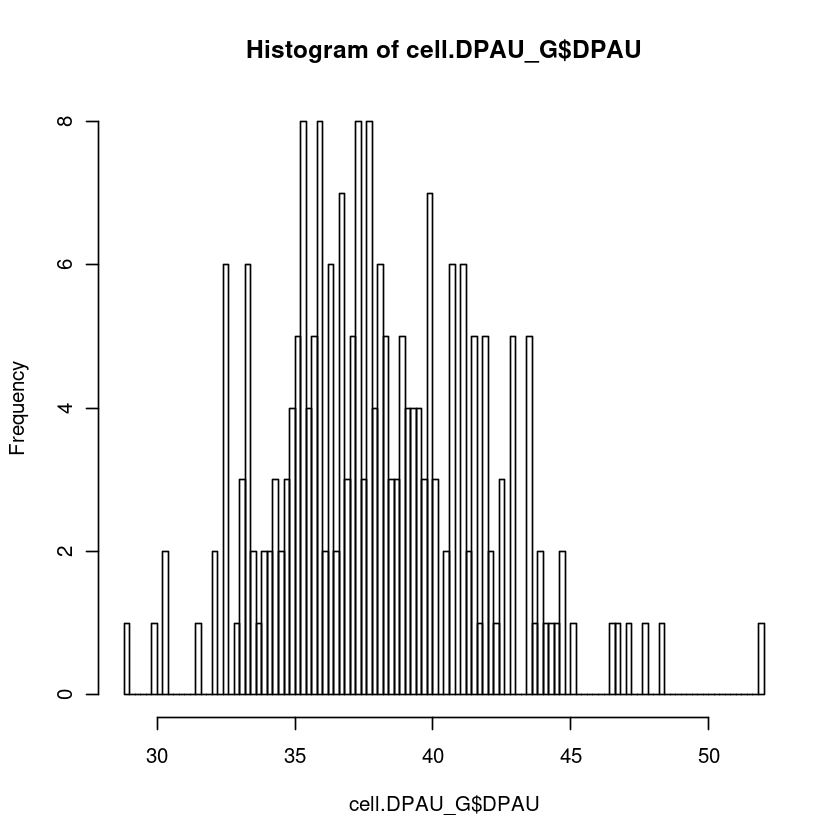

In [1491]:

###### geometry mean
getCellDPAU_Geo=function(DPAU_){
  cell.DPAU=NULL;
  for(i in 1:ncol(DPAU_)){
    #if(i>10){break;}
    cell=colnames(DPAU_)[i]
    #
    #print( paste(i, cell) )
    #
    tmp=as.numeric( DPAU_[,i])
    tmp=tmp[!is.na(tmp)]
    #
    tmpDF=data.frame(
      cell=cell,
      DPAU=getGeoMean(tmp)
    )
    cell.DPAU=rbind(cell.DPAU, tmpDF)
  }
  row.names(cell.DPAU)=cell.DPAU$cell
  print( sum(cell.DPAU$DPAU) )
  cell.DPAU
}
cell.DPAU_G=getCellDPAU_Geo(DPAU2) #几何平均数
hist( cell.DPAU_G$DPAU, n=100)

## load RNA umap data

An object of class Seurat 
18710 features across 225 samples within 1 assay 
Active assay: RNA (18710 features, 2000 variable features)
 3 dimensional reductions calculated: pca, tsne, umap

[1] 225   5

,UMAP_1,UMAP_2,cellDPAU,cellDPAU2,cellDPAU_G
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
c01ROW24,-13.97923,-9.320040,66.59947,59.45179,39.64110
c01ROW35,-13.12374,-9.647214,67.32529,56.12805,36.25607
c01ROW31,-13.69787,-9.056423,65.99750,61.49633,39.11580
c05ROW02,-13.54253,-9.008598,68.77569,54.99496,35.30621
c05ROW14,-13.08300,-9.259015,66.90040,60.54194,42.25644
c05ROW19,-13.27679,-8.568695,70.51782,56.62638,41.42888


'data.frame':	225 obs. of  5 variables:
 $ UMAP_1    : num  -14 -13.1 -13.7 -13.5 -13.1 ...
 $ UMAP_2    : num  -9.32 -9.65 -9.06 -9.01 -9.26 ...
 $ cellDPAU  : num  66.6 67.3 66 68.8 66.9 ...
 $ cellDPAU2 : num  59.5 56.1 61.5 55 60.5 ...
 $ cellDPAU_G: num  39.6 36.3 39.1 35.3 42.3 ...


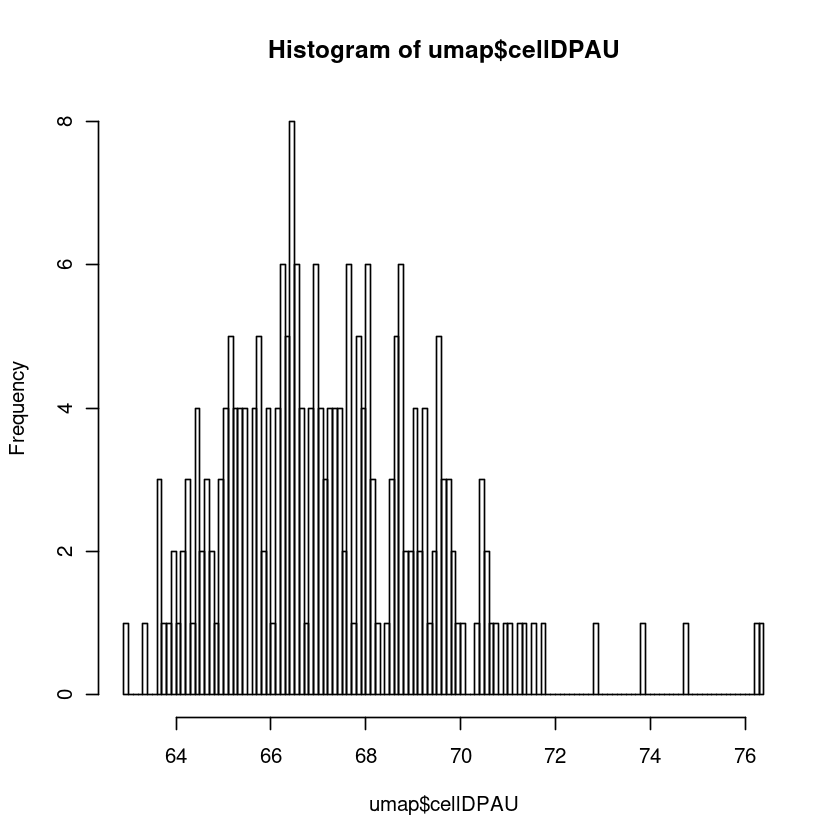

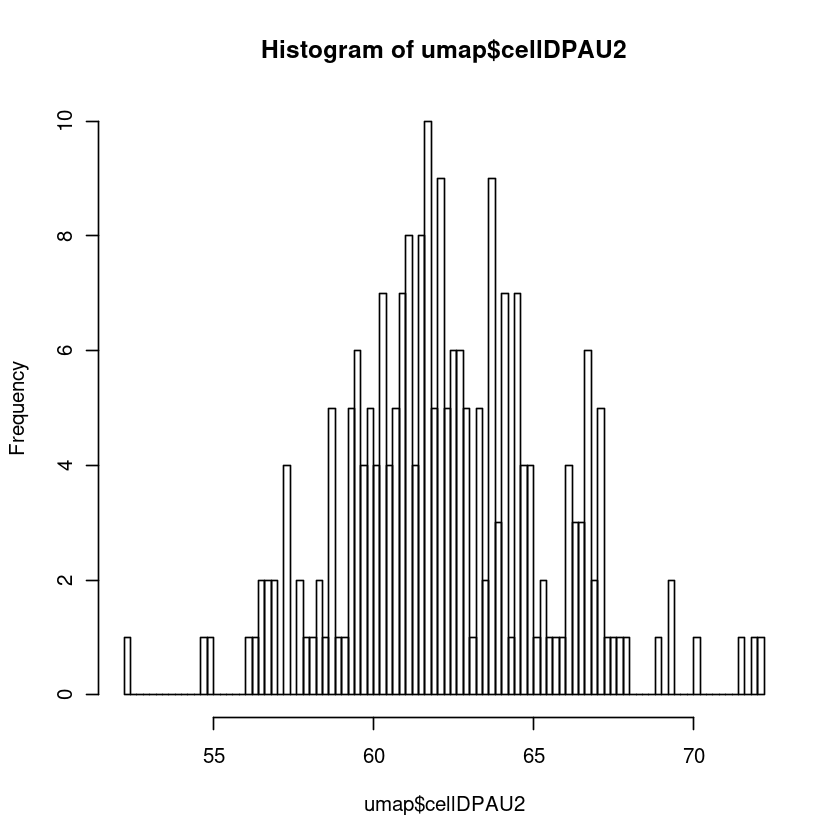

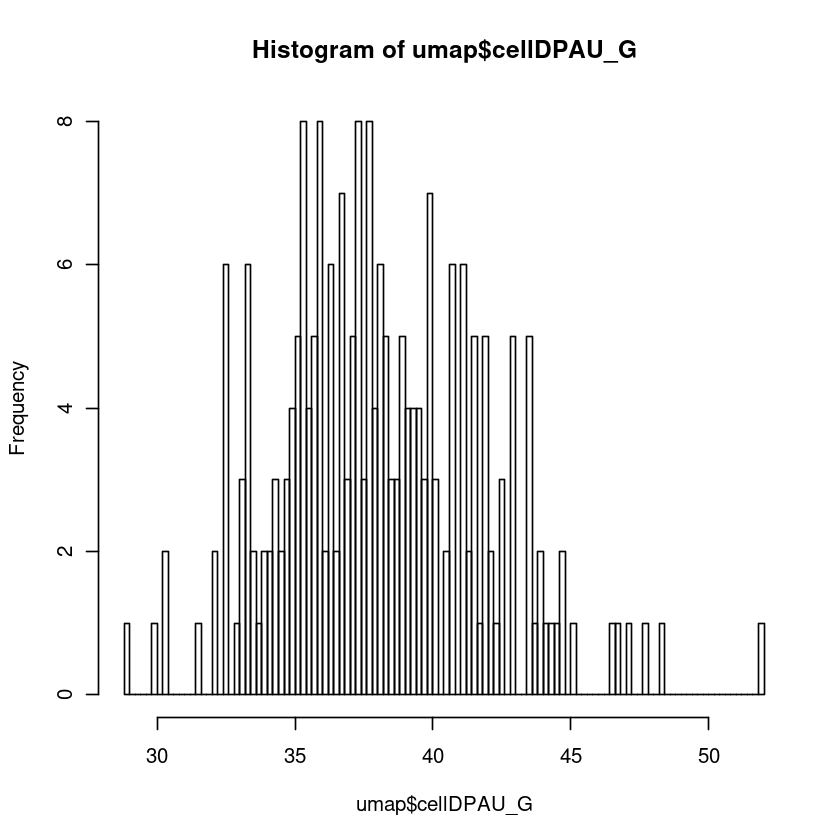

In [1492]:
#load RNA umap data
rnaUmap=readRDS("/home/wangjl/data/apa/191111Figure/f3/RNA/BC_HeLa.225cells_umap_tSNE-pbmc11_version4.rds")
rnaUmap #18710 features across 225 samples within 1 assay 
#
umap=rnaUmap@reductions$umap@cell.embeddings
umap=as.data.frame(umap)
umap$cellDPAU = cell.DPAU[rownames(umap), 'DPAU']
umap$cellDPAU2 = cell.DPAU2[rownames(umap), 'DPAU']
umap$cellDPAU_G = cell.DPAU_G[rownames(umap), 'DPAU']


dim(umap) #225 5
head(umap)

str(umap)
hist(umap$cellDPAU, n=100)
hist(umap$cellDPAU2, n=100)
hist(umap$cellDPAU_G, n=100)

In [1493]:
# umap cluster number
clusterInfo=rnaUmap@active.ident
getDFfromNamed=function(Namedxx){
  data.frame(
    id=attr(Namedxx,'names'),
    val=unname(Namedxx),
    row.names = 1
  )
}
clusterNum=getDFfromNamed(clusterInfo)
dim(clusterNum)
head(clusterNum)

[1] 225   1

,val
,<fct>
c01ROW24,2
c01ROW35,2
c01ROW31,2
c05ROW02,2
c05ROW14,2
c05ROW19,2


In [1494]:
umap$cluster=clusterNum[rownames(umap), 'val']

head(umap)

,UMAP_1,UMAP_2,cellDPAU,cellDPAU2,cellDPAU_G,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
c01ROW24,-13.97923,-9.320040,66.59947,59.45179,39.64110,2
c01ROW35,-13.12374,-9.647214,67.32529,56.12805,36.25607,2
c01ROW31,-13.69787,-9.056423,65.99750,61.49633,39.11580,2
c05ROW02,-13.54253,-9.008598,68.77569,54.99496,35.30621,2
c05ROW14,-13.08300,-9.259015,66.90040,60.54194,42.25644,2
c05ROW19,-13.27679,-8.568695,70.51782,56.62638,41.42888,2


In [1495]:
#head(umap)
#umpa0=umap
umap$cluster2="HeLa"
umap[which(umap$cluster %in% c(0,1)),'cluster2']="BC"
table(umap$cluster2)
str(umap$cluster2)

#
#myPalette <- colorRampPalette(rev(brewer.pal(11, "Spectral"))) #也挺漂亮的配色
myPalette <- colorRampPalette( c('navy', 'white', 'firebrick3') )


  BC HeLa 
 169   56 

 chr [1:225] "HeLa" "HeLa" "HeLa" "HeLa" "HeLa" "HeLa" "HeLa" "HeLa" "HeLa" ...


png 
  2

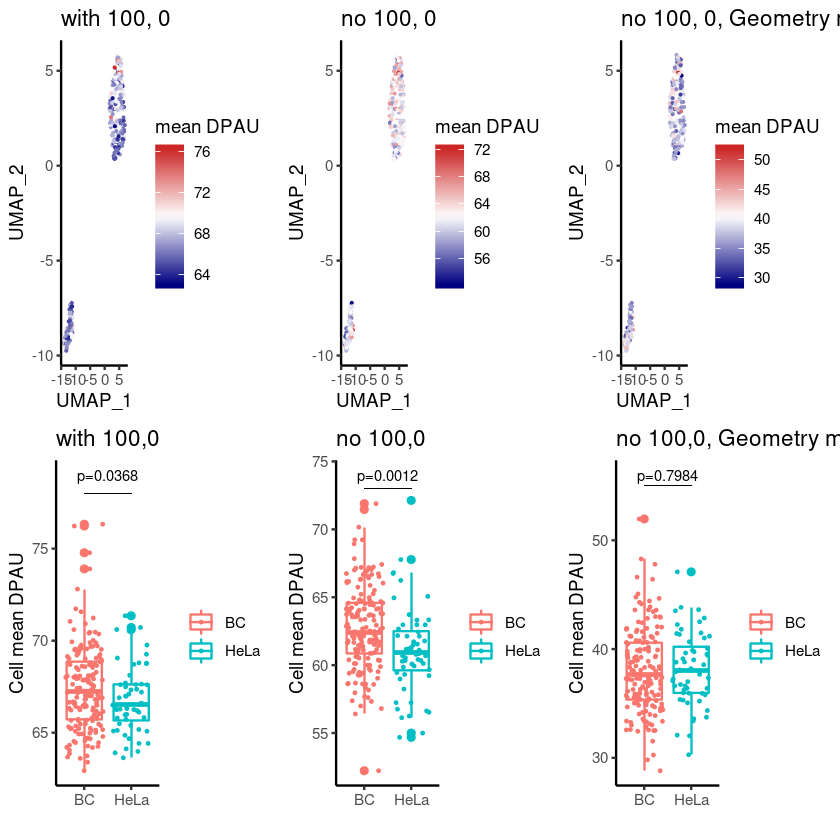

In [1496]:
#
g1=ggplot(umap, aes(UMAP_1, UMAP_2, col= cellDPAU ))+
  geom_point(size=0.1)+
  #guides(color=guide_legend(title="mean DPAU")) +
  #scale_color_gradient2(low="blue", mid='white',  high="red", midpoint =70  )+
  scale_colour_gradientn('mean DPAU', colours = myPalette(100))+
  theme_classic()+labs(title="with 100, 0")
g2=ggplot(umap, aes(UMAP_1, UMAP_2, col= cellDPAU2 ))+
  geom_point(size=0.1)+
  #guides(color=guide_legend(title="mean DPAU")) +
  #scale_color_gradient2(low="blue", mid='white',  high="red", midpoint =70  )+
  scale_colour_gradientn('mean DPAU', colours = myPalette(100))+
  theme_classic()+labs(title="no 100, 0")
g3=ggplot(umap, aes(UMAP_1, UMAP_2, col= cellDPAU_G ))+
  geom_point(size=0.1)+
  #guides(color=guide_legend(title="mean DPAU")) +
  #scale_color_gradient2(low="blue", mid='white',  high="red", midpoint =70  )+
  scale_colour_gradientn('mean DPAU', colours = myPalette(100))+
  theme_classic()+labs(title="no 100, 0, Geometry mean")

#head(umap)
# add p value
getPvalueBy=function(colName){
  t1=t.test(umap[which(umap$cluster2=="HeLa"),colName], umap[which(umap$cluster2=="BC"),colName] )
  p=t1$p.value
  #formatC(p, format = "e", digits = 2)
  round(p,4)
}
p1=getPvalueBy('cellDPAU') ##0.036
p2=getPvalueBy('cellDPAU2') #0.001
p3=getPvalueBy('cellDPAU_G') #0.7984

#
g4=ggplot(umap, aes(cluster2, cellDPAU, color=cluster2 ))+
  geom_boxplot()+geom_jitter(size=0.3)+
  labs(title="with 100,0",x="", y="Cell mean DPAU")+
  theme_classic()+scale_colour_discrete("")+
  geom_segment(aes(x=1, y=78, xend=2, yend=78),size=0.1,color='black')+ #横线
  annotate("text", x=1.5, y=79, label=paste0("p=",p1), size=3)#annotate函数也可以添加标签

g5=ggplot(umap, aes(cluster2, cellDPAU2, color=cluster2 ))+
  geom_boxplot()+geom_jitter(size=0.3)+
  labs(title="no 100,0",x="", y="Cell mean DPAU")+
  theme_classic()+scale_colour_discrete("")+
  geom_segment(aes(x=1, y=73, xend=2, yend=73),size=0.1,color='black')+ #横线
  annotate("text", x=1.5, y=74, label=paste0("p=",p2), size=3)

g6=ggplot(umap, aes(cluster2, cellDPAU_G, color=cluster2 ))+
  geom_boxplot()+geom_jitter(size=0.3)+
  labs(title="no 100,0, Geometry mean",x="", y="Cell mean DPAU")+
  theme_classic()+scale_colour_discrete("")+
  geom_segment(aes(x=1, y=55, xend=2, yend=55),size=0.1,color='black')+ #横线
  annotate("text", x=1.5, y=56, label=paste0("p=",p3), size=3)

library(gridExtra)
CairoPDF(file="8_1-UMAPPlot-cellDPAU_CellType.pdf",width=10,height=5)
grid.arrange(g1,g2,g3,g4,g5,g6,nrow=2)
dev.off()

In [1497]:
####
head(umap)
# VAR of BC,HeLa
getVarBy=function(colName){
  v1=var( umap[which(umap$cluster2=="HeLa"),colName])
  v2=var( umap[which(umap$cluster2=="BC"),colName])
  return( c(v1,v2) )
}
# var within HeLa, BC
getVarBy('cellDPAU') #3.299199 5.374311
getVarBy('cellDPAU2') #10.406484  9.492168
getVarBy('cellDPAU_G') #10.99189 14.37434
#

write.table(umap, '8_1_umap_cellPDAU.txt')

,UMAP_1,UMAP_2,cellDPAU,cellDPAU2,cellDPAU_G,cluster,cluster2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
c01ROW24,-13.97923,-9.320040,66.59947,59.45179,39.64110,2,HeLa
c01ROW35,-13.12374,-9.647214,67.32529,56.12805,36.25607,2,HeLa
c01ROW31,-13.69787,-9.056423,65.99750,61.49633,39.11580,2,HeLa
c05ROW02,-13.54253,-9.008598,68.77569,54.99496,35.30621,2,HeLa
c05ROW14,-13.08300,-9.259015,66.90040,60.54194,42.25644,2,HeLa
c05ROW19,-13.27679,-8.568695,70.51782,56.62638,41.42888,2,HeLa


[1] 3.299199 5.374311

[1] 10.406484  9.492168

[1] 10.99189 14.37434

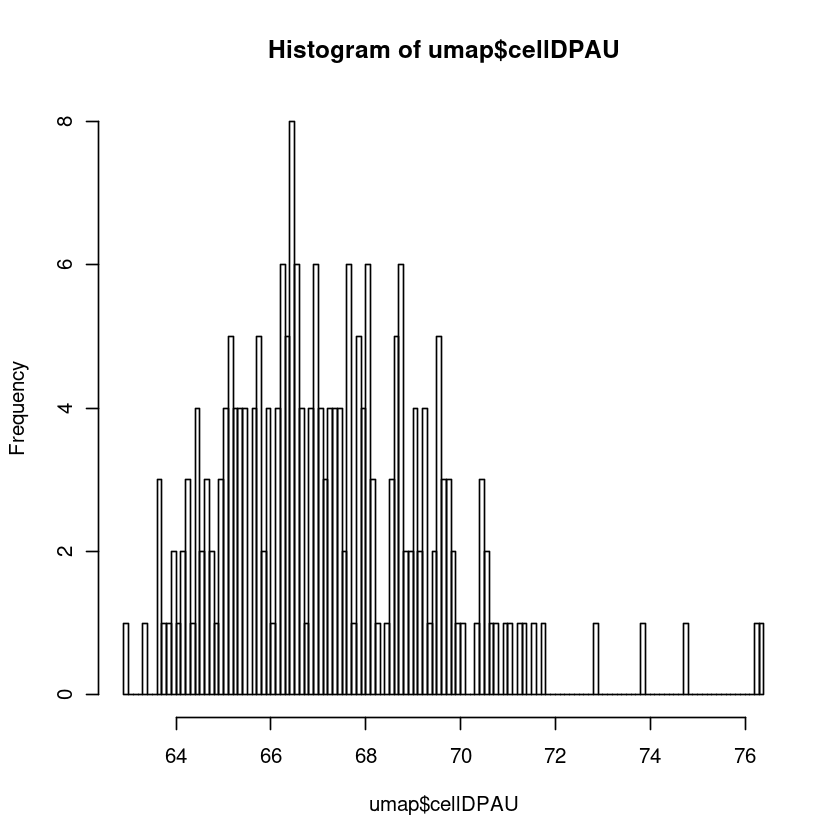

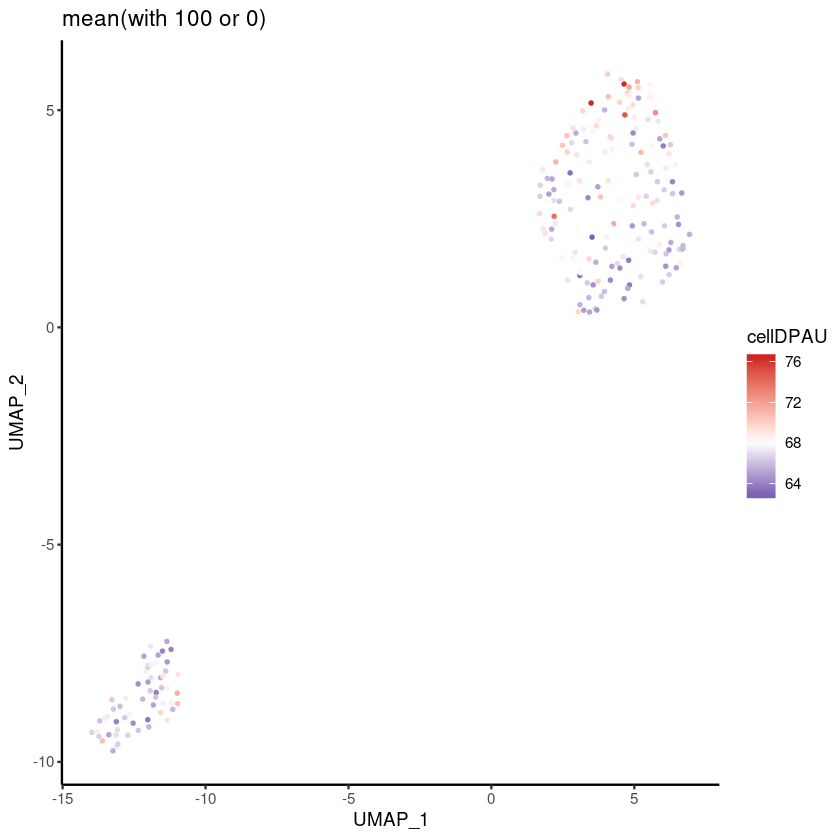

In [1499]:
hist(umap$cellDPAU, n=100)

ggplot(umap, aes(UMAP_1, UMAP_2, col= cellDPAU ))+
  geom_point(size=0.5)+
  #guides(color=guide_legend(title="mean DPAU")) +
  scale_color_gradient2(low="navy", mid='white',  high="firebrick3", midpoint =68  )+
  #scale_colour_gradientn('mean DPAU', colours = myPalette(100))+
  theme_classic()+labs(title="mean(with 100 or 0)")

# step7 boxplot of cluster / cell type to cellDPAU

In [1]:
levels(cellInfo$cellCycle)

ERROR: Error in levels(cellInfo$cellCycle): object 'cellInfo' not found


[1] 225   6

,geneNumber,countsPerCell,countsPerGene,cellType,cellCycle,cellType2
,<int>,<int>,<dbl>,<fct>,<fct>,<fct>
c01ROW24,5693,1950601,342.6315,HeLa_sync,G2M,HeLa_syncMix
c01ROW35,6768,3048970,450.4979,HeLa_sync,M,HeLa_syncMix
c01ROW31,6542,2783703,425.5125,HeLa_sync,S,HeLa_syncMix
c05ROW02,6012,1263249,210.1213,HeLa_sync,S,HeLa_syncMix
c05ROW14,5853,1313664,224.4428,HeLa_sync,S,HeLa_syncMix
c05ROW19,4372,493417,112.8584,HeLa_sync,S,HeLa_syncMix


,UMAP_1,UMAP_2,cellDPAU,cellDPAU2,cellDPAU_G,cluster,cluster2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
c01ROW24,-13.97923,-9.320040,66.59947,59.45179,39.64110,2,HeLa
c01ROW35,-13.12374,-9.647214,67.32529,56.12805,36.25607,2,HeLa
c01ROW31,-13.69787,-9.056423,65.99750,61.49633,39.11580,2,HeLa
c05ROW02,-13.54253,-9.008598,68.77569,54.99496,35.30621,2,HeLa
c05ROW14,-13.08300,-9.259015,66.90040,60.54194,42.25644,2,HeLa
c05ROW19,-13.27679,-8.568695,70.51782,56.62638,41.42888,2,HeLa


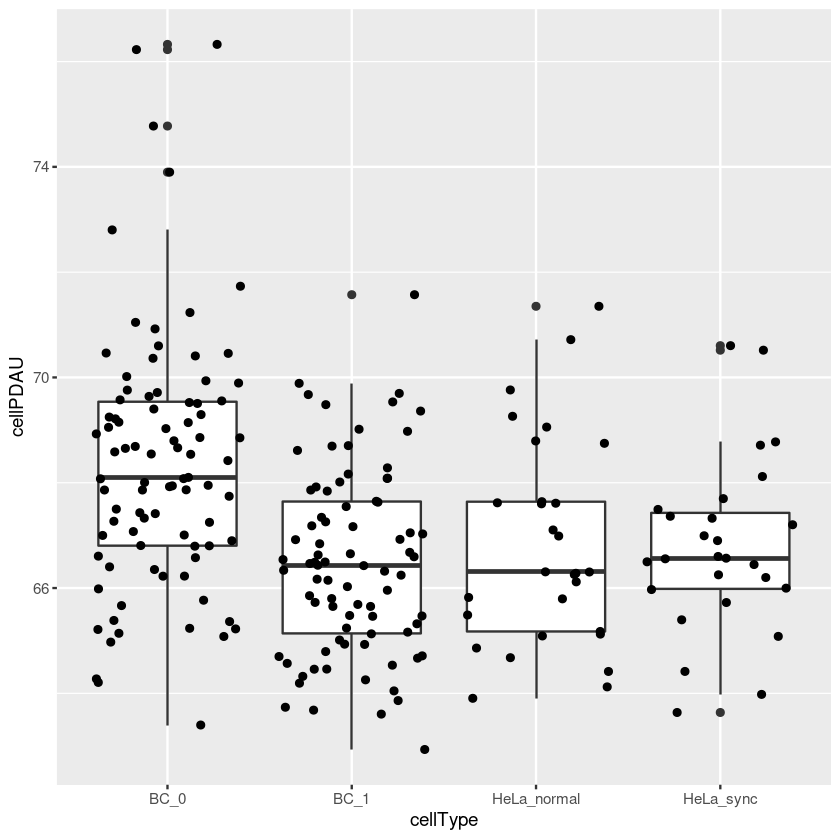

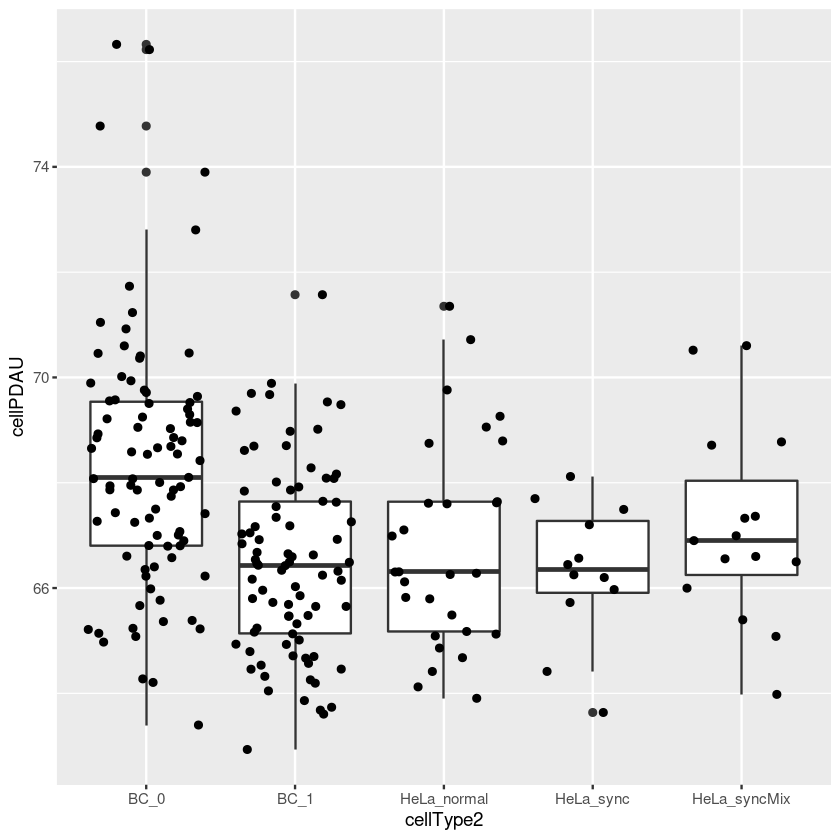

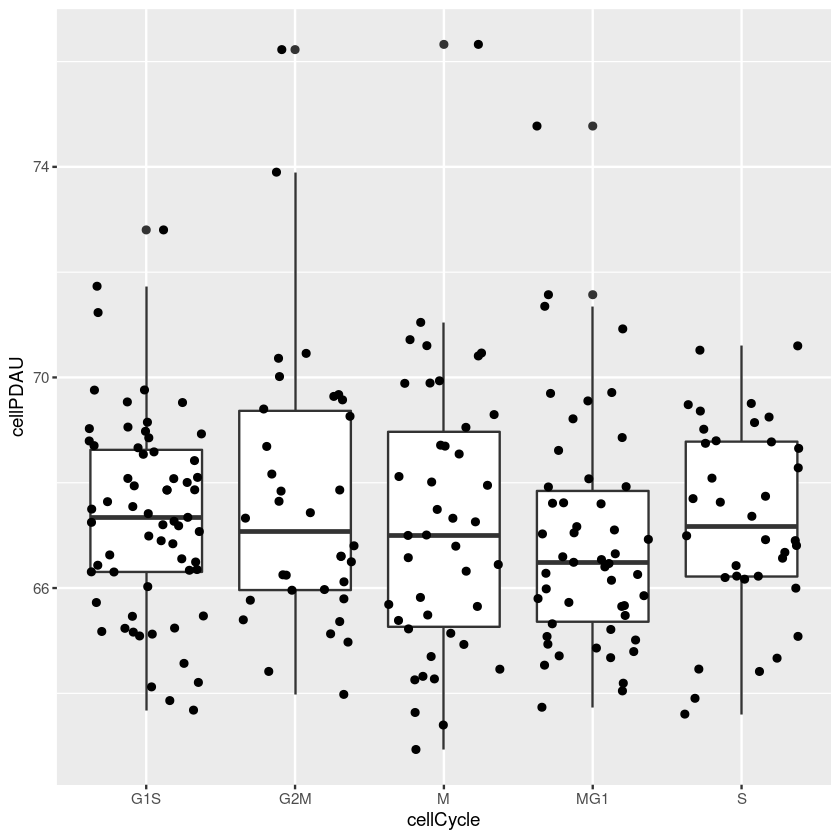

In [1502]:
#########################
# step7 boxplot of cluster / cell type to cellDPAU
cellFile="/home/wangjl/data/apa/190530Mix/cellInfo.V4.txt"
cellInfo=read.csv(cellFile, row.names = 1)
dim(cellInfo) #225 6
head(cellInfo)
#
cellInfo=cellInfo[row.names(umap),]
head(umap)
cellInfo$cellPDAU=umap$cellDPAU

ggplot(cellInfo, aes(cellType, cellPDAU))+  geom_boxplot()+geom_jitter()
ggplot(cellInfo, aes(cellType2, cellPDAU))+  geom_boxplot()+geom_jitter()
ggplot(cellInfo, aes(cellCycle, cellPDAU))+  geom_boxplot()+geom_jitter()


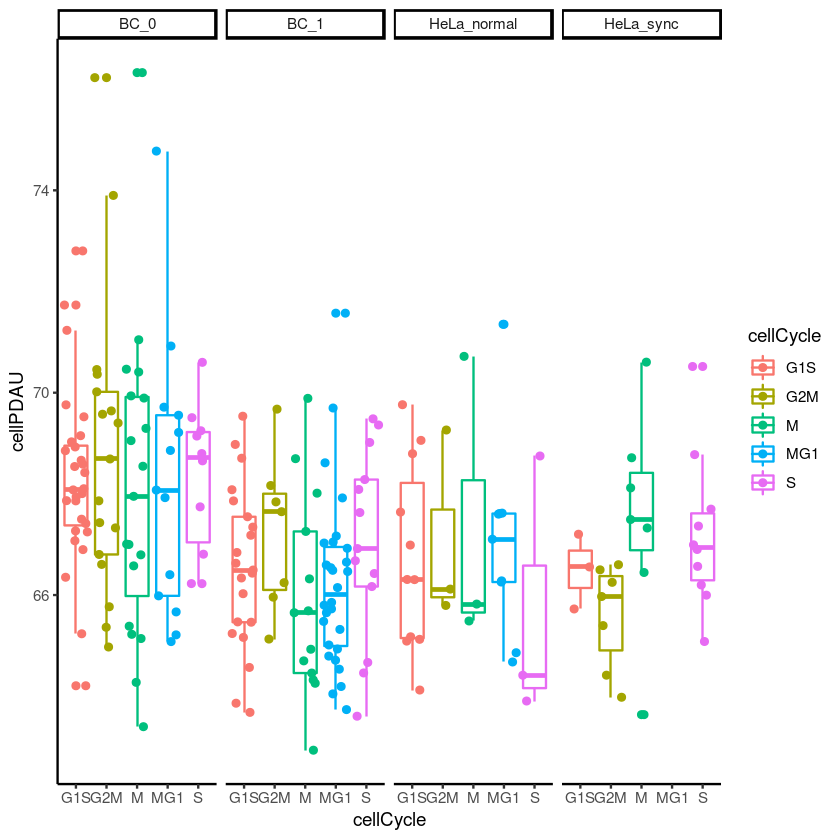

In [1506]:
ggplot(cellInfo, aes(cellCycle, cellPDAU, color=cellCycle))+  
    geom_boxplot()+geom_jitter()+
    facet_wrap(cellType~., nrow=1)+
    theme_classic()